This code
1. Loads the cancer dataset, available at: https://hastie.su.domains/ElemStatLearn/datasets/prostate.data
2. Standardizes the training data (not the targets)
3. Transforms the testing data in the same manner by using the means and standard deviations of the training data
4. Performs Ordinary Least Squares on training data
5. Starts applying an L1 penalty
6. Gets the lowest test error over all lambda
7. Plots the coefficient paths

In [1]:
import torch
torch.manual_seed(0)
import numpy as np
import matplotlib.pyplot as plt


import pandas as pd
# reading csv files
data =  pd.read_csv('prostate.data', sep="	")


n=97 observations, 67 training, 30 test
p=8 predictors
y = lpsa (response) 96 * 1 
X = 96 * 8
beta = 8 * 1 (coefficients)
y = X * beta

Data needs to be split. Normalize and standardize (columns) using the training data only, extend the stored parameters to normalize and standardize the test data too

In [2]:
# Convert data to doubles
data_cols = ['age', 'gleason', 'lbph', 'lcavol', 'lcp','lweight', 'pgg45', 'svi']
data[data_cols] = data[data_cols].astype('double', copy=True, errors='raise')

grouped = data.groupby(data.train)
pan_train_data = grouped.get_group("T")
pan_test_data = grouped.get_group("F")


# The data needs to be normalized
means = pan_train_data[data_cols].mean()
variances = pan_train_data[data_cols].std(ddof=0)

pan_train_data[data_cols] = (pan_train_data[data_cols]-means)/variances
pan_test_data[data_cols] = (pan_test_data[data_cols]-means)/variances



/var/folders/y3/t7nmdh795s52pz2bygv2tzj00000gn/T/ipykernel_24394/1560018052.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pan_train_data[data_cols] = (pan_train_data[data_cols]-means)/variances
/var/folders/y3/t7nmdh795s52pz2bygv2tzj00000gn/T/ipykernel_24394/1560018052.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pan_test_data[data_cols] = (pan_test_data[data_cols]-means)/variances


In [3]:
X_train = pan_train_data[['lcavol','lweight','age','lbph','svi','lcp','gleason','pgg45']]
y_train = pan_train_data[['lpsa']]

X_test = pan_test_data[['lcavol','lweight','age','lbph','svi','lcp','gleason','pgg45']]
y_test = pan_test_data[['lpsa']]


In [4]:
train_data = []
for i in range(len(X_train)):
    train_data.append([X_train.iloc[i].to_numpy(),y_train.iloc[i].to_numpy()])

test_data = []
for i in range(len(X_test)):
    test_data.append([X_test.iloc[i].to_numpy(),y_test.iloc[i].to_numpy()])
    


In [5]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=len(train_data))
test_loader = torch.utils.data.DataLoader(test_data, batch_size=len(test_data))

Now we can define the linear model we want to train (without bias)

In [6]:
class linearRegression(torch.nn.Module):
    def __init__(self, inputSize, outputSize):
        super(linearRegression, self).__init__()
        self.linear = torch.nn.Linear(inputSize, outputSize,bias=False)

    def forward(self, x):
        out = self.linear(x)
        return out

inputDim = len(train_data[0][0])        # takes variable 'x' 
outputDim = len(train_data[0][1])       # takes variable 'y'
learningRate = 0.1 
epochs = 500

model = linearRegression(inputDim, outputDim)
model = model.double()

train_loss = []
test_loss = []

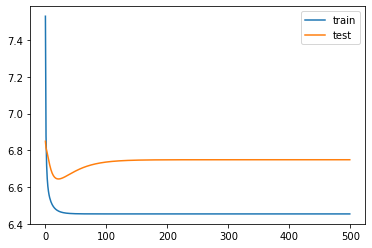

In [7]:
inputDim = len(train_data[0][0])        # takes variable 'x' 
outputDim = len(train_data[0][1])       # takes variable 'y'
learningRate = 0.1 
epochs = 500

model = linearRegression(inputDim, outputDim)
model = model.double()

train_loss = []
test_loss = []

loss_fn = torch.nn.MSELoss(reduction='mean') 
optimizer = torch.optim.SGD(model.parameters(), lr=learningRate)

def train_loop(train_loader, model, loss_fn, optimizer, train_loss):
    size = len(train_loader.dataset)
    for batch, (X,y) in enumerate(train_loader):
        pred = model(X)
        loss = loss_fn(pred,y)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    loss = loss.item()
    train_loss.append(loss)

            
def test_loop(train_loader, model, loss_fn, test_loss):
    size = len(test_loader.dataset)
    num_batches = len(test_loader)
    t_loss = 0
    
    with torch.no_grad():
        for X,y in test_loader:
            pred = model(X)
            t_loss += loss_fn(pred,y).item()
    
    t_loss /= num_batches
    test_loss.append([t_loss])



for t in range(epochs):
    train_loop(train_loader, model, loss_fn, optimizer,train_loss)
    test_loop(test_loader, model, loss_fn, test_loss)


plt.plot([x for x in range(len(train_loss))],train_loss,label='train')
plt.plot([x for x in range(len(test_loss))],test_loss,label='test')
plt.legend()


train_loss = []
test_loss = []

In [8]:
def train_loop(train_loader, model, loss_fn, optimizer, train_loss, penalty):
    size = len(train_loader.dataset)
    for batch, (X,y) in enumerate(train_loader):
        pred = model(X)
        loss = loss_fn(pred,y)
        
        training_error = loss.item()
        
        l2_norm = sum(p.pow(2.0).sum() for p in model.parameters())
        l1_norm = sum(p.abs().sum() for p in model.parameters())

 
#         loss = loss + penalty * l2_norm + l1_norm / l2_norm   # This is generalized LASSO++
        loss = loss + penalty * l1_norm / l2_norm

        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    loss = training_error
    print(f"Training loss: {loss:>7f}")
    train_loss.append(loss)

            
def test_loop(train_loader, model, loss_fn, test_loss):
    size = len(test_loader.dataset)
    num_batches = len(test_loader)
    t_loss = 0
    
    with torch.no_grad():
        for X,y in test_loader:
            pred = model(X)
            t_loss += loss_fn(pred,y).item()
    
    t_loss /= num_batches
    print(f"Test loss: {t_loss:>8f}\n")
    test_loss.append([t_loss])



We want to:
Track the final training,testing loss after fully fitting

Track the parameters after full training


In [9]:
epochs = 1000
learningRate = 0.002
optimizer = torch.optim.SGD(model.parameters(), lr=learningRate)


interval_start = -2
interval_end = 1


penalty = 0


penalty_intervals = 100

train_path = []
test_path = []
weight_path = []


for penalty_index, penalty in enumerate(np.logspace(interval_start, interval_end, num=penalty_intervals)):
    for t in range(epochs):
        print(f"Epoch {t+1}\n-------------------------------")
        train_loop(train_loader, model, loss_fn, optimizer,train_loss, penalty)
        test_loop(test_loader, model, loss_fn, test_loss)
    print(f"Done with {np.log10(penalty)}\n")
    train_path.append(train_loss[-1])
    test_path.append(test_loss[-1])
    weight_path.append(np.array([param for param in model.parameters()][0][0].detach()))

print('Done!')

Epoch 1
-------------------------------
Training loss: 6.453196
Test loss: 6.748610

Epoch 2
-------------------------------
Training loss: 6.453196
Test loss: 6.748590

Epoch 3
-------------------------------
Training loss: 6.453196
Test loss: 6.748569

Epoch 4
-------------------------------
Training loss: 6.453196
Test loss: 6.748549

Epoch 5
-------------------------------
Training loss: 6.453196
Test loss: 6.748529

Epoch 6
-------------------------------
Training loss: 6.453196
Test loss: 6.748509

Epoch 7
-------------------------------
Training loss: 6.453196
Test loss: 6.748488

Epoch 8
-------------------------------
Training loss: 6.453196
Test loss: 6.748468

Epoch 9
-------------------------------
Training loss: 6.453197
Test loss: 6.748448

Epoch 10
-------------------------------
Training loss: 6.453197
Test loss: 6.748427

Epoch 11
-------------------------------
Training loss: 6.453197
Test loss: 6.748407

Epoch 12
-------------------------------
Training loss: 6.45319

Test loss: 6.744831

Epoch 194
-------------------------------
Training loss: 6.453242
Test loss: 6.744813

Epoch 195
-------------------------------
Training loss: 6.453242
Test loss: 6.744795

Epoch 196
-------------------------------
Training loss: 6.453243
Test loss: 6.744778

Epoch 197
-------------------------------
Training loss: 6.453243
Test loss: 6.744760

Epoch 198
-------------------------------
Training loss: 6.453243
Test loss: 6.744742

Epoch 199
-------------------------------
Training loss: 6.453243
Test loss: 6.744725

Epoch 200
-------------------------------
Training loss: 6.453243
Test loss: 6.744707

Epoch 201
-------------------------------
Training loss: 6.453244
Test loss: 6.744689

Epoch 202
-------------------------------
Training loss: 6.453244
Test loss: 6.744672

Epoch 203
-------------------------------
Training loss: 6.453244
Test loss: 6.744654

Epoch 204
-------------------------------
Training loss: 6.453244
Test loss: 6.744637

Epoch 205
------------

Training loss: 6.453290
Test loss: 6.741906

Epoch 389
-------------------------------
Training loss: 6.453290
Test loss: 6.741893

Epoch 390
-------------------------------
Training loss: 6.453291
Test loss: 6.741881

Epoch 391
-------------------------------
Training loss: 6.453291
Test loss: 6.741869

Epoch 392
-------------------------------
Training loss: 6.453291
Test loss: 6.741857

Epoch 393
-------------------------------
Training loss: 6.453291
Test loss: 6.741844

Epoch 394
-------------------------------
Training loss: 6.453292
Test loss: 6.741832

Epoch 395
-------------------------------
Training loss: 6.453292
Test loss: 6.741820

Epoch 396
-------------------------------
Training loss: 6.453292
Test loss: 6.741808

Epoch 397
-------------------------------
Training loss: 6.453292
Test loss: 6.741796

Epoch 398
-------------------------------
Training loss: 6.453293
Test loss: 6.741784

Epoch 399
-------------------------------
Training loss: 6.453293
Test loss: 6.741772

Training loss: 6.453317
Test loss: 6.740777

Epoch 491
-------------------------------
Training loss: 6.453317
Test loss: 6.740768

Epoch 492
-------------------------------
Training loss: 6.453317
Test loss: 6.740758

Epoch 493
-------------------------------
Training loss: 6.453318
Test loss: 6.740748

Epoch 494
-------------------------------
Training loss: 6.453318
Test loss: 6.740738

Epoch 495
-------------------------------
Training loss: 6.453318
Test loss: 6.740728

Epoch 496
-------------------------------
Training loss: 6.453318
Test loss: 6.740719

Epoch 497
-------------------------------
Training loss: 6.453319
Test loss: 6.740709

Epoch 498
-------------------------------
Training loss: 6.453319
Test loss: 6.740699

Epoch 499
-------------------------------
Training loss: 6.453319
Test loss: 6.740689

Epoch 500
-------------------------------
Training loss: 6.453319
Test loss: 6.740680

Epoch 501
-------------------------------
Training loss: 6.453320
Test loss: 6.740670

Training loss: 6.453346
Test loss: 6.739827

Epoch 600
-------------------------------
Training loss: 6.453346
Test loss: 6.739819

Epoch 601
-------------------------------
Training loss: 6.453346
Test loss: 6.739812

Epoch 602
-------------------------------
Training loss: 6.453346
Test loss: 6.739804

Epoch 603
-------------------------------
Training loss: 6.453347
Test loss: 6.739797

Epoch 604
-------------------------------
Training loss: 6.453347
Test loss: 6.739789

Epoch 605
-------------------------------
Training loss: 6.453347
Test loss: 6.739782

Epoch 606
-------------------------------
Training loss: 6.453347
Test loss: 6.739774

Epoch 607
-------------------------------
Training loss: 6.453348
Test loss: 6.739767

Epoch 608
-------------------------------
Training loss: 6.453348
Test loss: 6.739759

Epoch 609
-------------------------------
Training loss: 6.453348
Test loss: 6.739752

Epoch 610
-------------------------------
Training loss: 6.453348
Test loss: 6.739744

Training loss: 6.453371
Test loss: 6.739163

Epoch 698
-------------------------------
Training loss: 6.453371
Test loss: 6.739157

Epoch 699
-------------------------------
Training loss: 6.453372
Test loss: 6.739151

Epoch 700
-------------------------------
Training loss: 6.453372
Test loss: 6.739145

Epoch 701
-------------------------------
Training loss: 6.453372
Test loss: 6.739139

Epoch 702
-------------------------------
Training loss: 6.453372
Test loss: 6.739134

Epoch 703
-------------------------------
Training loss: 6.453373
Test loss: 6.739128

Epoch 704
-------------------------------
Training loss: 6.453373
Test loss: 6.739122

Epoch 705
-------------------------------
Training loss: 6.453373
Test loss: 6.739116

Epoch 706
-------------------------------
Training loss: 6.453373
Test loss: 6.739110

Epoch 707
-------------------------------
Training loss: 6.453374
Test loss: 6.739104

Epoch 708
-------------------------------
Training loss: 6.453374
Test loss: 6.739099

Training loss: 6.453399
Test loss: 6.738593

Epoch 809
-------------------------------
Training loss: 6.453399
Test loss: 6.738588

Epoch 810
-------------------------------
Training loss: 6.453399
Test loss: 6.738584

Epoch 811
-------------------------------
Training loss: 6.453399
Test loss: 6.738579

Epoch 812
-------------------------------
Training loss: 6.453400
Test loss: 6.738575

Epoch 813
-------------------------------
Training loss: 6.453400
Test loss: 6.738571

Epoch 814
-------------------------------
Training loss: 6.453400
Test loss: 6.738567

Epoch 815
-------------------------------
Training loss: 6.453400
Test loss: 6.738562

Epoch 816
-------------------------------
Training loss: 6.453400
Test loss: 6.738558

Epoch 817
-------------------------------
Training loss: 6.453401
Test loss: 6.738554

Epoch 818
-------------------------------
Training loss: 6.453401
Test loss: 6.738549

Epoch 819
-------------------------------
Training loss: 6.453401
Test loss: 6.738545

Test loss: 6.738229

Epoch 905
-------------------------------
Training loss: 6.453421
Test loss: 6.738225

Epoch 906
-------------------------------
Training loss: 6.453422
Test loss: 6.738222

Epoch 907
-------------------------------
Training loss: 6.453422
Test loss: 6.738219

Epoch 908
-------------------------------
Training loss: 6.453422
Test loss: 6.738216

Epoch 909
-------------------------------
Training loss: 6.453422
Test loss: 6.738212

Epoch 910
-------------------------------
Training loss: 6.453422
Test loss: 6.738209

Epoch 911
-------------------------------
Training loss: 6.453423
Test loss: 6.738206

Epoch 912
-------------------------------
Training loss: 6.453423
Test loss: 6.738203

Epoch 913
-------------------------------
Training loss: 6.453423
Test loss: 6.738200

Epoch 914
-------------------------------
Training loss: 6.453423
Test loss: 6.738197

Epoch 915
-------------------------------
Training loss: 6.453424
Test loss: 6.738194

Epoch 916
------------

Training loss: 6.453466
Test loss: 6.737691

Epoch 83
-------------------------------
Training loss: 6.453466
Test loss: 6.737688

Epoch 84
-------------------------------
Training loss: 6.453467
Test loss: 6.737685

Epoch 85
-------------------------------
Training loss: 6.453467
Test loss: 6.737682

Epoch 86
-------------------------------
Training loss: 6.453467
Test loss: 6.737679

Epoch 87
-------------------------------
Training loss: 6.453467
Test loss: 6.737676

Epoch 88
-------------------------------
Training loss: 6.453468
Test loss: 6.737673

Epoch 89
-------------------------------
Training loss: 6.453468
Test loss: 6.737670

Epoch 90
-------------------------------
Training loss: 6.453468
Test loss: 6.737667

Epoch 91
-------------------------------
Training loss: 6.453469
Test loss: 6.737664

Epoch 92
-------------------------------
Training loss: 6.453469
Test loss: 6.737662

Epoch 93
-------------------------------
Training loss: 6.453469
Test loss: 6.737659

Epoch 94


Training loss: 6.453491
Test loss: 6.737441

Epoch 180
-------------------------------
Training loss: 6.453491
Test loss: 6.737439

Epoch 181
-------------------------------
Training loss: 6.453491
Test loss: 6.737437

Epoch 182
-------------------------------
Training loss: 6.453492
Test loss: 6.737435

Epoch 183
-------------------------------
Training loss: 6.453492
Test loss: 6.737433

Epoch 184
-------------------------------
Training loss: 6.453492
Test loss: 6.737431

Epoch 185
-------------------------------
Training loss: 6.453492
Test loss: 6.737429

Epoch 186
-------------------------------
Training loss: 6.453492
Test loss: 6.737427

Epoch 187
-------------------------------
Training loss: 6.453493
Test loss: 6.737424

Epoch 188
-------------------------------
Training loss: 6.453493
Test loss: 6.737422

Epoch 189
-------------------------------
Training loss: 6.453493
Test loss: 6.737420

Epoch 190
-------------------------------
Training loss: 6.453493
Test loss: 6.737418

Training loss: 6.453530
Test loss: 6.737179

Epoch 357
-------------------------------
Training loss: 6.453530
Test loss: 6.737178

Epoch 358
-------------------------------
Training loss: 6.453530
Test loss: 6.737177

Epoch 359
-------------------------------
Training loss: 6.453530
Test loss: 6.737176

Epoch 360
-------------------------------
Training loss: 6.453531
Test loss: 6.737175

Epoch 361
-------------------------------
Training loss: 6.453531
Test loss: 6.737174

Epoch 362
-------------------------------
Training loss: 6.453531
Test loss: 6.737173

Epoch 363
-------------------------------
Training loss: 6.453531
Test loss: 6.737173

Epoch 364
-------------------------------
Training loss: 6.453531
Test loss: 6.737172

Epoch 365
-------------------------------
Training loss: 6.453532
Test loss: 6.737171

Epoch 366
-------------------------------
Training loss: 6.453532
Test loss: 6.737170

Epoch 367
-------------------------------
Training loss: 6.453532
Test loss: 6.737169

Training loss: 6.453554
Test loss: 6.737116

Epoch 484
-------------------------------
Training loss: 6.453554
Test loss: 6.737116

Epoch 485
-------------------------------
Training loss: 6.453554
Test loss: 6.737116

Epoch 486
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 487
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 488
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 489
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 490
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 491
-------------------------------
Training loss: 6.453555
Test loss: 6.737115

Epoch 492
-------------------------------
Training loss: 6.453556
Test loss: 6.737115

Epoch 493
-------------------------------
Training loss: 6.453556
Test loss: 6.737115

Epoch 494
-------------------------------
Training loss: 6.453556
Test loss: 6.737114

Test loss: 6.737155

Epoch 654
-------------------------------
Training loss: 6.453582
Test loss: 6.737156

Epoch 655
-------------------------------
Training loss: 6.453583
Test loss: 6.737156

Epoch 656
-------------------------------
Training loss: 6.453583
Test loss: 6.737157

Epoch 657
-------------------------------
Training loss: 6.453583
Test loss: 6.737157

Epoch 658
-------------------------------
Training loss: 6.453583
Test loss: 6.737158

Epoch 659
-------------------------------
Training loss: 6.453583
Test loss: 6.737158

Epoch 660
-------------------------------
Training loss: 6.453583
Test loss: 6.737159

Epoch 661
-------------------------------
Training loss: 6.453583
Test loss: 6.737160

Epoch 662
-------------------------------
Training loss: 6.453584
Test loss: 6.737160

Epoch 663
-------------------------------
Training loss: 6.453584
Test loss: 6.737161

Epoch 664
-------------------------------
Training loss: 6.453584
Test loss: 6.737161

Epoch 665
------------

Training loss: 6.453605
Test loss: 6.737290

Epoch 818
-------------------------------
Training loss: 6.453605
Test loss: 6.737292

Epoch 819
-------------------------------
Training loss: 6.453606
Test loss: 6.737293

Epoch 820
-------------------------------
Training loss: 6.453606
Test loss: 6.737294

Epoch 821
-------------------------------
Training loss: 6.453606
Test loss: 6.737295

Epoch 822
-------------------------------
Training loss: 6.453606
Test loss: 6.737296

Epoch 823
-------------------------------
Training loss: 6.453606
Test loss: 6.737297

Epoch 824
-------------------------------
Training loss: 6.453606
Test loss: 6.737298

Epoch 825
-------------------------------
Training loss: 6.453606
Test loss: 6.737299

Epoch 826
-------------------------------
Training loss: 6.453606
Test loss: 6.737300

Epoch 827
-------------------------------
Training loss: 6.453607
Test loss: 6.737301

Epoch 828
-------------------------------
Training loss: 6.453607
Test loss: 6.737302

Training loss: 6.453617
Test loss: 6.737402

Epoch 914
-------------------------------
Training loss: 6.453617
Test loss: 6.737403

Epoch 915
-------------------------------
Training loss: 6.453617
Test loss: 6.737404

Epoch 916
-------------------------------
Training loss: 6.453617
Test loss: 6.737406

Epoch 917
-------------------------------
Training loss: 6.453618
Test loss: 6.737407

Epoch 918
-------------------------------
Training loss: 6.453618
Test loss: 6.737408

Epoch 919
-------------------------------
Training loss: 6.453618
Test loss: 6.737410

Epoch 920
-------------------------------
Training loss: 6.453618
Test loss: 6.737411

Epoch 921
-------------------------------
Training loss: 6.453618
Test loss: 6.737412

Epoch 922
-------------------------------
Training loss: 6.453618
Test loss: 6.737413

Epoch 923
-------------------------------
Training loss: 6.453618
Test loss: 6.737415

Epoch 924
-------------------------------
Training loss: 6.453618
Test loss: 6.737416

Training loss: 6.453646
Test loss: 6.737520

Epoch 91
-------------------------------
Training loss: 6.453646
Test loss: 6.737520

Epoch 92
-------------------------------
Training loss: 6.453646
Test loss: 6.737521

Epoch 93
-------------------------------
Training loss: 6.453646
Test loss: 6.737521

Epoch 94
-------------------------------
Training loss: 6.453647
Test loss: 6.737521

Epoch 95
-------------------------------
Training loss: 6.453647
Test loss: 6.737521

Epoch 96
-------------------------------
Training loss: 6.453647
Test loss: 6.737521

Epoch 97
-------------------------------
Training loss: 6.453647
Test loss: 6.737521

Epoch 98
-------------------------------
Training loss: 6.453647
Test loss: 6.737521

Epoch 99
-------------------------------
Training loss: 6.453648
Test loss: 6.737521

Epoch 100
-------------------------------
Training loss: 6.453648
Test loss: 6.737521

Epoch 101
-------------------------------
Training loss: 6.453648
Test loss: 6.737522

Epoch 1

Test loss: 6.737569

Epoch 253
-------------------------------
Training loss: 6.453673
Test loss: 6.737570

Epoch 254
-------------------------------
Training loss: 6.453673
Test loss: 6.737570

Epoch 255
-------------------------------
Training loss: 6.453673
Test loss: 6.737571

Epoch 256
-------------------------------
Training loss: 6.453673
Test loss: 6.737571

Epoch 257
-------------------------------
Training loss: 6.453673
Test loss: 6.737572

Epoch 258
-------------------------------
Training loss: 6.453673
Test loss: 6.737573

Epoch 259
-------------------------------
Training loss: 6.453673
Test loss: 6.737573

Epoch 260
-------------------------------
Training loss: 6.453674
Test loss: 6.737574

Epoch 261
-------------------------------
Training loss: 6.453674
Test loss: 6.737574

Epoch 262
-------------------------------
Training loss: 6.453674
Test loss: 6.737575

Epoch 263
-------------------------------
Training loss: 6.453674
Test loss: 6.737575

Epoch 264
------------

Training loss: 6.453686
Test loss: 6.737631

Epoch 350
-------------------------------
Training loss: 6.453686
Test loss: 6.737632

Epoch 351
-------------------------------
Training loss: 6.453686
Test loss: 6.737633

Epoch 352
-------------------------------
Training loss: 6.453686
Test loss: 6.737634

Epoch 353
-------------------------------
Training loss: 6.453686
Test loss: 6.737634

Epoch 354
-------------------------------
Training loss: 6.453686
Test loss: 6.737635

Epoch 355
-------------------------------
Training loss: 6.453686
Test loss: 6.737636

Epoch 356
-------------------------------
Training loss: 6.453687
Test loss: 6.737637

Epoch 357
-------------------------------
Training loss: 6.453687
Test loss: 6.737638

Epoch 358
-------------------------------
Training loss: 6.453687
Test loss: 6.737638

Epoch 359
-------------------------------
Training loss: 6.453687
Test loss: 6.737639

Epoch 360
-------------------------------
Training loss: 6.453687
Test loss: 6.737640

Training loss: 6.453698
Test loss: 6.737721

Epoch 453
-------------------------------
Training loss: 6.453698
Test loss: 6.737721

Epoch 454
-------------------------------
Training loss: 6.453699
Test loss: 6.737722

Epoch 455
-------------------------------
Training loss: 6.453699
Test loss: 6.737723

Epoch 456
-------------------------------
Training loss: 6.453699
Test loss: 6.737724

Epoch 457
-------------------------------
Training loss: 6.453699
Test loss: 6.737725

Epoch 458
-------------------------------
Training loss: 6.453699
Test loss: 6.737726

Epoch 459
-------------------------------
Training loss: 6.453699
Test loss: 6.737727

Epoch 460
-------------------------------
Training loss: 6.453699
Test loss: 6.737728

Epoch 461
-------------------------------
Training loss: 6.453699
Test loss: 6.737729

Epoch 462
-------------------------------
Training loss: 6.453700
Test loss: 6.737730

Epoch 463
-------------------------------
Training loss: 6.453700
Test loss: 6.737731

Training loss: 6.453717
Test loss: 6.737914

Epoch 628
-------------------------------
Training loss: 6.453717
Test loss: 6.737916

Epoch 629
-------------------------------
Training loss: 6.453717
Test loss: 6.737917

Epoch 630
-------------------------------
Training loss: 6.453717
Test loss: 6.737918

Epoch 631
-------------------------------
Training loss: 6.453717
Test loss: 6.737919

Epoch 632
-------------------------------
Training loss: 6.453717
Test loss: 6.737921

Epoch 633
-------------------------------
Training loss: 6.453717
Test loss: 6.737922

Epoch 634
-------------------------------
Training loss: 6.453718
Test loss: 6.737923

Epoch 635
-------------------------------
Training loss: 6.453718
Test loss: 6.737924

Epoch 636
-------------------------------
Training loss: 6.453718
Test loss: 6.737925

Epoch 637
-------------------------------
Training loss: 6.453718
Test loss: 6.737927

Epoch 638
-------------------------------
Training loss: 6.453718
Test loss: 6.737928

Training loss: 6.453734
Test loss: 6.738171

Epoch 822
-------------------------------
Training loss: 6.453734
Test loss: 6.738173

Epoch 823
-------------------------------
Training loss: 6.453734
Test loss: 6.738174

Epoch 824
-------------------------------
Training loss: 6.453734
Test loss: 6.738175

Epoch 825
-------------------------------
Training loss: 6.453734
Test loss: 6.738177

Epoch 826
-------------------------------
Training loss: 6.453734
Test loss: 6.738178

Epoch 827
-------------------------------
Training loss: 6.453734
Test loss: 6.738180

Epoch 828
-------------------------------
Training loss: 6.453734
Test loss: 6.738181

Epoch 829
-------------------------------
Training loss: 6.453734
Test loss: 6.738182

Epoch 830
-------------------------------
Training loss: 6.453734
Test loss: 6.738184

Epoch 831
-------------------------------
Training loss: 6.453734
Test loss: 6.738185

Epoch 832
-------------------------------
Training loss: 6.453734
Test loss: 6.738187

Training loss: 6.453741
Test loss: 6.738316

Epoch 923
-------------------------------
Training loss: 6.453741
Test loss: 6.738317

Epoch 924
-------------------------------
Training loss: 6.453741
Test loss: 6.738318

Epoch 925
-------------------------------
Training loss: 6.453741
Test loss: 6.738320

Epoch 926
-------------------------------
Training loss: 6.453741
Test loss: 6.738321

Epoch 927
-------------------------------
Training loss: 6.453741
Test loss: 6.738323

Epoch 928
-------------------------------
Training loss: 6.453741
Test loss: 6.738324

Epoch 929
-------------------------------
Training loss: 6.453742
Test loss: 6.738326

Epoch 930
-------------------------------
Training loss: 6.453742
Test loss: 6.738327

Epoch 931
-------------------------------
Training loss: 6.453742
Test loss: 6.738329

Epoch 932
-------------------------------
Training loss: 6.453742
Test loss: 6.738330

Epoch 933
-------------------------------
Training loss: 6.453742
Test loss: 6.738332

Training loss: 6.453765
Test loss: 6.738427

Epoch 100
-------------------------------
Training loss: 6.453765
Test loss: 6.738427

Epoch 101
-------------------------------
Training loss: 6.453765
Test loss: 6.738427

Epoch 102
-------------------------------
Training loss: 6.453765
Test loss: 6.738427

Epoch 103
-------------------------------
Training loss: 6.453765
Test loss: 6.738427

Epoch 104
-------------------------------
Training loss: 6.453765
Test loss: 6.738427

Epoch 105
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Epoch 106
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Epoch 107
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Epoch 108
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Epoch 109
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Epoch 110
-------------------------------
Training loss: 6.453766
Test loss: 6.738427

Training loss: 6.453788
Test loss: 6.738451

Epoch 268
-------------------------------
Training loss: 6.453788
Test loss: 6.738452

Epoch 269
-------------------------------
Training loss: 6.453788
Test loss: 6.738452

Epoch 270
-------------------------------
Training loss: 6.453788
Test loss: 6.738452

Epoch 271
-------------------------------
Training loss: 6.453788
Test loss: 6.738453

Epoch 272
-------------------------------
Training loss: 6.453788
Test loss: 6.738453

Epoch 273
-------------------------------
Training loss: 6.453788
Test loss: 6.738453

Epoch 274
-------------------------------
Training loss: 6.453788
Test loss: 6.738453

Epoch 275
-------------------------------
Training loss: 6.453789
Test loss: 6.738454

Epoch 276
-------------------------------
Training loss: 6.453789
Test loss: 6.738454

Epoch 277
-------------------------------
Training loss: 6.453789
Test loss: 6.738454

Epoch 278
-------------------------------
Training loss: 6.453789
Test loss: 6.738455

Training loss: 6.453807
Test loss: 6.738532

Epoch 443
-------------------------------
Training loss: 6.453807
Test loss: 6.738533

Epoch 444
-------------------------------
Training loss: 6.453807
Test loss: 6.738534

Epoch 445
-------------------------------
Training loss: 6.453807
Test loss: 6.738534

Epoch 446
-------------------------------
Training loss: 6.453807
Test loss: 6.738535

Epoch 447
-------------------------------
Training loss: 6.453807
Test loss: 6.738535

Epoch 448
-------------------------------
Training loss: 6.453807
Test loss: 6.738536

Epoch 449
-------------------------------
Training loss: 6.453807
Test loss: 6.738537

Epoch 450
-------------------------------
Training loss: 6.453807
Test loss: 6.738537

Epoch 451
-------------------------------
Training loss: 6.453807
Test loss: 6.738538

Epoch 452
-------------------------------
Training loss: 6.453808
Test loss: 6.738539

Epoch 453
-------------------------------
Training loss: 6.453808
Test loss: 6.738539

Training loss: 6.453823
Test loss: 6.738667

Epoch 628
-------------------------------
Training loss: 6.453823
Test loss: 6.738668

Epoch 629
-------------------------------
Training loss: 6.453823
Test loss: 6.738669

Epoch 630
-------------------------------
Training loss: 6.453823
Test loss: 6.738669

Epoch 631
-------------------------------
Training loss: 6.453823
Test loss: 6.738670

Epoch 632
-------------------------------
Training loss: 6.453823
Test loss: 6.738671

Epoch 633
-------------------------------
Training loss: 6.453823
Test loss: 6.738672

Epoch 634
-------------------------------
Training loss: 6.453823
Test loss: 6.738673

Epoch 635
-------------------------------
Training loss: 6.453823
Test loss: 6.738674

Epoch 636
-------------------------------
Training loss: 6.453823
Test loss: 6.738674

Epoch 637
-------------------------------
Training loss: 6.453824
Test loss: 6.738675

Epoch 638
-------------------------------
Training loss: 6.453824
Test loss: 6.738676

Training loss: 6.453830
Test loss: 6.738753

Epoch 726
-------------------------------
Training loss: 6.453830
Test loss: 6.738753

Epoch 727
-------------------------------
Training loss: 6.453830
Test loss: 6.738754

Epoch 728
-------------------------------
Training loss: 6.453830
Test loss: 6.738755

Epoch 729
-------------------------------
Training loss: 6.453830
Test loss: 6.738756

Epoch 730
-------------------------------
Training loss: 6.453830
Test loss: 6.738757

Epoch 731
-------------------------------
Training loss: 6.453830
Test loss: 6.738758

Epoch 732
-------------------------------
Training loss: 6.453831
Test loss: 6.738759

Epoch 733
-------------------------------
Training loss: 6.453831
Test loss: 6.738760

Epoch 734
-------------------------------
Training loss: 6.453831
Test loss: 6.738761

Epoch 735
-------------------------------
Training loss: 6.453831
Test loss: 6.738762

Epoch 736
-------------------------------
Training loss: 6.453831
Test loss: 6.738763

Training loss: 6.453842
Test loss: 6.738929

Epoch 908
-------------------------------
Training loss: 6.453842
Test loss: 6.738930

Epoch 909
-------------------------------
Training loss: 6.453842
Test loss: 6.738931

Epoch 910
-------------------------------
Training loss: 6.453842
Test loss: 6.738932

Epoch 911
-------------------------------
Training loss: 6.453842
Test loss: 6.738933

Epoch 912
-------------------------------
Training loss: 6.453842
Test loss: 6.738934

Epoch 913
-------------------------------
Training loss: 6.453842
Test loss: 6.738935

Epoch 914
-------------------------------
Training loss: 6.453842
Test loss: 6.738936

Epoch 915
-------------------------------
Training loss: 6.453842
Test loss: 6.738937

Epoch 916
-------------------------------
Training loss: 6.453842
Test loss: 6.738938

Epoch 917
-------------------------------
Training loss: 6.453842
Test loss: 6.738939

Epoch 918
-------------------------------
Training loss: 6.453842
Test loss: 6.738940

Training loss: 6.453847
Test loss: 6.739023

Epoch 2
-------------------------------
Training loss: 6.453847
Test loss: 6.739023

Epoch 3
-------------------------------
Training loss: 6.453847
Test loss: 6.739022

Epoch 4
-------------------------------
Training loss: 6.453847
Test loss: 6.739022

Epoch 5
-------------------------------
Training loss: 6.453848
Test loss: 6.739021

Epoch 6
-------------------------------
Training loss: 6.453848
Test loss: 6.739021

Epoch 7
-------------------------------
Training loss: 6.453848
Test loss: 6.739020

Epoch 8
-------------------------------
Training loss: 6.453848
Test loss: 6.739020

Epoch 9
-------------------------------
Training loss: 6.453849
Test loss: 6.739019

Epoch 10
-------------------------------
Training loss: 6.453849
Test loss: 6.739018

Epoch 11
-------------------------------
Training loss: 6.453849
Test loss: 6.739018

Epoch 12
-------------------------------
Training loss: 6.453849
Test loss: 6.739017

Epoch 13
--------

Training loss: 6.453875
Test loss: 6.738941

Epoch 162
-------------------------------
Training loss: 6.453875
Test loss: 6.738940

Epoch 163
-------------------------------
Training loss: 6.453876
Test loss: 6.738940

Epoch 164
-------------------------------
Training loss: 6.453876
Test loss: 6.738939

Epoch 165
-------------------------------
Training loss: 6.453876
Test loss: 6.738939

Epoch 166
-------------------------------
Training loss: 6.453876
Test loss: 6.738939

Epoch 167
-------------------------------
Training loss: 6.453876
Test loss: 6.738938

Epoch 168
-------------------------------
Training loss: 6.453876
Test loss: 6.738938

Epoch 169
-------------------------------
Training loss: 6.453876
Test loss: 6.738937

Epoch 170
-------------------------------
Training loss: 6.453877
Test loss: 6.738937

Epoch 171
-------------------------------
Training loss: 6.453877
Test loss: 6.738937

Epoch 172
-------------------------------
Training loss: 6.453877
Test loss: 6.738936

Training loss: 6.453895
Test loss: 6.738902

Epoch 318
-------------------------------
Training loss: 6.453895
Test loss: 6.738902

Epoch 319
-------------------------------
Training loss: 6.453895
Test loss: 6.738902

Epoch 320
-------------------------------
Training loss: 6.453895
Test loss: 6.738902

Epoch 321
-------------------------------
Training loss: 6.453895
Test loss: 6.738902

Epoch 322
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 323
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 324
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 325
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 326
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 327
-------------------------------
Training loss: 6.453896
Test loss: 6.738902

Epoch 328
-------------------------------
Training loss: 6.453896
Test loss: 6.738901

Training loss: 6.453913
Test loss: 6.738916

Epoch 494
-------------------------------
Training loss: 6.453913
Test loss: 6.738916

Epoch 495
-------------------------------
Training loss: 6.453913
Test loss: 6.738917

Epoch 496
-------------------------------
Training loss: 6.453913
Test loss: 6.738917

Epoch 497
-------------------------------
Training loss: 6.453913
Test loss: 6.738917

Epoch 498
-------------------------------
Training loss: 6.453913
Test loss: 6.738917

Epoch 499
-------------------------------
Training loss: 6.453914
Test loss: 6.738918

Epoch 500
-------------------------------
Training loss: 6.453914
Test loss: 6.738918

Epoch 501
-------------------------------
Training loss: 6.453914
Test loss: 6.738918

Epoch 502
-------------------------------
Training loss: 6.453914
Test loss: 6.738918

Epoch 503
-------------------------------
Training loss: 6.453914
Test loss: 6.738918

Epoch 504
-------------------------------
Training loss: 6.453914
Test loss: 6.738919

Test loss: 6.738975

Epoch 666
-------------------------------
Training loss: 6.453927
Test loss: 6.738976

Epoch 667
-------------------------------
Training loss: 6.453927
Test loss: 6.738976

Epoch 668
-------------------------------
Training loss: 6.453928
Test loss: 6.738977

Epoch 669
-------------------------------
Training loss: 6.453928
Test loss: 6.738977

Epoch 670
-------------------------------
Training loss: 6.453928
Test loss: 6.738978

Epoch 671
-------------------------------
Training loss: 6.453928
Test loss: 6.738978

Epoch 672
-------------------------------
Training loss: 6.453928
Test loss: 6.738979

Epoch 673
-------------------------------
Training loss: 6.453928
Test loss: 6.738979

Epoch 674
-------------------------------
Training loss: 6.453928
Test loss: 6.738979

Epoch 675
-------------------------------
Training loss: 6.453928
Test loss: 6.738980

Epoch 676
-------------------------------
Training loss: 6.453928
Test loss: 6.738980

Epoch 677
------------

Test loss: 6.739067

Epoch 839
-------------------------------
Training loss: 6.453939
Test loss: 6.739067

Epoch 840
-------------------------------
Training loss: 6.453939
Test loss: 6.739068

Epoch 841
-------------------------------
Training loss: 6.453939
Test loss: 6.739068

Epoch 842
-------------------------------
Training loss: 6.453939
Test loss: 6.739069

Epoch 843
-------------------------------
Training loss: 6.453939
Test loss: 6.739070

Epoch 844
-------------------------------
Training loss: 6.453939
Test loss: 6.739070

Epoch 845
-------------------------------
Training loss: 6.453939
Test loss: 6.739071

Epoch 846
-------------------------------
Training loss: 6.453940
Test loss: 6.739071

Epoch 847
-------------------------------
Training loss: 6.453940
Test loss: 6.739072

Epoch 848
-------------------------------
Training loss: 6.453940
Test loss: 6.739073

Epoch 849
-------------------------------
Training loss: 6.453940
Test loss: 6.739073

Epoch 850
------------

Training loss: 6.453954
Test loss: 6.739145

Epoch 27
-------------------------------
Training loss: 6.453954
Test loss: 6.739144

Epoch 28
-------------------------------
Training loss: 6.453955
Test loss: 6.739143

Epoch 29
-------------------------------
Training loss: 6.453955
Test loss: 6.739142

Epoch 30
-------------------------------
Training loss: 6.453955
Test loss: 6.739141

Epoch 31
-------------------------------
Training loss: 6.453955
Test loss: 6.739140

Epoch 32
-------------------------------
Training loss: 6.453956
Test loss: 6.739139

Epoch 33
-------------------------------
Training loss: 6.453956
Test loss: 6.739138

Epoch 34
-------------------------------
Training loss: 6.453956
Test loss: 6.739137

Epoch 35
-------------------------------
Training loss: 6.453956
Test loss: 6.739136

Epoch 36
-------------------------------
Training loss: 6.453957
Test loss: 6.739135

Epoch 37
-------------------------------
Training loss: 6.453957
Test loss: 6.739134

Epoch 38


Training loss: 6.453974
Test loss: 6.739049

Epoch 126
-------------------------------
Training loss: 6.453974
Test loss: 6.739048

Epoch 127
-------------------------------
Training loss: 6.453974
Test loss: 6.739047

Epoch 128
-------------------------------
Training loss: 6.453974
Test loss: 6.739047

Epoch 129
-------------------------------
Training loss: 6.453974
Test loss: 6.739046

Epoch 130
-------------------------------
Training loss: 6.453974
Test loss: 6.739045

Epoch 131
-------------------------------
Training loss: 6.453975
Test loss: 6.739044

Epoch 132
-------------------------------
Training loss: 6.453975
Test loss: 6.739043

Epoch 133
-------------------------------
Training loss: 6.453975
Test loss: 6.739042

Epoch 134
-------------------------------
Training loss: 6.453975
Test loss: 6.739041

Epoch 135
-------------------------------
Training loss: 6.453975
Test loss: 6.739040

Epoch 136
-------------------------------
Training loss: 6.453975
Test loss: 6.739040

Test loss: 6.738967

Epoch 231
-------------------------------
Training loss: 6.453990
Test loss: 6.738967

Epoch 232
-------------------------------
Training loss: 6.453990
Test loss: 6.738966

Epoch 233
-------------------------------
Training loss: 6.453990
Test loss: 6.738966

Epoch 234
-------------------------------
Training loss: 6.453990
Test loss: 6.738965

Epoch 235
-------------------------------
Training loss: 6.453990
Test loss: 6.738964

Epoch 236
-------------------------------
Training loss: 6.453991
Test loss: 6.738964

Epoch 237
-------------------------------
Training loss: 6.453991
Test loss: 6.738963

Epoch 238
-------------------------------
Training loss: 6.453991
Test loss: 6.738962

Epoch 239
-------------------------------
Training loss: 6.453991
Test loss: 6.738962

Epoch 240
-------------------------------
Training loss: 6.453991
Test loss: 6.738961

Epoch 241
-------------------------------
Training loss: 6.453991
Test loss: 6.738960

Epoch 242
------------

Training loss: 6.454003
Test loss: 6.738914

Epoch 330
-------------------------------
Training loss: 6.454003
Test loss: 6.738914

Epoch 331
-------------------------------
Training loss: 6.454003
Test loss: 6.738913

Epoch 332
-------------------------------
Training loss: 6.454003
Test loss: 6.738913

Epoch 333
-------------------------------
Training loss: 6.454003
Test loss: 6.738912

Epoch 334
-------------------------------
Training loss: 6.454003
Test loss: 6.738912

Epoch 335
-------------------------------
Training loss: 6.454003
Test loss: 6.738912

Epoch 336
-------------------------------
Training loss: 6.454003
Test loss: 6.738911

Epoch 337
-------------------------------
Training loss: 6.454004
Test loss: 6.738911

Epoch 338
-------------------------------
Training loss: 6.454004
Test loss: 6.738910

Epoch 339
-------------------------------
Training loss: 6.454004
Test loss: 6.738910

Epoch 340
-------------------------------
Training loss: 6.454004
Test loss: 6.738910

Training loss: 6.454014
Test loss: 6.738882

Epoch 433
-------------------------------
Training loss: 6.454014
Test loss: 6.738882

Epoch 434
-------------------------------
Training loss: 6.454015
Test loss: 6.738881

Epoch 435
-------------------------------
Training loss: 6.454015
Test loss: 6.738881

Epoch 436
-------------------------------
Training loss: 6.454015
Test loss: 6.738881

Epoch 437
-------------------------------
Training loss: 6.454015
Test loss: 6.738881

Epoch 438
-------------------------------
Training loss: 6.454015
Test loss: 6.738881

Epoch 439
-------------------------------
Training loss: 6.454015
Test loss: 6.738880

Epoch 440
-------------------------------
Training loss: 6.454015
Test loss: 6.738880

Epoch 441
-------------------------------
Training loss: 6.454015
Test loss: 6.738880

Epoch 442
-------------------------------
Training loss: 6.454015
Test loss: 6.738880

Epoch 443
-------------------------------
Training loss: 6.454016
Test loss: 6.738880

Training loss: 6.454025
Test loss: 6.738870

Epoch 539
-------------------------------
Training loss: 6.454025
Test loss: 6.738870

Epoch 540
-------------------------------
Training loss: 6.454025
Test loss: 6.738870

Epoch 541
-------------------------------
Training loss: 6.454025
Test loss: 6.738870

Epoch 542
-------------------------------
Training loss: 6.454025
Test loss: 6.738870

Epoch 543
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 544
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 545
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 546
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 547
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 548
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Epoch 549
-------------------------------
Training loss: 6.454026
Test loss: 6.738870

Training loss: 6.454034
Test loss: 6.738876

Epoch 643
-------------------------------
Training loss: 6.454034
Test loss: 6.738877

Epoch 644
-------------------------------
Training loss: 6.454034
Test loss: 6.738877

Epoch 645
-------------------------------
Training loss: 6.454035
Test loss: 6.738877

Epoch 646
-------------------------------
Training loss: 6.454035
Test loss: 6.738877

Epoch 647
-------------------------------
Training loss: 6.454035
Test loss: 6.738877

Epoch 648
-------------------------------
Training loss: 6.454035
Test loss: 6.738877

Epoch 649
-------------------------------
Training loss: 6.454035
Test loss: 6.738877

Epoch 650
-------------------------------
Training loss: 6.454035
Test loss: 6.738878

Epoch 651
-------------------------------
Training loss: 6.454035
Test loss: 6.738878

Epoch 652
-------------------------------
Training loss: 6.454035
Test loss: 6.738878

Epoch 653
-------------------------------
Training loss: 6.454035
Test loss: 6.738878

Training loss: 6.454042
Test loss: 6.738896

Epoch 742
-------------------------------
Training loss: 6.454042
Test loss: 6.738896

Epoch 743
-------------------------------
Training loss: 6.454042
Test loss: 6.738896

Epoch 744
-------------------------------
Training loss: 6.454042
Test loss: 6.738897

Epoch 745
-------------------------------
Training loss: 6.454042
Test loss: 6.738897

Epoch 746
-------------------------------
Training loss: 6.454042
Test loss: 6.738897

Epoch 747
-------------------------------
Training loss: 6.454042
Test loss: 6.738897

Epoch 748
-------------------------------
Training loss: 6.454043
Test loss: 6.738898

Epoch 749
-------------------------------
Training loss: 6.454043
Test loss: 6.738898

Epoch 750
-------------------------------
Training loss: 6.454043
Test loss: 6.738898

Epoch 751
-------------------------------
Training loss: 6.454043
Test loss: 6.738898

Epoch 752
-------------------------------
Training loss: 6.454043
Test loss: 6.738899

Training loss: 6.454049
Test loss: 6.738925

Epoch 840
-------------------------------
Training loss: 6.454049
Test loss: 6.738926

Epoch 841
-------------------------------
Training loss: 6.454049
Test loss: 6.738926

Epoch 842
-------------------------------
Training loss: 6.454049
Test loss: 6.738926

Epoch 843
-------------------------------
Training loss: 6.454049
Test loss: 6.738927

Epoch 844
-------------------------------
Training loss: 6.454049
Test loss: 6.738927

Epoch 845
-------------------------------
Training loss: 6.454049
Test loss: 6.738928

Epoch 846
-------------------------------
Training loss: 6.454049
Test loss: 6.738928

Epoch 847
-------------------------------
Training loss: 6.454049
Test loss: 6.738928

Epoch 848
-------------------------------
Training loss: 6.454050
Test loss: 6.738929

Epoch 849
-------------------------------
Training loss: 6.454050
Test loss: 6.738929

Epoch 850
-------------------------------
Training loss: 6.454050
Test loss: 6.738929

Test loss: 6.738962

Epoch 23
-------------------------------
Training loss: 6.454065
Test loss: 6.738961

Epoch 24
-------------------------------
Training loss: 6.454065
Test loss: 6.738960

Epoch 25
-------------------------------
Training loss: 6.454065
Test loss: 6.738959

Epoch 26
-------------------------------
Training loss: 6.454066
Test loss: 6.738957

Epoch 27
-------------------------------
Training loss: 6.454066
Test loss: 6.738956

Epoch 28
-------------------------------
Training loss: 6.454066
Test loss: 6.738955

Epoch 29
-------------------------------
Training loss: 6.454066
Test loss: 6.738953

Epoch 30
-------------------------------
Training loss: 6.454067
Test loss: 6.738952

Epoch 31
-------------------------------
Training loss: 6.454067
Test loss: 6.738951

Epoch 32
-------------------------------
Training loss: 6.454067
Test loss: 6.738949

Epoch 33
-------------------------------
Training loss: 6.454067
Test loss: 6.738948

Epoch 34
------------------------

Test loss: 6.738758

Epoch 192
-------------------------------
Training loss: 6.454099
Test loss: 6.738757

Epoch 193
-------------------------------
Training loss: 6.454099
Test loss: 6.738756

Epoch 194
-------------------------------
Training loss: 6.454100
Test loss: 6.738755

Epoch 195
-------------------------------
Training loss: 6.454100
Test loss: 6.738754

Epoch 196
-------------------------------
Training loss: 6.454100
Test loss: 6.738753

Epoch 197
-------------------------------
Training loss: 6.454100
Test loss: 6.738752

Epoch 198
-------------------------------
Training loss: 6.454100
Test loss: 6.738751

Epoch 199
-------------------------------
Training loss: 6.454100
Test loss: 6.738750

Epoch 200
-------------------------------
Training loss: 6.454101
Test loss: 6.738749

Epoch 201
-------------------------------
Training loss: 6.454101
Test loss: 6.738748

Epoch 202
-------------------------------
Training loss: 6.454101
Test loss: 6.738747

Epoch 203
------------

Training loss: 6.454126
Test loss: 6.738611

Epoch 378
-------------------------------
Training loss: 6.454126
Test loss: 6.738611

Epoch 379
-------------------------------
Training loss: 6.454126
Test loss: 6.738610

Epoch 380
-------------------------------
Training loss: 6.454127
Test loss: 6.738610

Epoch 381
-------------------------------
Training loss: 6.454127
Test loss: 6.738609

Epoch 382
-------------------------------
Training loss: 6.454127
Test loss: 6.738609

Epoch 383
-------------------------------
Training loss: 6.454127
Test loss: 6.738608

Epoch 384
-------------------------------
Training loss: 6.454127
Test loss: 6.738607

Epoch 385
-------------------------------
Training loss: 6.454127
Test loss: 6.738607

Epoch 386
-------------------------------
Training loss: 6.454127
Test loss: 6.738606

Epoch 387
-------------------------------
Training loss: 6.454127
Test loss: 6.738606

Epoch 388
-------------------------------
Training loss: 6.454128
Test loss: 6.738605

Test loss: 6.738551

Epoch 534
-------------------------------
Training loss: 6.454144
Test loss: 6.738551

Epoch 535
-------------------------------
Training loss: 6.454145
Test loss: 6.738551

Epoch 536
-------------------------------
Training loss: 6.454145
Test loss: 6.738551

Epoch 537
-------------------------------
Training loss: 6.454145
Test loss: 6.738551

Epoch 538
-------------------------------
Training loss: 6.454145
Test loss: 6.738550

Epoch 539
-------------------------------
Training loss: 6.454145
Test loss: 6.738550

Epoch 540
-------------------------------
Training loss: 6.454145
Test loss: 6.738550

Epoch 541
-------------------------------
Training loss: 6.454145
Test loss: 6.738550

Epoch 542
-------------------------------
Training loss: 6.454145
Test loss: 6.738549

Epoch 543
-------------------------------
Training loss: 6.454145
Test loss: 6.738549

Epoch 544
-------------------------------
Training loss: 6.454146
Test loss: 6.738549

Epoch 545
------------

Training loss: 6.454162
Test loss: 6.738537

Epoch 715
-------------------------------
Training loss: 6.454162
Test loss: 6.738537

Epoch 716
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 717
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 718
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 719
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 720
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 721
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 722
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 723
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 724
-------------------------------
Training loss: 6.454162
Test loss: 6.738538

Epoch 725
-------------------------------
Training loss: 6.454163
Test loss: 6.738538

Training loss: 6.454170
Test loss: 6.738550

Epoch 820
-------------------------------
Training loss: 6.454170
Test loss: 6.738550

Epoch 821
-------------------------------
Training loss: 6.454170
Test loss: 6.738550

Epoch 822
-------------------------------
Training loss: 6.454170
Test loss: 6.738551

Epoch 823
-------------------------------
Training loss: 6.454170
Test loss: 6.738551

Epoch 824
-------------------------------
Training loss: 6.454170
Test loss: 6.738551

Epoch 825
-------------------------------
Training loss: 6.454170
Test loss: 6.738551

Epoch 826
-------------------------------
Training loss: 6.454171
Test loss: 6.738551

Epoch 827
-------------------------------
Training loss: 6.454171
Test loss: 6.738551

Epoch 828
-------------------------------
Training loss: 6.454171
Test loss: 6.738552

Epoch 829
-------------------------------
Training loss: 6.454171
Test loss: 6.738552

Epoch 830
-------------------------------
Training loss: 6.454171
Test loss: 6.738552

Training loss: 6.454177
Test loss: 6.738572

Epoch 916
-------------------------------
Training loss: 6.454177
Test loss: 6.738572

Epoch 917
-------------------------------
Training loss: 6.454177
Test loss: 6.738572

Epoch 918
-------------------------------
Training loss: 6.454177
Test loss: 6.738573

Epoch 919
-------------------------------
Training loss: 6.454177
Test loss: 6.738573

Epoch 920
-------------------------------
Training loss: 6.454177
Test loss: 6.738573

Epoch 921
-------------------------------
Training loss: 6.454177
Test loss: 6.738573

Epoch 922
-------------------------------
Training loss: 6.454177
Test loss: 6.738574

Epoch 923
-------------------------------
Training loss: 6.454177
Test loss: 6.738574

Epoch 924
-------------------------------
Training loss: 6.454177
Test loss: 6.738574

Epoch 925
-------------------------------
Training loss: 6.454178
Test loss: 6.738575

Epoch 926
-------------------------------
Training loss: 6.454178
Test loss: 6.738575

Training loss: 6.454188
Test loss: 6.738567

Epoch 21
-------------------------------
Training loss: 6.454189
Test loss: 6.738565

Epoch 22
-------------------------------
Training loss: 6.454189
Test loss: 6.738564

Epoch 23
-------------------------------
Training loss: 6.454189
Test loss: 6.738562

Epoch 24
-------------------------------
Training loss: 6.454190
Test loss: 6.738561

Epoch 25
-------------------------------
Training loss: 6.454190
Test loss: 6.738559

Epoch 26
-------------------------------
Training loss: 6.454190
Test loss: 6.738558

Epoch 27
-------------------------------
Training loss: 6.454190
Test loss: 6.738556

Epoch 28
-------------------------------
Training loss: 6.454191
Test loss: 6.738554

Epoch 29
-------------------------------
Training loss: 6.454191
Test loss: 6.738553

Epoch 30
-------------------------------
Training loss: 6.454191
Test loss: 6.738551

Epoch 31
-------------------------------
Training loss: 6.454192
Test loss: 6.738550

Epoch 32


Training loss: 6.454231
Test loss: 6.738303

Epoch 208
-------------------------------
Training loss: 6.454231
Test loss: 6.738302

Epoch 209
-------------------------------
Training loss: 6.454231
Test loss: 6.738301

Epoch 210
-------------------------------
Training loss: 6.454232
Test loss: 6.738300

Epoch 211
-------------------------------
Training loss: 6.454232
Test loss: 6.738299

Epoch 212
-------------------------------
Training loss: 6.454232
Test loss: 6.738297

Epoch 213
-------------------------------
Training loss: 6.454232
Test loss: 6.738296

Epoch 214
-------------------------------
Training loss: 6.454232
Test loss: 6.738295

Epoch 215
-------------------------------
Training loss: 6.454233
Test loss: 6.738294

Epoch 216
-------------------------------
Training loss: 6.454233
Test loss: 6.738293

Epoch 217
-------------------------------
Training loss: 6.454233
Test loss: 6.738292

Epoch 218
-------------------------------
Training loss: 6.454233
Test loss: 6.738290

Test loss: 6.738201

Epoch 306
-------------------------------
Training loss: 6.454248
Test loss: 6.738200

Epoch 307
-------------------------------
Training loss: 6.454248
Test loss: 6.738199

Epoch 308
-------------------------------
Training loss: 6.454248
Test loss: 6.738198

Epoch 309
-------------------------------
Training loss: 6.454248
Test loss: 6.738197

Epoch 310
-------------------------------
Training loss: 6.454249
Test loss: 6.738197

Epoch 311
-------------------------------
Training loss: 6.454249
Test loss: 6.738196

Epoch 312
-------------------------------
Training loss: 6.454249
Test loss: 6.738195

Epoch 313
-------------------------------
Training loss: 6.454249
Test loss: 6.738194

Epoch 314
-------------------------------
Training loss: 6.454249
Test loss: 6.738193

Epoch 315
-------------------------------
Training loss: 6.454249
Test loss: 6.738192

Epoch 316
-------------------------------
Training loss: 6.454250
Test loss: 6.738191

Epoch 317
------------

Test loss: 6.738124

Epoch 406
-------------------------------
Training loss: 6.454263
Test loss: 6.738123

Epoch 407
-------------------------------
Training loss: 6.454263
Test loss: 6.738123

Epoch 408
-------------------------------
Training loss: 6.454263
Test loss: 6.738122

Epoch 409
-------------------------------
Training loss: 6.454263
Test loss: 6.738121

Epoch 410
-------------------------------
Training loss: 6.454263
Test loss: 6.738121

Epoch 411
-------------------------------
Training loss: 6.454264
Test loss: 6.738120

Epoch 412
-------------------------------
Training loss: 6.454264
Test loss: 6.738119

Epoch 413
-------------------------------
Training loss: 6.454264
Test loss: 6.738119

Epoch 414
-------------------------------
Training loss: 6.454264
Test loss: 6.738118

Epoch 415
-------------------------------
Training loss: 6.454264
Test loss: 6.738118

Epoch 416
-------------------------------
Training loss: 6.454264
Test loss: 6.738117

Epoch 417
------------


Epoch 501
-------------------------------
Training loss: 6.454275
Test loss: 6.738073

Epoch 502
-------------------------------
Training loss: 6.454276
Test loss: 6.738073

Epoch 503
-------------------------------
Training loss: 6.454276
Test loss: 6.738072

Epoch 504
-------------------------------
Training loss: 6.454276
Test loss: 6.738072

Epoch 505
-------------------------------
Training loss: 6.454276
Test loss: 6.738071

Epoch 506
-------------------------------
Training loss: 6.454276
Test loss: 6.738071

Epoch 507
-------------------------------
Training loss: 6.454276
Test loss: 6.738071

Epoch 508
-------------------------------
Training loss: 6.454276
Test loss: 6.738070

Epoch 509
-------------------------------
Training loss: 6.454276
Test loss: 6.738070

Epoch 510
-------------------------------
Training loss: 6.454277
Test loss: 6.738069

Epoch 511
-------------------------------
Training loss: 6.454277
Test loss: 6.738069

Epoch 512
-------------------------------


Training loss: 6.454287
Test loss: 6.738040

Epoch 605
-------------------------------
Training loss: 6.454288
Test loss: 6.738040

Epoch 606
-------------------------------
Training loss: 6.454288
Test loss: 6.738040

Epoch 607
-------------------------------
Training loss: 6.454288
Test loss: 6.738039

Epoch 608
-------------------------------
Training loss: 6.454288
Test loss: 6.738039

Epoch 609
-------------------------------
Training loss: 6.454288
Test loss: 6.738039

Epoch 610
-------------------------------
Training loss: 6.454288
Test loss: 6.738039

Epoch 611
-------------------------------
Training loss: 6.454288
Test loss: 6.738039

Epoch 612
-------------------------------
Training loss: 6.454288
Test loss: 6.738038

Epoch 613
-------------------------------
Training loss: 6.454288
Test loss: 6.738038

Epoch 614
-------------------------------
Training loss: 6.454289
Test loss: 6.738038

Epoch 615
-------------------------------
Training loss: 6.454289
Test loss: 6.738038

Training loss: 6.454298
Test loss: 6.738026

Epoch 710
-------------------------------
Training loss: 6.454298
Test loss: 6.738026

Epoch 711
-------------------------------
Training loss: 6.454298
Test loss: 6.738026

Epoch 712
-------------------------------
Training loss: 6.454299
Test loss: 6.738026

Epoch 713
-------------------------------
Training loss: 6.454299
Test loss: 6.738026

Epoch 714
-------------------------------
Training loss: 6.454299
Test loss: 6.738026

Epoch 715
-------------------------------
Training loss: 6.454299
Test loss: 6.738026

Epoch 716
-------------------------------
Training loss: 6.454299
Test loss: 6.738026

Epoch 717
-------------------------------
Training loss: 6.454299
Test loss: 6.738025

Epoch 718
-------------------------------
Training loss: 6.454299
Test loss: 6.738025

Epoch 719
-------------------------------
Training loss: 6.454299
Test loss: 6.738025

Epoch 720
-------------------------------
Training loss: 6.454299
Test loss: 6.738025

Training loss: 6.454308
Test loss: 6.738028

Epoch 816
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 817
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 818
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 819
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 820
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 821
-------------------------------
Training loss: 6.454308
Test loss: 6.738028

Epoch 822
-------------------------------
Training loss: 6.454309
Test loss: 6.738028

Epoch 823
-------------------------------
Training loss: 6.454309
Test loss: 6.738029

Epoch 824
-------------------------------
Training loss: 6.454309
Test loss: 6.738029

Epoch 825
-------------------------------
Training loss: 6.454309
Test loss: 6.738029

Epoch 826
-------------------------------
Training loss: 6.454309
Test loss: 6.738029

Test loss: 6.738042

Epoch 915
-------------------------------
Training loss: 6.454316
Test loss: 6.738042

Epoch 916
-------------------------------
Training loss: 6.454316
Test loss: 6.738042

Epoch 917
-------------------------------
Training loss: 6.454316
Test loss: 6.738042

Epoch 918
-------------------------------
Training loss: 6.454316
Test loss: 6.738042

Epoch 919
-------------------------------
Training loss: 6.454316
Test loss: 6.738043

Epoch 920
-------------------------------
Training loss: 6.454316
Test loss: 6.738043

Epoch 921
-------------------------------
Training loss: 6.454316
Test loss: 6.738043

Epoch 922
-------------------------------
Training loss: 6.454316
Test loss: 6.738043

Epoch 923
-------------------------------
Training loss: 6.454317
Test loss: 6.738043

Epoch 924
-------------------------------
Training loss: 6.454317
Test loss: 6.738044

Epoch 925
-------------------------------
Training loss: 6.454317
Test loss: 6.738044

Epoch 926
------------

Test loss: 6.738022

Epoch 24
-------------------------------
Training loss: 6.454330
Test loss: 6.738020

Epoch 25
-------------------------------
Training loss: 6.454331
Test loss: 6.738018

Epoch 26
-------------------------------
Training loss: 6.454331
Test loss: 6.738017

Epoch 27
-------------------------------
Training loss: 6.454331
Test loss: 6.738015

Epoch 28
-------------------------------
Training loss: 6.454332
Test loss: 6.738013

Epoch 29
-------------------------------
Training loss: 6.454332
Test loss: 6.738012

Epoch 30
-------------------------------
Training loss: 6.454332
Test loss: 6.738010

Epoch 31
-------------------------------
Training loss: 6.454333
Test loss: 6.738008

Epoch 32
-------------------------------
Training loss: 6.454333
Test loss: 6.738006

Epoch 33
-------------------------------
Training loss: 6.454333
Test loss: 6.738005

Epoch 34
-------------------------------
Training loss: 6.454334
Test loss: 6.738003

Epoch 35
------------------------

Training loss: 6.454377
Test loss: 6.737736

Epoch 205
-------------------------------
Training loss: 6.454377
Test loss: 6.737735

Epoch 206
-------------------------------
Training loss: 6.454377
Test loss: 6.737734

Epoch 207
-------------------------------
Training loss: 6.454377
Test loss: 6.737732

Epoch 208
-------------------------------
Training loss: 6.454378
Test loss: 6.737731

Epoch 209
-------------------------------
Training loss: 6.454378
Test loss: 6.737730

Epoch 210
-------------------------------
Training loss: 6.454378
Test loss: 6.737728

Epoch 211
-------------------------------
Training loss: 6.454378
Test loss: 6.737727

Epoch 212
-------------------------------
Training loss: 6.454378
Test loss: 6.737726

Epoch 213
-------------------------------
Training loss: 6.454379
Test loss: 6.737724

Epoch 214
-------------------------------
Training loss: 6.454379
Test loss: 6.737723

Epoch 215
-------------------------------
Training loss: 6.454379
Test loss: 6.737722

Training loss: 6.454411
Test loss: 6.737540

Epoch 389
-------------------------------
Training loss: 6.454411
Test loss: 6.737540

Epoch 390
-------------------------------
Training loss: 6.454411
Test loss: 6.737539

Epoch 391
-------------------------------
Training loss: 6.454411
Test loss: 6.737538

Epoch 392
-------------------------------
Training loss: 6.454411
Test loss: 6.737537

Epoch 393
-------------------------------
Training loss: 6.454411
Test loss: 6.737536

Epoch 394
-------------------------------
Training loss: 6.454412
Test loss: 6.737536

Epoch 395
-------------------------------
Training loss: 6.454412
Test loss: 6.737535

Epoch 396
-------------------------------
Training loss: 6.454412
Test loss: 6.737534

Epoch 397
-------------------------------
Training loss: 6.454412
Test loss: 6.737533

Epoch 398
-------------------------------
Training loss: 6.454412
Test loss: 6.737533

Epoch 399
-------------------------------
Training loss: 6.454412
Test loss: 6.737532

Training loss: 6.454425
Test loss: 6.737476

Epoch 485
-------------------------------
Training loss: 6.454425
Test loss: 6.737475

Epoch 486
-------------------------------
Training loss: 6.454426
Test loss: 6.737474

Epoch 487
-------------------------------
Training loss: 6.454426
Test loss: 6.737474

Epoch 488
-------------------------------
Training loss: 6.454426
Test loss: 6.737473

Epoch 489
-------------------------------
Training loss: 6.454426
Test loss: 6.737473

Epoch 490
-------------------------------
Training loss: 6.454426
Test loss: 6.737472

Epoch 491
-------------------------------
Training loss: 6.454426
Test loss: 6.737472

Epoch 492
-------------------------------
Training loss: 6.454426
Test loss: 6.737471

Epoch 493
-------------------------------
Training loss: 6.454427
Test loss: 6.737471

Epoch 494
-------------------------------
Training loss: 6.454427
Test loss: 6.737470

Epoch 495
-------------------------------
Training loss: 6.454427
Test loss: 6.737470

Training loss: 6.454439
Test loss: 6.737432

Epoch 583
-------------------------------
Training loss: 6.454439
Test loss: 6.737431

Epoch 584
-------------------------------
Training loss: 6.454439
Test loss: 6.737431

Epoch 585
-------------------------------
Training loss: 6.454439
Test loss: 6.737431

Epoch 586
-------------------------------
Training loss: 6.454439
Test loss: 6.737430

Epoch 587
-------------------------------
Training loss: 6.454439
Test loss: 6.737430

Epoch 588
-------------------------------
Training loss: 6.454439
Test loss: 6.737430

Epoch 589
-------------------------------
Training loss: 6.454439
Test loss: 6.737429

Epoch 590
-------------------------------
Training loss: 6.454440
Test loss: 6.737429

Epoch 591
-------------------------------
Training loss: 6.454440
Test loss: 6.737429

Epoch 592
-------------------------------
Training loss: 6.454440
Test loss: 6.737428

Epoch 593
-------------------------------
Training loss: 6.454440
Test loss: 6.737428

Test loss: 6.737406

Epoch 687
-------------------------------
Training loss: 6.454451
Test loss: 6.737406

Epoch 688
-------------------------------
Training loss: 6.454451
Test loss: 6.737405

Epoch 689
-------------------------------
Training loss: 6.454451
Test loss: 6.737405

Epoch 690
-------------------------------
Training loss: 6.454451
Test loss: 6.737405

Epoch 691
-------------------------------
Training loss: 6.454452
Test loss: 6.737405

Epoch 692
-------------------------------
Training loss: 6.454452
Test loss: 6.737405

Epoch 693
-------------------------------
Training loss: 6.454452
Test loss: 6.737405

Epoch 694
-------------------------------
Training loss: 6.454452
Test loss: 6.737405

Epoch 695
-------------------------------
Training loss: 6.454452
Test loss: 6.737404

Epoch 696
-------------------------------
Training loss: 6.454452
Test loss: 6.737404

Epoch 697
-------------------------------
Training loss: 6.454452
Test loss: 6.737404

Epoch 698
------------

Test loss: 6.737398

Epoch 788
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 789
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 790
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 791
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 792
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 793
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 794
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 795
-------------------------------
Training loss: 6.454462
Test loss: 6.737398

Epoch 796
-------------------------------
Training loss: 6.454463
Test loss: 6.737398

Epoch 797
-------------------------------
Training loss: 6.454463
Test loss: 6.737398

Epoch 798
-------------------------------
Training loss: 6.454463
Test loss: 6.737398

Epoch 799
------------

Test loss: 6.737404

Epoch 892
-------------------------------
Training loss: 6.454472
Test loss: 6.737404

Epoch 893
-------------------------------
Training loss: 6.454472
Test loss: 6.737404

Epoch 894
-------------------------------
Training loss: 6.454472
Test loss: 6.737404

Epoch 895
-------------------------------
Training loss: 6.454472
Test loss: 6.737404

Epoch 896
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 897
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 898
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 899
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 900
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 901
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 902
-------------------------------
Training loss: 6.454472
Test loss: 6.737405

Epoch 903
------------

Training loss: 6.454479
Test loss: 6.737420

Epoch 987
-------------------------------
Training loss: 6.454479
Test loss: 6.737420

Epoch 988
-------------------------------
Training loss: 6.454479
Test loss: 6.737420

Epoch 989
-------------------------------
Training loss: 6.454480
Test loss: 6.737421

Epoch 990
-------------------------------
Training loss: 6.454480
Test loss: 6.737421

Epoch 991
-------------------------------
Training loss: 6.454480
Test loss: 6.737421

Epoch 992
-------------------------------
Training loss: 6.454480
Test loss: 6.737421

Epoch 993
-------------------------------
Training loss: 6.454480
Test loss: 6.737422

Epoch 994
-------------------------------
Training loss: 6.454480
Test loss: 6.737422

Epoch 995
-------------------------------
Training loss: 6.454480
Test loss: 6.737422

Epoch 996
-------------------------------
Training loss: 6.454480
Test loss: 6.737422

Epoch 997
-------------------------------
Training loss: 6.454480
Test loss: 6.737422

Test loss: 6.737127

Epoch 167
-------------------------------
Training loss: 6.454533
Test loss: 6.737125

Epoch 168
-------------------------------
Training loss: 6.454534
Test loss: 6.737124

Epoch 169
-------------------------------
Training loss: 6.454534
Test loss: 6.737122

Epoch 170
-------------------------------
Training loss: 6.454534
Test loss: 6.737121

Epoch 171
-------------------------------
Training loss: 6.454534
Test loss: 6.737119

Epoch 172
-------------------------------
Training loss: 6.454535
Test loss: 6.737117

Epoch 173
-------------------------------
Training loss: 6.454535
Test loss: 6.737116

Epoch 174
-------------------------------
Training loss: 6.454535
Test loss: 6.737114

Epoch 175
-------------------------------
Training loss: 6.454535
Test loss: 6.737113

Epoch 176
-------------------------------
Training loss: 6.454536
Test loss: 6.737111

Epoch 177
-------------------------------
Training loss: 6.454536
Test loss: 6.737110

Epoch 178
------------

Training loss: 6.454568
Test loss: 6.736919

Epoch 322
-------------------------------
Training loss: 6.454568
Test loss: 6.736918

Epoch 323
-------------------------------
Training loss: 6.454568
Test loss: 6.736917

Epoch 324
-------------------------------
Training loss: 6.454569
Test loss: 6.736916

Epoch 325
-------------------------------
Training loss: 6.454569
Test loss: 6.736915

Epoch 326
-------------------------------
Training loss: 6.454569
Test loss: 6.736914

Epoch 327
-------------------------------
Training loss: 6.454569
Test loss: 6.736913

Epoch 328
-------------------------------
Training loss: 6.454569
Test loss: 6.736912

Epoch 329
-------------------------------
Training loss: 6.454570
Test loss: 6.736910

Epoch 330
-------------------------------
Training loss: 6.454570
Test loss: 6.736909

Epoch 331
-------------------------------
Training loss: 6.454570
Test loss: 6.736908

Epoch 332
-------------------------------
Training loss: 6.454570
Test loss: 6.736907

Test loss: 6.736774

Epoch 494
-------------------------------
Training loss: 6.454599
Test loss: 6.736773

Epoch 495
-------------------------------
Training loss: 6.454599
Test loss: 6.736773

Epoch 496
-------------------------------
Training loss: 6.454599
Test loss: 6.736772

Epoch 497
-------------------------------
Training loss: 6.454600
Test loss: 6.736772

Epoch 498
-------------------------------
Training loss: 6.454600
Test loss: 6.736771

Epoch 499
-------------------------------
Training loss: 6.454600
Test loss: 6.736770

Epoch 500
-------------------------------
Training loss: 6.454600
Test loss: 6.736770

Epoch 501
-------------------------------
Training loss: 6.454600
Test loss: 6.736769

Epoch 502
-------------------------------
Training loss: 6.454600
Test loss: 6.736769

Epoch 503
-------------------------------
Training loss: 6.454601
Test loss: 6.736768

Epoch 504
-------------------------------
Training loss: 6.454601
Test loss: 6.736767

Epoch 505
------------

Epoch 588
-------------------------------
Training loss: 6.454613
Test loss: 6.736726

Epoch 589
-------------------------------
Training loss: 6.454614
Test loss: 6.736726

Epoch 590
-------------------------------
Training loss: 6.454614
Test loss: 6.736726

Epoch 591
-------------------------------
Training loss: 6.454614
Test loss: 6.736725

Epoch 592
-------------------------------
Training loss: 6.454614
Test loss: 6.736725

Epoch 593
-------------------------------
Training loss: 6.454614
Test loss: 6.736724

Epoch 594
-------------------------------
Training loss: 6.454614
Test loss: 6.736724

Epoch 595
-------------------------------
Training loss: 6.454614
Test loss: 6.736724

Epoch 596
-------------------------------
Training loss: 6.454615
Test loss: 6.736723

Epoch 597
-------------------------------
Training loss: 6.454615
Test loss: 6.736723

Epoch 598
-------------------------------
Training loss: 6.454615
Test loss: 6.736723

Epoch 599
-------------------------------
T

Test loss: 6.736686

Epoch 766
-------------------------------
Training loss: 6.454636
Test loss: 6.736686

Epoch 767
-------------------------------
Training loss: 6.454637
Test loss: 6.736686

Epoch 768
-------------------------------
Training loss: 6.454637
Test loss: 6.736686

Epoch 769
-------------------------------
Training loss: 6.454637
Test loss: 6.736686

Epoch 770
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 771
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 772
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 773
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 774
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 775
-------------------------------
Training loss: 6.454637
Test loss: 6.736685

Epoch 776
-------------------------------
Training loss: 6.454638
Test loss: 6.736685

Epoch 777
------------

Training loss: 6.454647
Test loss: 6.736685

Epoch 863
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 864
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 865
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 866
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 867
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 868
-------------------------------
Training loss: 6.454647
Test loss: 6.736685

Epoch 869
-------------------------------
Training loss: 6.454648
Test loss: 6.736685

Epoch 870
-------------------------------
Training loss: 6.454648
Test loss: 6.736685

Epoch 871
-------------------------------
Training loss: 6.454648
Test loss: 6.736685

Epoch 872
-------------------------------
Training loss: 6.454648
Test loss: 6.736686

Epoch 873
-------------------------------
Training loss: 6.454648
Test loss: 6.736686

Training loss: 6.454680
Test loss: 6.736607

Epoch 49
-------------------------------
Training loss: 6.454681
Test loss: 6.736605

Epoch 50
-------------------------------
Training loss: 6.454681
Test loss: 6.736603

Epoch 51
-------------------------------
Training loss: 6.454682
Test loss: 6.736601

Epoch 52
-------------------------------
Training loss: 6.454682
Test loss: 6.736599

Epoch 53
-------------------------------
Training loss: 6.454682
Test loss: 6.736597

Epoch 54
-------------------------------
Training loss: 6.454683
Test loss: 6.736595

Epoch 55
-------------------------------
Training loss: 6.454683
Test loss: 6.736593

Epoch 56
-------------------------------
Training loss: 6.454683
Test loss: 6.736591

Epoch 57
-------------------------------
Training loss: 6.454684
Test loss: 6.736589

Epoch 58
-------------------------------
Training loss: 6.454684
Test loss: 6.736587

Epoch 59
-------------------------------
Training loss: 6.454685
Test loss: 6.736585

Epoch 60


Training loss: 6.454736
Test loss: 6.736286

Epoch 228
-------------------------------
Training loss: 6.454737
Test loss: 6.736285

Epoch 229
-------------------------------
Training loss: 6.454737
Test loss: 6.736283

Epoch 230
-------------------------------
Training loss: 6.454737
Test loss: 6.736282

Epoch 231
-------------------------------
Training loss: 6.454737
Test loss: 6.736280

Epoch 232
-------------------------------
Training loss: 6.454738
Test loss: 6.736279

Epoch 233
-------------------------------
Training loss: 6.454738
Test loss: 6.736277

Epoch 234
-------------------------------
Training loss: 6.454738
Test loss: 6.736276

Epoch 235
-------------------------------
Training loss: 6.454739
Test loss: 6.736275

Epoch 236
-------------------------------
Training loss: 6.454739
Test loss: 6.736273

Epoch 237
-------------------------------
Training loss: 6.454739
Test loss: 6.736272

Epoch 238
-------------------------------
Training loss: 6.454739
Test loss: 6.736270

Training loss: 6.454771
Test loss: 6.736103

Epoch 374
-------------------------------
Training loss: 6.454771
Test loss: 6.736102

Epoch 375
-------------------------------
Training loss: 6.454771
Test loss: 6.736101

Epoch 376
-------------------------------
Training loss: 6.454771
Test loss: 6.736100

Epoch 377
-------------------------------
Training loss: 6.454772
Test loss: 6.736099

Epoch 378
-------------------------------
Training loss: 6.454772
Test loss: 6.736098

Epoch 379
-------------------------------
Training loss: 6.454772
Test loss: 6.736097

Epoch 380
-------------------------------
Training loss: 6.454772
Test loss: 6.736096

Epoch 381
-------------------------------
Training loss: 6.454772
Test loss: 6.736095

Epoch 382
-------------------------------
Training loss: 6.454773
Test loss: 6.736094

Epoch 383
-------------------------------
Training loss: 6.454773
Test loss: 6.736093

Epoch 384
-------------------------------
Training loss: 6.454773
Test loss: 6.736092

Test loss: 6.736019

Epoch 469
-------------------------------
Training loss: 6.454790
Test loss: 6.736018

Epoch 470
-------------------------------
Training loss: 6.454790
Test loss: 6.736017

Epoch 471
-------------------------------
Training loss: 6.454790
Test loss: 6.736017

Epoch 472
-------------------------------
Training loss: 6.454791
Test loss: 6.736016

Epoch 473
-------------------------------
Training loss: 6.454791
Test loss: 6.736015

Epoch 474
-------------------------------
Training loss: 6.454791
Test loss: 6.736015

Epoch 475
-------------------------------
Training loss: 6.454791
Test loss: 6.736014

Epoch 476
-------------------------------
Training loss: 6.454791
Test loss: 6.736013

Epoch 477
-------------------------------
Training loss: 6.454791
Test loss: 6.736012

Epoch 478
-------------------------------
Training loss: 6.454792
Test loss: 6.736012

Epoch 479
-------------------------------
Training loss: 6.454792
Test loss: 6.736011

Epoch 480
------------

Training loss: 6.454816
Test loss: 6.735935

Epoch 619
-------------------------------
Training loss: 6.454816
Test loss: 6.735935

Epoch 620
-------------------------------
Training loss: 6.454816
Test loss: 6.735934

Epoch 621
-------------------------------
Training loss: 6.454816
Test loss: 6.735934

Epoch 622
-------------------------------
Training loss: 6.454816
Test loss: 6.735934

Epoch 623
-------------------------------
Training loss: 6.454816
Test loss: 6.735933

Epoch 624
-------------------------------
Training loss: 6.454817
Test loss: 6.735933

Epoch 625
-------------------------------
Training loss: 6.454817
Test loss: 6.735933

Epoch 626
-------------------------------
Training loss: 6.454817
Test loss: 6.735932

Epoch 627
-------------------------------
Training loss: 6.454817
Test loss: 6.735932

Epoch 628
-------------------------------
Training loss: 6.454817
Test loss: 6.735931

Epoch 629
-------------------------------
Training loss: 6.454817
Test loss: 6.735931

Training loss: 6.454830
Test loss: 6.735907

Epoch 717
-------------------------------
Training loss: 6.454830
Test loss: 6.735907

Epoch 718
-------------------------------
Training loss: 6.454830
Test loss: 6.735907

Epoch 719
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 720
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 721
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 722
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 723
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 724
-------------------------------
Training loss: 6.454831
Test loss: 6.735906

Epoch 725
-------------------------------
Training loss: 6.454831
Test loss: 6.735905

Epoch 726
-------------------------------
Training loss: 6.454832
Test loss: 6.735905

Epoch 727
-------------------------------
Training loss: 6.454832
Test loss: 6.735905

Test loss: 6.735898

Epoch 907
-------------------------------
Training loss: 6.454854
Test loss: 6.735898

Epoch 908
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 909
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 910
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 911
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 912
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 913
-------------------------------
Training loss: 6.454854
Test loss: 6.735899

Epoch 914
-------------------------------
Training loss: 6.454855
Test loss: 6.735899

Epoch 915
-------------------------------
Training loss: 6.454855
Test loss: 6.735899

Epoch 916
-------------------------------
Training loss: 6.454855
Test loss: 6.735899

Epoch 917
-------------------------------
Training loss: 6.454855
Test loss: 6.735899

Epoch 918
------------

Test loss: 6.735719

Epoch 91
-------------------------------
Training loss: 6.454905
Test loss: 6.735717

Epoch 92
-------------------------------
Training loss: 6.454905
Test loss: 6.735715

Epoch 93
-------------------------------
Training loss: 6.454905
Test loss: 6.735713

Epoch 94
-------------------------------
Training loss: 6.454906
Test loss: 6.735711

Epoch 95
-------------------------------
Training loss: 6.454906
Test loss: 6.735709

Epoch 96
-------------------------------
Training loss: 6.454906
Test loss: 6.735707

Epoch 97
-------------------------------
Training loss: 6.454907
Test loss: 6.735705

Epoch 98
-------------------------------
Training loss: 6.454907
Test loss: 6.735703

Epoch 99
-------------------------------
Training loss: 6.454908
Test loss: 6.735701

Epoch 100
-------------------------------
Training loss: 6.454908
Test loss: 6.735699

Epoch 101
-------------------------------
Training loss: 6.454908
Test loss: 6.735697

Epoch 102
---------------------

Training loss: 6.454965
Test loss: 6.735387

Epoch 280
-------------------------------
Training loss: 6.454965
Test loss: 6.735385

Epoch 281
-------------------------------
Training loss: 6.454966
Test loss: 6.735384

Epoch 282
-------------------------------
Training loss: 6.454966
Test loss: 6.735382

Epoch 283
-------------------------------
Training loss: 6.454966
Test loss: 6.735381

Epoch 284
-------------------------------
Training loss: 6.454966
Test loss: 6.735379

Epoch 285
-------------------------------
Training loss: 6.454967
Test loss: 6.735378

Epoch 286
-------------------------------
Training loss: 6.454967
Test loss: 6.735377

Epoch 287
-------------------------------
Training loss: 6.454967
Test loss: 6.735375

Epoch 288
-------------------------------
Training loss: 6.454967
Test loss: 6.735374

Epoch 289
-------------------------------
Training loss: 6.454968
Test loss: 6.735372

Epoch 290
-------------------------------
Training loss: 6.454968
Test loss: 6.735371

Test loss: 6.735268

Epoch 374
-------------------------------
Training loss: 6.454989
Test loss: 6.735267

Epoch 375
-------------------------------
Training loss: 6.454990
Test loss: 6.735266

Epoch 376
-------------------------------
Training loss: 6.454990
Test loss: 6.735264

Epoch 377
-------------------------------
Training loss: 6.454990
Test loss: 6.735263

Epoch 378
-------------------------------
Training loss: 6.454990
Test loss: 6.735262

Epoch 379
-------------------------------
Training loss: 6.454991
Test loss: 6.735261

Epoch 380
-------------------------------
Training loss: 6.454991
Test loss: 6.735260

Epoch 381
-------------------------------
Training loss: 6.454991
Test loss: 6.735259

Epoch 382
-------------------------------
Training loss: 6.454991
Test loss: 6.735258

Epoch 383
-------------------------------
Training loss: 6.454992
Test loss: 6.735257

Epoch 384
-------------------------------
Training loss: 6.454992
Test loss: 6.735256

Epoch 385
------------

Training loss: 6.455013
Test loss: 6.735170

Epoch 478
-------------------------------
Training loss: 6.455013
Test loss: 6.735169

Epoch 479
-------------------------------
Training loss: 6.455013
Test loss: 6.735168

Epoch 480
-------------------------------
Training loss: 6.455013
Test loss: 6.735167

Epoch 481
-------------------------------
Training loss: 6.455014
Test loss: 6.735167

Epoch 482
-------------------------------
Training loss: 6.455014
Test loss: 6.735166

Epoch 483
-------------------------------
Training loss: 6.455014
Test loss: 6.735165

Epoch 484
-------------------------------
Training loss: 6.455014
Test loss: 6.735164

Epoch 485
-------------------------------
Training loss: 6.455014
Test loss: 6.735163

Epoch 486
-------------------------------
Training loss: 6.455015
Test loss: 6.735163

Epoch 487
-------------------------------
Training loss: 6.455015
Test loss: 6.735162

Epoch 488
-------------------------------
Training loss: 6.455015
Test loss: 6.735161

Test loss: 6.735068

Epoch 662
-------------------------------
Training loss: 6.455048
Test loss: 6.735068

Epoch 663
-------------------------------
Training loss: 6.455048
Test loss: 6.735067

Epoch 664
-------------------------------
Training loss: 6.455048
Test loss: 6.735067

Epoch 665
-------------------------------
Training loss: 6.455048
Test loss: 6.735067

Epoch 666
-------------------------------
Training loss: 6.455048
Test loss: 6.735066

Epoch 667
-------------------------------
Training loss: 6.455048
Test loss: 6.735066

Epoch 668
-------------------------------
Training loss: 6.455049
Test loss: 6.735066

Epoch 669
-------------------------------
Training loss: 6.455049
Test loss: 6.735065

Epoch 670
-------------------------------
Training loss: 6.455049
Test loss: 6.735065

Epoch 671
-------------------------------
Training loss: 6.455049
Test loss: 6.735065

Epoch 672
-------------------------------
Training loss: 6.455049
Test loss: 6.735064

Epoch 673
------------

Training loss: 6.455063
Test loss: 6.735044

Epoch 761
-------------------------------
Training loss: 6.455063
Test loss: 6.735044

Epoch 762
-------------------------------
Training loss: 6.455063
Test loss: 6.735044

Epoch 763
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 764
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 765
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 766
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 767
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 768
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 769
-------------------------------
Training loss: 6.455064
Test loss: 6.735043

Epoch 770
-------------------------------
Training loss: 6.455065
Test loss: 6.735042

Epoch 771
-------------------------------
Training loss: 6.455065
Test loss: 6.735042

Training loss: 6.455077
Test loss: 6.735037

Epoch 859
-------------------------------
Training loss: 6.455077
Test loss: 6.735037

Epoch 860
-------------------------------
Training loss: 6.455077
Test loss: 6.735037

Epoch 861
-------------------------------
Training loss: 6.455077
Test loss: 6.735037

Epoch 862
-------------------------------
Training loss: 6.455077
Test loss: 6.735037

Epoch 863
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 864
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 865
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 866
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 867
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 868
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Epoch 869
-------------------------------
Training loss: 6.455078
Test loss: 6.735037

Training loss: 6.455090
Test loss: 6.735044

Epoch 964
-------------------------------
Training loss: 6.455090
Test loss: 6.735045

Epoch 965
-------------------------------
Training loss: 6.455090
Test loss: 6.735045

Epoch 966
-------------------------------
Training loss: 6.455090
Test loss: 6.735045

Epoch 967
-------------------------------
Training loss: 6.455090
Test loss: 6.735045

Epoch 968
-------------------------------
Training loss: 6.455090
Test loss: 6.735045

Epoch 969
-------------------------------
Training loss: 6.455091
Test loss: 6.735045

Epoch 970
-------------------------------
Training loss: 6.455091
Test loss: 6.735045

Epoch 971
-------------------------------
Training loss: 6.455091
Test loss: 6.735046

Epoch 972
-------------------------------
Training loss: 6.455091
Test loss: 6.735046

Epoch 973
-------------------------------
Training loss: 6.455091
Test loss: 6.735046

Epoch 974
-------------------------------
Training loss: 6.455091
Test loss: 6.735046

Training loss: 6.455127
Test loss: 6.734908

Epoch 63
-------------------------------
Training loss: 6.455128
Test loss: 6.734906

Epoch 64
-------------------------------
Training loss: 6.455128
Test loss: 6.734904

Epoch 65
-------------------------------
Training loss: 6.455129
Test loss: 6.734901

Epoch 66
-------------------------------
Training loss: 6.455129
Test loss: 6.734899

Epoch 67
-------------------------------
Training loss: 6.455130
Test loss: 6.734897

Epoch 68
-------------------------------
Training loss: 6.455130
Test loss: 6.734895

Epoch 69
-------------------------------
Training loss: 6.455131
Test loss: 6.734892

Epoch 70
-------------------------------
Training loss: 6.455131
Test loss: 6.734890

Epoch 71
-------------------------------
Training loss: 6.455132
Test loss: 6.734888

Epoch 72
-------------------------------
Training loss: 6.455132
Test loss: 6.734886

Epoch 73
-------------------------------
Training loss: 6.455132
Test loss: 6.734883

Epoch 74


Training loss: 6.455171
Test loss: 6.734687

Epoch 167
-------------------------------
Training loss: 6.455171
Test loss: 6.734685

Epoch 168
-------------------------------
Training loss: 6.455172
Test loss: 6.734683

Epoch 169
-------------------------------
Training loss: 6.455172
Test loss: 6.734681

Epoch 170
-------------------------------
Training loss: 6.455172
Test loss: 6.734679

Epoch 171
-------------------------------
Training loss: 6.455173
Test loss: 6.734677

Epoch 172
-------------------------------
Training loss: 6.455173
Test loss: 6.734675

Epoch 173
-------------------------------
Training loss: 6.455174
Test loss: 6.734674

Epoch 174
-------------------------------
Training loss: 6.455174
Test loss: 6.734672

Epoch 175
-------------------------------
Training loss: 6.455174
Test loss: 6.734670

Epoch 176
-------------------------------
Training loss: 6.455175
Test loss: 6.734668

Epoch 177
-------------------------------
Training loss: 6.455175
Test loss: 6.734666

Training loss: 6.455206
Test loss: 6.734507

Epoch 269
-------------------------------
Training loss: 6.455206
Test loss: 6.734506

Epoch 270
-------------------------------
Training loss: 6.455206
Test loss: 6.734504

Epoch 271
-------------------------------
Training loss: 6.455207
Test loss: 6.734502

Epoch 272
-------------------------------
Training loss: 6.455207
Test loss: 6.734501

Epoch 273
-------------------------------
Training loss: 6.455207
Test loss: 6.734499

Epoch 274
-------------------------------
Training loss: 6.455208
Test loss: 6.734498

Epoch 275
-------------------------------
Training loss: 6.455208
Test loss: 6.734496

Epoch 276
-------------------------------
Training loss: 6.455208
Test loss: 6.734495

Epoch 277
-------------------------------
Training loss: 6.455209
Test loss: 6.734493

Epoch 278
-------------------------------
Training loss: 6.455209
Test loss: 6.734492

Epoch 279
-------------------------------
Training loss: 6.455209
Test loss: 6.734490

Test loss: 6.734362

Epoch 374
-------------------------------
Training loss: 6.455237
Test loss: 6.734361

Epoch 375
-------------------------------
Training loss: 6.455237
Test loss: 6.734360

Epoch 376
-------------------------------
Training loss: 6.455237
Test loss: 6.734359

Epoch 377
-------------------------------
Training loss: 6.455238
Test loss: 6.734358

Epoch 378
-------------------------------
Training loss: 6.455238
Test loss: 6.734357

Epoch 379
-------------------------------
Training loss: 6.455238
Test loss: 6.734355

Epoch 380
-------------------------------
Training loss: 6.455238
Test loss: 6.734354

Epoch 381
-------------------------------
Training loss: 6.455239
Test loss: 6.734353

Epoch 382
-------------------------------
Training loss: 6.455239
Test loss: 6.734352

Epoch 383
-------------------------------
Training loss: 6.455239
Test loss: 6.734351

Epoch 384
-------------------------------
Training loss: 6.455240
Test loss: 6.734350

Epoch 385
------------

Training loss: 6.455262
Test loss: 6.734262

Epoch 472
-------------------------------
Training loss: 6.455262
Test loss: 6.734261

Epoch 473
-------------------------------
Training loss: 6.455262
Test loss: 6.734260

Epoch 474
-------------------------------
Training loss: 6.455262
Test loss: 6.734259

Epoch 475
-------------------------------
Training loss: 6.455263
Test loss: 6.734258

Epoch 476
-------------------------------
Training loss: 6.455263
Test loss: 6.734257

Epoch 477
-------------------------------
Training loss: 6.455263
Test loss: 6.734256

Epoch 478
-------------------------------
Training loss: 6.455263
Test loss: 6.734256

Epoch 479
-------------------------------
Training loss: 6.455264
Test loss: 6.734255

Epoch 480
-------------------------------
Training loss: 6.455264
Test loss: 6.734254

Epoch 481
-------------------------------
Training loss: 6.455264
Test loss: 6.734253

Epoch 482
-------------------------------
Training loss: 6.455264
Test loss: 6.734252

Training loss: 6.455286
Test loss: 6.734185

Epoch 578
-------------------------------
Training loss: 6.455286
Test loss: 6.734184

Epoch 579
-------------------------------
Training loss: 6.455286
Test loss: 6.734184

Epoch 580
-------------------------------
Training loss: 6.455286
Test loss: 6.734183

Epoch 581
-------------------------------
Training loss: 6.455287
Test loss: 6.734183

Epoch 582
-------------------------------
Training loss: 6.455287
Test loss: 6.734182

Epoch 583
-------------------------------
Training loss: 6.455287
Test loss: 6.734181

Epoch 584
-------------------------------
Training loss: 6.455287
Test loss: 6.734181

Epoch 585
-------------------------------
Training loss: 6.455287
Test loss: 6.734180

Epoch 586
-------------------------------
Training loss: 6.455288
Test loss: 6.734180

Epoch 587
-------------------------------
Training loss: 6.455288
Test loss: 6.734179

Epoch 588
-------------------------------
Training loss: 6.455288
Test loss: 6.734179

Test loss: 6.734116

Epoch 762
-------------------------------
Training loss: 6.455321
Test loss: 6.734116

Epoch 763
-------------------------------
Training loss: 6.455321
Test loss: 6.734116

Epoch 764
-------------------------------
Training loss: 6.455321
Test loss: 6.734116

Epoch 765
-------------------------------
Training loss: 6.455321
Test loss: 6.734116

Epoch 766
-------------------------------
Training loss: 6.455321
Test loss: 6.734116

Epoch 767
-------------------------------
Training loss: 6.455321
Test loss: 6.734115

Epoch 768
-------------------------------
Training loss: 6.455322
Test loss: 6.734115

Epoch 769
-------------------------------
Training loss: 6.455322
Test loss: 6.734115

Epoch 770
-------------------------------
Training loss: 6.455322
Test loss: 6.734115

Epoch 771
-------------------------------
Training loss: 6.455322
Test loss: 6.734115

Epoch 772
-------------------------------
Training loss: 6.455322
Test loss: 6.734115

Epoch 773
------------

Training loss: 6.455349
Test loss: 6.734111

Epoch 951
-------------------------------
Training loss: 6.455349
Test loss: 6.734111

Epoch 952
-------------------------------
Training loss: 6.455349
Test loss: 6.734111

Epoch 953
-------------------------------
Training loss: 6.455349
Test loss: 6.734111

Epoch 954
-------------------------------
Training loss: 6.455349
Test loss: 6.734111

Epoch 955
-------------------------------
Training loss: 6.455349
Test loss: 6.734111

Epoch 956
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Epoch 957
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Epoch 958
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Epoch 959
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Epoch 960
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Epoch 961
-------------------------------
Training loss: 6.455350
Test loss: 6.734112

Test loss: 6.733831

Epoch 121
-------------------------------
Training loss: 6.455422
Test loss: 6.733829

Epoch 122
-------------------------------
Training loss: 6.455423
Test loss: 6.733826

Epoch 123
-------------------------------
Training loss: 6.455423
Test loss: 6.733824

Epoch 124
-------------------------------
Training loss: 6.455424
Test loss: 6.733822

Epoch 125
-------------------------------
Training loss: 6.455424
Test loss: 6.733820

Epoch 126
-------------------------------
Training loss: 6.455425
Test loss: 6.733818

Epoch 127
-------------------------------
Training loss: 6.455425
Test loss: 6.733815

Epoch 128
-------------------------------
Training loss: 6.455426
Test loss: 6.733813

Epoch 129
-------------------------------
Training loss: 6.455426
Test loss: 6.733811

Epoch 130
-------------------------------
Training loss: 6.455426
Test loss: 6.733809

Epoch 131
-------------------------------
Training loss: 6.455427
Test loss: 6.733806

Epoch 132
------------

Test loss: 6.733611

Epoch 228
-------------------------------
Training loss: 6.455467
Test loss: 6.733609

Epoch 229
-------------------------------
Training loss: 6.455467
Test loss: 6.733608

Epoch 230
-------------------------------
Training loss: 6.455468
Test loss: 6.733606

Epoch 231
-------------------------------
Training loss: 6.455468
Test loss: 6.733604

Epoch 232
-------------------------------
Training loss: 6.455468
Test loss: 6.733602

Epoch 233
-------------------------------
Training loss: 6.455469
Test loss: 6.733600

Epoch 234
-------------------------------
Training loss: 6.455469
Test loss: 6.733598

Epoch 235
-------------------------------
Training loss: 6.455470
Test loss: 6.733597

Epoch 236
-------------------------------
Training loss: 6.455470
Test loss: 6.733595

Epoch 237
-------------------------------
Training loss: 6.455470
Test loss: 6.733593

Epoch 238
-------------------------------
Training loss: 6.455471
Test loss: 6.733591

Epoch 239
------------

Test loss: 6.733435

Epoch 336
-------------------------------
Training loss: 6.455505
Test loss: 6.733434

Epoch 337
-------------------------------
Training loss: 6.455505
Test loss: 6.733432

Epoch 338
-------------------------------
Training loss: 6.455505
Test loss: 6.733431

Epoch 339
-------------------------------
Training loss: 6.455506
Test loss: 6.733430

Epoch 340
-------------------------------
Training loss: 6.455506
Test loss: 6.733428

Epoch 341
-------------------------------
Training loss: 6.455506
Test loss: 6.733427

Epoch 342
-------------------------------
Training loss: 6.455507
Test loss: 6.733425

Epoch 343
-------------------------------
Training loss: 6.455507
Test loss: 6.733424

Epoch 344
-------------------------------
Training loss: 6.455507
Test loss: 6.733423

Epoch 345
-------------------------------
Training loss: 6.455508
Test loss: 6.733421

Epoch 346
-------------------------------
Training loss: 6.455508
Test loss: 6.733420

Epoch 347
------------

Training loss: 6.455536
Test loss: 6.733306

Epoch 441
-------------------------------
Training loss: 6.455537
Test loss: 6.733305

Epoch 442
-------------------------------
Training loss: 6.455537
Test loss: 6.733304

Epoch 443
-------------------------------
Training loss: 6.455537
Test loss: 6.733303

Epoch 444
-------------------------------
Training loss: 6.455537
Test loss: 6.733302

Epoch 445
-------------------------------
Training loss: 6.455538
Test loss: 6.733301

Epoch 446
-------------------------------
Training loss: 6.455538
Test loss: 6.733300

Epoch 447
-------------------------------
Training loss: 6.455538
Test loss: 6.733299

Epoch 448
-------------------------------
Training loss: 6.455539
Test loss: 6.733298

Epoch 449
-------------------------------
Training loss: 6.455539
Test loss: 6.733297

Epoch 450
-------------------------------
Training loss: 6.455539
Test loss: 6.733296

Epoch 451
-------------------------------
Training loss: 6.455539
Test loss: 6.733295

Test loss: 6.733214

Epoch 545
-------------------------------
Training loss: 6.455564
Test loss: 6.733213

Epoch 546
-------------------------------
Training loss: 6.455565
Test loss: 6.733212

Epoch 547
-------------------------------
Training loss: 6.455565
Test loss: 6.733212

Epoch 548
-------------------------------
Training loss: 6.455565
Test loss: 6.733211

Epoch 549
-------------------------------
Training loss: 6.455565
Test loss: 6.733210

Epoch 550
-------------------------------
Training loss: 6.455566
Test loss: 6.733209

Epoch 551
-------------------------------
Training loss: 6.455566
Test loss: 6.733209

Epoch 552
-------------------------------
Training loss: 6.455566
Test loss: 6.733208

Epoch 553
-------------------------------
Training loss: 6.455566
Test loss: 6.733207

Epoch 554
-------------------------------
Training loss: 6.455566
Test loss: 6.733207

Epoch 555
-------------------------------
Training loss: 6.455567
Test loss: 6.733206

Epoch 556
------------

Training loss: 6.455590
Test loss: 6.733149

Epoch 656
-------------------------------
Training loss: 6.455590
Test loss: 6.733149

Epoch 657
-------------------------------
Training loss: 6.455590
Test loss: 6.733148

Epoch 658
-------------------------------
Training loss: 6.455590
Test loss: 6.733148

Epoch 659
-------------------------------
Training loss: 6.455591
Test loss: 6.733147

Epoch 660
-------------------------------
Training loss: 6.455591
Test loss: 6.733147

Epoch 661
-------------------------------
Training loss: 6.455591
Test loss: 6.733146

Epoch 662
-------------------------------
Training loss: 6.455591
Test loss: 6.733146

Epoch 663
-------------------------------
Training loss: 6.455592
Test loss: 6.733146

Epoch 664
-------------------------------
Training loss: 6.455592
Test loss: 6.733145

Epoch 665
-------------------------------
Training loss: 6.455592
Test loss: 6.733145

Epoch 666
-------------------------------
Training loss: 6.455592
Test loss: 6.733144

Training loss: 6.455612
Test loss: 6.733113

Epoch 765
-------------------------------
Training loss: 6.455612
Test loss: 6.733113

Epoch 766
-------------------------------
Training loss: 6.455612
Test loss: 6.733113

Epoch 767
-------------------------------
Training loss: 6.455612
Test loss: 6.733113

Epoch 768
-------------------------------
Training loss: 6.455613
Test loss: 6.733113

Epoch 769
-------------------------------
Training loss: 6.455613
Test loss: 6.733112

Epoch 770
-------------------------------
Training loss: 6.455613
Test loss: 6.733112

Epoch 771
-------------------------------
Training loss: 6.455613
Test loss: 6.733112

Epoch 772
-------------------------------
Training loss: 6.455613
Test loss: 6.733112

Epoch 773
-------------------------------
Training loss: 6.455614
Test loss: 6.733112

Epoch 774
-------------------------------
Training loss: 6.455614
Test loss: 6.733111

Epoch 775
-------------------------------
Training loss: 6.455614
Test loss: 6.733111

Training loss: 6.455629
Test loss: 6.733101

Epoch 864
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 865
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 866
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 867
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 868
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 869
-------------------------------
Training loss: 6.455630
Test loss: 6.733101

Epoch 870
-------------------------------
Training loss: 6.455631
Test loss: 6.733101

Epoch 871
-------------------------------
Training loss: 6.455631
Test loss: 6.733101

Epoch 872
-------------------------------
Training loss: 6.455631
Test loss: 6.733101

Epoch 873
-------------------------------
Training loss: 6.455631
Test loss: 6.733101

Epoch 874
-------------------------------
Training loss: 6.455631
Test loss: 6.733101

Training loss: 6.455646
Test loss: 6.733105

Epoch 968
-------------------------------
Training loss: 6.455646
Test loss: 6.733105

Epoch 969
-------------------------------
Training loss: 6.455646
Test loss: 6.733105

Epoch 970
-------------------------------
Training loss: 6.455646
Test loss: 6.733105

Epoch 971
-------------------------------
Training loss: 6.455646
Test loss: 6.733105

Epoch 972
-------------------------------
Training loss: 6.455646
Test loss: 6.733106

Epoch 973
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Epoch 974
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Epoch 975
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Epoch 976
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Epoch 977
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Epoch 978
-------------------------------
Training loss: 6.455647
Test loss: 6.733106

Training loss: 6.455694
Test loss: 6.732943

Epoch 65
-------------------------------
Training loss: 6.455695
Test loss: 6.732941

Epoch 66
-------------------------------
Training loss: 6.455695
Test loss: 6.732938

Epoch 67
-------------------------------
Training loss: 6.455696
Test loss: 6.732936

Epoch 68
-------------------------------
Training loss: 6.455697
Test loss: 6.732933

Epoch 69
-------------------------------
Training loss: 6.455697
Test loss: 6.732930

Epoch 70
-------------------------------
Training loss: 6.455698
Test loss: 6.732928

Epoch 71
-------------------------------
Training loss: 6.455698
Test loss: 6.732925

Epoch 72
-------------------------------
Training loss: 6.455699
Test loss: 6.732923

Epoch 73
-------------------------------
Training loss: 6.455700
Test loss: 6.732920

Epoch 74
-------------------------------
Training loss: 6.455700
Test loss: 6.732918

Epoch 75
-------------------------------
Training loss: 6.455701
Test loss: 6.732915

Epoch 76


Training loss: 6.455753
Test loss: 6.732678

Epoch 176
-------------------------------
Training loss: 6.455754
Test loss: 6.732676

Epoch 177
-------------------------------
Training loss: 6.455754
Test loss: 6.732674

Epoch 178
-------------------------------
Training loss: 6.455755
Test loss: 6.732672

Epoch 179
-------------------------------
Training loss: 6.455755
Test loss: 6.732670

Epoch 180
-------------------------------
Training loss: 6.455756
Test loss: 6.732667

Epoch 181
-------------------------------
Training loss: 6.455756
Test loss: 6.732665

Epoch 182
-------------------------------
Training loss: 6.455756
Test loss: 6.732663

Epoch 183
-------------------------------
Training loss: 6.455757
Test loss: 6.732661

Epoch 184
-------------------------------
Training loss: 6.455757
Test loss: 6.732659

Epoch 185
-------------------------------
Training loss: 6.455758
Test loss: 6.732657

Epoch 186
-------------------------------
Training loss: 6.455758
Test loss: 6.732654

Test loss: 6.732486

Epoch 273
-------------------------------
Training loss: 6.455796
Test loss: 6.732484

Epoch 274
-------------------------------
Training loss: 6.455796
Test loss: 6.732482

Epoch 275
-------------------------------
Training loss: 6.455796
Test loss: 6.732480

Epoch 276
-------------------------------
Training loss: 6.455797
Test loss: 6.732479

Epoch 277
-------------------------------
Training loss: 6.455797
Test loss: 6.732477

Epoch 278
-------------------------------
Training loss: 6.455798
Test loss: 6.732475

Epoch 279
-------------------------------
Training loss: 6.455798
Test loss: 6.732473

Epoch 280
-------------------------------
Training loss: 6.455798
Test loss: 6.732472

Epoch 281
-------------------------------
Training loss: 6.455799
Test loss: 6.732470

Epoch 282
-------------------------------
Training loss: 6.455799
Test loss: 6.732468

Epoch 283
-------------------------------
Training loss: 6.455800
Test loss: 6.732466

Epoch 284
------------

Test loss: 6.732331

Epoch 371
-------------------------------
Training loss: 6.455832
Test loss: 6.732329

Epoch 372
-------------------------------
Training loss: 6.455833
Test loss: 6.732328

Epoch 373
-------------------------------
Training loss: 6.455833
Test loss: 6.732327

Epoch 374
-------------------------------
Training loss: 6.455833
Test loss: 6.732325

Epoch 375
-------------------------------
Training loss: 6.455834
Test loss: 6.732324

Epoch 376
-------------------------------
Training loss: 6.455834
Test loss: 6.732322

Epoch 377
-------------------------------
Training loss: 6.455834
Test loss: 6.732321

Epoch 378
-------------------------------
Training loss: 6.455835
Test loss: 6.732320

Epoch 379
-------------------------------
Training loss: 6.455835
Test loss: 6.732318

Epoch 380
-------------------------------
Training loss: 6.455835
Test loss: 6.732317

Epoch 381
-------------------------------
Training loss: 6.455836
Test loss: 6.732316

Epoch 382
------------

Test loss: 6.732159

Epoch 525
-------------------------------
Training loss: 6.455881
Test loss: 6.732158

Epoch 526
-------------------------------
Training loss: 6.455882
Test loss: 6.732157

Epoch 527
-------------------------------
Training loss: 6.455882
Test loss: 6.732156

Epoch 528
-------------------------------
Training loss: 6.455882
Test loss: 6.732155

Epoch 529
-------------------------------
Training loss: 6.455882
Test loss: 6.732155

Epoch 530
-------------------------------
Training loss: 6.455883
Test loss: 6.732154

Epoch 531
-------------------------------
Training loss: 6.455883
Test loss: 6.732153

Epoch 532
-------------------------------
Training loss: 6.455883
Test loss: 6.732152

Epoch 533
-------------------------------
Training loss: 6.455884
Test loss: 6.732151

Epoch 534
-------------------------------
Training loss: 6.455884
Test loss: 6.732150

Epoch 535
-------------------------------
Training loss: 6.455884
Test loss: 6.732150

Epoch 536
------------

Training loss: 6.455910
Test loss: 6.732083

Epoch 632
-------------------------------
Training loss: 6.455910
Test loss: 6.732083

Epoch 633
-------------------------------
Training loss: 6.455910
Test loss: 6.732082

Epoch 634
-------------------------------
Training loss: 6.455911
Test loss: 6.732082

Epoch 635
-------------------------------
Training loss: 6.455911
Test loss: 6.732081

Epoch 636
-------------------------------
Training loss: 6.455911
Test loss: 6.732080

Epoch 637
-------------------------------
Training loss: 6.455911
Test loss: 6.732080

Epoch 638
-------------------------------
Training loss: 6.455912
Test loss: 6.732079

Epoch 639
-------------------------------
Training loss: 6.455912
Test loss: 6.732079

Epoch 640
-------------------------------
Training loss: 6.455912
Test loss: 6.732078

Epoch 641
-------------------------------
Training loss: 6.455912
Test loss: 6.732078

Epoch 642
-------------------------------
Training loss: 6.455913
Test loss: 6.732077

Training loss: 6.455933
Test loss: 6.732040

Epoch 730
-------------------------------
Training loss: 6.455933
Test loss: 6.732040

Epoch 731
-------------------------------
Training loss: 6.455934
Test loss: 6.732039

Epoch 732
-------------------------------
Training loss: 6.455934
Test loss: 6.732039

Epoch 733
-------------------------------
Training loss: 6.455934
Test loss: 6.732039

Epoch 734
-------------------------------
Training loss: 6.455934
Test loss: 6.732038

Epoch 735
-------------------------------
Training loss: 6.455934
Test loss: 6.732038

Epoch 736
-------------------------------
Training loss: 6.455935
Test loss: 6.732038

Epoch 737
-------------------------------
Training loss: 6.455935
Test loss: 6.732037

Epoch 738
-------------------------------
Training loss: 6.455935
Test loss: 6.732037

Epoch 739
-------------------------------
Training loss: 6.455935
Test loss: 6.732037

Epoch 740
-------------------------------
Training loss: 6.455936
Test loss: 6.732036

Training loss: 6.455955
Test loss: 6.732016

Epoch 835
-------------------------------
Training loss: 6.455955
Test loss: 6.732016

Epoch 836
-------------------------------
Training loss: 6.455955
Test loss: 6.732016

Epoch 837
-------------------------------
Training loss: 6.455956
Test loss: 6.732016

Epoch 838
-------------------------------
Training loss: 6.455956
Test loss: 6.732016

Epoch 839
-------------------------------
Training loss: 6.455956
Test loss: 6.732016

Epoch 840
-------------------------------
Training loss: 6.455956
Test loss: 6.732016

Epoch 841
-------------------------------
Training loss: 6.455956
Test loss: 6.732016

Epoch 842
-------------------------------
Training loss: 6.455957
Test loss: 6.732015

Epoch 843
-------------------------------
Training loss: 6.455957
Test loss: 6.732015

Epoch 844
-------------------------------
Training loss: 6.455957
Test loss: 6.732015

Epoch 845
-------------------------------
Training loss: 6.455957
Test loss: 6.732015

Training loss: 6.455973
Test loss: 6.732012

Epoch 932
-------------------------------
Training loss: 6.455973
Test loss: 6.732012

Epoch 933
-------------------------------
Training loss: 6.455973
Test loss: 6.732012

Epoch 934
-------------------------------
Training loss: 6.455973
Test loss: 6.732012

Epoch 935
-------------------------------
Training loss: 6.455973
Test loss: 6.732012

Epoch 936
-------------------------------
Training loss: 6.455974
Test loss: 6.732012

Epoch 937
-------------------------------
Training loss: 6.455974
Test loss: 6.732012

Epoch 938
-------------------------------
Training loss: 6.455974
Test loss: 6.732012

Epoch 939
-------------------------------
Training loss: 6.455974
Test loss: 6.732013

Epoch 940
-------------------------------
Training loss: 6.455974
Test loss: 6.732013

Epoch 941
-------------------------------
Training loss: 6.455975
Test loss: 6.732013

Epoch 942
-------------------------------
Training loss: 6.455975
Test loss: 6.732013

Training loss: 6.456015
Test loss: 6.731913

Epoch 39
-------------------------------
Training loss: 6.456015
Test loss: 6.731910

Epoch 40
-------------------------------
Training loss: 6.456016
Test loss: 6.731907

Epoch 41
-------------------------------
Training loss: 6.456017
Test loss: 6.731904

Epoch 42
-------------------------------
Training loss: 6.456018
Test loss: 6.731902

Epoch 43
-------------------------------
Training loss: 6.456018
Test loss: 6.731899

Epoch 44
-------------------------------
Training loss: 6.456019
Test loss: 6.731896

Epoch 45
-------------------------------
Training loss: 6.456020
Test loss: 6.731893

Epoch 46
-------------------------------
Training loss: 6.456021
Test loss: 6.731891

Epoch 47
-------------------------------
Training loss: 6.456021
Test loss: 6.731888

Epoch 48
-------------------------------
Training loss: 6.456022
Test loss: 6.731885

Epoch 49
-------------------------------
Training loss: 6.456023
Test loss: 6.731882

Epoch 50


Training loss: 6.456079
Test loss: 6.731651

Epoch 138
-------------------------------
Training loss: 6.456080
Test loss: 6.731648

Epoch 139
-------------------------------
Training loss: 6.456080
Test loss: 6.731646

Epoch 140
-------------------------------
Training loss: 6.456081
Test loss: 6.731643

Epoch 141
-------------------------------
Training loss: 6.456082
Test loss: 6.731641

Epoch 142
-------------------------------
Training loss: 6.456082
Test loss: 6.731638

Epoch 143
-------------------------------
Training loss: 6.456083
Test loss: 6.731636

Epoch 144
-------------------------------
Training loss: 6.456083
Test loss: 6.731633

Epoch 145
-------------------------------
Training loss: 6.456084
Test loss: 6.731631

Epoch 146
-------------------------------
Training loss: 6.456084
Test loss: 6.731629

Epoch 147
-------------------------------
Training loss: 6.456085
Test loss: 6.731626

Epoch 148
-------------------------------
Training loss: 6.456086
Test loss: 6.731624

Training loss: 6.456135
Test loss: 6.731409

Epoch 245
-------------------------------
Training loss: 6.456135
Test loss: 6.731407

Epoch 246
-------------------------------
Training loss: 6.456136
Test loss: 6.731405

Epoch 247
-------------------------------
Training loss: 6.456136
Test loss: 6.731403

Epoch 248
-------------------------------
Training loss: 6.456137
Test loss: 6.731401

Epoch 249
-------------------------------
Training loss: 6.456137
Test loss: 6.731399

Epoch 250
-------------------------------
Training loss: 6.456138
Test loss: 6.731397

Epoch 251
-------------------------------
Training loss: 6.456138
Test loss: 6.731395

Epoch 252
-------------------------------
Training loss: 6.456139
Test loss: 6.731393

Epoch 253
-------------------------------
Training loss: 6.456139
Test loss: 6.731391

Epoch 254
-------------------------------
Training loss: 6.456140
Test loss: 6.731389

Epoch 255
-------------------------------
Training loss: 6.456140
Test loss: 6.731387

Training loss: 6.456216
Test loss: 6.731093

Epoch 440
-------------------------------
Training loss: 6.456216
Test loss: 6.731092

Epoch 441
-------------------------------
Training loss: 6.456216
Test loss: 6.731091

Epoch 442
-------------------------------
Training loss: 6.456217
Test loss: 6.731089

Epoch 443
-------------------------------
Training loss: 6.456217
Test loss: 6.731088

Epoch 444
-------------------------------
Training loss: 6.456217
Test loss: 6.731087

Epoch 445
-------------------------------
Training loss: 6.456218
Test loss: 6.731086

Epoch 446
-------------------------------
Training loss: 6.456218
Test loss: 6.731085

Epoch 447
-------------------------------
Training loss: 6.456218
Test loss: 6.731083

Epoch 448
-------------------------------
Training loss: 6.456219
Test loss: 6.731082

Epoch 449
-------------------------------
Training loss: 6.456219
Test loss: 6.731081

Epoch 450
-------------------------------
Training loss: 6.456220
Test loss: 6.731080

Test loss: 6.730989

Epoch 538
-------------------------------
Training loss: 6.456249
Test loss: 6.730988

Epoch 539
-------------------------------
Training loss: 6.456250
Test loss: 6.730987

Epoch 540
-------------------------------
Training loss: 6.456250
Test loss: 6.730986

Epoch 541
-------------------------------
Training loss: 6.456250
Test loss: 6.730985

Epoch 542
-------------------------------
Training loss: 6.456251
Test loss: 6.730984

Epoch 543
-------------------------------
Training loss: 6.456251
Test loss: 6.730983

Epoch 544
-------------------------------
Training loss: 6.456251
Test loss: 6.730983

Epoch 545
-------------------------------
Training loss: 6.456252
Test loss: 6.730982

Epoch 546
-------------------------------
Training loss: 6.456252
Test loss: 6.730981

Epoch 547
-------------------------------
Training loss: 6.456252
Test loss: 6.730980

Epoch 548
-------------------------------
Training loss: 6.456252
Test loss: 6.730979

Epoch 549
------------

Test loss: 6.730910

Epoch 643
-------------------------------
Training loss: 6.456281
Test loss: 6.730910

Epoch 644
-------------------------------
Training loss: 6.456281
Test loss: 6.730909

Epoch 645
-------------------------------
Training loss: 6.456281
Test loss: 6.730909

Epoch 646
-------------------------------
Training loss: 6.456282
Test loss: 6.730908

Epoch 647
-------------------------------
Training loss: 6.456282
Test loss: 6.730907

Epoch 648
-------------------------------
Training loss: 6.456282
Test loss: 6.730907

Epoch 649
-------------------------------
Training loss: 6.456282
Test loss: 6.730906

Epoch 650
-------------------------------
Training loss: 6.456283
Test loss: 6.730906

Epoch 651
-------------------------------
Training loss: 6.456283
Test loss: 6.730905

Epoch 652
-------------------------------
Training loss: 6.456283
Test loss: 6.730905

Epoch 653
-------------------------------
Training loss: 6.456283
Test loss: 6.730904

Epoch 654
------------

Test loss: 6.730863

Epoch 742
-------------------------------
Training loss: 6.456307
Test loss: 6.730863

Epoch 743
-------------------------------
Training loss: 6.456307
Test loss: 6.730863

Epoch 744
-------------------------------
Training loss: 6.456307
Test loss: 6.730862

Epoch 745
-------------------------------
Training loss: 6.456307
Test loss: 6.730862

Epoch 746
-------------------------------
Training loss: 6.456308
Test loss: 6.730862

Epoch 747
-------------------------------
Training loss: 6.456308
Test loss: 6.730861

Epoch 748
-------------------------------
Training loss: 6.456308
Test loss: 6.730861

Epoch 749
-------------------------------
Training loss: 6.456308
Test loss: 6.730861

Epoch 750
-------------------------------
Training loss: 6.456309
Test loss: 6.730860

Epoch 751
-------------------------------
Training loss: 6.456309
Test loss: 6.730860

Epoch 752
-------------------------------
Training loss: 6.456309
Test loss: 6.730860

Epoch 753
------------

Training loss: 6.456332
Test loss: 6.730837

Epoch 851
-------------------------------
Training loss: 6.456332
Test loss: 6.730837

Epoch 852
-------------------------------
Training loss: 6.456332
Test loss: 6.730836

Epoch 853
-------------------------------
Training loss: 6.456332
Test loss: 6.730836

Epoch 854
-------------------------------
Training loss: 6.456332
Test loss: 6.730836

Epoch 855
-------------------------------
Training loss: 6.456333
Test loss: 6.730836

Epoch 856
-------------------------------
Training loss: 6.456333
Test loss: 6.730836

Epoch 857
-------------------------------
Training loss: 6.456333
Test loss: 6.730836

Epoch 858
-------------------------------
Training loss: 6.456333
Test loss: 6.730836

Epoch 859
-------------------------------
Training loss: 6.456333
Test loss: 6.730835

Epoch 860
-------------------------------
Training loss: 6.456334
Test loss: 6.730835

Epoch 861
-------------------------------
Training loss: 6.456334
Test loss: 6.730835

Test loss: 6.730831

Epoch 949
-------------------------------
Training loss: 6.456352
Test loss: 6.730831

Epoch 950
-------------------------------
Training loss: 6.456352
Test loss: 6.730831

Epoch 951
-------------------------------
Training loss: 6.456352
Test loss: 6.730831

Epoch 952
-------------------------------
Training loss: 6.456352
Test loss: 6.730831

Epoch 953
-------------------------------
Training loss: 6.456352
Test loss: 6.730831

Epoch 954
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 955
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 956
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 957
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 958
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 959
-------------------------------
Training loss: 6.456353
Test loss: 6.730832

Epoch 960
------------

Training loss: 6.456402
Test loss: 6.730699

Epoch 47
-------------------------------
Training loss: 6.456403
Test loss: 6.730696

Epoch 48
-------------------------------
Training loss: 6.456404
Test loss: 6.730693

Epoch 49
-------------------------------
Training loss: 6.456405
Test loss: 6.730690

Epoch 50
-------------------------------
Training loss: 6.456405
Test loss: 6.730687

Epoch 51
-------------------------------
Training loss: 6.456406
Test loss: 6.730685

Epoch 52
-------------------------------
Training loss: 6.456407
Test loss: 6.730682

Epoch 53
-------------------------------
Training loss: 6.456408
Test loss: 6.730679

Epoch 54
-------------------------------
Training loss: 6.456409
Test loss: 6.730676

Epoch 55
-------------------------------
Training loss: 6.456409
Test loss: 6.730673

Epoch 56
-------------------------------
Training loss: 6.456410
Test loss: 6.730670

Epoch 57
-------------------------------
Training loss: 6.456411
Test loss: 6.730667

Epoch 58


Training loss: 6.456474
Test loss: 6.730420

Epoch 147
-------------------------------
Training loss: 6.456475
Test loss: 6.730418

Epoch 148
-------------------------------
Training loss: 6.456475
Test loss: 6.730415

Epoch 149
-------------------------------
Training loss: 6.456476
Test loss: 6.730412

Epoch 150
-------------------------------
Training loss: 6.456477
Test loss: 6.730410

Epoch 151
-------------------------------
Training loss: 6.456477
Test loss: 6.730407

Epoch 152
-------------------------------
Training loss: 6.456478
Test loss: 6.730405

Epoch 153
-------------------------------
Training loss: 6.456479
Test loss: 6.730402

Epoch 154
-------------------------------
Training loss: 6.456479
Test loss: 6.730399

Epoch 155
-------------------------------
Training loss: 6.456480
Test loss: 6.730397

Epoch 156
-------------------------------
Training loss: 6.456480
Test loss: 6.730394

Epoch 157
-------------------------------
Training loss: 6.456481
Test loss: 6.730392

Training loss: 6.456534
Test loss: 6.730173

Epoch 251
-------------------------------
Training loss: 6.456535
Test loss: 6.730171

Epoch 252
-------------------------------
Training loss: 6.456535
Test loss: 6.730168

Epoch 253
-------------------------------
Training loss: 6.456536
Test loss: 6.730166

Epoch 254
-------------------------------
Training loss: 6.456536
Test loss: 6.730164

Epoch 255
-------------------------------
Training loss: 6.456537
Test loss: 6.730162

Epoch 256
-------------------------------
Training loss: 6.456537
Test loss: 6.730160

Epoch 257
-------------------------------
Training loss: 6.456538
Test loss: 6.730158

Epoch 258
-------------------------------
Training loss: 6.456538
Test loss: 6.730156

Epoch 259
-------------------------------
Training loss: 6.456539
Test loss: 6.730154

Epoch 260
-------------------------------
Training loss: 6.456539
Test loss: 6.730151

Epoch 261
-------------------------------
Training loss: 6.456540
Test loss: 6.730149

Test loss: 6.729972

Epoch 356
-------------------------------
Training loss: 6.456586
Test loss: 6.729971

Epoch 357
-------------------------------
Training loss: 6.456587
Test loss: 6.729969

Epoch 358
-------------------------------
Training loss: 6.456587
Test loss: 6.729967

Epoch 359
-------------------------------
Training loss: 6.456588
Test loss: 6.729965

Epoch 360
-------------------------------
Training loss: 6.456588
Test loss: 6.729964

Epoch 361
-------------------------------
Training loss: 6.456589
Test loss: 6.729962

Epoch 362
-------------------------------
Training loss: 6.456589
Test loss: 6.729961

Epoch 363
-------------------------------
Training loss: 6.456590
Test loss: 6.729959

Epoch 364
-------------------------------
Training loss: 6.456590
Test loss: 6.729957

Epoch 365
-------------------------------
Training loss: 6.456590
Test loss: 6.729956

Epoch 366
-------------------------------
Training loss: 6.456591
Test loss: 6.729954

Epoch 367
------------

Training loss: 6.456628
Test loss: 6.729826

Epoch 455
-------------------------------
Training loss: 6.456629
Test loss: 6.729824

Epoch 456
-------------------------------
Training loss: 6.456629
Test loss: 6.729823

Epoch 457
-------------------------------
Training loss: 6.456629
Test loss: 6.729822

Epoch 458
-------------------------------
Training loss: 6.456630
Test loss: 6.729821

Epoch 459
-------------------------------
Training loss: 6.456630
Test loss: 6.729819

Epoch 460
-------------------------------
Training loss: 6.456631
Test loss: 6.729818

Epoch 461
-------------------------------
Training loss: 6.456631
Test loss: 6.729817

Epoch 462
-------------------------------
Training loss: 6.456631
Test loss: 6.729816

Epoch 463
-------------------------------
Training loss: 6.456632
Test loss: 6.729814

Epoch 464
-------------------------------
Training loss: 6.456632
Test loss: 6.729813

Epoch 465
-------------------------------
Training loss: 6.456633
Test loss: 6.729812

Training loss: 6.456668
Test loss: 6.729709

Epoch 561
-------------------------------
Training loss: 6.456668
Test loss: 6.729708

Epoch 562
-------------------------------
Training loss: 6.456669
Test loss: 6.729708

Epoch 563
-------------------------------
Training loss: 6.456669
Test loss: 6.729707

Epoch 564
-------------------------------
Training loss: 6.456669
Test loss: 6.729706

Epoch 565
-------------------------------
Training loss: 6.456670
Test loss: 6.729705

Epoch 566
-------------------------------
Training loss: 6.456670
Test loss: 6.729704

Epoch 567
-------------------------------
Training loss: 6.456670
Test loss: 6.729703

Epoch 568
-------------------------------
Training loss: 6.456671
Test loss: 6.729702

Epoch 569
-------------------------------
Training loss: 6.456671
Test loss: 6.729701

Epoch 570
-------------------------------
Training loss: 6.456671
Test loss: 6.729700

Epoch 571
-------------------------------
Training loss: 6.456672
Test loss: 6.729699

Training loss: 6.456702
Test loss: 6.729630

Epoch 665
-------------------------------
Training loss: 6.456702
Test loss: 6.729629

Epoch 666
-------------------------------
Training loss: 6.456703
Test loss: 6.729629

Epoch 667
-------------------------------
Training loss: 6.456703
Test loss: 6.729628

Epoch 668
-------------------------------
Training loss: 6.456703
Test loss: 6.729628

Epoch 669
-------------------------------
Training loss: 6.456704
Test loss: 6.729627

Epoch 670
-------------------------------
Training loss: 6.456704
Test loss: 6.729626

Epoch 671
-------------------------------
Training loss: 6.456704
Test loss: 6.729626

Epoch 672
-------------------------------
Training loss: 6.456705
Test loss: 6.729625

Epoch 673
-------------------------------
Training loss: 6.456705
Test loss: 6.729625

Epoch 674
-------------------------------
Training loss: 6.456705
Test loss: 6.729624

Epoch 675
-------------------------------
Training loss: 6.456705
Test loss: 6.729623

Test loss: 6.729581

Epoch 766
-------------------------------
Training loss: 6.456731
Test loss: 6.729580

Epoch 767
-------------------------------
Training loss: 6.456732
Test loss: 6.729580

Epoch 768
-------------------------------
Training loss: 6.456732
Test loss: 6.729580

Epoch 769
-------------------------------
Training loss: 6.456732
Test loss: 6.729579

Epoch 770
-------------------------------
Training loss: 6.456732
Test loss: 6.729579

Epoch 771
-------------------------------
Training loss: 6.456733
Test loss: 6.729578

Epoch 772
-------------------------------
Training loss: 6.456733
Test loss: 6.729578

Epoch 773
-------------------------------
Training loss: 6.456733
Test loss: 6.729578

Epoch 774
-------------------------------
Training loss: 6.456734
Test loss: 6.729577

Epoch 775
-------------------------------
Training loss: 6.456734
Test loss: 6.729577

Epoch 776
-------------------------------
Training loss: 6.456734
Test loss: 6.729577

Epoch 777
------------

Training loss: 6.456758
Test loss: 6.729554

Epoch 871
-------------------------------
Training loss: 6.456758
Test loss: 6.729553

Epoch 872
-------------------------------
Training loss: 6.456758
Test loss: 6.729553

Epoch 873
-------------------------------
Training loss: 6.456758
Test loss: 6.729553

Epoch 874
-------------------------------
Training loss: 6.456758
Test loss: 6.729553

Epoch 875
-------------------------------
Training loss: 6.456759
Test loss: 6.729553

Epoch 876
-------------------------------
Training loss: 6.456759
Test loss: 6.729553

Epoch 877
-------------------------------
Training loss: 6.456759
Test loss: 6.729553

Epoch 878
-------------------------------
Training loss: 6.456759
Test loss: 6.729552

Epoch 879
-------------------------------
Training loss: 6.456760
Test loss: 6.729552

Epoch 880
-------------------------------
Training loss: 6.456760
Test loss: 6.729552

Epoch 881
-------------------------------
Training loss: 6.456760
Test loss: 6.729552

Training loss: 6.456781
Test loss: 6.729547

Epoch 976
-------------------------------
Training loss: 6.456781
Test loss: 6.729547

Epoch 977
-------------------------------
Training loss: 6.456781
Test loss: 6.729547

Epoch 978
-------------------------------
Training loss: 6.456781
Test loss: 6.729547

Epoch 979
-------------------------------
Training loss: 6.456782
Test loss: 6.729547

Epoch 980
-------------------------------
Training loss: 6.456782
Test loss: 6.729547

Epoch 981
-------------------------------
Training loss: 6.456782
Test loss: 6.729547

Epoch 982
-------------------------------
Training loss: 6.456782
Test loss: 6.729547

Epoch 983
-------------------------------
Training loss: 6.456782
Test loss: 6.729547

Epoch 984
-------------------------------
Training loss: 6.456783
Test loss: 6.729547

Epoch 985
-------------------------------
Training loss: 6.456783
Test loss: 6.729547

Epoch 986
-------------------------------
Training loss: 6.456783
Test loss: 6.729547

Training loss: 6.456862
Test loss: 6.729299

Epoch 81
-------------------------------
Training loss: 6.456863
Test loss: 6.729296

Epoch 82
-------------------------------
Training loss: 6.456864
Test loss: 6.729293

Epoch 83
-------------------------------
Training loss: 6.456865
Test loss: 6.729290

Epoch 84
-------------------------------
Training loss: 6.456866
Test loss: 6.729287

Epoch 85
-------------------------------
Training loss: 6.456866
Test loss: 6.729284

Epoch 86
-------------------------------
Training loss: 6.456867
Test loss: 6.729281

Epoch 87
-------------------------------
Training loss: 6.456868
Test loss: 6.729278

Epoch 88
-------------------------------
Training loss: 6.456869
Test loss: 6.729275

Epoch 89
-------------------------------
Training loss: 6.456870
Test loss: 6.729272

Epoch 90
-------------------------------
Training loss: 6.456871
Test loss: 6.729269

Epoch 91
-------------------------------
Training loss: 6.456871
Test loss: 6.729266

Epoch 92


Training loss: 6.456937
Test loss: 6.729015

Epoch 181
-------------------------------
Training loss: 6.456938
Test loss: 6.729012

Epoch 182
-------------------------------
Training loss: 6.456938
Test loss: 6.729009

Epoch 183
-------------------------------
Training loss: 6.456939
Test loss: 6.729007

Epoch 184
-------------------------------
Training loss: 6.456940
Test loss: 6.729004

Epoch 185
-------------------------------
Training loss: 6.456940
Test loss: 6.729001

Epoch 186
-------------------------------
Training loss: 6.456941
Test loss: 6.728999

Epoch 187
-------------------------------
Training loss: 6.456942
Test loss: 6.728996

Epoch 188
-------------------------------
Training loss: 6.456942
Test loss: 6.728994

Epoch 189
-------------------------------
Training loss: 6.456943
Test loss: 6.728991

Epoch 190
-------------------------------
Training loss: 6.456944
Test loss: 6.728988

Epoch 191
-------------------------------
Training loss: 6.456944
Test loss: 6.728986

Training loss: 6.457002
Test loss: 6.728762

Epoch 287
-------------------------------
Training loss: 6.457003
Test loss: 6.728760

Epoch 288
-------------------------------
Training loss: 6.457003
Test loss: 6.728758

Epoch 289
-------------------------------
Training loss: 6.457004
Test loss: 6.728756

Epoch 290
-------------------------------
Training loss: 6.457005
Test loss: 6.728754

Epoch 291
-------------------------------
Training loss: 6.457005
Test loss: 6.728752

Epoch 292
-------------------------------
Training loss: 6.457006
Test loss: 6.728749

Epoch 293
-------------------------------
Training loss: 6.457006
Test loss: 6.728747

Epoch 294
-------------------------------
Training loss: 6.457007
Test loss: 6.728745

Epoch 295
-------------------------------
Training loss: 6.457007
Test loss: 6.728743

Epoch 296
-------------------------------
Training loss: 6.457008
Test loss: 6.728741

Epoch 297
-------------------------------
Training loss: 6.457008
Test loss: 6.728739

Training loss: 6.457054
Test loss: 6.728575

Epoch 385
-------------------------------
Training loss: 6.457055
Test loss: 6.728573

Epoch 386
-------------------------------
Training loss: 6.457055
Test loss: 6.728572

Epoch 387
-------------------------------
Training loss: 6.457056
Test loss: 6.728570

Epoch 388
-------------------------------
Training loss: 6.457056
Test loss: 6.728568

Epoch 389
-------------------------------
Training loss: 6.457057
Test loss: 6.728567

Epoch 390
-------------------------------
Training loss: 6.457057
Test loss: 6.728565

Epoch 391
-------------------------------
Training loss: 6.457058
Test loss: 6.728563

Epoch 392
-------------------------------
Training loss: 6.457058
Test loss: 6.728562

Epoch 393
-------------------------------
Training loss: 6.457059
Test loss: 6.728560

Epoch 394
-------------------------------
Training loss: 6.457059
Test loss: 6.728558

Epoch 395
-------------------------------
Training loss: 6.457060
Test loss: 6.728557

Test loss: 6.728434

Epoch 479
-------------------------------
Training loss: 6.457098
Test loss: 6.728433

Epoch 480
-------------------------------
Training loss: 6.457099
Test loss: 6.728432

Epoch 481
-------------------------------
Training loss: 6.457099
Test loss: 6.728430

Epoch 482
-------------------------------
Training loss: 6.457100
Test loss: 6.728429

Epoch 483
-------------------------------
Training loss: 6.457100
Test loss: 6.728428

Epoch 484
-------------------------------
Training loss: 6.457101
Test loss: 6.728427

Epoch 485
-------------------------------
Training loss: 6.457101
Test loss: 6.728425

Epoch 486
-------------------------------
Training loss: 6.457102
Test loss: 6.728424

Epoch 487
-------------------------------
Training loss: 6.457102
Test loss: 6.728423

Epoch 488
-------------------------------
Training loss: 6.457102
Test loss: 6.728421

Epoch 489
-------------------------------
Training loss: 6.457103
Test loss: 6.728420

Epoch 490
------------

Training loss: 6.457138
Test loss: 6.728323

Epoch 577
-------------------------------
Training loss: 6.457139
Test loss: 6.728322

Epoch 578
-------------------------------
Training loss: 6.457139
Test loss: 6.728321

Epoch 579
-------------------------------
Training loss: 6.457140
Test loss: 6.728320

Epoch 580
-------------------------------
Training loss: 6.457140
Test loss: 6.728319

Epoch 581
-------------------------------
Training loss: 6.457140
Test loss: 6.728318

Epoch 582
-------------------------------
Training loss: 6.457141
Test loss: 6.728317

Epoch 583
-------------------------------
Training loss: 6.457141
Test loss: 6.728316

Epoch 584
-------------------------------
Training loss: 6.457141
Test loss: 6.728315

Epoch 585
-------------------------------
Training loss: 6.457142
Test loss: 6.728314

Epoch 586
-------------------------------
Training loss: 6.457142
Test loss: 6.728313

Epoch 587
-------------------------------
Training loss: 6.457143
Test loss: 6.728312

Training loss: 6.457174
Test loss: 6.728242

Epoch 676
-------------------------------
Training loss: 6.457175
Test loss: 6.728241

Epoch 677
-------------------------------
Training loss: 6.457175
Test loss: 6.728241

Epoch 678
-------------------------------
Training loss: 6.457175
Test loss: 6.728240

Epoch 679
-------------------------------
Training loss: 6.457176
Test loss: 6.728239

Epoch 680
-------------------------------
Training loss: 6.457176
Test loss: 6.728239

Epoch 681
-------------------------------
Training loss: 6.457176
Test loss: 6.728238

Epoch 682
-------------------------------
Training loss: 6.457177
Test loss: 6.728237

Epoch 683
-------------------------------
Training loss: 6.457177
Test loss: 6.728237

Epoch 684
-------------------------------
Training loss: 6.457177
Test loss: 6.728236

Epoch 685
-------------------------------
Training loss: 6.457178
Test loss: 6.728235

Epoch 686
-------------------------------
Training loss: 6.457178
Test loss: 6.728235

Training loss: 6.457207
Test loss: 6.728186

Epoch 780
-------------------------------
Training loss: 6.457208
Test loss: 6.728186

Epoch 781
-------------------------------
Training loss: 6.457208
Test loss: 6.728185

Epoch 782
-------------------------------
Training loss: 6.457208
Test loss: 6.728185

Epoch 783
-------------------------------
Training loss: 6.457208
Test loss: 6.728184

Epoch 784
-------------------------------
Training loss: 6.457209
Test loss: 6.728184

Epoch 785
-------------------------------
Training loss: 6.457209
Test loss: 6.728184

Epoch 786
-------------------------------
Training loss: 6.457209
Test loss: 6.728183

Epoch 787
-------------------------------
Training loss: 6.457210
Test loss: 6.728183

Epoch 788
-------------------------------
Training loss: 6.457210
Test loss: 6.728182

Epoch 789
-------------------------------
Training loss: 6.457210
Test loss: 6.728182

Epoch 790
-------------------------------
Training loss: 6.457210
Test loss: 6.728182

Test loss: 6.728156

Epoch 878
-------------------------------
Training loss: 6.457235
Test loss: 6.728156

Epoch 879
-------------------------------
Training loss: 6.457235
Test loss: 6.728156

Epoch 880
-------------------------------
Training loss: 6.457235
Test loss: 6.728155

Epoch 881
-------------------------------
Training loss: 6.457236
Test loss: 6.728155

Epoch 882
-------------------------------
Training loss: 6.457236
Test loss: 6.728155

Epoch 883
-------------------------------
Training loss: 6.457236
Test loss: 6.728155

Epoch 884
-------------------------------
Training loss: 6.457236
Test loss: 6.728155

Epoch 885
-------------------------------
Training loss: 6.457237
Test loss: 6.728155

Epoch 886
-------------------------------
Training loss: 6.457237
Test loss: 6.728154

Epoch 887
-------------------------------
Training loss: 6.457237
Test loss: 6.728154

Epoch 888
-------------------------------
Training loss: 6.457237
Test loss: 6.728154

Epoch 889
------------

Training loss: 6.457260
Test loss: 6.728145

Epoch 982
-------------------------------
Training loss: 6.457260
Test loss: 6.728145

Epoch 983
-------------------------------
Training loss: 6.457260
Test loss: 6.728145

Epoch 984
-------------------------------
Training loss: 6.457261
Test loss: 6.728145

Epoch 985
-------------------------------
Training loss: 6.457261
Test loss: 6.728145

Epoch 986
-------------------------------
Training loss: 6.457261
Test loss: 6.728145

Epoch 987
-------------------------------
Training loss: 6.457261
Test loss: 6.728145

Epoch 988
-------------------------------
Training loss: 6.457262
Test loss: 6.728145

Epoch 989
-------------------------------
Training loss: 6.457262
Test loss: 6.728145

Epoch 990
-------------------------------
Training loss: 6.457262
Test loss: 6.728145

Epoch 991
-------------------------------
Training loss: 6.457262
Test loss: 6.728145

Epoch 992
-------------------------------
Training loss: 6.457263
Test loss: 6.728145

Training loss: 6.457350
Test loss: 6.727882

Epoch 80
-------------------------------
Training loss: 6.457351
Test loss: 6.727879

Epoch 81
-------------------------------
Training loss: 6.457351
Test loss: 6.727876

Epoch 82
-------------------------------
Training loss: 6.457352
Test loss: 6.727873

Epoch 83
-------------------------------
Training loss: 6.457353
Test loss: 6.727869

Epoch 84
-------------------------------
Training loss: 6.457354
Test loss: 6.727866

Epoch 85
-------------------------------
Training loss: 6.457355
Test loss: 6.727863

Epoch 86
-------------------------------
Training loss: 6.457356
Test loss: 6.727860

Epoch 87
-------------------------------
Training loss: 6.457357
Test loss: 6.727857

Epoch 88
-------------------------------
Training loss: 6.457358
Test loss: 6.727853

Epoch 89
-------------------------------
Training loss: 6.457359
Test loss: 6.727850

Epoch 90
-------------------------------
Training loss: 6.457360
Test loss: 6.727847

Epoch 91


Training loss: 6.457433
Test loss: 6.727581

Epoch 179
-------------------------------
Training loss: 6.457434
Test loss: 6.727578

Epoch 180
-------------------------------
Training loss: 6.457435
Test loss: 6.727575

Epoch 181
-------------------------------
Training loss: 6.457436
Test loss: 6.727572

Epoch 182
-------------------------------
Training loss: 6.457436
Test loss: 6.727569

Epoch 183
-------------------------------
Training loss: 6.457437
Test loss: 6.727567

Epoch 184
-------------------------------
Training loss: 6.457438
Test loss: 6.727564

Epoch 185
-------------------------------
Training loss: 6.457439
Test loss: 6.727561

Epoch 186
-------------------------------
Training loss: 6.457439
Test loss: 6.727558

Epoch 187
-------------------------------
Training loss: 6.457440
Test loss: 6.727556

Epoch 188
-------------------------------
Training loss: 6.457441
Test loss: 6.727553

Epoch 189
-------------------------------
Training loss: 6.457442
Test loss: 6.727550

Training loss: 6.457505
Test loss: 6.727318

Epoch 281
-------------------------------
Training loss: 6.457505
Test loss: 6.727316

Epoch 282
-------------------------------
Training loss: 6.457506
Test loss: 6.727313

Epoch 283
-------------------------------
Training loss: 6.457506
Test loss: 6.727311

Epoch 284
-------------------------------
Training loss: 6.457507
Test loss: 6.727309

Epoch 285
-------------------------------
Training loss: 6.457508
Test loss: 6.727306

Epoch 286
-------------------------------
Training loss: 6.457508
Test loss: 6.727304

Epoch 287
-------------------------------
Training loss: 6.457509
Test loss: 6.727302

Epoch 288
-------------------------------
Training loss: 6.457510
Test loss: 6.727299

Epoch 289
-------------------------------
Training loss: 6.457510
Test loss: 6.727297

Epoch 290
-------------------------------
Training loss: 6.457511
Test loss: 6.727295

Epoch 291
-------------------------------
Training loss: 6.457512
Test loss: 6.727293

Training loss: 6.457564
Test loss: 6.727113

Epoch 379
-------------------------------
Training loss: 6.457564
Test loss: 6.727111

Epoch 380
-------------------------------
Training loss: 6.457565
Test loss: 6.727109

Epoch 381
-------------------------------
Training loss: 6.457565
Test loss: 6.727107

Epoch 382
-------------------------------
Training loss: 6.457566
Test loss: 6.727105

Epoch 383
-------------------------------
Training loss: 6.457566
Test loss: 6.727104

Epoch 384
-------------------------------
Training loss: 6.457567
Test loss: 6.727102

Epoch 385
-------------------------------
Training loss: 6.457567
Test loss: 6.727100

Epoch 386
-------------------------------
Training loss: 6.457568
Test loss: 6.727098

Epoch 387
-------------------------------
Training loss: 6.457569
Test loss: 6.727096

Epoch 388
-------------------------------
Training loss: 6.457569
Test loss: 6.727094

Epoch 389
-------------------------------
Training loss: 6.457570
Test loss: 6.727093

Test loss: 6.726943

Epoch 482
-------------------------------
Training loss: 6.457618
Test loss: 6.726942

Epoch 483
-------------------------------
Training loss: 6.457619
Test loss: 6.726941

Epoch 484
-------------------------------
Training loss: 6.457619
Test loss: 6.726939

Epoch 485
-------------------------------
Training loss: 6.457620
Test loss: 6.726938

Epoch 486
-------------------------------
Training loss: 6.457620
Test loss: 6.726936

Epoch 487
-------------------------------
Training loss: 6.457621
Test loss: 6.726935

Epoch 488
-------------------------------
Training loss: 6.457621
Test loss: 6.726933

Epoch 489
-------------------------------
Training loss: 6.457622
Test loss: 6.726932

Epoch 490
-------------------------------
Training loss: 6.457622
Test loss: 6.726931

Epoch 491
-------------------------------
Training loss: 6.457623
Test loss: 6.726929

Epoch 492
-------------------------------
Training loss: 6.457623
Test loss: 6.726928

Epoch 493
------------

Test loss: 6.726818

Epoch 583
-------------------------------
Training loss: 6.457665
Test loss: 6.726816

Epoch 584
-------------------------------
Training loss: 6.457665
Test loss: 6.726815

Epoch 585
-------------------------------
Training loss: 6.457665
Test loss: 6.726814

Epoch 586
-------------------------------
Training loss: 6.457666
Test loss: 6.726813

Epoch 587
-------------------------------
Training loss: 6.457666
Test loss: 6.726812

Epoch 588
-------------------------------
Training loss: 6.457667
Test loss: 6.726811

Epoch 589
-------------------------------
Training loss: 6.457667
Test loss: 6.726810

Epoch 590
-------------------------------
Training loss: 6.457668
Test loss: 6.726809

Epoch 591
-------------------------------
Training loss: 6.457668
Test loss: 6.726808

Epoch 592
-------------------------------
Training loss: 6.457668
Test loss: 6.726807

Epoch 593
-------------------------------
Training loss: 6.457669
Test loss: 6.726806

Epoch 594
------------

Training loss: 6.457704
Test loss: 6.726728

Epoch 682
-------------------------------
Training loss: 6.457704
Test loss: 6.726727

Epoch 683
-------------------------------
Training loss: 6.457705
Test loss: 6.726726

Epoch 684
-------------------------------
Training loss: 6.457705
Test loss: 6.726725

Epoch 685
-------------------------------
Training loss: 6.457706
Test loss: 6.726725

Epoch 686
-------------------------------
Training loss: 6.457706
Test loss: 6.726724

Epoch 687
-------------------------------
Training loss: 6.457706
Test loss: 6.726723

Epoch 688
-------------------------------
Training loss: 6.457707
Test loss: 6.726722

Epoch 689
-------------------------------
Training loss: 6.457707
Test loss: 6.726722

Epoch 690
-------------------------------
Training loss: 6.457707
Test loss: 6.726721

Epoch 691
-------------------------------
Training loss: 6.457708
Test loss: 6.726720

Epoch 692
-------------------------------
Training loss: 6.457708
Test loss: 6.726719

Training loss: 6.457740
Test loss: 6.726665

Epoch 783
-------------------------------
Training loss: 6.457740
Test loss: 6.726664

Epoch 784
-------------------------------
Training loss: 6.457741
Test loss: 6.726664

Epoch 785
-------------------------------
Training loss: 6.457741
Test loss: 6.726663

Epoch 786
-------------------------------
Training loss: 6.457741
Test loss: 6.726663

Epoch 787
-------------------------------
Training loss: 6.457742
Test loss: 6.726662

Epoch 788
-------------------------------
Training loss: 6.457742
Test loss: 6.726662

Epoch 789
-------------------------------
Training loss: 6.457742
Test loss: 6.726661

Epoch 790
-------------------------------
Training loss: 6.457743
Test loss: 6.726661

Epoch 791
-------------------------------
Training loss: 6.457743
Test loss: 6.726660

Epoch 792
-------------------------------
Training loss: 6.457743
Test loss: 6.726660

Epoch 793
-------------------------------
Training loss: 6.457743
Test loss: 6.726659

Test loss: 6.726610

Epoch 968
-------------------------------
Training loss: 6.457795
Test loss: 6.726610

Epoch 969
-------------------------------
Training loss: 6.457795
Test loss: 6.726610

Epoch 970
-------------------------------
Training loss: 6.457795
Test loss: 6.726610

Epoch 971
-------------------------------
Training loss: 6.457795
Test loss: 6.726610

Epoch 972
-------------------------------
Training loss: 6.457796
Test loss: 6.726609

Epoch 973
-------------------------------
Training loss: 6.457796
Test loss: 6.726609

Epoch 974
-------------------------------
Training loss: 6.457796
Test loss: 6.726609

Epoch 975
-------------------------------
Training loss: 6.457796
Test loss: 6.726609

Epoch 976
-------------------------------
Training loss: 6.457797
Test loss: 6.726609

Epoch 977
-------------------------------
Training loss: 6.457797
Test loss: 6.726609

Epoch 978
-------------------------------
Training loss: 6.457797
Test loss: 6.726609

Epoch 979
------------

Test loss: 6.726079

Epoch 155
-------------------------------
Training loss: 6.457973
Test loss: 6.726075

Epoch 156
-------------------------------
Training loss: 6.457974
Test loss: 6.726072

Epoch 157
-------------------------------
Training loss: 6.457975
Test loss: 6.726069

Epoch 158
-------------------------------
Training loss: 6.457976
Test loss: 6.726066

Epoch 159
-------------------------------
Training loss: 6.457976
Test loss: 6.726063

Epoch 160
-------------------------------
Training loss: 6.457977
Test loss: 6.726060

Epoch 161
-------------------------------
Training loss: 6.457978
Test loss: 6.726057

Epoch 162
-------------------------------
Training loss: 6.457979
Test loss: 6.726054

Epoch 163
-------------------------------
Training loss: 6.457980
Test loss: 6.726050

Epoch 164
-------------------------------
Training loss: 6.457981
Test loss: 6.726047

Epoch 165
-------------------------------
Training loss: 6.457982
Test loss: 6.726044

Epoch 166
------------

Test loss: 6.725783

Epoch 257
-------------------------------
Training loss: 6.458056
Test loss: 6.725781

Epoch 258
-------------------------------
Training loss: 6.458057
Test loss: 6.725778

Epoch 259
-------------------------------
Training loss: 6.458058
Test loss: 6.725775

Epoch 260
-------------------------------
Training loss: 6.458059
Test loss: 6.725773

Epoch 261
-------------------------------
Training loss: 6.458059
Test loss: 6.725770

Epoch 262
-------------------------------
Training loss: 6.458060
Test loss: 6.725768

Epoch 263
-------------------------------
Training loss: 6.458061
Test loss: 6.725765

Epoch 264
-------------------------------
Training loss: 6.458062
Test loss: 6.725762

Epoch 265
-------------------------------
Training loss: 6.458062
Test loss: 6.725760

Epoch 266
-------------------------------
Training loss: 6.458063
Test loss: 6.725757

Epoch 267
-------------------------------
Training loss: 6.458064
Test loss: 6.725755

Epoch 268
------------

Training loss: 6.458130
Test loss: 6.725532

Epoch 363
-------------------------------
Training loss: 6.458130
Test loss: 6.725530

Epoch 364
-------------------------------
Training loss: 6.458131
Test loss: 6.725528

Epoch 365
-------------------------------
Training loss: 6.458131
Test loss: 6.725526

Epoch 366
-------------------------------
Training loss: 6.458132
Test loss: 6.725524

Epoch 367
-------------------------------
Training loss: 6.458133
Test loss: 6.725522

Epoch 368
-------------------------------
Training loss: 6.458133
Test loss: 6.725519

Epoch 369
-------------------------------
Training loss: 6.458134
Test loss: 6.725517

Epoch 370
-------------------------------
Training loss: 6.458135
Test loss: 6.725515

Epoch 371
-------------------------------
Training loss: 6.458135
Test loss: 6.725513

Epoch 372
-------------------------------
Training loss: 6.458136
Test loss: 6.725511

Epoch 373
-------------------------------
Training loss: 6.458137
Test loss: 6.725509

Training loss: 6.458189
Test loss: 6.725345

Epoch 462
-------------------------------
Training loss: 6.458190
Test loss: 6.725344

Epoch 463
-------------------------------
Training loss: 6.458191
Test loss: 6.725342

Epoch 464
-------------------------------
Training loss: 6.458191
Test loss: 6.725340

Epoch 465
-------------------------------
Training loss: 6.458192
Test loss: 6.725339

Epoch 466
-------------------------------
Training loss: 6.458192
Test loss: 6.725337

Epoch 467
-------------------------------
Training loss: 6.458193
Test loss: 6.725335

Epoch 468
-------------------------------
Training loss: 6.458193
Test loss: 6.725334

Epoch 469
-------------------------------
Training loss: 6.458194
Test loss: 6.725332

Epoch 470
-------------------------------
Training loss: 6.458195
Test loss: 6.725330

Epoch 471
-------------------------------
Training loss: 6.458195
Test loss: 6.725329

Epoch 472
-------------------------------
Training loss: 6.458196
Test loss: 6.725327

Test loss: 6.725112

Epoch 637
-------------------------------
Training loss: 6.458278
Test loss: 6.725111

Epoch 638
-------------------------------
Training loss: 6.458279
Test loss: 6.725110

Epoch 639
-------------------------------
Training loss: 6.458279
Test loss: 6.725109

Epoch 640
-------------------------------
Training loss: 6.458280
Test loss: 6.725108

Epoch 641
-------------------------------
Training loss: 6.458280
Test loss: 6.725107

Epoch 642
-------------------------------
Training loss: 6.458281
Test loss: 6.725106

Epoch 643
-------------------------------
Training loss: 6.458281
Test loss: 6.725105

Epoch 644
-------------------------------
Training loss: 6.458282
Test loss: 6.725104

Epoch 645
-------------------------------
Training loss: 6.458282
Test loss: 6.725103

Epoch 646
-------------------------------
Training loss: 6.458282
Test loss: 6.725102

Epoch 647
-------------------------------
Training loss: 6.458283
Test loss: 6.725101

Epoch 648
------------

Test loss: 6.725029

Epoch 732
-------------------------------
Training loss: 6.458318
Test loss: 6.725028

Epoch 733
-------------------------------
Training loss: 6.458319
Test loss: 6.725027

Epoch 734
-------------------------------
Training loss: 6.458319
Test loss: 6.725027

Epoch 735
-------------------------------
Training loss: 6.458320
Test loss: 6.725026

Epoch 736
-------------------------------
Training loss: 6.458320
Test loss: 6.725025

Epoch 737
-------------------------------
Training loss: 6.458320
Test loss: 6.725024

Epoch 738
-------------------------------
Training loss: 6.458321
Test loss: 6.725024

Epoch 739
-------------------------------
Training loss: 6.458321
Test loss: 6.725023

Epoch 740
-------------------------------
Training loss: 6.458322
Test loss: 6.725022

Epoch 741
-------------------------------
Training loss: 6.458322
Test loss: 6.725022

Epoch 742
-------------------------------
Training loss: 6.458322
Test loss: 6.725021

Epoch 743
------------

Training loss: 6.458355
Test loss: 6.724968

Epoch 832
-------------------------------
Training loss: 6.458356
Test loss: 6.724967

Epoch 833
-------------------------------
Training loss: 6.458356
Test loss: 6.724967

Epoch 834
-------------------------------
Training loss: 6.458356
Test loss: 6.724966

Epoch 835
-------------------------------
Training loss: 6.458357
Test loss: 6.724966

Epoch 836
-------------------------------
Training loss: 6.458357
Test loss: 6.724965

Epoch 837
-------------------------------
Training loss: 6.458357
Test loss: 6.724965

Epoch 838
-------------------------------
Training loss: 6.458358
Test loss: 6.724964

Epoch 839
-------------------------------
Training loss: 6.458358
Test loss: 6.724964

Epoch 840
-------------------------------
Training loss: 6.458358
Test loss: 6.724963

Epoch 841
-------------------------------
Training loss: 6.458359
Test loss: 6.724963

Epoch 842
-------------------------------
Training loss: 6.458359
Test loss: 6.724963

Training loss: 6.458389
Test loss: 6.724929

Epoch 935
-------------------------------
Training loss: 6.458389
Test loss: 6.724929

Epoch 936
-------------------------------
Training loss: 6.458389
Test loss: 6.724929

Epoch 937
-------------------------------
Training loss: 6.458390
Test loss: 6.724928

Epoch 938
-------------------------------
Training loss: 6.458390
Test loss: 6.724928

Epoch 939
-------------------------------
Training loss: 6.458390
Test loss: 6.724928

Epoch 940
-------------------------------
Training loss: 6.458391
Test loss: 6.724928

Epoch 941
-------------------------------
Training loss: 6.458391
Test loss: 6.724927

Epoch 942
-------------------------------
Training loss: 6.458391
Test loss: 6.724927

Epoch 943
-------------------------------
Training loss: 6.458391
Test loss: 6.724927

Epoch 944
-------------------------------
Training loss: 6.458392
Test loss: 6.724927

Epoch 945
-------------------------------
Training loss: 6.458392
Test loss: 6.724926

Training loss: 6.458456
Test loss: 6.724789

Epoch 34
-------------------------------
Training loss: 6.458458
Test loss: 6.724785

Epoch 35
-------------------------------
Training loss: 6.458459
Test loss: 6.724781

Epoch 36
-------------------------------
Training loss: 6.458460
Test loss: 6.724778

Epoch 37
-------------------------------
Training loss: 6.458462
Test loss: 6.724774

Epoch 38
-------------------------------
Training loss: 6.458463
Test loss: 6.724770

Epoch 39
-------------------------------
Training loss: 6.458464
Test loss: 6.724766

Epoch 40
-------------------------------
Training loss: 6.458466
Test loss: 6.724762

Epoch 41
-------------------------------
Training loss: 6.458467
Test loss: 6.724759

Epoch 42
-------------------------------
Training loss: 6.458469
Test loss: 6.724755

Epoch 43
-------------------------------
Training loss: 6.458470
Test loss: 6.724751

Epoch 44
-------------------------------
Training loss: 6.458471
Test loss: 6.724747

Epoch 45


Test loss: 6.724428

Epoch 132
-------------------------------
Training loss: 6.458576
Test loss: 6.724425

Epoch 133
-------------------------------
Training loss: 6.458577
Test loss: 6.724421

Epoch 134
-------------------------------
Training loss: 6.458578
Test loss: 6.724418

Epoch 135
-------------------------------
Training loss: 6.458579
Test loss: 6.724414

Epoch 136
-------------------------------
Training loss: 6.458580
Test loss: 6.724411

Epoch 137
-------------------------------
Training loss: 6.458581
Test loss: 6.724408

Epoch 138
-------------------------------
Training loss: 6.458582
Test loss: 6.724404

Epoch 139
-------------------------------
Training loss: 6.458583
Test loss: 6.724401

Epoch 140
-------------------------------
Training loss: 6.458584
Test loss: 6.724397

Epoch 141
-------------------------------
Training loss: 6.458585
Test loss: 6.724394

Epoch 142
-------------------------------
Training loss: 6.458586
Test loss: 6.724390

Epoch 143
------------

Training loss: 6.458667
Test loss: 6.724116

Epoch 228
-------------------------------
Training loss: 6.458668
Test loss: 6.724113

Epoch 229
-------------------------------
Training loss: 6.458669
Test loss: 6.724110

Epoch 230
-------------------------------
Training loss: 6.458670
Test loss: 6.724107

Epoch 231
-------------------------------
Training loss: 6.458671
Test loss: 6.724104

Epoch 232
-------------------------------
Training loss: 6.458672
Test loss: 6.724101

Epoch 233
-------------------------------
Training loss: 6.458673
Test loss: 6.724098

Epoch 234
-------------------------------
Training loss: 6.458673
Test loss: 6.724095

Epoch 235
-------------------------------
Training loss: 6.458674
Test loss: 6.724092

Epoch 236
-------------------------------
Training loss: 6.458675
Test loss: 6.724089

Epoch 237
-------------------------------
Training loss: 6.458676
Test loss: 6.724086

Epoch 238
-------------------------------
Training loss: 6.458677
Test loss: 6.724083

Training loss: 6.458753
Test loss: 6.723829

Epoch 333
-------------------------------
Training loss: 6.458754
Test loss: 6.723827

Epoch 334
-------------------------------
Training loss: 6.458755
Test loss: 6.723825

Epoch 335
-------------------------------
Training loss: 6.458755
Test loss: 6.723822

Epoch 336
-------------------------------
Training loss: 6.458756
Test loss: 6.723820

Epoch 337
-------------------------------
Training loss: 6.458757
Test loss: 6.723817

Epoch 338
-------------------------------
Training loss: 6.458758
Test loss: 6.723815

Epoch 339
-------------------------------
Training loss: 6.458759
Test loss: 6.723812

Epoch 340
-------------------------------
Training loss: 6.458759
Test loss: 6.723810

Epoch 341
-------------------------------
Training loss: 6.458760
Test loss: 6.723807

Epoch 342
-------------------------------
Training loss: 6.458761
Test loss: 6.723805

Epoch 343
-------------------------------
Training loss: 6.458762
Test loss: 6.723803

Training loss: 6.458822
Test loss: 6.723614

Epoch 430
-------------------------------
Training loss: 6.458823
Test loss: 6.723612

Epoch 431
-------------------------------
Training loss: 6.458823
Test loss: 6.723610

Epoch 432
-------------------------------
Training loss: 6.458824
Test loss: 6.723608

Epoch 433
-------------------------------
Training loss: 6.458825
Test loss: 6.723606

Epoch 434
-------------------------------
Training loss: 6.458825
Test loss: 6.723604

Epoch 435
-------------------------------
Training loss: 6.458826
Test loss: 6.723602

Epoch 436
-------------------------------
Training loss: 6.458827
Test loss: 6.723600

Epoch 437
-------------------------------
Training loss: 6.458827
Test loss: 6.723598

Epoch 438
-------------------------------
Training loss: 6.458828
Test loss: 6.723596

Epoch 439
-------------------------------
Training loss: 6.458829
Test loss: 6.723594

Epoch 440
-------------------------------
Training loss: 6.458829
Test loss: 6.723592

Training loss: 6.458884
Test loss: 6.723438

Epoch 529
-------------------------------
Training loss: 6.458884
Test loss: 6.723436

Epoch 530
-------------------------------
Training loss: 6.458885
Test loss: 6.723435

Epoch 531
-------------------------------
Training loss: 6.458885
Test loss: 6.723433

Epoch 532
-------------------------------
Training loss: 6.458886
Test loss: 6.723432

Epoch 533
-------------------------------
Training loss: 6.458886
Test loss: 6.723430

Epoch 534
-------------------------------
Training loss: 6.458887
Test loss: 6.723429

Epoch 535
-------------------------------
Training loss: 6.458888
Test loss: 6.723427

Epoch 536
-------------------------------
Training loss: 6.458888
Test loss: 6.723425

Epoch 537
-------------------------------
Training loss: 6.458889
Test loss: 6.723424

Epoch 538
-------------------------------
Training loss: 6.458889
Test loss: 6.723422

Epoch 539
-------------------------------
Training loss: 6.458890
Test loss: 6.723421

Training loss: 6.458942
Test loss: 6.723291

Epoch 636
-------------------------------
Training loss: 6.458942
Test loss: 6.723290

Epoch 637
-------------------------------
Training loss: 6.458943
Test loss: 6.723289

Epoch 638
-------------------------------
Training loss: 6.458943
Test loss: 6.723288

Epoch 639
-------------------------------
Training loss: 6.458944
Test loss: 6.723286

Epoch 640
-------------------------------
Training loss: 6.458944
Test loss: 6.723285

Epoch 641
-------------------------------
Training loss: 6.458945
Test loss: 6.723284

Epoch 642
-------------------------------
Training loss: 6.458945
Test loss: 6.723283

Epoch 643
-------------------------------
Training loss: 6.458946
Test loss: 6.723282

Epoch 644
-------------------------------
Training loss: 6.458946
Test loss: 6.723281

Epoch 645
-------------------------------
Training loss: 6.458947
Test loss: 6.723279

Epoch 646
-------------------------------
Training loss: 6.458947
Test loss: 6.723278

Training loss: 6.459030
Test loss: 6.723116

Epoch 835
-------------------------------
Training loss: 6.459030
Test loss: 6.723115

Epoch 836
-------------------------------
Training loss: 6.459030
Test loss: 6.723114

Epoch 837
-------------------------------
Training loss: 6.459031
Test loss: 6.723114

Epoch 838
-------------------------------
Training loss: 6.459031
Test loss: 6.723113

Epoch 839
-------------------------------
Training loss: 6.459032
Test loss: 6.723113

Epoch 840
-------------------------------
Training loss: 6.459032
Test loss: 6.723112

Epoch 841
-------------------------------
Training loss: 6.459032
Test loss: 6.723111

Epoch 842
-------------------------------
Training loss: 6.459033
Test loss: 6.723111

Epoch 843
-------------------------------
Training loss: 6.459033
Test loss: 6.723110

Epoch 844
-------------------------------
Training loss: 6.459034
Test loss: 6.723110

Epoch 845
-------------------------------
Training loss: 6.459034
Test loss: 6.723109

Training loss: 6.459066
Test loss: 6.723066

Epoch 934
-------------------------------
Training loss: 6.459066
Test loss: 6.723066

Epoch 935
-------------------------------
Training loss: 6.459066
Test loss: 6.723066

Epoch 936
-------------------------------
Training loss: 6.459067
Test loss: 6.723065

Epoch 937
-------------------------------
Training loss: 6.459067
Test loss: 6.723065

Epoch 938
-------------------------------
Training loss: 6.459067
Test loss: 6.723064

Epoch 939
-------------------------------
Training loss: 6.459068
Test loss: 6.723064

Epoch 940
-------------------------------
Training loss: 6.459068
Test loss: 6.723064

Epoch 941
-------------------------------
Training loss: 6.459068
Test loss: 6.723063

Epoch 942
-------------------------------
Training loss: 6.459069
Test loss: 6.723063

Epoch 943
-------------------------------
Training loss: 6.459069
Test loss: 6.723063

Epoch 944
-------------------------------
Training loss: 6.459069
Test loss: 6.723062

Training loss: 6.459137
Test loss: 6.722997

Epoch 34
-------------------------------
Training loss: 6.459138
Test loss: 6.722993

Epoch 35
-------------------------------
Training loss: 6.459140
Test loss: 6.722989

Epoch 36
-------------------------------
Training loss: 6.459141
Test loss: 6.722985

Epoch 37
-------------------------------
Training loss: 6.459143
Test loss: 6.722981

Epoch 38
-------------------------------
Training loss: 6.459145
Test loss: 6.722977

Epoch 39
-------------------------------
Training loss: 6.459146
Test loss: 6.722973

Epoch 40
-------------------------------
Training loss: 6.459148
Test loss: 6.722970

Epoch 41
-------------------------------
Training loss: 6.459149
Test loss: 6.722966

Epoch 42
-------------------------------
Training loss: 6.459151
Test loss: 6.723045

Epoch 43
-------------------------------
Training loss: 6.459147
Test loss: 6.723041

Epoch 44
-------------------------------
Training loss: 6.459148
Test loss: 6.723038

Epoch 45


Test loss: 6.722888

Epoch 138
-------------------------------
Training loss: 6.459269
Test loss: 6.722884

Epoch 139
-------------------------------
Training loss: 6.459270
Test loss: 6.722881

Epoch 140
-------------------------------
Training loss: 6.459272
Test loss: 6.722878

Epoch 141
-------------------------------
Training loss: 6.459273
Test loss: 6.722875

Epoch 142
-------------------------------
Training loss: 6.459274
Test loss: 6.722955

Epoch 143
-------------------------------
Training loss: 6.459270
Test loss: 6.722952

Epoch 144
-------------------------------
Training loss: 6.459271
Test loss: 6.722949

Epoch 145
-------------------------------
Training loss: 6.459272
Test loss: 6.722946

Epoch 146
-------------------------------
Training loss: 6.459274
Test loss: 6.722943

Epoch 147
-------------------------------
Training loss: 6.459275
Test loss: 6.722940

Epoch 148
-------------------------------
Training loss: 6.459276
Test loss: 6.722937

Epoch 149
------------

Training loss: 6.459366
Test loss: 6.722870

Epoch 236
-------------------------------
Training loss: 6.459367
Test loss: 6.722868

Epoch 237
-------------------------------
Training loss: 6.459368
Test loss: 6.722865

Epoch 238
-------------------------------
Training loss: 6.459369
Test loss: 6.722863

Epoch 239
-------------------------------
Training loss: 6.459370
Test loss: 6.722860

Epoch 240
-------------------------------
Training loss: 6.459371
Test loss: 6.722858

Epoch 241
-------------------------------
Training loss: 6.459373
Test loss: 6.722856

Epoch 242
-------------------------------
Training loss: 6.459374
Test loss: 6.722853

Epoch 243
-------------------------------
Training loss: 6.459375
Test loss: 6.722851

Epoch 244
-------------------------------
Training loss: 6.459376
Test loss: 6.722848

Epoch 245
-------------------------------
Training loss: 6.459377
Test loss: 6.722846

Epoch 246
-------------------------------
Training loss: 6.459378
Test loss: 6.722843

Test loss: 6.722897

Epoch 341
-------------------------------
Training loss: 6.459457
Test loss: 6.722896

Epoch 342
-------------------------------
Training loss: 6.459458
Test loss: 6.722894

Epoch 343
-------------------------------
Training loss: 6.459459
Test loss: 6.722892

Epoch 344
-------------------------------
Training loss: 6.459459
Test loss: 6.722890

Epoch 345
-------------------------------
Training loss: 6.459460
Test loss: 6.722888

Epoch 346
-------------------------------
Training loss: 6.459461
Test loss: 6.722887

Epoch 347
-------------------------------
Training loss: 6.459462
Test loss: 6.722885

Epoch 348
-------------------------------
Training loss: 6.459463
Test loss: 6.722883

Epoch 349
-------------------------------
Training loss: 6.459464
Test loss: 6.722881

Epoch 350
-------------------------------
Training loss: 6.459465
Test loss: 6.722879

Epoch 351
-------------------------------
Training loss: 6.459466
Test loss: 6.722878

Epoch 352
------------

Test loss: 6.722983

Epoch 443
-------------------------------
Training loss: 6.459531
Test loss: 6.722981

Epoch 444
-------------------------------
Training loss: 6.459531
Test loss: 6.722980

Epoch 445
-------------------------------
Training loss: 6.459532
Test loss: 6.722979

Epoch 446
-------------------------------
Training loss: 6.459533
Test loss: 6.722977

Epoch 447
-------------------------------
Training loss: 6.459534
Test loss: 6.722976

Epoch 448
-------------------------------
Training loss: 6.459535
Test loss: 6.722975

Epoch 449
-------------------------------
Training loss: 6.459536
Test loss: 6.722974

Epoch 450
-------------------------------
Training loss: 6.459536
Test loss: 6.722972

Epoch 451
-------------------------------
Training loss: 6.459537
Test loss: 6.722971

Epoch 452
-------------------------------
Training loss: 6.459538
Test loss: 6.722970

Epoch 453
-------------------------------
Training loss: 6.459539
Test loss: 6.722969

Epoch 454
------------

Training loss: 6.459602
Test loss: 6.723023

Epoch 549
-------------------------------
Training loss: 6.459603
Test loss: 6.723022

Epoch 550
-------------------------------
Training loss: 6.459604
Test loss: 6.723021

Epoch 551
-------------------------------
Training loss: 6.459605
Test loss: 6.723020

Epoch 552
-------------------------------
Training loss: 6.459605
Test loss: 6.723019

Epoch 553
-------------------------------
Training loss: 6.459606
Test loss: 6.723018

Epoch 554
-------------------------------
Training loss: 6.459607
Test loss: 6.723017

Epoch 555
-------------------------------
Training loss: 6.459608
Test loss: 6.723016

Epoch 556
-------------------------------
Training loss: 6.459608
Test loss: 6.723014

Epoch 557
-------------------------------
Training loss: 6.459609
Test loss: 6.723096

Epoch 558
-------------------------------
Training loss: 6.459604
Test loss: 6.723095

Epoch 559
-------------------------------
Training loss: 6.459605
Test loss: 6.723094

Test loss: 6.723182

Epoch 651
-------------------------------
Training loss: 6.459658
Test loss: 6.723181

Epoch 652
-------------------------------
Training loss: 6.459659
Test loss: 6.723180

Epoch 653
-------------------------------
Training loss: 6.459660
Test loss: 6.723180

Epoch 654
-------------------------------
Training loss: 6.459660
Test loss: 6.723179

Epoch 655
-------------------------------
Training loss: 6.459661
Test loss: 6.723178

Epoch 656
-------------------------------
Training loss: 6.459662
Test loss: 6.723177

Epoch 657
-------------------------------
Training loss: 6.459662
Test loss: 6.723177

Epoch 658
-------------------------------
Training loss: 6.459663
Test loss: 6.723176

Epoch 659
-------------------------------
Training loss: 6.459663
Test loss: 6.723175

Epoch 660
-------------------------------
Training loss: 6.459664
Test loss: 6.723174

Epoch 661
-------------------------------
Training loss: 6.459665
Test loss: 6.723174

Epoch 662
------------

Training loss: 6.459711
Test loss: 6.723279

Epoch 754
-------------------------------
Training loss: 6.459712
Test loss: 6.723279

Epoch 755
-------------------------------
Training loss: 6.459712
Test loss: 6.723278

Epoch 756
-------------------------------
Training loss: 6.459713
Test loss: 6.723277

Epoch 757
-------------------------------
Training loss: 6.459713
Test loss: 6.723277

Epoch 758
-------------------------------
Training loss: 6.459714
Test loss: 6.723358

Epoch 759
-------------------------------
Training loss: 6.459709
Test loss: 6.723358

Epoch 760
-------------------------------
Training loss: 6.459709
Test loss: 6.723358

Epoch 761
-------------------------------
Training loss: 6.459710
Test loss: 6.723357

Epoch 762
-------------------------------
Training loss: 6.459711
Test loss: 6.723357

Epoch 763
-------------------------------
Training loss: 6.459711
Test loss: 6.723356

Epoch 764
-------------------------------
Training loss: 6.459712
Test loss: 6.723356

Training loss: 6.459785
Test loss: 6.723610

Epoch 943
-------------------------------
Training loss: 6.459785
Test loss: 6.723609

Epoch 944
-------------------------------
Training loss: 6.459786
Test loss: 6.723609

Epoch 945
-------------------------------
Training loss: 6.459786
Test loss: 6.723609

Epoch 946
-------------------------------
Training loss: 6.459787
Test loss: 6.723608

Epoch 947
-------------------------------
Training loss: 6.459787
Test loss: 6.723608

Epoch 948
-------------------------------
Training loss: 6.459788
Test loss: 6.723608

Epoch 949
-------------------------------
Training loss: 6.459788
Test loss: 6.723607

Epoch 950
-------------------------------
Training loss: 6.459789
Test loss: 6.723607

Epoch 951
-------------------------------
Training loss: 6.459789
Test loss: 6.723607

Epoch 952
-------------------------------
Training loss: 6.459790
Test loss: 6.723606

Epoch 953
-------------------------------
Training loss: 6.459790
Test loss: 6.723606

Test loss: 6.723672

Epoch 44
-------------------------------
Training loss: 6.459880
Test loss: 6.723668

Epoch 45
-------------------------------
Training loss: 6.459882
Test loss: 6.723752

Epoch 46
-------------------------------
Training loss: 6.459878
Test loss: 6.723748

Epoch 47
-------------------------------
Training loss: 6.459880
Test loss: 6.723745

Epoch 48
-------------------------------
Training loss: 6.459882
Test loss: 6.723741

Epoch 49
-------------------------------
Training loss: 6.459883
Test loss: 6.723737

Epoch 50
-------------------------------
Training loss: 6.459885
Test loss: 6.723733

Epoch 51
-------------------------------
Training loss: 6.459887
Test loss: 6.723729

Epoch 52
-------------------------------
Training loss: 6.459889
Test loss: 6.723725

Epoch 53
-------------------------------
Training loss: 6.459891
Test loss: 6.723721

Epoch 54
-------------------------------
Training loss: 6.459893
Test loss: 6.723717

Epoch 55
------------------------

Training loss: 6.460013
Test loss: 6.723747

Epoch 143
-------------------------------
Training loss: 6.460014
Test loss: 6.723744

Epoch 144
-------------------------------
Training loss: 6.460016
Test loss: 6.723741

Epoch 145
-------------------------------
Training loss: 6.460017
Test loss: 6.723737

Epoch 146
-------------------------------
Training loss: 6.460019
Test loss: 6.723734

Epoch 147
-------------------------------
Training loss: 6.460020
Test loss: 6.723730

Epoch 148
-------------------------------
Training loss: 6.460022
Test loss: 6.723727

Epoch 149
-------------------------------
Training loss: 6.460023
Test loss: 6.723724

Epoch 150
-------------------------------
Training loss: 6.460025
Test loss: 6.723720

Epoch 151
-------------------------------
Training loss: 6.460026
Test loss: 6.723717

Epoch 152
-------------------------------
Training loss: 6.460028
Test loss: 6.723713

Epoch 153
-------------------------------
Training loss: 6.460029
Test loss: 6.723710

Training loss: 6.460130
Test loss: 6.723781

Epoch 245
-------------------------------
Training loss: 6.460132
Test loss: 6.723778

Epoch 246
-------------------------------
Training loss: 6.460133
Test loss: 6.723775

Epoch 247
-------------------------------
Training loss: 6.460134
Test loss: 6.723772

Epoch 248
-------------------------------
Training loss: 6.460135
Test loss: 6.723769

Epoch 249
-------------------------------
Training loss: 6.460137
Test loss: 6.723766

Epoch 250
-------------------------------
Training loss: 6.460138
Test loss: 6.723763

Epoch 251
-------------------------------
Training loss: 6.460139
Test loss: 6.723848

Epoch 252
-------------------------------
Training loss: 6.460134
Test loss: 6.723846

Epoch 253
-------------------------------
Training loss: 6.460136
Test loss: 6.723843

Epoch 254
-------------------------------
Training loss: 6.460137
Test loss: 6.723840

Epoch 255
-------------------------------
Training loss: 6.460138
Test loss: 6.723838

Training loss: 6.460231
Test loss: 6.723863

Epoch 348
-------------------------------
Training loss: 6.460232
Test loss: 6.723860

Epoch 349
-------------------------------
Training loss: 6.460233
Test loss: 6.723946

Epoch 350
-------------------------------
Training loss: 6.460228
Test loss: 6.723943

Epoch 351
-------------------------------
Training loss: 6.460229
Test loss: 6.723941

Epoch 352
-------------------------------
Training loss: 6.460230
Test loss: 6.723939

Epoch 353
-------------------------------
Training loss: 6.460231
Test loss: 6.723937

Epoch 354
-------------------------------
Training loss: 6.460233
Test loss: 6.723934

Epoch 355
-------------------------------
Training loss: 6.460234
Test loss: 6.723932

Epoch 356
-------------------------------
Training loss: 6.460235
Test loss: 6.723930

Epoch 357
-------------------------------
Training loss: 6.460236
Test loss: 6.723927

Epoch 358
-------------------------------
Training loss: 6.460237
Test loss: 6.723925

Training loss: 6.460314
Test loss: 6.724069

Epoch 454
-------------------------------
Training loss: 6.460315
Test loss: 6.724068

Epoch 455
-------------------------------
Training loss: 6.460316
Test loss: 6.724066

Epoch 456
-------------------------------
Training loss: 6.460317
Test loss: 6.724064

Epoch 457
-------------------------------
Training loss: 6.460318
Test loss: 6.724062

Epoch 458
-------------------------------
Training loss: 6.460319
Test loss: 6.724060

Epoch 459
-------------------------------
Training loss: 6.460320
Test loss: 6.724058

Epoch 460
-------------------------------
Training loss: 6.460321
Test loss: 6.724056

Epoch 461
-------------------------------
Training loss: 6.460322
Test loss: 6.724054

Epoch 462
-------------------------------
Training loss: 6.460323
Test loss: 6.724052

Epoch 463
-------------------------------
Training loss: 6.460324
Test loss: 6.724050

Epoch 464
-------------------------------
Training loss: 6.460325
Test loss: 6.724048

Test loss: 6.724228

Epoch 557
-------------------------------
Training loss: 6.460389
Test loss: 6.724227

Epoch 558
-------------------------------
Training loss: 6.460390
Test loss: 6.724225

Epoch 559
-------------------------------
Training loss: 6.460391
Test loss: 6.724223

Epoch 560
-------------------------------
Training loss: 6.460392
Test loss: 6.724222

Epoch 561
-------------------------------
Training loss: 6.460393
Test loss: 6.724220

Epoch 562
-------------------------------
Training loss: 6.460394
Test loss: 6.724218

Epoch 563
-------------------------------
Training loss: 6.460395
Test loss: 6.724217

Epoch 564
-------------------------------
Training loss: 6.460396
Test loss: 6.724215

Epoch 565
-------------------------------
Training loss: 6.460397
Test loss: 6.724213

Epoch 566
-------------------------------
Training loss: 6.460397
Test loss: 6.724211

Epoch 567
-------------------------------
Training loss: 6.460398
Test loss: 6.724210

Epoch 568
------------

Training loss: 6.460455
Test loss: 6.724407

Epoch 663
-------------------------------
Training loss: 6.460456
Test loss: 6.724406

Epoch 664
-------------------------------
Training loss: 6.460457
Test loss: 6.724404

Epoch 665
-------------------------------
Training loss: 6.460458
Test loss: 6.724403

Epoch 666
-------------------------------
Training loss: 6.460458
Test loss: 6.724401

Epoch 667
-------------------------------
Training loss: 6.460459
Test loss: 6.724400

Epoch 668
-------------------------------
Training loss: 6.460460
Test loss: 6.724399

Epoch 669
-------------------------------
Training loss: 6.460461
Test loss: 6.724397

Epoch 670
-------------------------------
Training loss: 6.460462
Test loss: 6.724395

Epoch 671
-------------------------------
Training loss: 6.460462
Test loss: 6.724394

Epoch 672
-------------------------------
Training loss: 6.460463
Test loss: 6.724392

Epoch 673
-------------------------------
Training loss: 6.460464
Test loss: 6.724391

Training loss: 6.460512
Test loss: 6.724607

Epoch 768
-------------------------------
Training loss: 6.460513
Test loss: 6.724606

Epoch 769
-------------------------------
Training loss: 6.460513
Test loss: 6.724605

Epoch 770
-------------------------------
Training loss: 6.460514
Test loss: 6.724603

Epoch 771
-------------------------------
Training loss: 6.460515
Test loss: 6.724602

Epoch 772
-------------------------------
Training loss: 6.460516
Test loss: 6.724601

Epoch 773
-------------------------------
Training loss: 6.460516
Test loss: 6.724599

Epoch 774
-------------------------------
Training loss: 6.460517
Test loss: 6.724598

Epoch 775
-------------------------------
Training loss: 6.460518
Test loss: 6.724597

Epoch 776
-------------------------------
Training loss: 6.460519
Test loss: 6.724595

Epoch 777
-------------------------------
Training loss: 6.460519
Test loss: 6.724594

Epoch 778
-------------------------------
Training loss: 6.460520
Test loss: 6.724593

Training loss: 6.460562
Test loss: 6.724743

Epoch 865
-------------------------------
Training loss: 6.460562
Test loss: 6.724741

Epoch 866
-------------------------------
Training loss: 6.460563
Test loss: 6.724740

Epoch 867
-------------------------------
Training loss: 6.460564
Test loss: 6.724739

Epoch 868
-------------------------------
Training loss: 6.460564
Test loss: 6.724737

Epoch 869
-------------------------------
Training loss: 6.460565
Test loss: 6.724736

Epoch 870
-------------------------------
Training loss: 6.460565
Test loss: 6.724735

Epoch 871
-------------------------------
Training loss: 6.460566
Test loss: 6.724821

Epoch 872
-------------------------------
Training loss: 6.460561
Test loss: 6.724820

Epoch 873
-------------------------------
Training loss: 6.460561
Test loss: 6.724818

Epoch 874
-------------------------------
Training loss: 6.460562
Test loss: 6.724817

Epoch 875
-------------------------------
Training loss: 6.460563
Test loss: 6.724816

Training loss: 6.460599
Test loss: 6.724975

Epoch 961
-------------------------------
Training loss: 6.460599
Test loss: 6.724973

Epoch 962
-------------------------------
Training loss: 6.460600
Test loss: 6.724972

Epoch 963
-------------------------------
Training loss: 6.460600
Test loss: 6.724971

Epoch 964
-------------------------------
Training loss: 6.460601
Test loss: 6.724970

Epoch 965
-------------------------------
Training loss: 6.460602
Test loss: 6.724969

Epoch 966
-------------------------------
Training loss: 6.460602
Test loss: 6.724968

Epoch 967
-------------------------------
Training loss: 6.460603
Test loss: 6.724966

Epoch 968
-------------------------------
Training loss: 6.460603
Test loss: 6.724965

Epoch 969
-------------------------------
Training loss: 6.460604
Test loss: 6.724964

Epoch 970
-------------------------------
Training loss: 6.460605
Test loss: 6.724963

Epoch 971
-------------------------------
Training loss: 6.460605
Test loss: 6.724962

Test loss: 6.725071

Epoch 64
-------------------------------
Training loss: 6.460731
Test loss: 6.725067

Epoch 65
-------------------------------
Training loss: 6.460733
Test loss: 6.725062

Epoch 66
-------------------------------
Training loss: 6.460735
Test loss: 6.725057

Epoch 67
-------------------------------
Training loss: 6.460737
Test loss: 6.725052

Epoch 68
-------------------------------
Training loss: 6.460739
Test loss: 6.725047

Epoch 69
-------------------------------
Training loss: 6.460741
Test loss: 6.725042

Epoch 70
-------------------------------
Training loss: 6.460743
Test loss: 6.725037

Epoch 71
-------------------------------
Training loss: 6.460745
Test loss: 6.725126

Epoch 72
-------------------------------
Training loss: 6.460741
Test loss: 6.725121

Epoch 73
-------------------------------
Training loss: 6.460743
Test loss: 6.725117

Epoch 74
-------------------------------
Training loss: 6.460745
Test loss: 6.725112

Epoch 75
------------------------

Test loss: 6.725154

Epoch 170
-------------------------------
Training loss: 6.460887
Test loss: 6.725149

Epoch 171
-------------------------------
Training loss: 6.460889
Test loss: 6.725145

Epoch 172
-------------------------------
Training loss: 6.460891
Test loss: 6.725141

Epoch 173
-------------------------------
Training loss: 6.460892
Test loss: 6.725137

Epoch 174
-------------------------------
Training loss: 6.460894
Test loss: 6.725132

Epoch 175
-------------------------------
Training loss: 6.460896
Test loss: 6.725128

Epoch 176
-------------------------------
Training loss: 6.460897
Test loss: 6.725124

Epoch 177
-------------------------------
Training loss: 6.460899
Test loss: 6.725120

Epoch 178
-------------------------------
Training loss: 6.460900
Test loss: 6.725115

Epoch 179
-------------------------------
Training loss: 6.460902
Test loss: 6.725205

Epoch 180
-------------------------------
Training loss: 6.460897
Test loss: 6.725200

Epoch 181
------------

Training loss: 6.461005
Test loss: 6.725237

Epoch 267
-------------------------------
Training loss: 6.461007
Test loss: 6.725233

Epoch 268
-------------------------------
Training loss: 6.461008
Test loss: 6.725229

Epoch 269
-------------------------------
Training loss: 6.461009
Test loss: 6.725225

Epoch 270
-------------------------------
Training loss: 6.461011
Test loss: 6.725222

Epoch 271
-------------------------------
Training loss: 6.461012
Test loss: 6.725218

Epoch 272
-------------------------------
Training loss: 6.461014
Test loss: 6.725214

Epoch 273
-------------------------------
Training loss: 6.461015
Test loss: 6.725303

Epoch 274
-------------------------------
Training loss: 6.461010
Test loss: 6.725300

Epoch 275
-------------------------------
Training loss: 6.461012
Test loss: 6.725296

Epoch 276
-------------------------------
Training loss: 6.461013
Test loss: 6.725293

Epoch 277
-------------------------------
Training loss: 6.461015
Test loss: 6.725289

Test loss: 6.725363

Epoch 364
-------------------------------
Training loss: 6.461109
Test loss: 6.725360

Epoch 365
-------------------------------
Training loss: 6.461110
Test loss: 6.725357

Epoch 366
-------------------------------
Training loss: 6.461111
Test loss: 6.725353

Epoch 367
-------------------------------
Training loss: 6.461113
Test loss: 6.725350

Epoch 368
-------------------------------
Training loss: 6.461114
Test loss: 6.725347

Epoch 369
-------------------------------
Training loss: 6.461115
Test loss: 6.725436

Epoch 370
-------------------------------
Training loss: 6.461110
Test loss: 6.725433

Epoch 371
-------------------------------
Training loss: 6.461111
Test loss: 6.725430

Epoch 372
-------------------------------
Training loss: 6.461113
Test loss: 6.725427

Epoch 373
-------------------------------
Training loss: 6.461114
Test loss: 6.725424

Epoch 374
-------------------------------
Training loss: 6.461115
Test loss: 6.725421

Epoch 375
------------

Training loss: 6.461202
Test loss: 6.725511

Epoch 466
-------------------------------
Training loss: 6.461203
Test loss: 6.725508

Epoch 467
-------------------------------
Training loss: 6.461204
Test loss: 6.725598

Epoch 468
-------------------------------
Training loss: 6.461199
Test loss: 6.725595

Epoch 469
-------------------------------
Training loss: 6.461200
Test loss: 6.725592

Epoch 470
-------------------------------
Training loss: 6.461201
Test loss: 6.725589

Epoch 471
-------------------------------
Training loss: 6.461203
Test loss: 6.725586

Epoch 472
-------------------------------
Training loss: 6.461204
Test loss: 6.725583

Epoch 473
-------------------------------
Training loss: 6.461205
Test loss: 6.725581

Epoch 474
-------------------------------
Training loss: 6.461206
Test loss: 6.725578

Epoch 475
-------------------------------
Training loss: 6.461207
Test loss: 6.725575

Epoch 476
-------------------------------
Training loss: 6.461208
Test loss: 6.725572

Test loss: 6.725697

Epoch 565
-------------------------------
Training loss: 6.461282
Test loss: 6.725694

Epoch 566
-------------------------------
Training loss: 6.461283
Test loss: 6.725785

Epoch 567
-------------------------------
Training loss: 6.461277
Test loss: 6.725782

Epoch 568
-------------------------------
Training loss: 6.461278
Test loss: 6.725779

Epoch 569
-------------------------------
Training loss: 6.461280
Test loss: 6.725777

Epoch 570
-------------------------------
Training loss: 6.461281
Test loss: 6.725774

Epoch 571
-------------------------------
Training loss: 6.461282
Test loss: 6.725772

Epoch 572
-------------------------------
Training loss: 6.461283
Test loss: 6.725769

Epoch 573
-------------------------------
Training loss: 6.461284
Test loss: 6.725766

Epoch 574
-------------------------------
Training loss: 6.461285
Test loss: 6.725764

Epoch 575
-------------------------------
Training loss: 6.461286
Test loss: 6.725761

Epoch 576
------------

Training loss: 6.461352
Test loss: 6.725898

Epoch 667
-------------------------------
Training loss: 6.461353
Test loss: 6.725988

Epoch 668
-------------------------------
Training loss: 6.461347
Test loss: 6.725986

Epoch 669
-------------------------------
Training loss: 6.461348
Test loss: 6.725983

Epoch 670
-------------------------------
Training loss: 6.461349
Test loss: 6.725981

Epoch 671
-------------------------------
Training loss: 6.461350
Test loss: 6.725978

Epoch 672
-------------------------------
Training loss: 6.461351
Test loss: 6.725976

Epoch 673
-------------------------------
Training loss: 6.461352
Test loss: 6.725973

Epoch 674
-------------------------------
Training loss: 6.461353
Test loss: 6.725971

Epoch 675
-------------------------------
Training loss: 6.461354
Test loss: 6.725969

Epoch 676
-------------------------------
Training loss: 6.461355
Test loss: 6.725966

Epoch 677
-------------------------------
Training loss: 6.461356
Test loss: 6.725964

Training loss: 6.461415
Test loss: 6.726205

Epoch 770
-------------------------------
Training loss: 6.461409
Test loss: 6.726203

Epoch 771
-------------------------------
Training loss: 6.461410
Test loss: 6.726201

Epoch 772
-------------------------------
Training loss: 6.461411
Test loss: 6.726199

Epoch 773
-------------------------------
Training loss: 6.461412
Test loss: 6.726196

Epoch 774
-------------------------------
Training loss: 6.461413
Test loss: 6.726194

Epoch 775
-------------------------------
Training loss: 6.461414
Test loss: 6.726192

Epoch 776
-------------------------------
Training loss: 6.461414
Test loss: 6.726190

Epoch 777
-------------------------------
Training loss: 6.461415
Test loss: 6.726187

Epoch 778
-------------------------------
Training loss: 6.461416
Test loss: 6.726185

Epoch 779
-------------------------------
Training loss: 6.461417
Test loss: 6.726183

Epoch 780
-------------------------------
Training loss: 6.461418
Test loss: 6.726180

Test loss: 6.726358

Epoch 865
-------------------------------
Training loss: 6.461463
Test loss: 6.726355

Epoch 866
-------------------------------
Training loss: 6.461464
Test loss: 6.726353

Epoch 867
-------------------------------
Training loss: 6.461465
Test loss: 6.726351

Epoch 868
-------------------------------
Training loss: 6.461466
Test loss: 6.726348

Epoch 869
-------------------------------
Training loss: 6.461466
Test loss: 6.726346

Epoch 870
-------------------------------
Training loss: 6.461467
Test loss: 6.726344

Epoch 871
-------------------------------
Training loss: 6.461468
Test loss: 6.726341

Epoch 872
-------------------------------
Training loss: 6.461469
Test loss: 6.726339

Epoch 873
-------------------------------
Training loss: 6.461470
Test loss: 6.726337

Epoch 874
-------------------------------
Training loss: 6.461470
Test loss: 6.726427

Epoch 875
-------------------------------
Training loss: 6.461465
Test loss: 6.726425

Epoch 876
------------

Training loss: 6.461506
Test loss: 6.726600

Epoch 964
-------------------------------
Training loss: 6.461507
Test loss: 6.726598

Epoch 965
-------------------------------
Training loss: 6.461508
Test loss: 6.726596

Epoch 966
-------------------------------
Training loss: 6.461509
Test loss: 6.726593

Epoch 967
-------------------------------
Training loss: 6.461509
Test loss: 6.726591

Epoch 968
-------------------------------
Training loss: 6.461510
Test loss: 6.726589

Epoch 969
-------------------------------
Training loss: 6.461511
Test loss: 6.726587

Epoch 970
-------------------------------
Training loss: 6.461512
Test loss: 6.726585

Epoch 971
-------------------------------
Training loss: 6.461512
Test loss: 6.726582

Epoch 972
-------------------------------
Training loss: 6.461513
Test loss: 6.726580

Epoch 973
-------------------------------
Training loss: 6.461514
Test loss: 6.726578

Epoch 974
-------------------------------
Training loss: 6.461515
Test loss: 6.726576

Training loss: 6.461707
Test loss: 6.726740

Epoch 95
-------------------------------
Training loss: 6.461709
Test loss: 6.726734

Epoch 96
-------------------------------
Training loss: 6.461711
Test loss: 6.726728

Epoch 97
-------------------------------
Training loss: 6.461714
Test loss: 6.726722

Epoch 98
-------------------------------
Training loss: 6.461716
Test loss: 6.726717

Epoch 99
-------------------------------
Training loss: 6.461718
Test loss: 6.726711

Epoch 100
-------------------------------
Training loss: 6.461720
Test loss: 6.726705

Epoch 101
-------------------------------
Training loss: 6.461722
Test loss: 6.726798

Epoch 102
-------------------------------
Training loss: 6.461717
Test loss: 6.726793

Epoch 103
-------------------------------
Training loss: 6.461719
Test loss: 6.726787

Epoch 104
-------------------------------
Training loss: 6.461722
Test loss: 6.726782

Epoch 105
-------------------------------
Training loss: 6.461724
Test loss: 6.726776

Epo

Training loss: 6.461915
Test loss: 6.726898

Epoch 233
-------------------------------
Training loss: 6.461917
Test loss: 6.726893

Epoch 234
-------------------------------
Training loss: 6.461919
Test loss: 6.726888

Epoch 235
-------------------------------
Training loss: 6.461920
Test loss: 6.726883

Epoch 236
-------------------------------
Training loss: 6.461922
Test loss: 6.726878

Epoch 237
-------------------------------
Training loss: 6.461924
Test loss: 6.726873

Epoch 238
-------------------------------
Training loss: 6.461926
Test loss: 6.726868

Epoch 239
-------------------------------
Training loss: 6.461928
Test loss: 6.726863

Epoch 240
-------------------------------
Training loss: 6.461929
Test loss: 6.726957

Epoch 241
-------------------------------
Training loss: 6.461924
Test loss: 6.726952

Epoch 242
-------------------------------
Training loss: 6.461926
Test loss: 6.726948

Epoch 243
-------------------------------
Training loss: 6.461927
Test loss: 6.726943

Training loss: 6.462036
Test loss: 6.727035

Epoch 330
-------------------------------
Training loss: 6.462038
Test loss: 6.727031

Epoch 331
-------------------------------
Training loss: 6.462039
Test loss: 6.727026

Epoch 332
-------------------------------
Training loss: 6.462041
Test loss: 6.727022

Epoch 333
-------------------------------
Training loss: 6.462042
Test loss: 6.727017

Epoch 334
-------------------------------
Training loss: 6.462044
Test loss: 6.727013

Epoch 335
-------------------------------
Training loss: 6.462045
Test loss: 6.727107

Epoch 336
-------------------------------
Training loss: 6.462040
Test loss: 6.727102

Epoch 337
-------------------------------
Training loss: 6.462041
Test loss: 6.727098

Epoch 338
-------------------------------
Training loss: 6.462043
Test loss: 6.727094

Epoch 339
-------------------------------
Training loss: 6.462045
Test loss: 6.727089

Epoch 340
-------------------------------
Training loss: 6.462046
Test loss: 6.727085

Training loss: 6.462159
Test loss: 6.727235

Epoch 445
-------------------------------
Training loss: 6.462160
Test loss: 6.727231

Epoch 446
-------------------------------
Training loss: 6.462162
Test loss: 6.727227

Epoch 447
-------------------------------
Training loss: 6.462163
Test loss: 6.727223

Epoch 448
-------------------------------
Training loss: 6.462164
Test loss: 6.727317

Epoch 449
-------------------------------
Training loss: 6.462159
Test loss: 6.727313

Epoch 450
-------------------------------
Training loss: 6.462160
Test loss: 6.727309

Epoch 451
-------------------------------
Training loss: 6.462161
Test loss: 6.727305

Epoch 452
-------------------------------
Training loss: 6.462163
Test loss: 6.727301

Epoch 453
-------------------------------
Training loss: 6.462164
Test loss: 6.727297

Epoch 454
-------------------------------
Training loss: 6.462166
Test loss: 6.727293

Epoch 455
-------------------------------
Training loss: 6.462167
Test loss: 6.727289

Test loss: 6.727475

Epoch 560
-------------------------------
Training loss: 6.462264
Test loss: 6.727471

Epoch 561
-------------------------------
Training loss: 6.462265
Test loss: 6.727467

Epoch 562
-------------------------------
Training loss: 6.462267
Test loss: 6.727464

Epoch 563
-------------------------------
Training loss: 6.462268
Test loss: 6.727558

Epoch 564
-------------------------------
Training loss: 6.462262
Test loss: 6.727555

Epoch 565
-------------------------------
Training loss: 6.462263
Test loss: 6.727551

Epoch 566
-------------------------------
Training loss: 6.462264
Test loss: 6.727547

Epoch 567
-------------------------------
Training loss: 6.462266
Test loss: 6.727544

Epoch 568
-------------------------------
Training loss: 6.462267
Test loss: 6.727540

Epoch 569
-------------------------------
Training loss: 6.462268
Test loss: 6.727536

Epoch 570
-------------------------------
Training loss: 6.462270
Test loss: 6.727533

Epoch 571
------------

Test loss: 6.727828

Epoch 707
-------------------------------
Training loss: 6.462374
Test loss: 6.727824

Epoch 708
-------------------------------
Training loss: 6.462375
Test loss: 6.727821

Epoch 709
-------------------------------
Training loss: 6.462376
Test loss: 6.727817

Epoch 710
-------------------------------
Training loss: 6.462377
Test loss: 6.727814

Epoch 711
-------------------------------
Training loss: 6.462378
Test loss: 6.727810

Epoch 712
-------------------------------
Training loss: 6.462379
Test loss: 6.727806

Epoch 713
-------------------------------
Training loss: 6.462380
Test loss: 6.727803

Epoch 714
-------------------------------
Training loss: 6.462381
Test loss: 6.727898

Epoch 715
-------------------------------
Training loss: 6.462375
Test loss: 6.727894

Epoch 716
-------------------------------
Training loss: 6.462376
Test loss: 6.727891

Epoch 717
-------------------------------
Training loss: 6.462378
Test loss: 6.727888

Epoch 718
------------

Test loss: 6.728175

Epoch 864
-------------------------------
Training loss: 6.462472
Test loss: 6.728172

Epoch 865
-------------------------------
Training loss: 6.462473
Test loss: 6.728168

Epoch 866
-------------------------------
Training loss: 6.462474
Test loss: 6.728165

Epoch 867
-------------------------------
Training loss: 6.462475
Test loss: 6.728161

Epoch 868
-------------------------------
Training loss: 6.462476
Test loss: 6.728256

Epoch 869
-------------------------------
Training loss: 6.462469
Test loss: 6.728253

Epoch 870
-------------------------------
Training loss: 6.462470
Test loss: 6.728250

Epoch 871
-------------------------------
Training loss: 6.462471
Test loss: 6.728246

Epoch 872
-------------------------------
Training loss: 6.462472
Test loss: 6.728243

Epoch 873
-------------------------------
Training loss: 6.462473
Test loss: 6.728240

Epoch 874
-------------------------------
Training loss: 6.462474
Test loss: 6.728236

Epoch 875
------------

Training loss: 6.462577
Test loss: 6.728583

Epoch 19
-------------------------------
Training loss: 6.462580
Test loss: 6.728576

Epoch 20
-------------------------------
Training loss: 6.462583
Test loss: 6.728569

Epoch 21
-------------------------------
Training loss: 6.462586
Test loss: 6.728561

Epoch 22
-------------------------------
Training loss: 6.462589
Test loss: 6.728554

Epoch 23
-------------------------------
Training loss: 6.462592
Test loss: 6.728547

Epoch 24
-------------------------------
Training loss: 6.462595
Test loss: 6.728539

Epoch 25
-------------------------------
Training loss: 6.462598
Test loss: 6.728532

Epoch 26
-------------------------------
Training loss: 6.462601
Test loss: 6.728524

Epoch 27
-------------------------------
Training loss: 6.462604
Test loss: 6.728517

Epoch 28
-------------------------------
Training loss: 6.462607
Test loss: 6.728510

Epoch 29
-------------------------------
Training loss: 6.462610
Test loss: 6.728608

Epoch 30


Training loss: 6.462798
Test loss: 6.728682

Epoch 125
-------------------------------
Training loss: 6.462800
Test loss: 6.728676

Epoch 126
-------------------------------
Training loss: 6.462802
Test loss: 6.728669

Epoch 127
-------------------------------
Training loss: 6.462805
Test loss: 6.728662

Epoch 128
-------------------------------
Training loss: 6.462807
Test loss: 6.728656

Epoch 129
-------------------------------
Training loss: 6.462810
Test loss: 6.728649

Epoch 130
-------------------------------
Training loss: 6.462812
Test loss: 6.728642

Epoch 131
-------------------------------
Training loss: 6.462814
Test loss: 6.728635

Epoch 132
-------------------------------
Training loss: 6.462817
Test loss: 6.728734

Epoch 133
-------------------------------
Training loss: 6.462811
Test loss: 6.728727

Epoch 134
-------------------------------
Training loss: 6.462814
Test loss: 6.728721

Epoch 135
-------------------------------
Training loss: 6.462816
Test loss: 6.728714

Test loss: 6.728816

Epoch 219
-------------------------------
Training loss: 6.462955
Test loss: 6.728810

Epoch 220
-------------------------------
Training loss: 6.462957
Test loss: 6.728804

Epoch 221
-------------------------------
Training loss: 6.462960
Test loss: 6.728798

Epoch 222
-------------------------------
Training loss: 6.462962
Test loss: 6.728792

Epoch 223
-------------------------------
Training loss: 6.462964
Test loss: 6.728786

Epoch 224
-------------------------------
Training loss: 6.462966
Test loss: 6.728780

Epoch 225
-------------------------------
Training loss: 6.462968
Test loss: 6.728773

Epoch 226
-------------------------------
Training loss: 6.462970
Test loss: 6.728872

Epoch 227
-------------------------------
Training loss: 6.462964
Test loss: 6.728866

Epoch 228
-------------------------------
Training loss: 6.462966
Test loss: 6.728860

Epoch 229
-------------------------------
Training loss: 6.462968
Test loss: 6.728854

Epoch 230
------------

Test loss: 6.728961

Epoch 319
-------------------------------
Training loss: 6.463098
Test loss: 6.728955

Epoch 320
-------------------------------
Training loss: 6.463100
Test loss: 6.728949

Epoch 321
-------------------------------
Training loss: 6.463102
Test loss: 6.728944

Epoch 322
-------------------------------
Training loss: 6.463104
Test loss: 6.729043

Epoch 323
-------------------------------
Training loss: 6.463098
Test loss: 6.729037

Epoch 324
-------------------------------
Training loss: 6.463099
Test loss: 6.729032

Epoch 325
-------------------------------
Training loss: 6.463101
Test loss: 6.729026

Epoch 326
-------------------------------
Training loss: 6.463103
Test loss: 6.729020

Epoch 327
-------------------------------
Training loss: 6.463105
Test loss: 6.729015

Epoch 328
-------------------------------
Training loss: 6.463107
Test loss: 6.729009

Epoch 329
-------------------------------
Training loss: 6.463109
Test loss: 6.729004

Epoch 330
------------

Test loss: 6.729162

Epoch 416
-------------------------------
Training loss: 6.463216
Test loss: 6.729157

Epoch 417
-------------------------------
Training loss: 6.463217
Test loss: 6.729152

Epoch 418
-------------------------------
Training loss: 6.463219
Test loss: 6.729146

Epoch 419
-------------------------------
Training loss: 6.463221
Test loss: 6.729141

Epoch 420
-------------------------------
Training loss: 6.463222
Test loss: 6.729240

Epoch 421
-------------------------------
Training loss: 6.463216
Test loss: 6.729235

Epoch 422
-------------------------------
Training loss: 6.463218
Test loss: 6.729230

Epoch 423
-------------------------------
Training loss: 6.463219
Test loss: 6.729224

Epoch 424
-------------------------------
Training loss: 6.463221
Test loss: 6.729219

Epoch 425
-------------------------------
Training loss: 6.463223
Test loss: 6.729214

Epoch 426
-------------------------------
Training loss: 6.463225
Test loss: 6.729209

Epoch 427
------------

Training loss: 6.463386
Test loss: 6.729630

Epoch 592
-------------------------------
Training loss: 6.463388
Test loss: 6.729625

Epoch 593
-------------------------------
Training loss: 6.463389
Test loss: 6.729621

Epoch 594
-------------------------------
Training loss: 6.463391
Test loss: 6.729616

Epoch 595
-------------------------------
Training loss: 6.463392
Test loss: 6.729611

Epoch 596
-------------------------------
Training loss: 6.463394
Test loss: 6.729606

Epoch 597
-------------------------------
Training loss: 6.463395
Test loss: 6.729601

Epoch 598
-------------------------------
Training loss: 6.463396
Test loss: 6.729596

Epoch 599
-------------------------------
Training loss: 6.463398
Test loss: 6.729592

Epoch 600
-------------------------------
Training loss: 6.463399
Test loss: 6.729587

Epoch 601
-------------------------------
Training loss: 6.463401
Test loss: 6.729582

Epoch 602
-------------------------------
Training loss: 6.463402
Test loss: 6.729577

Training loss: 6.463536
Test loss: 6.730016

Epoch 776
-------------------------------
Training loss: 6.463538
Test loss: 6.730011

Epoch 777
-------------------------------
Training loss: 6.463539
Test loss: 6.730006

Epoch 778
-------------------------------
Training loss: 6.463540
Test loss: 6.730106

Epoch 779
-------------------------------
Training loss: 6.463533
Test loss: 6.730102

Epoch 780
-------------------------------
Training loss: 6.463535
Test loss: 6.730097

Epoch 781
-------------------------------
Training loss: 6.463536
Test loss: 6.730093

Epoch 782
-------------------------------
Training loss: 6.463537
Test loss: 6.730088

Epoch 783
-------------------------------
Training loss: 6.463538
Test loss: 6.730084

Epoch 784
-------------------------------
Training loss: 6.463540
Test loss: 6.730079

Epoch 785
-------------------------------
Training loss: 6.463541
Test loss: 6.730074

Epoch 786
-------------------------------
Training loss: 6.463542
Test loss: 6.730070

Training loss: 6.463623
Test loss: 6.730414

Epoch 918
-------------------------------
Training loss: 6.463624
Test loss: 6.730409

Epoch 919
-------------------------------
Training loss: 6.463625
Test loss: 6.730405

Epoch 920
-------------------------------
Training loss: 6.463626
Test loss: 6.730400

Epoch 921
-------------------------------
Training loss: 6.463627
Test loss: 6.730396

Epoch 922
-------------------------------
Training loss: 6.463628
Test loss: 6.730391

Epoch 923
-------------------------------
Training loss: 6.463629
Test loss: 6.730387

Epoch 924
-------------------------------
Training loss: 6.463630
Test loss: 6.730382

Epoch 925
-------------------------------
Training loss: 6.463631
Test loss: 6.730377

Epoch 926
-------------------------------
Training loss: 6.463632
Test loss: 6.730477

Epoch 927
-------------------------------
Training loss: 6.463625
Test loss: 6.730473

Epoch 928
-------------------------------
Training loss: 6.463627
Test loss: 6.730468

Test loss: 6.730750

Epoch 71
-------------------------------
Training loss: 6.463842
Test loss: 6.730742

Epoch 72
-------------------------------
Training loss: 6.463845
Test loss: 6.730734

Epoch 73
-------------------------------
Training loss: 6.463848
Test loss: 6.730726

Epoch 74
-------------------------------
Training loss: 6.463851
Test loss: 6.730718

Epoch 75
-------------------------------
Training loss: 6.463854
Test loss: 6.730709

Epoch 76
-------------------------------
Training loss: 6.463857
Test loss: 6.730701

Epoch 77
-------------------------------
Training loss: 6.463860
Test loss: 6.730693

Epoch 78
-------------------------------
Training loss: 6.463863
Test loss: 6.730685

Epoch 79
-------------------------------
Training loss: 6.463866
Test loss: 6.730788

Epoch 80
-------------------------------
Training loss: 6.463861
Test loss: 6.730780

Epoch 81
-------------------------------
Training loss: 6.463864
Test loss: 6.730772

Epoch 82
------------------------

Test loss: 6.730861

Epoch 170
-------------------------------
Training loss: 6.464048
Test loss: 6.730853

Epoch 171
-------------------------------
Training loss: 6.464051
Test loss: 6.730845

Epoch 172
-------------------------------
Training loss: 6.464053
Test loss: 6.730838

Epoch 173
-------------------------------
Training loss: 6.464056
Test loss: 6.730941

Epoch 174
-------------------------------
Training loss: 6.464050
Test loss: 6.730934

Epoch 175
-------------------------------
Training loss: 6.464052
Test loss: 6.730926

Epoch 176
-------------------------------
Training loss: 6.464055
Test loss: 6.730919

Epoch 177
-------------------------------
Training loss: 6.464057
Test loss: 6.730911

Epoch 178
-------------------------------
Training loss: 6.464060
Test loss: 6.730904

Epoch 179
-------------------------------
Training loss: 6.464062
Test loss: 6.730896

Epoch 180
-------------------------------
Training loss: 6.464065
Test loss: 6.730889

Epoch 181
------------

Training loss: 6.464217
Test loss: 6.731017

Epoch 270
-------------------------------
Training loss: 6.464220
Test loss: 6.731121

Epoch 271
-------------------------------
Training loss: 6.464213
Test loss: 6.731114

Epoch 272
-------------------------------
Training loss: 6.464216
Test loss: 6.731107

Epoch 273
-------------------------------
Training loss: 6.464218
Test loss: 6.731100

Epoch 274
-------------------------------
Training loss: 6.464220
Test loss: 6.731093

Epoch 275
-------------------------------
Training loss: 6.464222
Test loss: 6.731086

Epoch 276
-------------------------------
Training loss: 6.464225
Test loss: 6.731079

Epoch 277
-------------------------------
Training loss: 6.464227
Test loss: 6.731072

Epoch 278
-------------------------------
Training loss: 6.464229
Test loss: 6.731065

Epoch 279
-------------------------------
Training loss: 6.464231
Test loss: 6.731058

Epoch 280
-------------------------------
Training loss: 6.464234
Test loss: 6.731051

Training loss: 6.464355
Test loss: 6.731329

Epoch 370
-------------------------------
Training loss: 6.464357
Test loss: 6.731323

Epoch 371
-------------------------------
Training loss: 6.464359
Test loss: 6.731316

Epoch 372
-------------------------------
Training loss: 6.464361
Test loss: 6.731310

Epoch 373
-------------------------------
Training loss: 6.464363
Test loss: 6.731303

Epoch 374
-------------------------------
Training loss: 6.464365
Test loss: 6.731296

Epoch 375
-------------------------------
Training loss: 6.464367
Test loss: 6.731290

Epoch 376
-------------------------------
Training loss: 6.464369
Test loss: 6.731283

Epoch 377
-------------------------------
Training loss: 6.464371
Test loss: 6.731276

Epoch 378
-------------------------------
Training loss: 6.464373
Test loss: 6.731270

Epoch 379
-------------------------------
Training loss: 6.464375
Test loss: 6.731263

Epoch 380
-------------------------------
Training loss: 6.464377
Test loss: 6.731256

Test loss: 6.731550

Epoch 490
-------------------------------
Training loss: 6.464511
Test loss: 6.731544

Epoch 491
-------------------------------
Training loss: 6.464513
Test loss: 6.731537

Epoch 492
-------------------------------
Training loss: 6.464515
Test loss: 6.731531

Epoch 493
-------------------------------
Training loss: 6.464516
Test loss: 6.731635

Epoch 494
-------------------------------
Training loss: 6.464509
Test loss: 6.731629

Epoch 495
-------------------------------
Training loss: 6.464511
Test loss: 6.731623

Epoch 496
-------------------------------
Training loss: 6.464513
Test loss: 6.731617

Epoch 497
-------------------------------
Training loss: 6.464515
Test loss: 6.731610

Epoch 498
-------------------------------
Training loss: 6.464517
Test loss: 6.731604

Epoch 499
-------------------------------
Training loss: 6.464519
Test loss: 6.731598

Epoch 500
-------------------------------
Training loss: 6.464520
Test loss: 6.731592

Epoch 501
------------

Test loss: 6.731885

Epoch 597
-------------------------------
Training loss: 6.464619
Test loss: 6.731879

Epoch 598
-------------------------------
Training loss: 6.464621
Test loss: 6.731873

Epoch 599
-------------------------------
Training loss: 6.464623
Test loss: 6.731867

Epoch 600
-------------------------------
Training loss: 6.464624
Test loss: 6.731861

Epoch 601
-------------------------------
Training loss: 6.464626
Test loss: 6.731855

Epoch 602
-------------------------------
Training loss: 6.464627
Test loss: 6.731849

Epoch 603
-------------------------------
Training loss: 6.464629
Test loss: 6.731843

Epoch 604
-------------------------------
Training loss: 6.464631
Test loss: 6.731837

Epoch 605
-------------------------------
Training loss: 6.464632
Test loss: 6.731830

Epoch 606
-------------------------------
Training loss: 6.464634
Test loss: 6.731935

Epoch 607
-------------------------------
Training loss: 6.464627
Test loss: 6.731929

Epoch 608
------------

Training loss: 6.464768
Test loss: 6.732312

Epoch 767
-------------------------------
Training loss: 6.464769
Test loss: 6.732306

Epoch 768
-------------------------------
Training loss: 6.464771
Test loss: 6.732300

Epoch 769
-------------------------------
Training loss: 6.464772
Test loss: 6.732294

Epoch 770
-------------------------------
Training loss: 6.464774
Test loss: 6.732288

Epoch 771
-------------------------------
Training loss: 6.464775
Test loss: 6.732282

Epoch 772
-------------------------------
Training loss: 6.464777
Test loss: 6.732387

Epoch 773
-------------------------------
Training loss: 6.464769
Test loss: 6.732381

Epoch 774
-------------------------------
Training loss: 6.464771
Test loss: 6.732375

Epoch 775
-------------------------------
Training loss: 6.464772
Test loss: 6.732370

Epoch 776
-------------------------------
Training loss: 6.464774
Test loss: 6.732364

Epoch 777
-------------------------------
Training loss: 6.464775
Test loss: 6.732358

Training loss: 6.464846
Test loss: 6.732650

Epoch 880
-------------------------------
Training loss: 6.464848
Test loss: 6.732645

Epoch 881
-------------------------------
Training loss: 6.464849
Test loss: 6.732639

Epoch 882
-------------------------------
Training loss: 6.464850
Test loss: 6.732633

Epoch 883
-------------------------------
Training loss: 6.464852
Test loss: 6.732628

Epoch 884
-------------------------------
Training loss: 6.464853
Test loss: 6.732622

Epoch 885
-------------------------------
Training loss: 6.464854
Test loss: 6.732616

Epoch 886
-------------------------------
Training loss: 6.464856
Test loss: 6.732610

Epoch 887
-------------------------------
Training loss: 6.464857
Test loss: 6.732604

Epoch 888
-------------------------------
Training loss: 6.464858
Test loss: 6.732598

Epoch 889
-------------------------------
Training loss: 6.464859
Test loss: 6.732703

Epoch 890
-------------------------------
Training loss: 6.464852
Test loss: 6.732697

Test loss: 6.732928

Epoch 3
-------------------------------
Training loss: 6.464931
Test loss: 6.732918

Epoch 4
-------------------------------
Training loss: 6.464935
Test loss: 6.732908

Epoch 5
-------------------------------
Training loss: 6.464939
Test loss: 6.732898

Epoch 6
-------------------------------
Training loss: 6.464943
Test loss: 6.733006

Epoch 7
-------------------------------
Training loss: 6.464938
Test loss: 6.732997

Epoch 8
-------------------------------
Training loss: 6.464942
Test loss: 6.732987

Epoch 9
-------------------------------
Training loss: 6.464946
Test loss: 6.732977

Epoch 10
-------------------------------
Training loss: 6.464950
Test loss: 6.732967

Epoch 11
-------------------------------
Training loss: 6.464953
Test loss: 6.732957

Epoch 12
-------------------------------
Training loss: 6.464957
Test loss: 6.732947

Epoch 13
-------------------------------
Training loss: 6.464961
Test loss: 6.732937

Epoch 14
-------------------------------

Training loss: 6.465234
Test loss: 6.733119

Epoch 119
-------------------------------
Training loss: 6.465237
Test loss: 6.733228

Epoch 120
-------------------------------
Training loss: 6.465231
Test loss: 6.733219

Epoch 121
-------------------------------
Training loss: 6.465234
Test loss: 6.733210

Epoch 122
-------------------------------
Training loss: 6.465237
Test loss: 6.733201

Epoch 123
-------------------------------
Training loss: 6.465241
Test loss: 6.733192

Epoch 124
-------------------------------
Training loss: 6.465244
Test loss: 6.733183

Epoch 125
-------------------------------
Training loss: 6.465247
Test loss: 6.733174

Epoch 126
-------------------------------
Training loss: 6.465250
Test loss: 6.733165

Epoch 127
-------------------------------
Training loss: 6.465253
Test loss: 6.733156

Epoch 128
-------------------------------
Training loss: 6.465256
Test loss: 6.733146

Epoch 129
-------------------------------
Training loss: 6.465259
Test loss: 6.733137

Training loss: 6.465551
Test loss: 6.733478

Epoch 281
-------------------------------
Training loss: 6.465553
Test loss: 6.733470

Epoch 282
-------------------------------
Training loss: 6.465556
Test loss: 6.733461

Epoch 283
-------------------------------
Training loss: 6.465558
Test loss: 6.733570

Epoch 284
-------------------------------
Training loss: 6.465552
Test loss: 6.733562

Epoch 285
-------------------------------
Training loss: 6.465554
Test loss: 6.733554

Epoch 286
-------------------------------
Training loss: 6.465557
Test loss: 6.733546

Epoch 287
-------------------------------
Training loss: 6.465559
Test loss: 6.733538

Epoch 288
-------------------------------
Training loss: 6.465562
Test loss: 6.733529

Epoch 289
-------------------------------
Training loss: 6.465564
Test loss: 6.733521

Epoch 290
-------------------------------
Training loss: 6.465567
Test loss: 6.733513

Epoch 291
-------------------------------
Training loss: 6.465569
Test loss: 6.733505

Training loss: 6.465765
Test loss: 6.733876

Epoch 422
-------------------------------
Training loss: 6.465767
Test loss: 6.733868

Epoch 423
-------------------------------
Training loss: 6.465769
Test loss: 6.733860

Epoch 424
-------------------------------
Training loss: 6.465771
Test loss: 6.733852

Epoch 425
-------------------------------
Training loss: 6.465774
Test loss: 6.733844

Epoch 426
-------------------------------
Training loss: 6.465776
Test loss: 6.733837

Epoch 427
-------------------------------
Training loss: 6.465778
Test loss: 6.733829

Epoch 428
-------------------------------
Training loss: 6.465780
Test loss: 6.733938

Epoch 429
-------------------------------
Training loss: 6.465773
Test loss: 6.733931

Epoch 430
-------------------------------
Training loss: 6.465775
Test loss: 6.733923

Epoch 431
-------------------------------
Training loss: 6.465777
Test loss: 6.733915

Epoch 432
-------------------------------
Training loss: 6.465780
Test loss: 6.733908

Training loss: 6.465916
Test loss: 6.734244

Epoch 543
-------------------------------
Training loss: 6.465918
Test loss: 6.734237

Epoch 544
-------------------------------
Training loss: 6.465920
Test loss: 6.734230

Epoch 545
-------------------------------
Training loss: 6.465922
Test loss: 6.734222

Epoch 546
-------------------------------
Training loss: 6.465924
Test loss: 6.734215

Epoch 547
-------------------------------
Training loss: 6.465926
Test loss: 6.734207

Epoch 548
-------------------------------
Training loss: 6.465928
Test loss: 6.734200

Epoch 549
-------------------------------
Training loss: 6.465930
Test loss: 6.734192

Epoch 550
-------------------------------
Training loss: 6.465932
Test loss: 6.734185

Epoch 551
-------------------------------
Training loss: 6.465934
Test loss: 6.734177

Epoch 552
-------------------------------
Training loss: 6.465936
Test loss: 6.734287

Epoch 553
-------------------------------
Training loss: 6.465928
Test loss: 6.734280

Training loss: 6.466066
Test loss: 6.734621

Epoch 683
-------------------------------
Training loss: 6.466068
Test loss: 6.734614

Epoch 684
-------------------------------
Training loss: 6.466070
Test loss: 6.734607

Epoch 685
-------------------------------
Training loss: 6.466072
Test loss: 6.734600

Epoch 686
-------------------------------
Training loss: 6.466073
Test loss: 6.734592

Epoch 687
-------------------------------
Training loss: 6.466075
Test loss: 6.734585

Epoch 688
-------------------------------
Training loss: 6.466077
Test loss: 6.734578

Epoch 689
-------------------------------
Training loss: 6.466079
Test loss: 6.734687

Epoch 690
-------------------------------
Training loss: 6.466071
Test loss: 6.734680

Epoch 691
-------------------------------
Training loss: 6.466073
Test loss: 6.734673

Epoch 692
-------------------------------
Training loss: 6.466075
Test loss: 6.734666

Epoch 693
-------------------------------
Training loss: 6.466076
Test loss: 6.734659

Training loss: 6.466205
Test loss: 6.735023

Epoch 839
-------------------------------
Training loss: 6.466206
Test loss: 6.735015

Epoch 840
-------------------------------
Training loss: 6.466208
Test loss: 6.735125

Epoch 841
-------------------------------
Training loss: 6.466200
Test loss: 6.735118

Epoch 842
-------------------------------
Training loss: 6.466201
Test loss: 6.735111

Epoch 843
-------------------------------
Training loss: 6.466203
Test loss: 6.735104

Epoch 844
-------------------------------
Training loss: 6.466205
Test loss: 6.735097

Epoch 845
-------------------------------
Training loss: 6.466206
Test loss: 6.735090

Epoch 846
-------------------------------
Training loss: 6.466208
Test loss: 6.735083

Epoch 847
-------------------------------
Training loss: 6.466209
Test loss: 6.735076

Epoch 848
-------------------------------
Training loss: 6.466211
Test loss: 6.735069

Epoch 849
-------------------------------
Training loss: 6.466212
Test loss: 6.735061

Training loss: 6.466279
Test loss: 6.735330

Epoch 944
-------------------------------
Training loss: 6.466281
Test loss: 6.735322

Epoch 945
-------------------------------
Training loss: 6.466282
Test loss: 6.735315

Epoch 946
-------------------------------
Training loss: 6.466283
Test loss: 6.735425

Epoch 947
-------------------------------
Training loss: 6.466275
Test loss: 6.735418

Epoch 948
-------------------------------
Training loss: 6.466277
Test loss: 6.735411

Epoch 949
-------------------------------
Training loss: 6.466278
Test loss: 6.735404

Epoch 950
-------------------------------
Training loss: 6.466280
Test loss: 6.735397

Epoch 951
-------------------------------
Training loss: 6.466281
Test loss: 6.735390

Epoch 952
-------------------------------
Training loss: 6.466283
Test loss: 6.735383

Epoch 953
-------------------------------
Training loss: 6.466284
Test loss: 6.735376

Epoch 954
-------------------------------
Training loss: 6.466286
Test loss: 6.735369

Test loss: 6.735667

Epoch 43
-------------------------------
Training loss: 6.466446
Test loss: 6.735656

Epoch 44
-------------------------------
Training loss: 6.466450
Test loss: 6.735645

Epoch 45
-------------------------------
Training loss: 6.466454
Test loss: 6.735634

Epoch 46
-------------------------------
Training loss: 6.466458
Test loss: 6.735623

Epoch 47
-------------------------------
Training loss: 6.466462
Test loss: 6.735612

Epoch 48
-------------------------------
Training loss: 6.466466
Test loss: 6.735601

Epoch 49
-------------------------------
Training loss: 6.466470
Test loss: 6.735590

Epoch 50
-------------------------------
Training loss: 6.466474
Test loss: 6.735704

Epoch 51
-------------------------------
Training loss: 6.466468
Test loss: 6.735693

Epoch 52
-------------------------------
Training loss: 6.466472
Test loss: 6.735682

Epoch 53
-------------------------------
Training loss: 6.466476
Test loss: 6.735671

Epoch 54
------------------------

Training loss: 6.466917
Test loss: 6.736061

Epoch 234
-------------------------------
Training loss: 6.466920
Test loss: 6.736051

Epoch 235
-------------------------------
Training loss: 6.466923
Test loss: 6.736041

Epoch 236
-------------------------------
Training loss: 6.466926
Test loss: 6.736032

Epoch 237
-------------------------------
Training loss: 6.466929
Test loss: 6.736022

Epoch 238
-------------------------------
Training loss: 6.466932
Test loss: 6.736136

Epoch 239
-------------------------------
Training loss: 6.466925
Test loss: 6.736127

Epoch 240
-------------------------------
Training loss: 6.466928
Test loss: 6.736117

Epoch 241
-------------------------------
Training loss: 6.466931
Test loss: 6.736107

Epoch 242
-------------------------------
Training loss: 6.466934
Test loss: 6.736097

Epoch 243
-------------------------------
Training loss: 6.466937
Test loss: 6.736088

Epoch 244
-------------------------------
Training loss: 6.466940
Test loss: 6.736078

Training loss: 6.467201
Test loss: 6.736541

Epoch 393
-------------------------------
Training loss: 6.467203
Test loss: 6.736532

Epoch 394
-------------------------------
Training loss: 6.467206
Test loss: 6.736523

Epoch 395
-------------------------------
Training loss: 6.467209
Test loss: 6.736514

Epoch 396
-------------------------------
Training loss: 6.467211
Test loss: 6.736505

Epoch 397
-------------------------------
Training loss: 6.467214
Test loss: 6.736495

Epoch 398
-------------------------------
Training loss: 6.467216
Test loss: 6.736486

Epoch 399
-------------------------------
Training loss: 6.467219
Test loss: 6.736477

Epoch 400
-------------------------------
Training loss: 6.467221
Test loss: 6.736468

Epoch 401
-------------------------------
Training loss: 6.467224
Test loss: 6.736582

Epoch 402
-------------------------------
Training loss: 6.467216
Test loss: 6.736573

Epoch 403
-------------------------------
Training loss: 6.467219
Test loss: 6.736564

Training loss: 6.467429
Test loss: 6.737024

Epoch 546
-------------------------------
Training loss: 6.467421
Test loss: 6.737016

Epoch 547
-------------------------------
Training loss: 6.467423
Test loss: 6.737007

Epoch 548
-------------------------------
Training loss: 6.467425
Test loss: 6.736998

Epoch 549
-------------------------------
Training loss: 6.467428
Test loss: 6.736989

Epoch 550
-------------------------------
Training loss: 6.467430
Test loss: 6.736980

Epoch 551
-------------------------------
Training loss: 6.467432
Test loss: 6.736972

Epoch 552
-------------------------------
Training loss: 6.467434
Test loss: 6.736963

Epoch 553
-------------------------------
Training loss: 6.467437
Test loss: 6.736954

Epoch 554
-------------------------------
Training loss: 6.467439
Test loss: 6.736945

Epoch 555
-------------------------------
Training loss: 6.467441
Test loss: 6.737060

Epoch 556
-------------------------------
Training loss: 6.467433
Test loss: 6.737051

Test loss: 6.737339

Epoch 666
-------------------------------
Training loss: 6.467567
Test loss: 6.737331

Epoch 667
-------------------------------
Training loss: 6.467569
Test loss: 6.737322

Epoch 668
-------------------------------
Training loss: 6.467571
Test loss: 6.737313

Epoch 669
-------------------------------
Training loss: 6.467573
Test loss: 6.737304

Epoch 670
-------------------------------
Training loss: 6.467575
Test loss: 6.737420

Epoch 671
-------------------------------
Training loss: 6.467567
Test loss: 6.737411

Epoch 672
-------------------------------
Training loss: 6.467569
Test loss: 6.737402

Epoch 673
-------------------------------
Training loss: 6.467571
Test loss: 6.737394

Epoch 674
-------------------------------
Training loss: 6.467573
Test loss: 6.737385

Epoch 675
-------------------------------
Training loss: 6.467575
Test loss: 6.737377

Epoch 676
-------------------------------
Training loss: 6.467577
Test loss: 6.737368

Epoch 677
------------

Training loss: 6.467670
Test loss: 6.737716

Epoch 766
-------------------------------
Training loss: 6.467662
Test loss: 6.737708

Epoch 767
-------------------------------
Training loss: 6.467664
Test loss: 6.737699

Epoch 768
-------------------------------
Training loss: 6.467666
Test loss: 6.737691

Epoch 769
-------------------------------
Training loss: 6.467668
Test loss: 6.737682

Epoch 770
-------------------------------
Training loss: 6.467670
Test loss: 6.737674

Epoch 771
-------------------------------
Training loss: 6.467672
Test loss: 6.737665

Epoch 772
-------------------------------
Training loss: 6.467673
Test loss: 6.737656

Epoch 773
-------------------------------
Training loss: 6.467675
Test loss: 6.737648

Epoch 774
-------------------------------
Training loss: 6.467677
Test loss: 6.737639

Epoch 775
-------------------------------
Training loss: 6.467679
Test loss: 6.737630

Epoch 776
-------------------------------
Training loss: 6.467681
Test loss: 6.737746

Training loss: 6.467751
Test loss: 6.737976

Epoch 866
-------------------------------
Training loss: 6.467753
Test loss: 6.737967

Epoch 867
-------------------------------
Training loss: 6.467755
Test loss: 6.737959

Epoch 868
-------------------------------
Training loss: 6.467757
Test loss: 6.737950

Epoch 869
-------------------------------
Training loss: 6.467759
Test loss: 6.737941

Epoch 870
-------------------------------
Training loss: 6.467760
Test loss: 6.737933

Epoch 871
-------------------------------
Training loss: 6.467762
Test loss: 6.737924

Epoch 872
-------------------------------
Training loss: 6.467764
Test loss: 6.738039

Epoch 873
-------------------------------
Training loss: 6.467755
Test loss: 6.738031

Epoch 874
-------------------------------
Training loss: 6.467757
Test loss: 6.738022

Epoch 875
-------------------------------
Training loss: 6.467759
Test loss: 6.738014

Epoch 876
-------------------------------
Training loss: 6.467761
Test loss: 6.738005

Training loss: 6.467830
Test loss: 6.738309

Epoch 972
-------------------------------
Training loss: 6.467832
Test loss: 6.738301

Epoch 973
-------------------------------
Training loss: 6.467833
Test loss: 6.738292

Epoch 974
-------------------------------
Training loss: 6.467835
Test loss: 6.738284

Epoch 975
-------------------------------
Training loss: 6.467837
Test loss: 6.738275

Epoch 976
-------------------------------
Training loss: 6.467838
Test loss: 6.738267

Epoch 977
-------------------------------
Training loss: 6.467840
Test loss: 6.738258

Epoch 978
-------------------------------
Training loss: 6.467841
Test loss: 6.738249

Epoch 979
-------------------------------
Training loss: 6.467843
Test loss: 6.738365

Epoch 980
-------------------------------
Training loss: 6.467834
Test loss: 6.738356

Epoch 981
-------------------------------
Training loss: 6.467836
Test loss: 6.738348

Epoch 982
-------------------------------
Training loss: 6.467838
Test loss: 6.738339

Test loss: 6.738522

Epoch 69
-------------------------------
Training loss: 6.468091
Test loss: 6.738510

Epoch 70
-------------------------------
Training loss: 6.468095
Test loss: 6.738630

Epoch 71
-------------------------------
Training loss: 6.468088
Test loss: 6.738618

Epoch 72
-------------------------------
Training loss: 6.468093
Test loss: 6.738606

Epoch 73
-------------------------------
Training loss: 6.468097
Test loss: 6.738594

Epoch 74
-------------------------------
Training loss: 6.468101
Test loss: 6.738582

Epoch 75
-------------------------------
Training loss: 6.468106
Test loss: 6.738569

Epoch 76
-------------------------------
Training loss: 6.468110
Test loss: 6.738557

Epoch 77
-------------------------------
Training loss: 6.468114
Test loss: 6.738545

Epoch 78
-------------------------------
Training loss: 6.468119
Test loss: 6.738533

Epoch 79
-------------------------------
Training loss: 6.468123
Test loss: 6.738653

Epoch 80
------------------------

Training loss: 6.468372
Test loss: 6.738878

Epoch 173
-------------------------------
Training loss: 6.468375
Test loss: 6.738867

Epoch 174
-------------------------------
Training loss: 6.468379
Test loss: 6.738855

Epoch 175
-------------------------------
Training loss: 6.468383
Test loss: 6.738844

Epoch 176
-------------------------------
Training loss: 6.468387
Test loss: 6.738832

Epoch 177
-------------------------------
Training loss: 6.468390
Test loss: 6.738821

Epoch 178
-------------------------------
Training loss: 6.468394
Test loss: 6.738809

Epoch 179
-------------------------------
Training loss: 6.468398
Test loss: 6.738798

Epoch 180
-------------------------------
Training loss: 6.468401
Test loss: 6.738918

Epoch 181
-------------------------------
Training loss: 6.468394
Test loss: 6.738907

Epoch 182
-------------------------------
Training loss: 6.468398
Test loss: 6.738895

Epoch 183
-------------------------------
Training loss: 6.468401
Test loss: 6.738884

Training loss: 6.468598
Test loss: 6.739114

Epoch 269
-------------------------------
Training loss: 6.468601
Test loss: 6.739103

Epoch 270
-------------------------------
Training loss: 6.468605
Test loss: 6.739091

Epoch 271
-------------------------------
Training loss: 6.468608
Test loss: 6.739080

Epoch 272
-------------------------------
Training loss: 6.468611
Test loss: 6.739069

Epoch 273
-------------------------------
Training loss: 6.468615
Test loss: 6.739190

Epoch 274
-------------------------------
Training loss: 6.468607
Test loss: 6.739179

Epoch 275
-------------------------------
Training loss: 6.468610
Test loss: 6.739168

Epoch 276
-------------------------------
Training loss: 6.468613
Test loss: 6.739157

Epoch 277
-------------------------------
Training loss: 6.468617
Test loss: 6.739146

Epoch 278
-------------------------------
Training loss: 6.468620
Test loss: 6.739135

Epoch 279
-------------------------------
Training loss: 6.468623
Test loss: 6.739124

Training loss: 6.468807
Test loss: 6.739420

Epoch 374
-------------------------------
Training loss: 6.468810
Test loss: 6.739409

Epoch 375
-------------------------------
Training loss: 6.468813
Test loss: 6.739398

Epoch 376
-------------------------------
Training loss: 6.468816
Test loss: 6.739388

Epoch 377
-------------------------------
Training loss: 6.468819
Test loss: 6.739508

Epoch 378
-------------------------------
Training loss: 6.468811
Test loss: 6.739498

Epoch 379
-------------------------------
Training loss: 6.468814
Test loss: 6.739487

Epoch 380
-------------------------------
Training loss: 6.468817
Test loss: 6.739477

Epoch 381
-------------------------------
Training loss: 6.468820
Test loss: 6.739466

Epoch 382
-------------------------------
Training loss: 6.468823
Test loss: 6.739455

Epoch 383
-------------------------------
Training loss: 6.468826
Test loss: 6.739445

Epoch 384
-------------------------------
Training loss: 6.468829
Test loss: 6.739434

Test loss: 6.740088

Epoch 574
-------------------------------
Training loss: 6.469124
Test loss: 6.740077

Epoch 575
-------------------------------
Training loss: 6.469127
Test loss: 6.740067

Epoch 576
-------------------------------
Training loss: 6.469129
Test loss: 6.740057

Epoch 577
-------------------------------
Training loss: 6.469132
Test loss: 6.740046

Epoch 578
-------------------------------
Training loss: 6.469134
Test loss: 6.740167

Epoch 579
-------------------------------
Training loss: 6.469126
Test loss: 6.740157

Epoch 580
-------------------------------
Training loss: 6.469128
Test loss: 6.740147

Epoch 581
-------------------------------
Training loss: 6.469131
Test loss: 6.740137

Epoch 582
-------------------------------
Training loss: 6.469133
Test loss: 6.740126

Epoch 583
-------------------------------
Training loss: 6.469136
Test loss: 6.740116

Epoch 584
-------------------------------
Training loss: 6.469138
Test loss: 6.740106

Epoch 585
------------

Training loss: 6.469240
Test loss: 6.740430

Epoch 669
-------------------------------
Training loss: 6.469242
Test loss: 6.740420

Epoch 670
-------------------------------
Training loss: 6.469245
Test loss: 6.740410

Epoch 671
-------------------------------
Training loss: 6.469247
Test loss: 6.740399

Epoch 672
-------------------------------
Training loss: 6.469249
Test loss: 6.740389

Epoch 673
-------------------------------
Training loss: 6.469252
Test loss: 6.740379

Epoch 674
-------------------------------
Training loss: 6.469254
Test loss: 6.740500

Epoch 675
-------------------------------
Training loss: 6.469245
Test loss: 6.740490

Epoch 676
-------------------------------
Training loss: 6.469248
Test loss: 6.740480

Epoch 677
-------------------------------
Training loss: 6.469250
Test loss: 6.740470

Epoch 678
-------------------------------
Training loss: 6.469252
Test loss: 6.740460

Epoch 679
-------------------------------
Training loss: 6.469254
Test loss: 6.740450

Training loss: 6.469437
Test loss: 6.741022

Epoch 857
-------------------------------
Training loss: 6.469439
Test loss: 6.741012

Epoch 858
-------------------------------
Training loss: 6.469441
Test loss: 6.741002

Epoch 859
-------------------------------
Training loss: 6.469443
Test loss: 6.740992

Epoch 860
-------------------------------
Training loss: 6.469445
Test loss: 6.741112

Epoch 861
-------------------------------
Training loss: 6.469436
Test loss: 6.741102

Epoch 862
-------------------------------
Training loss: 6.469438
Test loss: 6.741093

Epoch 863
-------------------------------
Training loss: 6.469440
Test loss: 6.741083

Epoch 864
-------------------------------
Training loss: 6.469442
Test loss: 6.741073

Epoch 865
-------------------------------
Training loss: 6.469444
Test loss: 6.741063

Epoch 866
-------------------------------
Training loss: 6.469446
Test loss: 6.741052

Epoch 867
-------------------------------
Training loss: 6.469448
Test loss: 6.741042

Test loss: 6.741316

Epoch 958
-------------------------------
Training loss: 6.469526
Test loss: 6.741306

Epoch 959
-------------------------------
Training loss: 6.469527
Test loss: 6.741295

Epoch 960
-------------------------------
Training loss: 6.469529
Test loss: 6.741416

Epoch 961
-------------------------------
Training loss: 6.469520
Test loss: 6.741406

Epoch 962
-------------------------------
Training loss: 6.469522
Test loss: 6.741396

Epoch 963
-------------------------------
Training loss: 6.469524
Test loss: 6.741386

Epoch 964
-------------------------------
Training loss: 6.469526
Test loss: 6.741376

Epoch 965
-------------------------------
Training loss: 6.469528
Test loss: 6.741366

Epoch 966
-------------------------------
Training loss: 6.469530
Test loss: 6.741356

Epoch 967
-------------------------------
Training loss: 6.469532
Test loss: 6.741346

Epoch 968
-------------------------------
Training loss: 6.469533
Test loss: 6.741336

Epoch 969
------------

Training loss: 6.469753
Test loss: 6.741652

Epoch 53
-------------------------------
Training loss: 6.469758
Test loss: 6.741638

Epoch 54
-------------------------------
Training loss: 6.469763
Test loss: 6.741624

Epoch 55
-------------------------------
Training loss: 6.469768
Test loss: 6.741611

Epoch 56
-------------------------------
Training loss: 6.469773
Test loss: 6.741737

Epoch 57
-------------------------------
Training loss: 6.469766
Test loss: 6.741723

Epoch 58
-------------------------------
Training loss: 6.469771
Test loss: 6.741710

Epoch 59
-------------------------------
Training loss: 6.469776
Test loss: 6.741696

Epoch 60
-------------------------------
Training loss: 6.469781
Test loss: 6.741682

Epoch 61
-------------------------------
Training loss: 6.469786
Test loss: 6.741669

Epoch 62
-------------------------------
Training loss: 6.469791
Test loss: 6.741655

Epoch 63
-------------------------------
Training loss: 6.469796
Test loss: 6.741641

Epoch 64


Training loss: 6.470189
Test loss: 6.742145

Epoch 195
-------------------------------
Training loss: 6.470194
Test loss: 6.742132

Epoch 196
-------------------------------
Training loss: 6.470198
Test loss: 6.742120

Epoch 197
-------------------------------
Training loss: 6.470202
Test loss: 6.742107

Epoch 198
-------------------------------
Training loss: 6.470206
Test loss: 6.742094

Epoch 199
-------------------------------
Training loss: 6.470210
Test loss: 6.742081

Epoch 200
-------------------------------
Training loss: 6.470214
Test loss: 6.742068

Epoch 201
-------------------------------
Training loss: 6.470218
Test loss: 6.742195

Epoch 202
-------------------------------
Training loss: 6.470210
Test loss: 6.742182

Epoch 203
-------------------------------
Training loss: 6.470214
Test loss: 6.742169

Epoch 204
-------------------------------
Training loss: 6.470218
Test loss: 6.742157

Epoch 205
-------------------------------
Training loss: 6.470222
Test loss: 6.742144

Test loss: 6.742659

Epoch 354
-------------------------------
Training loss: 6.470570
Test loss: 6.742647

Epoch 355
-------------------------------
Training loss: 6.470573
Test loss: 6.742635

Epoch 356
-------------------------------
Training loss: 6.470577
Test loss: 6.742623

Epoch 357
-------------------------------
Training loss: 6.470580
Test loss: 6.742610

Epoch 358
-------------------------------
Training loss: 6.470584
Test loss: 6.742598

Epoch 359
-------------------------------
Training loss: 6.470587
Test loss: 6.742725

Epoch 360
-------------------------------
Training loss: 6.470578
Test loss: 6.742713

Epoch 361
-------------------------------
Training loss: 6.470582
Test loss: 6.742701

Epoch 362
-------------------------------
Training loss: 6.470585
Test loss: 6.742688

Epoch 363
-------------------------------
Training loss: 6.470589
Test loss: 6.742676

Epoch 364
-------------------------------
Training loss: 6.470592
Test loss: 6.742664

Epoch 365
------------

Training loss: 6.470819
Test loss: 6.743171

Epoch 484
-------------------------------
Training loss: 6.470810
Test loss: 6.743159

Epoch 485
-------------------------------
Training loss: 6.470813
Test loss: 6.743147

Epoch 486
-------------------------------
Training loss: 6.470816
Test loss: 6.743135

Epoch 487
-------------------------------
Training loss: 6.470819
Test loss: 6.743123

Epoch 488
-------------------------------
Training loss: 6.470822
Test loss: 6.743111

Epoch 489
-------------------------------
Training loss: 6.470825
Test loss: 6.743099

Epoch 490
-------------------------------
Training loss: 6.470828
Test loss: 6.743087

Epoch 491
-------------------------------
Training loss: 6.470831
Test loss: 6.743075

Epoch 492
-------------------------------
Training loss: 6.470834
Test loss: 6.743202

Epoch 493
-------------------------------
Training loss: 6.470825
Test loss: 6.743190

Epoch 494
-------------------------------
Training loss: 6.470828
Test loss: 6.743179

Training loss: 6.471067
Test loss: 6.743771

Epoch 656
-------------------------------
Training loss: 6.471070
Test loss: 6.743759

Epoch 657
-------------------------------
Training loss: 6.471073
Test loss: 6.743747

Epoch 658
-------------------------------
Training loss: 6.471075
Test loss: 6.743736

Epoch 659
-------------------------------
Training loss: 6.471078
Test loss: 6.743724

Epoch 660
-------------------------------
Training loss: 6.471081
Test loss: 6.743712

Epoch 661
-------------------------------
Training loss: 6.471083
Test loss: 6.743700

Epoch 662
-------------------------------
Training loss: 6.471086
Test loss: 6.743688

Epoch 663
-------------------------------
Training loss: 6.471089
Test loss: 6.743815

Epoch 664
-------------------------------
Training loss: 6.471079
Test loss: 6.743804

Epoch 665
-------------------------------
Training loss: 6.471082
Test loss: 6.743792

Epoch 666
-------------------------------
Training loss: 6.471084
Test loss: 6.743780

Test loss: 6.744100

Epoch 758
-------------------------------
Training loss: 6.471198
Test loss: 6.744089

Epoch 759
-------------------------------
Training loss: 6.471201
Test loss: 6.744077

Epoch 760
-------------------------------
Training loss: 6.471203
Test loss: 6.744065

Epoch 761
-------------------------------
Training loss: 6.471205
Test loss: 6.744053

Epoch 762
-------------------------------
Training loss: 6.471208
Test loss: 6.744042

Epoch 763
-------------------------------
Training loss: 6.471210
Test loss: 6.744169

Epoch 764
-------------------------------
Training loss: 6.471201
Test loss: 6.744157

Epoch 765
-------------------------------
Training loss: 6.471203
Test loss: 6.744145

Epoch 766
-------------------------------
Training loss: 6.471206
Test loss: 6.744134

Epoch 767
-------------------------------
Training loss: 6.471208
Test loss: 6.744122

Epoch 768
-------------------------------
Training loss: 6.471210
Test loss: 6.744110

Epoch 769
------------

Training loss: 6.471301
Test loss: 6.744375

Epoch 853
-------------------------------
Training loss: 6.471303
Test loss: 6.744364

Epoch 854
-------------------------------
Training loss: 6.471306
Test loss: 6.744490

Epoch 855
-------------------------------
Training loss: 6.471296
Test loss: 6.744479

Epoch 856
-------------------------------
Training loss: 6.471298
Test loss: 6.744467

Epoch 857
-------------------------------
Training loss: 6.471301
Test loss: 6.744456

Epoch 858
-------------------------------
Training loss: 6.471303
Test loss: 6.744444

Epoch 859
-------------------------------
Training loss: 6.471305
Test loss: 6.744432

Epoch 860
-------------------------------
Training loss: 6.471307
Test loss: 6.744421

Epoch 861
-------------------------------
Training loss: 6.471310
Test loss: 6.744409

Epoch 862
-------------------------------
Training loss: 6.471312
Test loss: 6.744397

Epoch 863
-------------------------------
Training loss: 6.471314
Test loss: 6.744524

Test loss: 6.745000

Epoch 11
-------------------------------
Training loss: 6.471472
Test loss: 6.744984

Epoch 12
-------------------------------
Training loss: 6.471478
Test loss: 6.744969

Epoch 13
-------------------------------
Training loss: 6.471485
Test loss: 6.744953

Epoch 14
-------------------------------
Training loss: 6.471491
Test loss: 6.744938

Epoch 15
-------------------------------
Training loss: 6.471497
Test loss: 6.744922

Epoch 16
-------------------------------
Training loss: 6.471503
Test loss: 6.744906

Epoch 17
-------------------------------
Training loss: 6.471509
Test loss: 6.745039

Epoch 18
-------------------------------
Training loss: 6.471502
Test loss: 6.745023

Epoch 19
-------------------------------
Training loss: 6.471509
Test loss: 6.745008

Epoch 20
-------------------------------
Training loss: 6.471515
Test loss: 6.744992

Epoch 21
-------------------------------
Training loss: 6.471521
Test loss: 6.744977

Epoch 22
------------------------

Training loss: 6.472028
Test loss: 6.745555

Epoch 161
-------------------------------
Training loss: 6.472033
Test loss: 6.745540

Epoch 162
-------------------------------
Training loss: 6.472037
Test loss: 6.745526

Epoch 163
-------------------------------
Training loss: 6.472042
Test loss: 6.745511

Epoch 164
-------------------------------
Training loss: 6.472047
Test loss: 6.745497

Epoch 165
-------------------------------
Training loss: 6.472052
Test loss: 6.745482

Epoch 166
-------------------------------
Training loss: 6.472056
Test loss: 6.745467

Epoch 167
-------------------------------
Training loss: 6.472061
Test loss: 6.745601

Epoch 168
-------------------------------
Training loss: 6.472053
Test loss: 6.745586

Epoch 169
-------------------------------
Training loss: 6.472057
Test loss: 6.745572

Epoch 170
-------------------------------
Training loss: 6.472062
Test loss: 6.745557

Epoch 171
-------------------------------
Training loss: 6.472067
Test loss: 6.745543

Test loss: 6.746029

Epoch 314
-------------------------------
Training loss: 6.472465
Test loss: 6.746015

Epoch 315
-------------------------------
Training loss: 6.472469
Test loss: 6.746001

Epoch 316
-------------------------------
Training loss: 6.472473
Test loss: 6.746134

Epoch 317
-------------------------------
Training loss: 6.472463
Test loss: 6.746120

Epoch 318
-------------------------------
Training loss: 6.472467
Test loss: 6.746106

Epoch 319
-------------------------------
Training loss: 6.472471
Test loss: 6.746093

Epoch 320
-------------------------------
Training loss: 6.472475
Test loss: 6.746079

Epoch 321
-------------------------------
Training loss: 6.472479
Test loss: 6.746065

Epoch 322
-------------------------------
Training loss: 6.472483
Test loss: 6.746051

Epoch 323
-------------------------------
Training loss: 6.472487
Test loss: 6.746036

Epoch 324
-------------------------------
Training loss: 6.472491
Test loss: 6.746170

Epoch 325
------------

Training loss: 6.472741
Test loss: 6.746494

Epoch 440
-------------------------------
Training loss: 6.472745
Test loss: 6.746627

Epoch 441
-------------------------------
Training loss: 6.472735
Test loss: 6.746613

Epoch 442
-------------------------------
Training loss: 6.472739
Test loss: 6.746600

Epoch 443
-------------------------------
Training loss: 6.472742
Test loss: 6.746586

Epoch 444
-------------------------------
Training loss: 6.472746
Test loss: 6.746573

Epoch 445
-------------------------------
Training loss: 6.472749
Test loss: 6.746559

Epoch 446
-------------------------------
Training loss: 6.472753
Test loss: 6.746545

Epoch 447
-------------------------------
Training loss: 6.472757
Test loss: 6.746531

Epoch 448
-------------------------------
Training loss: 6.472760
Test loss: 6.746517

Epoch 449
-------------------------------
Training loss: 6.472764
Test loss: 6.746651

Epoch 450
-------------------------------
Training loss: 6.472754
Test loss: 6.746637

Training loss: 6.473044
Test loss: 6.747217

Epoch 614
-------------------------------
Training loss: 6.473047
Test loss: 6.747203

Epoch 615
-------------------------------
Training loss: 6.473050
Test loss: 6.747189

Epoch 616
-------------------------------
Training loss: 6.473053
Test loss: 6.747176

Epoch 617
-------------------------------
Training loss: 6.473056
Test loss: 6.747309

Epoch 618
-------------------------------
Training loss: 6.473046
Test loss: 6.747296

Epoch 619
-------------------------------
Training loss: 6.473049
Test loss: 6.747282

Epoch 620
-------------------------------
Training loss: 6.473052
Test loss: 6.747269

Epoch 621
-------------------------------
Training loss: 6.473055
Test loss: 6.747255

Epoch 622
-------------------------------
Training loss: 6.473058
Test loss: 6.747242

Epoch 623
-------------------------------
Training loss: 6.473062
Test loss: 6.747228

Epoch 624
-------------------------------
Training loss: 6.473065
Test loss: 6.747215

Test loss: 6.747772

Epoch 758
-------------------------------
Training loss: 6.473245
Test loss: 6.747759

Epoch 759
-------------------------------
Training loss: 6.473248
Test loss: 6.747745

Epoch 760
-------------------------------
Training loss: 6.473251
Test loss: 6.747732

Epoch 761
-------------------------------
Training loss: 6.473254
Test loss: 6.747865

Epoch 762
-------------------------------
Training loss: 6.473243
Test loss: 6.747852

Epoch 763
-------------------------------
Training loss: 6.473246
Test loss: 6.747838

Epoch 764
-------------------------------
Training loss: 6.473249
Test loss: 6.747825

Epoch 765
-------------------------------
Training loss: 6.473252
Test loss: 6.747811

Epoch 766
-------------------------------
Training loss: 6.473254
Test loss: 6.747798

Epoch 767
-------------------------------
Training loss: 6.473257
Test loss: 6.747785

Epoch 768
-------------------------------
Training loss: 6.473260
Test loss: 6.747771

Epoch 769
------------

Test loss: 6.748534

Epoch 952
-------------------------------
Training loss: 6.473448
Test loss: 6.748521

Epoch 953
-------------------------------
Training loss: 6.473451
Test loss: 6.748508

Epoch 954
-------------------------------
Training loss: 6.473453
Test loss: 6.748494

Epoch 955
-------------------------------
Training loss: 6.473455
Test loss: 6.748481

Epoch 956
-------------------------------
Training loss: 6.473458
Test loss: 6.748467

Epoch 957
-------------------------------
Training loss: 6.473460
Test loss: 6.748454

Epoch 958
-------------------------------
Training loss: 6.473463
Test loss: 6.748440

Epoch 959
-------------------------------
Training loss: 6.473465
Test loss: 6.748573

Epoch 960
-------------------------------
Training loss: 6.473454
Test loss: 6.748560

Epoch 961
-------------------------------
Training loss: 6.473457
Test loss: 6.748546

Epoch 962
-------------------------------
Training loss: 6.473459
Test loss: 6.748533

Epoch 963
------------

Training loss: 6.473719
Test loss: 6.748914

Epoch 47
-------------------------------
Training loss: 6.473711
Test loss: 6.748898

Epoch 48
-------------------------------
Training loss: 6.473718
Test loss: 6.748881

Epoch 49
-------------------------------
Training loss: 6.473724
Test loss: 6.748864

Epoch 50
-------------------------------
Training loss: 6.473731
Test loss: 6.748847

Epoch 51
-------------------------------
Training loss: 6.473737
Test loss: 6.748830

Epoch 52
-------------------------------
Training loss: 6.473743
Test loss: 6.748813

Epoch 53
-------------------------------
Training loss: 6.473750
Test loss: 6.748953

Epoch 54
-------------------------------
Training loss: 6.473742
Test loss: 6.748936

Epoch 55
-------------------------------
Training loss: 6.473748
Test loss: 6.748919

Epoch 56
-------------------------------
Training loss: 6.473754
Test loss: 6.748902

Epoch 57
-------------------------------
Training loss: 6.473761
Test loss: 6.748886

Epoch 58


Training loss: 6.474173
Test loss: 6.749329

Epoch 164
-------------------------------
Training loss: 6.474178
Test loss: 6.749312

Epoch 165
-------------------------------
Training loss: 6.474183
Test loss: 6.749296

Epoch 166
-------------------------------
Training loss: 6.474189
Test loss: 6.749280

Epoch 167
-------------------------------
Training loss: 6.474194
Test loss: 6.749420

Epoch 168
-------------------------------
Training loss: 6.474185
Test loss: 6.749404

Epoch 169
-------------------------------
Training loss: 6.474190
Test loss: 6.749388

Epoch 170
-------------------------------
Training loss: 6.474196
Test loss: 6.749372

Epoch 171
-------------------------------
Training loss: 6.474201
Test loss: 6.749355

Epoch 172
-------------------------------
Training loss: 6.474206
Test loss: 6.749339

Epoch 173
-------------------------------
Training loss: 6.474212
Test loss: 6.749323

Epoch 174
-------------------------------
Training loss: 6.474217
Test loss: 6.749307

Training loss: 6.474578
Test loss: 6.749939

Epoch 292
-------------------------------
Training loss: 6.474568
Test loss: 6.749923

Epoch 293
-------------------------------
Training loss: 6.474573
Test loss: 6.749908

Epoch 294
-------------------------------
Training loss: 6.474577
Test loss: 6.749892

Epoch 295
-------------------------------
Training loss: 6.474582
Test loss: 6.749876

Epoch 296
-------------------------------
Training loss: 6.474586
Test loss: 6.749860

Epoch 297
-------------------------------
Training loss: 6.474591
Test loss: 6.749845

Epoch 298
-------------------------------
Training loss: 6.474596
Test loss: 6.749829

Epoch 299
-------------------------------
Training loss: 6.474600
Test loss: 6.749969

Epoch 300
-------------------------------
Training loss: 6.474590
Test loss: 6.749953

Epoch 301
-------------------------------
Training loss: 6.474595
Test loss: 6.749938

Epoch 302
-------------------------------
Training loss: 6.474600
Test loss: 6.749922

Training loss: 6.474908
Test loss: 6.750464

Epoch 428
-------------------------------
Training loss: 6.474912
Test loss: 6.750449

Epoch 429
-------------------------------
Training loss: 6.474916
Test loss: 6.750434

Epoch 430
-------------------------------
Training loss: 6.474920
Test loss: 6.750418

Epoch 431
-------------------------------
Training loss: 6.474925
Test loss: 6.750403

Epoch 432
-------------------------------
Training loss: 6.474929
Test loss: 6.750387

Epoch 433
-------------------------------
Training loss: 6.474933
Test loss: 6.750527

Epoch 434
-------------------------------
Training loss: 6.474922
Test loss: 6.750512

Epoch 435
-------------------------------
Training loss: 6.474926
Test loss: 6.750496

Epoch 436
-------------------------------
Training loss: 6.474930
Test loss: 6.750481

Epoch 437
-------------------------------
Training loss: 6.474934
Test loss: 6.750465

Epoch 438
-------------------------------
Training loss: 6.474938
Test loss: 6.750450

Test loss: 6.750964

Epoch 557
-------------------------------
Training loss: 6.475178
Test loss: 6.750949

Epoch 558
-------------------------------
Training loss: 6.475182
Test loss: 6.750933

Epoch 559
-------------------------------
Training loss: 6.475186
Test loss: 6.750918

Epoch 560
-------------------------------
Training loss: 6.475189
Test loss: 6.751058

Epoch 561
-------------------------------
Training loss: 6.475178
Test loss: 6.751042

Epoch 562
-------------------------------
Training loss: 6.475182
Test loss: 6.751027

Epoch 563
-------------------------------
Training loss: 6.475186
Test loss: 6.751012

Epoch 564
-------------------------------
Training loss: 6.475189
Test loss: 6.750996

Epoch 565
-------------------------------
Training loss: 6.475193
Test loss: 6.750981

Epoch 566
-------------------------------
Training loss: 6.475197
Test loss: 6.750966

Epoch 567
-------------------------------
Training loss: 6.475200
Test loss: 6.750950

Epoch 568
------------

Training loss: 6.475352
Test loss: 6.751388

Epoch 661
-------------------------------
Training loss: 6.475355
Test loss: 6.751373

Epoch 662
-------------------------------
Training loss: 6.475359
Test loss: 6.751357

Epoch 663
-------------------------------
Training loss: 6.475362
Test loss: 6.751497

Epoch 664
-------------------------------
Training loss: 6.475351
Test loss: 6.751482

Epoch 665
-------------------------------
Training loss: 6.475354
Test loss: 6.751467

Epoch 666
-------------------------------
Training loss: 6.475358
Test loss: 6.751452

Epoch 667
-------------------------------
Training loss: 6.475361
Test loss: 6.751436

Epoch 668
-------------------------------
Training loss: 6.475364
Test loss: 6.751421

Epoch 669
-------------------------------
Training loss: 6.475368
Test loss: 6.751406

Epoch 670
-------------------------------
Training loss: 6.475371
Test loss: 6.751390

Epoch 671
-------------------------------
Training loss: 6.475374
Test loss: 6.751530

Test loss: 6.752012

Epoch 833
-------------------------------
Training loss: 6.475597
Test loss: 6.752152

Epoch 834
-------------------------------
Training loss: 6.475586
Test loss: 6.752137

Epoch 835
-------------------------------
Training loss: 6.475589
Test loss: 6.752121

Epoch 836
-------------------------------
Training loss: 6.475592
Test loss: 6.752106

Epoch 837
-------------------------------
Training loss: 6.475595
Test loss: 6.752091

Epoch 838
-------------------------------
Training loss: 6.475598
Test loss: 6.752075

Epoch 839
-------------------------------
Training loss: 6.475601
Test loss: 6.752060

Epoch 840
-------------------------------
Training loss: 6.475604
Test loss: 6.752044

Epoch 841
-------------------------------
Training loss: 6.475607
Test loss: 6.752184

Epoch 842
-------------------------------
Training loss: 6.475595
Test loss: 6.752169

Epoch 843
-------------------------------
Training loss: 6.475598
Test loss: 6.752153

Epoch 844
------------

Test loss: 6.752383

Epoch 930
-------------------------------
Training loss: 6.475705
Test loss: 6.752522

Epoch 931
-------------------------------
Training loss: 6.475693
Test loss: 6.752507

Epoch 932
-------------------------------
Training loss: 6.475696
Test loss: 6.752492

Epoch 933
-------------------------------
Training loss: 6.475699
Test loss: 6.752477

Epoch 934
-------------------------------
Training loss: 6.475702
Test loss: 6.752461

Epoch 935
-------------------------------
Training loss: 6.475705
Test loss: 6.752446

Epoch 936
-------------------------------
Training loss: 6.475707
Test loss: 6.752430

Epoch 937
-------------------------------
Training loss: 6.475710
Test loss: 6.752415

Epoch 938
-------------------------------
Training loss: 6.475713
Test loss: 6.752554

Epoch 939
-------------------------------
Training loss: 6.475701
Test loss: 6.752539

Epoch 940
-------------------------------
Training loss: 6.475704
Test loss: 6.752524

Epoch 941
------------

Test loss: 6.753215

Epoch 106
-------------------------------
Training loss: 6.476284
Test loss: 6.753197

Epoch 107
-------------------------------
Training loss: 6.476291
Test loss: 6.753179

Epoch 108
-------------------------------
Training loss: 6.476297
Test loss: 6.753160

Epoch 109
-------------------------------
Training loss: 6.476304
Test loss: 6.753308

Epoch 110
-------------------------------
Training loss: 6.476295
Test loss: 6.753289

Epoch 111
-------------------------------
Training loss: 6.476301
Test loss: 6.753271

Epoch 112
-------------------------------
Training loss: 6.476307
Test loss: 6.753253

Epoch 113
-------------------------------
Training loss: 6.476314
Test loss: 6.753235

Epoch 114
-------------------------------
Training loss: 6.476320
Test loss: 6.753217

Epoch 115
-------------------------------
Training loss: 6.476327
Test loss: 6.753199

Epoch 116
-------------------------------
Training loss: 6.476333
Test loss: 6.753346

Epoch 117
------------

Training loss: 6.476740
Test loss: 6.753723

Epoch 225
-------------------------------
Training loss: 6.476745
Test loss: 6.753706

Epoch 226
-------------------------------
Training loss: 6.476751
Test loss: 6.753853

Epoch 227
-------------------------------
Training loss: 6.476741
Test loss: 6.753835

Epoch 228
-------------------------------
Training loss: 6.476746
Test loss: 6.753818

Epoch 229
-------------------------------
Training loss: 6.476752
Test loss: 6.753800

Epoch 230
-------------------------------
Training loss: 6.476757
Test loss: 6.753782

Epoch 231
-------------------------------
Training loss: 6.476763
Test loss: 6.753764

Epoch 232
-------------------------------
Training loss: 6.476768
Test loss: 6.753747

Epoch 233
-------------------------------
Training loss: 6.476774
Test loss: 6.753729

Epoch 234
-------------------------------
Training loss: 6.476779
Test loss: 6.753876

Epoch 235
-------------------------------
Training loss: 6.476769
Test loss: 6.753858

Training loss: 6.477116
Test loss: 6.754251

Epoch 345
-------------------------------
Training loss: 6.477120
Test loss: 6.754398

Epoch 346
-------------------------------
Training loss: 6.477110
Test loss: 6.754380

Epoch 347
-------------------------------
Training loss: 6.477115
Test loss: 6.754363

Epoch 348
-------------------------------
Training loss: 6.477120
Test loss: 6.754346

Epoch 349
-------------------------------
Training loss: 6.477124
Test loss: 6.754328

Epoch 350
-------------------------------
Training loss: 6.477129
Test loss: 6.754311

Epoch 351
-------------------------------
Training loss: 6.477134
Test loss: 6.754293

Epoch 352
-------------------------------
Training loss: 6.477139
Test loss: 6.754440

Epoch 353
-------------------------------
Training loss: 6.477128
Test loss: 6.754423

Epoch 354
-------------------------------
Training loss: 6.477133
Test loss: 6.754406

Epoch 355
-------------------------------
Training loss: 6.477138
Test loss: 6.754388

Test loss: 6.754719

Epoch 441
-------------------------------
Training loss: 6.477368
Test loss: 6.754701

Epoch 442
-------------------------------
Training loss: 6.477372
Test loss: 6.754849

Epoch 443
-------------------------------
Training loss: 6.477361
Test loss: 6.754831

Epoch 444
-------------------------------
Training loss: 6.477366
Test loss: 6.754814

Epoch 445
-------------------------------
Training loss: 6.477370
Test loss: 6.754797

Epoch 446
-------------------------------
Training loss: 6.477375
Test loss: 6.754779

Epoch 447
-------------------------------
Training loss: 6.477379
Test loss: 6.754762

Epoch 448
-------------------------------
Training loss: 6.477384
Test loss: 6.754744

Epoch 449
-------------------------------
Training loss: 6.477388
Test loss: 6.754727

Epoch 450
-------------------------------
Training loss: 6.477392
Test loss: 6.754874

Epoch 451
-------------------------------
Training loss: 6.477381
Test loss: 6.754857

Epoch 452
------------

Training loss: 6.477697
Test loss: 6.755451

Epoch 598
-------------------------------
Training loss: 6.477701
Test loss: 6.755434

Epoch 599
-------------------------------
Training loss: 6.477704
Test loss: 6.755417

Epoch 600
-------------------------------
Training loss: 6.477708
Test loss: 6.755563

Epoch 601
-------------------------------
Training loss: 6.477697
Test loss: 6.755546

Epoch 602
-------------------------------
Training loss: 6.477701
Test loss: 6.755529

Epoch 603
-------------------------------
Training loss: 6.477705
Test loss: 6.755512

Epoch 604
-------------------------------
Training loss: 6.477709
Test loss: 6.755495

Epoch 605
-------------------------------
Training loss: 6.477713
Test loss: 6.755477

Epoch 606
-------------------------------
Training loss: 6.477716
Test loss: 6.755460

Epoch 607
-------------------------------
Training loss: 6.477720
Test loss: 6.755442

Epoch 608
-------------------------------
Training loss: 6.477724
Test loss: 6.755589

Test loss: 6.755942

Epoch 693
-------------------------------
Training loss: 6.477859
Test loss: 6.755924

Epoch 694
-------------------------------
Training loss: 6.477863
Test loss: 6.755907

Epoch 695
-------------------------------
Training loss: 6.477867
Test loss: 6.755890

Epoch 696
-------------------------------
Training loss: 6.477870
Test loss: 6.755873

Epoch 697
-------------------------------
Training loss: 6.477874
Test loss: 6.755855

Epoch 698
-------------------------------
Training loss: 6.477878
Test loss: 6.755838

Epoch 699
-------------------------------
Training loss: 6.477881
Test loss: 6.755985

Epoch 700
-------------------------------
Training loss: 6.477869
Test loss: 6.755967

Epoch 701
-------------------------------
Training loss: 6.477873
Test loss: 6.755950

Epoch 702
-------------------------------
Training loss: 6.477877
Test loss: 6.755933

Epoch 703
-------------------------------
Training loss: 6.477880
Test loss: 6.755915

Epoch 704
------------

Training loss: 6.478011
Test loss: 6.756324

Epoch 794
-------------------------------
Training loss: 6.478015
Test loss: 6.756307

Epoch 795
-------------------------------
Training loss: 6.478018
Test loss: 6.756289

Epoch 796
-------------------------------
Training loss: 6.478022
Test loss: 6.756272

Epoch 797
-------------------------------
Training loss: 6.478025
Test loss: 6.756254

Epoch 798
-------------------------------
Training loss: 6.478028
Test loss: 6.756401

Epoch 799
-------------------------------
Training loss: 6.478016
Test loss: 6.756384

Epoch 800
-------------------------------
Training loss: 6.478020
Test loss: 6.756367

Epoch 801
-------------------------------
Training loss: 6.478023
Test loss: 6.756349

Epoch 802
-------------------------------
Training loss: 6.478027
Test loss: 6.756332

Epoch 803
-------------------------------
Training loss: 6.478030
Test loss: 6.756314

Epoch 804
-------------------------------
Training loss: 6.478033
Test loss: 6.756297

Test loss: 6.756623

Epoch 890
-------------------------------
Training loss: 6.478146
Test loss: 6.756605

Epoch 891
-------------------------------
Training loss: 6.478149
Test loss: 6.756751

Epoch 892
-------------------------------
Training loss: 6.478137
Test loss: 6.756734

Epoch 893
-------------------------------
Training loss: 6.478140
Test loss: 6.756717

Epoch 894
-------------------------------
Training loss: 6.478144
Test loss: 6.756699

Epoch 895
-------------------------------
Training loss: 6.478147
Test loss: 6.756682

Epoch 896
-------------------------------
Training loss: 6.478150
Test loss: 6.756664

Epoch 897
-------------------------------
Training loss: 6.478153
Test loss: 6.756647

Epoch 898
-------------------------------
Training loss: 6.478156
Test loss: 6.756793

Epoch 899
-------------------------------
Training loss: 6.478144
Test loss: 6.756776

Epoch 900
-------------------------------
Training loss: 6.478147
Test loss: 6.756759

Epoch 901
------------

Test loss: 6.757119

Epoch 993
-------------------------------
Training loss: 6.478250
Test loss: 6.757102

Epoch 994
-------------------------------
Training loss: 6.478253
Test loss: 6.757084

Epoch 995
-------------------------------
Training loss: 6.478256
Test loss: 6.757067

Epoch 996
-------------------------------
Training loss: 6.478259
Test loss: 6.757049

Epoch 997
-------------------------------
Training loss: 6.478262
Test loss: 6.757032

Epoch 998
-------------------------------
Training loss: 6.478265
Test loss: 6.757014

Epoch 999
-------------------------------
Training loss: 6.478268
Test loss: 6.757160

Epoch 1000
-------------------------------
Training loss: 6.478255
Test loss: 6.757143

Done with -1.0

Epoch 1
-------------------------------
Training loss: 6.478258
Test loss: 6.757122

Epoch 2
-------------------------------
Training loss: 6.478267
Test loss: 6.757101

Epoch 3
-------------------------------
Training loss: 6.478276
Test loss: 6.757080

Epoch 4
---

Training loss: 6.478753
Test loss: 6.757576

Epoch 91
-------------------------------
Training loss: 6.478761
Test loss: 6.757556

Epoch 92
-------------------------------
Training loss: 6.478768
Test loss: 6.757536

Epoch 93
-------------------------------
Training loss: 6.478775
Test loss: 6.757691

Epoch 94
-------------------------------
Training loss: 6.478766
Test loss: 6.757671

Epoch 95
-------------------------------
Training loss: 6.478773
Test loss: 6.757651

Epoch 96
-------------------------------
Training loss: 6.478781
Test loss: 6.757630

Epoch 97
-------------------------------
Training loss: 6.478788
Test loss: 6.757610

Epoch 98
-------------------------------
Training loss: 6.478795
Test loss: 6.757590

Epoch 99
-------------------------------
Training loss: 6.478802
Test loss: 6.757570

Epoch 100
-------------------------------
Training loss: 6.478810
Test loss: 6.757725

Epoch 101
-------------------------------
Training loss: 6.478800
Test loss: 6.757705

Epoch 1

Test loss: 6.758133

Epoch 186
-------------------------------
Training loss: 6.479179
Test loss: 6.758113

Epoch 187
-------------------------------
Training loss: 6.479185
Test loss: 6.758093

Epoch 188
-------------------------------
Training loss: 6.479192
Test loss: 6.758074

Epoch 189
-------------------------------
Training loss: 6.479198
Test loss: 6.758054

Epoch 190
-------------------------------
Training loss: 6.479204
Test loss: 6.758209

Epoch 191
-------------------------------
Training loss: 6.479194
Test loss: 6.758189

Epoch 192
-------------------------------
Training loss: 6.479200
Test loss: 6.758169

Epoch 193
-------------------------------
Training loss: 6.479207
Test loss: 6.758150

Epoch 194
-------------------------------
Training loss: 6.479213
Test loss: 6.758130

Epoch 195
-------------------------------
Training loss: 6.479220
Test loss: 6.758110

Epoch 196
-------------------------------
Training loss: 6.479226
Test loss: 6.758090

Epoch 197
------------

Training loss: 6.479852
Test loss: 6.759144

Epoch 384
-------------------------------
Training loss: 6.479857
Test loss: 6.759125

Epoch 385
-------------------------------
Training loss: 6.479863
Test loss: 6.759105

Epoch 386
-------------------------------
Training loss: 6.479868
Test loss: 6.759086

Epoch 387
-------------------------------
Training loss: 6.479873
Test loss: 6.759066

Epoch 388
-------------------------------
Training loss: 6.479878
Test loss: 6.759221

Epoch 389
-------------------------------
Training loss: 6.479867
Test loss: 6.759201

Epoch 390
-------------------------------
Training loss: 6.479872
Test loss: 6.759182

Epoch 391
-------------------------------
Training loss: 6.479877
Test loss: 6.759163

Epoch 392
-------------------------------
Training loss: 6.479882
Test loss: 6.759143

Epoch 393
-------------------------------
Training loss: 6.479888
Test loss: 6.759124

Epoch 394
-------------------------------
Training loss: 6.479893
Test loss: 6.759104

Test loss: 6.760033

Epoch 580
-------------------------------
Training loss: 6.480350
Test loss: 6.760013

Epoch 581
-------------------------------
Training loss: 6.480354
Test loss: 6.759994

Epoch 582
-------------------------------
Training loss: 6.480359
Test loss: 6.760148

Epoch 583
-------------------------------
Training loss: 6.480346
Test loss: 6.760129

Epoch 584
-------------------------------
Training loss: 6.480351
Test loss: 6.760109

Epoch 585
-------------------------------
Training loss: 6.480355
Test loss: 6.760090

Epoch 586
-------------------------------
Training loss: 6.480360
Test loss: 6.760071

Epoch 587
-------------------------------
Training loss: 6.480364
Test loss: 6.760051

Epoch 588
-------------------------------
Training loss: 6.480368
Test loss: 6.760032

Epoch 589
-------------------------------
Training loss: 6.480373
Test loss: 6.760186

Epoch 590
-------------------------------
Training loss: 6.480360
Test loss: 6.760166

Epoch 591
------------

Training loss: 6.480539
Test loss: 6.760423

Epoch 676
-------------------------------
Training loss: 6.480543
Test loss: 6.760577

Epoch 677
-------------------------------
Training loss: 6.480530
Test loss: 6.760558

Epoch 678
-------------------------------
Training loss: 6.480534
Test loss: 6.760538

Epoch 679
-------------------------------
Training loss: 6.480538
Test loss: 6.760519

Epoch 680
-------------------------------
Training loss: 6.480543
Test loss: 6.760499

Epoch 681
-------------------------------
Training loss: 6.480547
Test loss: 6.760480

Epoch 682
-------------------------------
Training loss: 6.480551
Test loss: 6.760460

Epoch 683
-------------------------------
Training loss: 6.480555
Test loss: 6.760614

Epoch 684
-------------------------------
Training loss: 6.480542
Test loss: 6.760595

Epoch 685
-------------------------------
Training loss: 6.480546
Test loss: 6.760575

Epoch 686
-------------------------------
Training loss: 6.480550
Test loss: 6.760556

Training loss: 6.480699
Test loss: 6.760921

Epoch 775
-------------------------------
Training loss: 6.480703
Test loss: 6.760901

Epoch 776
-------------------------------
Training loss: 6.480707
Test loss: 6.760881

Epoch 777
-------------------------------
Training loss: 6.480711
Test loss: 6.761035

Epoch 778
-------------------------------
Training loss: 6.480698
Test loss: 6.761016

Epoch 779
-------------------------------
Training loss: 6.480702
Test loss: 6.760996

Epoch 780
-------------------------------
Training loss: 6.480706
Test loss: 6.760977

Epoch 781
-------------------------------
Training loss: 6.480709
Test loss: 6.760957

Epoch 782
-------------------------------
Training loss: 6.480713
Test loss: 6.760938

Epoch 783
-------------------------------
Training loss: 6.480717
Test loss: 6.760918

Epoch 784
-------------------------------
Training loss: 6.480721
Test loss: 6.760898

Epoch 785
-------------------------------
Training loss: 6.480725
Test loss: 6.761052

Test loss: 6.761294

Epoch 871
-------------------------------
Training loss: 6.480844
Test loss: 6.761274

Epoch 872
-------------------------------
Training loss: 6.480847
Test loss: 6.761428

Epoch 873
-------------------------------
Training loss: 6.480834
Test loss: 6.761408

Epoch 874
-------------------------------
Training loss: 6.480838
Test loss: 6.761389

Epoch 875
-------------------------------
Training loss: 6.480841
Test loss: 6.761369

Epoch 876
-------------------------------
Training loss: 6.480845
Test loss: 6.761349

Epoch 877
-------------------------------
Training loss: 6.480849
Test loss: 6.761330

Epoch 878
-------------------------------
Training loss: 6.480852
Test loss: 6.761310

Epoch 879
-------------------------------
Training loss: 6.480856
Test loss: 6.761290

Epoch 880
-------------------------------
Training loss: 6.480859
Test loss: 6.761444

Epoch 881
-------------------------------
Training loss: 6.480846
Test loss: 6.761424

Epoch 882
------------

Test loss: 6.761712

Epoch 973
-------------------------------
Training loss: 6.480967
Test loss: 6.761692

Epoch 974
-------------------------------
Training loss: 6.480971
Test loss: 6.761672

Epoch 975
-------------------------------
Training loss: 6.480974
Test loss: 6.761826

Epoch 976
-------------------------------
Training loss: 6.480961
Test loss: 6.761806

Epoch 977
-------------------------------
Training loss: 6.480964
Test loss: 6.761787

Epoch 978
-------------------------------
Training loss: 6.480968
Test loss: 6.761767

Epoch 979
-------------------------------
Training loss: 6.480971
Test loss: 6.761747

Epoch 980
-------------------------------
Training loss: 6.480974
Test loss: 6.761727

Epoch 981
-------------------------------
Training loss: 6.480978
Test loss: 6.761708

Epoch 982
-------------------------------
Training loss: 6.480981
Test loss: 6.761861

Epoch 983
-------------------------------
Training loss: 6.480968
Test loss: 6.761841

Epoch 984
------------

Training loss: 6.481411
Test loss: 6.762336

Epoch 70
-------------------------------
Training loss: 6.481420
Test loss: 6.762314

Epoch 71
-------------------------------
Training loss: 6.481428
Test loss: 6.762292

Epoch 72
-------------------------------
Training loss: 6.481437
Test loss: 6.762270

Epoch 73
-------------------------------
Training loss: 6.481445
Test loss: 6.762248

Epoch 74
-------------------------------
Training loss: 6.481454
Test loss: 6.762225

Epoch 75
-------------------------------
Training loss: 6.481462
Test loss: 6.762388

Epoch 76
-------------------------------
Training loss: 6.481452
Test loss: 6.762366

Epoch 77
-------------------------------
Training loss: 6.481461
Test loss: 6.762344

Epoch 78
-------------------------------
Training loss: 6.481469
Test loss: 6.762322

Epoch 79
-------------------------------
Training loss: 6.481477
Test loss: 6.762300

Epoch 80
-------------------------------
Training loss: 6.481486
Test loss: 6.762277

Epoch 81


Training loss: 6.481932
Test loss: 6.762892

Epoch 171
-------------------------------
Training loss: 6.481939
Test loss: 6.762870

Epoch 172
-------------------------------
Training loss: 6.481947
Test loss: 6.762848

Epoch 173
-------------------------------
Training loss: 6.481954
Test loss: 6.762826

Epoch 174
-------------------------------
Training loss: 6.481961
Test loss: 6.762989

Epoch 175
-------------------------------
Training loss: 6.481950
Test loss: 6.762967

Epoch 176
-------------------------------
Training loss: 6.481957
Test loss: 6.762946

Epoch 177
-------------------------------
Training loss: 6.481965
Test loss: 6.762924

Epoch 178
-------------------------------
Training loss: 6.481972
Test loss: 6.762902

Epoch 179
-------------------------------
Training loss: 6.481979
Test loss: 6.762880

Epoch 180
-------------------------------
Training loss: 6.481986
Test loss: 6.762858

Epoch 181
-------------------------------
Training loss: 6.481994
Test loss: 6.763021


Epoch 348
-------------------------------
Training loss: 6.482639
Test loss: 6.763830

Epoch 349
-------------------------------
Training loss: 6.482645
Test loss: 6.763808

Epoch 350
-------------------------------
Training loss: 6.482651
Test loss: 6.763970

Epoch 351
-------------------------------
Training loss: 6.482639
Test loss: 6.763949

Epoch 352
-------------------------------
Training loss: 6.482645
Test loss: 6.763927

Epoch 353
-------------------------------
Training loss: 6.482651
Test loss: 6.763906

Epoch 354
-------------------------------
Training loss: 6.482657
Test loss: 6.763884

Epoch 355
-------------------------------
Training loss: 6.482663
Test loss: 6.763862

Epoch 356
-------------------------------
Training loss: 6.482669
Test loss: 6.764025

Epoch 357
-------------------------------
Training loss: 6.482657
Test loss: 6.764003

Epoch 358
-------------------------------
Training loss: 6.482663
Test loss: 6.763982

Epoch 359
-------------------------------


Training loss: 6.483123
Test loss: 6.764696

Epoch 513
-------------------------------
Training loss: 6.483128
Test loss: 6.764858

Epoch 514
-------------------------------
Training loss: 6.483115
Test loss: 6.764837

Epoch 515
-------------------------------
Training loss: 6.483120
Test loss: 6.764815

Epoch 516
-------------------------------
Training loss: 6.483125
Test loss: 6.764794

Epoch 517
-------------------------------
Training loss: 6.483131
Test loss: 6.764772

Epoch 518
-------------------------------
Training loss: 6.483136
Test loss: 6.764750

Epoch 519
-------------------------------
Training loss: 6.483141
Test loss: 6.764728

Epoch 520
-------------------------------
Training loss: 6.483146
Test loss: 6.764891

Epoch 521
-------------------------------
Training loss: 6.483133
Test loss: 6.764869

Epoch 522
-------------------------------
Training loss: 6.483138
Test loss: 6.764847

Epoch 523
-------------------------------
Training loss: 6.483144
Test loss: 6.764826

Test loss: 6.765162

Epoch 610
-------------------------------
Training loss: 6.483360
Test loss: 6.765323

Epoch 611
-------------------------------
Training loss: 6.483347
Test loss: 6.765302

Epoch 612
-------------------------------
Training loss: 6.483352
Test loss: 6.765280

Epoch 613
-------------------------------
Training loss: 6.483357
Test loss: 6.765258

Epoch 614
-------------------------------
Training loss: 6.483361
Test loss: 6.765237

Epoch 615
-------------------------------
Training loss: 6.483366
Test loss: 6.765215

Epoch 616
-------------------------------
Training loss: 6.483371
Test loss: 6.765377

Epoch 617
-------------------------------
Training loss: 6.483358
Test loss: 6.765355

Epoch 618
-------------------------------
Training loss: 6.483362
Test loss: 6.765333

Epoch 619
-------------------------------
Training loss: 6.483367
Test loss: 6.765312

Epoch 620
-------------------------------
Training loss: 6.483372
Test loss: 6.765290

Epoch 621
------------

Training loss: 6.483558
Test loss: 6.765690

Epoch 712
-------------------------------
Training loss: 6.483562
Test loss: 6.765668

Epoch 713
-------------------------------
Training loss: 6.483567
Test loss: 6.765830

Epoch 714
-------------------------------
Training loss: 6.483553
Test loss: 6.765808

Epoch 715
-------------------------------
Training loss: 6.483557
Test loss: 6.765786

Epoch 716
-------------------------------
Training loss: 6.483562
Test loss: 6.765764

Epoch 717
-------------------------------
Training loss: 6.483566
Test loss: 6.765743

Epoch 718
-------------------------------
Training loss: 6.483571
Test loss: 6.765721

Epoch 719
-------------------------------
Training loss: 6.483575
Test loss: 6.765699

Epoch 720
-------------------------------
Training loss: 6.483580
Test loss: 6.765860

Epoch 721
-------------------------------
Training loss: 6.483566
Test loss: 6.765838

Epoch 722
-------------------------------
Training loss: 6.483571
Test loss: 6.765817

Training loss: 6.483720
Test loss: 6.766152

Epoch 808
-------------------------------
Training loss: 6.483724
Test loss: 6.766130

Epoch 809
-------------------------------
Training loss: 6.483728
Test loss: 6.766108

Epoch 810
-------------------------------
Training loss: 6.483732
Test loss: 6.766086

Epoch 811
-------------------------------
Training loss: 6.483736
Test loss: 6.766247

Epoch 812
-------------------------------
Training loss: 6.483722
Test loss: 6.766225

Epoch 813
-------------------------------
Training loss: 6.483727
Test loss: 6.766204

Epoch 814
-------------------------------
Training loss: 6.483731
Test loss: 6.766182

Epoch 815
-------------------------------
Training loss: 6.483735
Test loss: 6.766159

Epoch 816
-------------------------------
Training loss: 6.483739
Test loss: 6.766137

Epoch 817
-------------------------------
Training loss: 6.483743
Test loss: 6.766115

Epoch 818
-------------------------------
Training loss: 6.483747
Test loss: 6.766277

Training loss: 6.483863
Test loss: 6.766654

Epoch 910
-------------------------------
Training loss: 6.483867
Test loss: 6.766632

Epoch 911
-------------------------------
Training loss: 6.483871
Test loss: 6.766610

Epoch 912
-------------------------------
Training loss: 6.483875
Test loss: 6.766588

Epoch 913
-------------------------------
Training loss: 6.483879
Test loss: 6.766566

Epoch 914
-------------------------------
Training loss: 6.483883
Test loss: 6.766543

Epoch 915
-------------------------------
Training loss: 6.483887
Test loss: 6.766704

Epoch 916
-------------------------------
Training loss: 6.483872
Test loss: 6.766682

Epoch 917
-------------------------------
Training loss: 6.483876
Test loss: 6.766660

Epoch 918
-------------------------------
Training loss: 6.483880
Test loss: 6.766638

Epoch 919
-------------------------------
Training loss: 6.483884
Test loss: 6.766616

Epoch 920
-------------------------------
Training loss: 6.483888
Test loss: 6.766594

Training loss: 6.484080
Test loss: 6.767063

Epoch 15
-------------------------------
Training loss: 6.484090
Test loss: 6.767038

Epoch 16
-------------------------------
Training loss: 6.484100
Test loss: 6.767014

Epoch 17
-------------------------------
Training loss: 6.484111
Test loss: 6.766989

Epoch 18
-------------------------------
Training loss: 6.484121
Test loss: 6.767160

Epoch 19
-------------------------------
Training loss: 6.484112
Test loss: 6.767135

Epoch 20
-------------------------------
Training loss: 6.484122
Test loss: 6.767111

Epoch 21
-------------------------------
Training loss: 6.484132
Test loss: 6.767086

Epoch 22
-------------------------------
Training loss: 6.484143
Test loss: 6.767061

Epoch 23
-------------------------------
Training loss: 6.484153
Test loss: 6.767036

Epoch 24
-------------------------------
Training loss: 6.484163
Test loss: 6.767208

Epoch 25
-------------------------------
Training loss: 6.484154
Test loss: 6.767183

Epoch 26


Training loss: 6.484711
Test loss: 6.767830

Epoch 112
-------------------------------
Training loss: 6.484700
Test loss: 6.767806

Epoch 113
-------------------------------
Training loss: 6.484709
Test loss: 6.767782

Epoch 114
-------------------------------
Training loss: 6.484717
Test loss: 6.767758

Epoch 115
-------------------------------
Training loss: 6.484726
Test loss: 6.767734

Epoch 116
-------------------------------
Training loss: 6.484735
Test loss: 6.767710

Epoch 117
-------------------------------
Training loss: 6.484744
Test loss: 6.767686

Epoch 118
-------------------------------
Training loss: 6.484752
Test loss: 6.767857

Epoch 119
-------------------------------
Training loss: 6.484741
Test loss: 6.767833

Epoch 120
-------------------------------
Training loss: 6.484750
Test loss: 6.767809

Epoch 121
-------------------------------
Training loss: 6.484759
Test loss: 6.767785

Epoch 122
-------------------------------
Training loss: 6.484767
Test loss: 6.767761

Training loss: 6.485516
Test loss: 6.768856

Epoch 281
-------------------------------
Training loss: 6.485523
Test loss: 6.768833

Epoch 282
-------------------------------
Training loss: 6.485530
Test loss: 6.768809

Epoch 283
-------------------------------
Training loss: 6.485537
Test loss: 6.768785

Epoch 284
-------------------------------
Training loss: 6.485544
Test loss: 6.768761

Epoch 285
-------------------------------
Training loss: 6.485552
Test loss: 6.768932

Epoch 286
-------------------------------
Training loss: 6.485539
Test loss: 6.768908

Epoch 287
-------------------------------
Training loss: 6.485546
Test loss: 6.768884

Epoch 288
-------------------------------
Training loss: 6.485553
Test loss: 6.768860

Epoch 289
-------------------------------
Training loss: 6.485560
Test loss: 6.768836

Epoch 290
-------------------------------
Training loss: 6.485568
Test loss: 6.768812

Epoch 291
-------------------------------
Training loss: 6.485575
Test loss: 6.768788

Training loss: 6.485884
Test loss: 6.769454

Epoch 378
-------------------------------
Training loss: 6.485890
Test loss: 6.769431

Epoch 379
-------------------------------
Training loss: 6.485897
Test loss: 6.769407

Epoch 380
-------------------------------
Training loss: 6.485903
Test loss: 6.769383

Epoch 381
-------------------------------
Training loss: 6.485910
Test loss: 6.769359

Epoch 382
-------------------------------
Training loss: 6.485916
Test loss: 6.769334

Epoch 383
-------------------------------
Training loss: 6.485923
Test loss: 6.769505

Epoch 384
-------------------------------
Training loss: 6.485909
Test loss: 6.769481

Epoch 385
-------------------------------
Training loss: 6.485916
Test loss: 6.769457

Epoch 386
-------------------------------
Training loss: 6.485922
Test loss: 6.769433

Epoch 387
-------------------------------
Training loss: 6.485929
Test loss: 6.769409

Epoch 388
-------------------------------
Training loss: 6.485935
Test loss: 6.769385

Training loss: 6.486421
Test loss: 6.770440

Epoch 555
-------------------------------
Training loss: 6.486427
Test loss: 6.770416

Epoch 556
-------------------------------
Training loss: 6.486433
Test loss: 6.770391

Epoch 557
-------------------------------
Training loss: 6.486438
Test loss: 6.770367

Epoch 558
-------------------------------
Training loss: 6.486444
Test loss: 6.770343

Epoch 559
-------------------------------
Training loss: 6.486449
Test loss: 6.770318

Epoch 560
-------------------------------
Training loss: 6.486455
Test loss: 6.770488

Epoch 561
-------------------------------
Training loss: 6.486441
Test loss: 6.770464

Epoch 562
-------------------------------
Training loss: 6.486446
Test loss: 6.770440

Epoch 563
-------------------------------
Training loss: 6.486452
Test loss: 6.770416

Epoch 564
-------------------------------
Training loss: 6.486457
Test loss: 6.770392

Epoch 565
-------------------------------
Training loss: 6.486463
Test loss: 6.770367

Training loss: 6.486664
Test loss: 6.770827

Epoch 651
-------------------------------
Training loss: 6.486669
Test loss: 6.770802

Epoch 652
-------------------------------
Training loss: 6.486675
Test loss: 6.770972

Epoch 653
-------------------------------
Training loss: 6.486660
Test loss: 6.770948

Epoch 654
-------------------------------
Training loss: 6.486665
Test loss: 6.770923

Epoch 655
-------------------------------
Training loss: 6.486671
Test loss: 6.770899

Epoch 656
-------------------------------
Training loss: 6.486676
Test loss: 6.770875

Epoch 657
-------------------------------
Training loss: 6.486681
Test loss: 6.770850

Epoch 658
-------------------------------
Training loss: 6.486686
Test loss: 6.770826

Epoch 659
-------------------------------
Training loss: 6.486691
Test loss: 6.770995

Epoch 660
-------------------------------
Training loss: 6.486677
Test loss: 6.770971

Epoch 661
-------------------------------
Training loss: 6.486682
Test loss: 6.770947

Training loss: 6.487030
Test loss: 6.771843

Epoch 839
-------------------------------
Training loss: 6.487015
Test loss: 6.771818

Epoch 840
-------------------------------
Training loss: 6.487020
Test loss: 6.771793

Epoch 841
-------------------------------
Training loss: 6.487024
Test loss: 6.771769

Epoch 842
-------------------------------
Training loss: 6.487029
Test loss: 6.771744

Epoch 843
-------------------------------
Training loss: 6.487034
Test loss: 6.771719

Epoch 844
-------------------------------
Training loss: 6.487038
Test loss: 6.771694

Epoch 845
-------------------------------
Training loss: 6.487043
Test loss: 6.771864

Epoch 846
-------------------------------
Training loss: 6.487028
Test loss: 6.771839

Epoch 847
-------------------------------
Training loss: 6.487032
Test loss: 6.771814

Epoch 848
-------------------------------
Training loss: 6.487037
Test loss: 6.771790

Epoch 849
-------------------------------
Training loss: 6.487041
Test loss: 6.771765

Epoch 935
-------------------------------
Training loss: 6.487167
Test loss: 6.772155

Epoch 936
-------------------------------
Training loss: 6.487171
Test loss: 6.772130

Epoch 937
-------------------------------
Training loss: 6.487176
Test loss: 6.772105

Epoch 938
-------------------------------
Training loss: 6.487180
Test loss: 6.772274

Epoch 939
-------------------------------
Training loss: 6.487165
Test loss: 6.772250

Epoch 940
-------------------------------
Training loss: 6.487169
Test loss: 6.772225

Epoch 941
-------------------------------
Training loss: 6.487173
Test loss: 6.772200

Epoch 942
-------------------------------
Training loss: 6.487178
Test loss: 6.772175

Epoch 943
-------------------------------
Training loss: 6.487182
Test loss: 6.772150

Epoch 944
-------------------------------
Training loss: 6.487186
Test loss: 6.772125

Epoch 945
-------------------------------
Training loss: 6.487190
Test loss: 6.772294

Epoch 946
-------------------------------
T

-------------------------------
Training loss: 6.488083
Test loss: 6.773288

Epoch 118
-------------------------------
Training loss: 6.488093
Test loss: 6.773261

Epoch 119
-------------------------------
Training loss: 6.488103
Test loss: 6.773441

Epoch 120
-------------------------------
Training loss: 6.488091
Test loss: 6.773415

Epoch 121
-------------------------------
Training loss: 6.488100
Test loss: 6.773389

Epoch 122
-------------------------------
Training loss: 6.488110
Test loss: 6.773363

Epoch 123
-------------------------------
Training loss: 6.488120
Test loss: 6.773336

Epoch 124
-------------------------------
Training loss: 6.488129
Test loss: 6.773310

Epoch 125
-------------------------------
Training loss: 6.488139
Test loss: 6.773490

Epoch 126
-------------------------------
Training loss: 6.488127
Test loss: 6.773464

Epoch 127
-------------------------------
Training loss: 6.488136
Test loss: 6.773437

Epoch 128
-------------------------------
Training lo

Training loss: 6.488639
Test loss: 6.773986

Epoch 217
-------------------------------
Training loss: 6.488648
Test loss: 6.774166

Epoch 218
-------------------------------
Training loss: 6.488635
Test loss: 6.774140

Epoch 219
-------------------------------
Training loss: 6.488644
Test loss: 6.774114

Epoch 220
-------------------------------
Training loss: 6.488652
Test loss: 6.774087

Epoch 221
-------------------------------
Training loss: 6.488661
Test loss: 6.774061

Epoch 222
-------------------------------
Training loss: 6.488669
Test loss: 6.774035

Epoch 223
-------------------------------
Training loss: 6.488678
Test loss: 6.774008

Epoch 224
-------------------------------
Training loss: 6.488686
Test loss: 6.774188

Epoch 225
-------------------------------
Training loss: 6.488673
Test loss: 6.774162

Epoch 226
-------------------------------
Training loss: 6.488682
Test loss: 6.774135

Epoch 227
-------------------------------
Training loss: 6.488690
Test loss: 6.774109

Test loss: 6.774752

Epoch 313
-------------------------------
Training loss: 6.489083
Test loss: 6.774726

Epoch 314
-------------------------------
Training loss: 6.489091
Test loss: 6.774699

Epoch 315
-------------------------------
Training loss: 6.489099
Test loss: 6.774673

Epoch 316
-------------------------------
Training loss: 6.489106
Test loss: 6.774646

Epoch 317
-------------------------------
Training loss: 6.489114
Test loss: 6.774826

Epoch 318
-------------------------------
Training loss: 6.489100
Test loss: 6.774799

Epoch 319
-------------------------------
Training loss: 6.489108
Test loss: 6.774773

Epoch 320
-------------------------------
Training loss: 6.489116
Test loss: 6.774746

Epoch 321
-------------------------------
Training loss: 6.489123
Test loss: 6.774720

Epoch 322
-------------------------------
Training loss: 6.489131
Test loss: 6.774693

Epoch 323
-------------------------------
Training loss: 6.489138
Test loss: 6.774873

Epoch 324
------------

Training loss: 6.489462
Test loss: 6.775292

Epoch 409
-------------------------------
Training loss: 6.489469
Test loss: 6.775266

Epoch 410
-------------------------------
Training loss: 6.489476
Test loss: 6.775239

Epoch 411
-------------------------------
Training loss: 6.489483
Test loss: 6.775418

Epoch 412
-------------------------------
Training loss: 6.489468
Test loss: 6.775391

Epoch 413
-------------------------------
Training loss: 6.489476
Test loss: 6.775365

Epoch 414
-------------------------------
Training loss: 6.489483
Test loss: 6.775338

Epoch 415
-------------------------------
Training loss: 6.489490
Test loss: 6.775311

Epoch 416
-------------------------------
Training loss: 6.489497
Test loss: 6.775285

Epoch 417
-------------------------------
Training loss: 6.489503
Test loss: 6.775464

Epoch 418
-------------------------------
Training loss: 6.489489
Test loss: 6.775437

Epoch 419
-------------------------------
Training loss: 6.489496
Test loss: 6.775411

Training loss: 6.489789
Test loss: 6.775809

Epoch 505
-------------------------------
Training loss: 6.489796
Test loss: 6.775988

Epoch 506
-------------------------------
Training loss: 6.489781
Test loss: 6.775961

Epoch 507
-------------------------------
Training loss: 6.489787
Test loss: 6.775935

Epoch 508
-------------------------------
Training loss: 6.489794
Test loss: 6.775908

Epoch 509
-------------------------------
Training loss: 6.489800
Test loss: 6.775881

Epoch 510
-------------------------------
Training loss: 6.489807
Test loss: 6.775854

Epoch 511
-------------------------------
Training loss: 6.489813
Test loss: 6.775827

Epoch 512
-------------------------------
Training loss: 6.489819
Test loss: 6.776006

Epoch 513
-------------------------------
Training loss: 6.489805
Test loss: 6.775979

Epoch 514
-------------------------------
Training loss: 6.489811
Test loss: 6.775952

Epoch 515
-------------------------------
Training loss: 6.489817
Test loss: 6.775925

Test loss: 6.776525

Epoch 608
-------------------------------
Training loss: 6.490072
Test loss: 6.776498

Epoch 609
-------------------------------
Training loss: 6.490078
Test loss: 6.776471

Epoch 610
-------------------------------
Training loss: 6.490084
Test loss: 6.776444

Epoch 611
-------------------------------
Training loss: 6.490090
Test loss: 6.776417

Epoch 612
-------------------------------
Training loss: 6.490096
Test loss: 6.776389

Epoch 613
-------------------------------
Training loss: 6.490102
Test loss: 6.776568

Epoch 614
-------------------------------
Training loss: 6.490087
Test loss: 6.776541

Epoch 615
-------------------------------
Training loss: 6.490093
Test loss: 6.776514

Epoch 616
-------------------------------
Training loss: 6.490099
Test loss: 6.776486

Epoch 617
-------------------------------
Training loss: 6.490104
Test loss: 6.776459

Epoch 618
-------------------------------
Training loss: 6.490110
Test loss: 6.776432

Epoch 619
------------

Training loss: 6.490305
Test loss: 6.776967

Epoch 705
-------------------------------
Training loss: 6.490310
Test loss: 6.776940

Epoch 706
-------------------------------
Training loss: 6.490316
Test loss: 6.776912

Epoch 707
-------------------------------
Training loss: 6.490321
Test loss: 6.776885

Epoch 708
-------------------------------
Training loss: 6.490327
Test loss: 6.777063

Epoch 709
-------------------------------
Training loss: 6.490311
Test loss: 6.777035

Epoch 710
-------------------------------
Training loss: 6.490317
Test loss: 6.777008

Epoch 711
-------------------------------
Training loss: 6.490322
Test loss: 6.776981

Epoch 712
-------------------------------
Training loss: 6.490328
Test loss: 6.776953

Epoch 713
-------------------------------
Training loss: 6.490333
Test loss: 6.776926

Epoch 714
-------------------------------
Training loss: 6.490339
Test loss: 6.777104

Epoch 715
-------------------------------
Training loss: 6.490323
Test loss: 6.777077

Training loss: 6.490532
Test loss: 6.777548

Epoch 811
-------------------------------
Training loss: 6.490516
Test loss: 6.777521

Epoch 812
-------------------------------
Training loss: 6.490521
Test loss: 6.777493

Epoch 813
-------------------------------
Training loss: 6.490526
Test loss: 6.777466

Epoch 814
-------------------------------
Training loss: 6.490531
Test loss: 6.777438

Epoch 815
-------------------------------
Training loss: 6.490536
Test loss: 6.777411

Epoch 816
-------------------------------
Training loss: 6.490541
Test loss: 6.777588

Epoch 817
-------------------------------
Training loss: 6.490525
Test loss: 6.777561

Epoch 818
-------------------------------
Training loss: 6.490530
Test loss: 6.777533

Epoch 819
-------------------------------
Training loss: 6.490536
Test loss: 6.777506

Epoch 820
-------------------------------
Training loss: 6.490541
Test loss: 6.777478

Epoch 821
-------------------------------
Training loss: 6.490546
Test loss: 6.777450

Training loss: 6.490678
Test loss: 6.777944

Epoch 908
-------------------------------
Training loss: 6.490683
Test loss: 6.777917

Epoch 909
-------------------------------
Training loss: 6.490688
Test loss: 6.777889

Epoch 910
-------------------------------
Training loss: 6.490693
Test loss: 6.777861

Epoch 911
-------------------------------
Training loss: 6.490698
Test loss: 6.777833

Epoch 912
-------------------------------
Training loss: 6.490703
Test loss: 6.778011

Epoch 913
-------------------------------
Training loss: 6.490686
Test loss: 6.777983

Epoch 914
-------------------------------
Training loss: 6.490691
Test loss: 6.777955

Epoch 915
-------------------------------
Training loss: 6.490696
Test loss: 6.777928

Epoch 916
-------------------------------
Training loss: 6.490701
Test loss: 6.777900

Epoch 917
-------------------------------
Training loss: 6.490706
Test loss: 6.777872

Epoch 918
-------------------------------
Training loss: 6.490711
Test loss: 6.777844

Training loss: 6.490857
Test loss: 6.778299

Epoch 6
-------------------------------
Training loss: 6.490870
Test loss: 6.778269

Epoch 7
-------------------------------
Training loss: 6.490883
Test loss: 6.778239

Epoch 8
-------------------------------
Training loss: 6.490896
Test loss: 6.778429

Epoch 9
-------------------------------
Training loss: 6.490886
Test loss: 6.778399

Epoch 10
-------------------------------
Training loss: 6.490899
Test loss: 6.778370

Epoch 11
-------------------------------
Training loss: 6.490912
Test loss: 6.778340

Epoch 12
-------------------------------
Training loss: 6.490925
Test loss: 6.778311

Epoch 13
-------------------------------
Training loss: 6.490937
Test loss: 6.778281

Epoch 14
-------------------------------
Training loss: 6.490950
Test loss: 6.778471

Epoch 15
-------------------------------
Training loss: 6.490940
Test loss: 6.778442

Epoch 16
-------------------------------
Training loss: 6.490953
Test loss: 6.778412

Epoch 17
----

Training loss: 6.492157
Test loss: 6.779913

Epoch 184
-------------------------------
Training loss: 6.492144
Test loss: 6.779884

Epoch 185
-------------------------------
Training loss: 6.492154
Test loss: 6.779855

Epoch 186
-------------------------------
Training loss: 6.492164
Test loss: 6.779826

Epoch 187
-------------------------------
Training loss: 6.492174
Test loss: 6.779797

Epoch 188
-------------------------------
Training loss: 6.492183
Test loss: 6.779768

Epoch 189
-------------------------------
Training loss: 6.492193
Test loss: 6.779958

Epoch 190
-------------------------------
Training loss: 6.492180
Test loss: 6.779929

Epoch 191
-------------------------------
Training loss: 6.492189
Test loss: 6.779900

Epoch 192
-------------------------------
Training loss: 6.492199
Test loss: 6.779871

Epoch 193
-------------------------------
Training loss: 6.492209
Test loss: 6.779842

Epoch 194
-------------------------------
Training loss: 6.492219
Test loss: 6.779813

Training loss: 6.492989
Test loss: 6.781085

Epoch 346
-------------------------------
Training loss: 6.492974
Test loss: 6.781056

Epoch 347
-------------------------------
Training loss: 6.492982
Test loss: 6.781027

Epoch 348
-------------------------------
Training loss: 6.492991
Test loss: 6.780998

Epoch 349
-------------------------------
Training loss: 6.492999
Test loss: 6.780968

Epoch 350
-------------------------------
Training loss: 6.493007
Test loss: 6.780939

Epoch 351
-------------------------------
Training loss: 6.493015
Test loss: 6.781127

Epoch 352
-------------------------------
Training loss: 6.493000
Test loss: 6.781098

Epoch 353
-------------------------------
Training loss: 6.493009
Test loss: 6.781069

Epoch 354
-------------------------------
Training loss: 6.493017
Test loss: 6.781039

Epoch 355
-------------------------------
Training loss: 6.493025
Test loss: 6.781010

Epoch 356
-------------------------------
Training loss: 6.493033
Test loss: 6.780980

Training loss: 6.493629
Test loss: 6.781991

Epoch 514
-------------------------------
Training loss: 6.493636
Test loss: 6.782178

Epoch 515
-------------------------------
Training loss: 6.493620
Test loss: 6.782148

Epoch 516
-------------------------------
Training loss: 6.493627
Test loss: 6.782118

Epoch 517
-------------------------------
Training loss: 6.493634
Test loss: 6.782089

Epoch 518
-------------------------------
Training loss: 6.493641
Test loss: 6.782059

Epoch 519
-------------------------------
Training loss: 6.493649
Test loss: 6.782029

Epoch 520
-------------------------------
Training loss: 6.493656
Test loss: 6.782216

Epoch 521
-------------------------------
Training loss: 6.493640
Test loss: 6.782186

Epoch 522
-------------------------------
Training loss: 6.493647
Test loss: 6.782157

Epoch 523
-------------------------------
Training loss: 6.493654
Test loss: 6.782127

Epoch 524
-------------------------------
Training loss: 6.493661
Test loss: 6.782097

Test loss: 6.783001

Epoch 661
-------------------------------
Training loss: 6.494045
Test loss: 6.782970

Epoch 662
-------------------------------
Training loss: 6.494052
Test loss: 6.782940

Epoch 663
-------------------------------
Training loss: 6.494058
Test loss: 6.782910

Epoch 664
-------------------------------
Training loss: 6.494064
Test loss: 6.782879

Epoch 665
-------------------------------
Training loss: 6.494071
Test loss: 6.782849

Epoch 666
-------------------------------
Training loss: 6.494077
Test loss: 6.783036

Epoch 667
-------------------------------
Training loss: 6.494060
Test loss: 6.783005

Epoch 668
-------------------------------
Training loss: 6.494067
Test loss: 6.782975

Epoch 669
-------------------------------
Training loss: 6.494073
Test loss: 6.782945

Epoch 670
-------------------------------
Training loss: 6.494079
Test loss: 6.782915

Epoch 671
-------------------------------
Training loss: 6.494085
Test loss: 6.782884

Epoch 672
------------

Training loss: 6.494379
Test loss: 6.783600

Epoch 805
-------------------------------
Training loss: 6.494385
Test loss: 6.783570

Epoch 806
-------------------------------
Training loss: 6.494390
Test loss: 6.783539

Epoch 807
-------------------------------
Training loss: 6.494396
Test loss: 6.783725

Epoch 808
-------------------------------
Training loss: 6.494379
Test loss: 6.783694

Epoch 809
-------------------------------
Training loss: 6.494384
Test loss: 6.783664

Epoch 810
-------------------------------
Training loss: 6.494390
Test loss: 6.783633

Epoch 811
-------------------------------
Training loss: 6.494396
Test loss: 6.783602

Epoch 812
-------------------------------
Training loss: 6.494402
Test loss: 6.783571

Epoch 813
-------------------------------
Training loss: 6.494407
Test loss: 6.783757

Epoch 814
-------------------------------
Training loss: 6.494390
Test loss: 6.783727

Epoch 815
-------------------------------
Training loss: 6.494396
Test loss: 6.783696

Training loss: 6.494699
Test loss: 6.784509

Epoch 986
-------------------------------
Training loss: 6.494681
Test loss: 6.784478

Epoch 987
-------------------------------
Training loss: 6.494686
Test loss: 6.784447

Epoch 988
-------------------------------
Training loss: 6.494692
Test loss: 6.784416

Epoch 989
-------------------------------
Training loss: 6.494697
Test loss: 6.784385

Epoch 990
-------------------------------
Training loss: 6.494702
Test loss: 6.784353

Epoch 991
-------------------------------
Training loss: 6.494707
Test loss: 6.784539

Epoch 992
-------------------------------
Training loss: 6.494689
Test loss: 6.784508

Epoch 993
-------------------------------
Training loss: 6.494694
Test loss: 6.784477

Epoch 994
-------------------------------
Training loss: 6.494700
Test loss: 6.784446

Epoch 995
-------------------------------
Training loss: 6.494705
Test loss: 6.784415

Epoch 996
-------------------------------
Training loss: 6.494710
Test loss: 6.784383

Test loss: 6.785886

Epoch 146
-------------------------------
Training loss: 6.495913
Test loss: 6.785854

Epoch 147
-------------------------------
Training loss: 6.495924
Test loss: 6.785822

Epoch 148
-------------------------------
Training loss: 6.495936
Test loss: 6.785791

Epoch 149
-------------------------------
Training loss: 6.495947
Test loss: 6.785990

Epoch 150
-------------------------------
Training loss: 6.495933
Test loss: 6.785958

Epoch 151
-------------------------------
Training loss: 6.495945
Test loss: 6.785927

Epoch 152
-------------------------------
Training loss: 6.495956
Test loss: 6.785895

Epoch 153
-------------------------------
Training loss: 6.495967
Test loss: 6.785863

Epoch 154
-------------------------------
Training loss: 6.495978
Test loss: 6.785832

Epoch 155
-------------------------------
Training loss: 6.495990
Test loss: 6.786031

Epoch 156
-------------------------------
Training loss: 6.495976
Test loss: 6.785999

Epoch 157
------------

Training loss: 6.496836
Test loss: 6.787039

Epoch 298
-------------------------------
Training loss: 6.496846
Test loss: 6.787006

Epoch 299
-------------------------------
Training loss: 6.496855
Test loss: 6.787204

Epoch 300
-------------------------------
Training loss: 6.496840
Test loss: 6.787172

Epoch 301
-------------------------------
Training loss: 6.496850
Test loss: 6.787140

Epoch 302
-------------------------------
Training loss: 6.496859
Test loss: 6.787108

Epoch 303
-------------------------------
Training loss: 6.496869
Test loss: 6.787076

Epoch 304
-------------------------------
Training loss: 6.496878
Test loss: 6.787274

Epoch 305
-------------------------------
Training loss: 6.496863
Test loss: 6.787242

Epoch 306
-------------------------------
Training loss: 6.496872
Test loss: 6.787210

Epoch 307
-------------------------------
Training loss: 6.496882
Test loss: 6.787177

Epoch 308
-------------------------------
Training loss: 6.496891
Test loss: 6.787145

Training loss: 6.497405
Test loss: 6.787947

Epoch 419
-------------------------------
Training loss: 6.497413
Test loss: 6.787914

Epoch 420
-------------------------------
Training loss: 6.497422
Test loss: 6.788112

Epoch 421
-------------------------------
Training loss: 6.497405
Test loss: 6.788079

Epoch 422
-------------------------------
Training loss: 6.497414
Test loss: 6.788046

Epoch 423
-------------------------------
Training loss: 6.497423
Test loss: 6.788014

Epoch 424
-------------------------------
Training loss: 6.497431
Test loss: 6.787981

Epoch 425
-------------------------------
Training loss: 6.497440
Test loss: 6.787948

Epoch 426
-------------------------------
Training loss: 6.497448
Test loss: 6.788145

Epoch 427
-------------------------------
Training loss: 6.497431
Test loss: 6.788113

Epoch 428
-------------------------------
Training loss: 6.497440
Test loss: 6.788080

Epoch 429
-------------------------------
Training loss: 6.497448
Test loss: 6.788047

Training loss: 6.497903
Test loss: 6.788845

Epoch 552
-------------------------------
Training loss: 6.497910
Test loss: 6.788812

Epoch 553
-------------------------------
Training loss: 6.497918
Test loss: 6.788779

Epoch 554
-------------------------------
Training loss: 6.497925
Test loss: 6.788975

Epoch 555
-------------------------------
Training loss: 6.497908
Test loss: 6.788942

Epoch 556
-------------------------------
Training loss: 6.497916
Test loss: 6.788909

Epoch 557
-------------------------------
Training loss: 6.497923
Test loss: 6.788875

Epoch 558
-------------------------------
Training loss: 6.497931
Test loss: 6.788842

Epoch 559
-------------------------------
Training loss: 6.497938
Test loss: 6.788809

Epoch 560
-------------------------------
Training loss: 6.497946
Test loss: 6.789005

Epoch 561
-------------------------------
Training loss: 6.497929
Test loss: 6.788972

Epoch 562
-------------------------------
Training loss: 6.497936
Test loss: 6.788939

Training loss: 6.498267
Test loss: 6.789578

Epoch 674
-------------------------------
Training loss: 6.498274
Test loss: 6.789544

Epoch 675
-------------------------------
Training loss: 6.498280
Test loss: 6.789511

Epoch 676
-------------------------------
Training loss: 6.498287
Test loss: 6.789477

Epoch 677
-------------------------------
Training loss: 6.498294
Test loss: 6.789673

Epoch 678
-------------------------------
Training loss: 6.498276
Test loss: 6.789639

Epoch 679
-------------------------------
Training loss: 6.498283
Test loss: 6.789605

Epoch 680
-------------------------------
Training loss: 6.498290
Test loss: 6.789571

Epoch 681
-------------------------------
Training loss: 6.498297
Test loss: 6.789538

Epoch 682
-------------------------------
Training loss: 6.498304
Test loss: 6.789504

Epoch 683
-------------------------------
Training loss: 6.498311
Test loss: 6.789700

Epoch 684
-------------------------------
Training loss: 6.498293
Test loss: 6.789666

Training loss: 6.498716
Test loss: 6.790548

Epoch 861
-------------------------------
Training loss: 6.498698
Test loss: 6.790514

Epoch 862
-------------------------------
Training loss: 6.498704
Test loss: 6.790479

Epoch 863
-------------------------------
Training loss: 6.498710
Test loss: 6.790445

Epoch 864
-------------------------------
Training loss: 6.498716
Test loss: 6.790411

Epoch 865
-------------------------------
Training loss: 6.498722
Test loss: 6.790376

Epoch 866
-------------------------------
Training loss: 6.498728
Test loss: 6.790571

Epoch 867
-------------------------------
Training loss: 6.498709
Test loss: 6.790537

Epoch 868
-------------------------------
Training loss: 6.498716
Test loss: 6.790502

Epoch 869
-------------------------------
Training loss: 6.498722
Test loss: 6.790468

Epoch 870
-------------------------------
Training loss: 6.498728
Test loss: 6.790433

Epoch 871
-------------------------------
Training loss: 6.498734
Test loss: 6.790399

Training loss: 6.498886
Test loss: 6.790799

Epoch 960
-------------------------------
Training loss: 6.498892
Test loss: 6.790764

Epoch 961
-------------------------------
Training loss: 6.498898
Test loss: 6.790959

Epoch 962
-------------------------------
Training loss: 6.498878
Test loss: 6.790924

Epoch 963
-------------------------------
Training loss: 6.498884
Test loss: 6.790890

Epoch 964
-------------------------------
Training loss: 6.498890
Test loss: 6.790855

Epoch 965
-------------------------------
Training loss: 6.498896
Test loss: 6.790820

Epoch 966
-------------------------------
Training loss: 6.498902
Test loss: 6.790785

Epoch 967
-------------------------------
Training loss: 6.498907
Test loss: 6.790980

Epoch 968
-------------------------------
Training loss: 6.498888
Test loss: 6.790945

Epoch 969
-------------------------------
Training loss: 6.498894
Test loss: 6.790911

Epoch 970
-------------------------------
Training loss: 6.498900
Test loss: 6.790876

Training loss: 6.500195
Test loss: 6.792378

Epoch 137
-------------------------------
Training loss: 6.500208
Test loss: 6.792588

Epoch 138
-------------------------------
Training loss: 6.500194
Test loss: 6.792553

Epoch 139
-------------------------------
Training loss: 6.500206
Test loss: 6.792519

Epoch 140
-------------------------------
Training loss: 6.500219
Test loss: 6.792484

Epoch 141
-------------------------------
Training loss: 6.500232
Test loss: 6.792449

Epoch 142
-------------------------------
Training loss: 6.500245
Test loss: 6.792414

Epoch 143
-------------------------------
Training loss: 6.500257
Test loss: 6.792624

Epoch 144
-------------------------------
Training loss: 6.500243
Test loss: 6.792589

Epoch 145
-------------------------------
Training loss: 6.500255
Test loss: 6.792555

Epoch 146
-------------------------------
Training loss: 6.500268
Test loss: 6.792520

Epoch 147
-------------------------------
Training loss: 6.500281
Test loss: 6.792485

Training loss: 6.501410
Test loss: 6.794211

Epoch 321
-------------------------------
Training loss: 6.501393
Test loss: 6.794176

Epoch 322
-------------------------------
Training loss: 6.501404
Test loss: 6.794140

Epoch 323
-------------------------------
Training loss: 6.501414
Test loss: 6.794104

Epoch 324
-------------------------------
Training loss: 6.501424
Test loss: 6.794069

Epoch 325
-------------------------------
Training loss: 6.501435
Test loss: 6.794033

Epoch 326
-------------------------------
Training loss: 6.501445
Test loss: 6.794241

Epoch 327
-------------------------------
Training loss: 6.501428
Test loss: 6.794205

Epoch 328
-------------------------------
Training loss: 6.501439
Test loss: 6.794169

Epoch 329
-------------------------------
Training loss: 6.501449
Test loss: 6.794134

Epoch 330
-------------------------------
Training loss: 6.501459
Test loss: 6.794098

Epoch 331
-------------------------------
Training loss: 6.501469
Test loss: 6.794306

Test loss: 6.795248

Epoch 461
-------------------------------
Training loss: 6.502073
Test loss: 6.795211

Epoch 462
-------------------------------
Training loss: 6.502082
Test loss: 6.795175

Epoch 463
-------------------------------
Training loss: 6.502091
Test loss: 6.795138

Epoch 464
-------------------------------
Training loss: 6.502101
Test loss: 6.795102

Epoch 465
-------------------------------
Training loss: 6.502109
Test loss: 6.795065

Epoch 466
-------------------------------
Training loss: 6.502118
Test loss: 6.795272

Epoch 467
-------------------------------
Training loss: 6.502101
Test loss: 6.795235

Epoch 468
-------------------------------
Training loss: 6.502110
Test loss: 6.795199

Epoch 469
-------------------------------
Training loss: 6.502119
Test loss: 6.795162

Epoch 470
-------------------------------
Training loss: 6.502128
Test loss: 6.795126

Epoch 471
-------------------------------
Training loss: 6.502136
Test loss: 6.795333

Epoch 472
------------

Training loss: 6.502673
Test loss: 6.796260

Epoch 618
-------------------------------
Training loss: 6.502654
Test loss: 6.796223

Epoch 619
-------------------------------
Training loss: 6.502662
Test loss: 6.796186

Epoch 620
-------------------------------
Training loss: 6.502670
Test loss: 6.796149

Epoch 621
-------------------------------
Training loss: 6.502678
Test loss: 6.796111

Epoch 622
-------------------------------
Training loss: 6.502686
Test loss: 6.796074

Epoch 623
-------------------------------
Training loss: 6.502694
Test loss: 6.796279

Epoch 624
-------------------------------
Training loss: 6.502675
Test loss: 6.796242

Epoch 625
-------------------------------
Training loss: 6.502683
Test loss: 6.796205

Epoch 626
-------------------------------
Training loss: 6.502691
Test loss: 6.796168

Epoch 627
-------------------------------
Training loss: 6.502699
Test loss: 6.796130

Epoch 628
-------------------------------
Training loss: 6.502707
Test loss: 6.796093

Training loss: 6.503122
Test loss: 6.797071

Epoch 777
-------------------------------
Training loss: 6.503102
Test loss: 6.797033

Epoch 778
-------------------------------
Training loss: 6.503109
Test loss: 6.796995

Epoch 779
-------------------------------
Training loss: 6.503116
Test loss: 6.796957

Epoch 780
-------------------------------
Training loss: 6.503123
Test loss: 6.796919

Epoch 781
-------------------------------
Training loss: 6.503131
Test loss: 6.797124

Epoch 782
-------------------------------
Training loss: 6.503111
Test loss: 6.797086

Epoch 783
-------------------------------
Training loss: 6.503118
Test loss: 6.797048

Epoch 784
-------------------------------
Training loss: 6.503125
Test loss: 6.797010

Epoch 785
-------------------------------
Training loss: 6.503132
Test loss: 6.796972

Epoch 786
-------------------------------
Training loss: 6.503139
Test loss: 6.796934

Epoch 787
-------------------------------
Training loss: 6.503146
Test loss: 6.797139

Training loss: 6.503454
Test loss: 6.797711

Epoch 944
-------------------------------
Training loss: 6.503461
Test loss: 6.797672

Epoch 945
-------------------------------
Training loss: 6.503467
Test loss: 6.797633

Epoch 946
-------------------------------
Training loss: 6.503474
Test loss: 6.797837

Epoch 947
-------------------------------
Training loss: 6.503453
Test loss: 6.797799

Epoch 948
-------------------------------
Training loss: 6.503460
Test loss: 6.797760

Epoch 949
-------------------------------
Training loss: 6.503466
Test loss: 6.797722

Epoch 950
-------------------------------
Training loss: 6.503473
Test loss: 6.797683

Epoch 951
-------------------------------
Training loss: 6.503479
Test loss: 6.797644

Epoch 952
-------------------------------
Training loss: 6.503486
Test loss: 6.797848

Epoch 953
-------------------------------
Training loss: 6.503465
Test loss: 6.797810

Epoch 954
-------------------------------
Training loss: 6.503472
Test loss: 6.797771

Training loss: 6.504788
Test loss: 6.799293

Epoch 122
-------------------------------
Training loss: 6.504802
Test loss: 6.799255

Epoch 123
-------------------------------
Training loss: 6.504817
Test loss: 6.799476

Epoch 124
-------------------------------
Training loss: 6.504802
Test loss: 6.799438

Epoch 125
-------------------------------
Training loss: 6.504816
Test loss: 6.799400

Epoch 126
-------------------------------
Training loss: 6.504830
Test loss: 6.799362

Epoch 127
-------------------------------
Training loss: 6.504845
Test loss: 6.799324

Epoch 128
-------------------------------
Training loss: 6.504859
Test loss: 6.799545

Epoch 129
-------------------------------
Training loss: 6.504844
Test loss: 6.799507

Epoch 130
-------------------------------
Training loss: 6.504858
Test loss: 6.799469

Epoch 131
-------------------------------
Training loss: 6.504873
Test loss: 6.799431

Epoch 132
-------------------------------
Training loss: 6.504887
Test loss: 6.799393

Training loss: 6.505688
Test loss: 6.800389

Epoch 235
-------------------------------
Training loss: 6.505701
Test loss: 6.800608

Epoch 236
-------------------------------
Training loss: 6.505684
Test loss: 6.800570

Epoch 237
-------------------------------
Training loss: 6.505697
Test loss: 6.800531

Epoch 238
-------------------------------
Training loss: 6.505709
Test loss: 6.800492

Epoch 239
-------------------------------
Training loss: 6.505721
Test loss: 6.800453

Epoch 240
-------------------------------
Training loss: 6.505734
Test loss: 6.800673

Epoch 241
-------------------------------
Training loss: 6.505717
Test loss: 6.800634

Epoch 242
-------------------------------
Training loss: 6.505730
Test loss: 6.800595

Epoch 243
-------------------------------
Training loss: 6.505742
Test loss: 6.800557

Epoch 244
-------------------------------
Training loss: 6.505754
Test loss: 6.800518

Epoch 245
-------------------------------
Training loss: 6.505767
Test loss: 6.800479

Training loss: 6.506444
Test loss: 6.801656

Epoch 354
-------------------------------
Training loss: 6.506426
Test loss: 6.801617

Epoch 355
-------------------------------
Training loss: 6.506437
Test loss: 6.801577

Epoch 356
-------------------------------
Training loss: 6.506448
Test loss: 6.801537

Epoch 357
-------------------------------
Training loss: 6.506459
Test loss: 6.801498

Epoch 358
-------------------------------
Training loss: 6.506470
Test loss: 6.801716

Epoch 359
-------------------------------
Training loss: 6.506452
Test loss: 6.801676

Epoch 360
-------------------------------
Training loss: 6.506463
Test loss: 6.801636

Epoch 361
-------------------------------
Training loss: 6.506474
Test loss: 6.801597

Epoch 362
-------------------------------
Training loss: 6.506485
Test loss: 6.801557

Epoch 363
-------------------------------
Training loss: 6.506496
Test loss: 6.801517

Epoch 364
-------------------------------
Training loss: 6.506507
Test loss: 6.801735

Training loss: 6.506999
Test loss: 6.802493

Epoch 468
-------------------------------
Training loss: 6.507009
Test loss: 6.802452

Epoch 469
-------------------------------
Training loss: 6.507019
Test loss: 6.802412

Epoch 470
-------------------------------
Training loss: 6.507029
Test loss: 6.802371

Epoch 471
-------------------------------
Training loss: 6.507038
Test loss: 6.802330

Epoch 472
-------------------------------
Training loss: 6.507048
Test loss: 6.802547

Epoch 473
-------------------------------
Training loss: 6.507029
Test loss: 6.802507

Epoch 474
-------------------------------
Training loss: 6.507039
Test loss: 6.802466

Epoch 475
-------------------------------
Training loss: 6.507049
Test loss: 6.802426

Epoch 476
-------------------------------
Training loss: 6.507059
Test loss: 6.802385

Epoch 477
-------------------------------
Training loss: 6.507069
Test loss: 6.802602

Epoch 478
-------------------------------
Training loss: 6.507050
Test loss: 6.802561

Test loss: 6.803241

Epoch 588
-------------------------------
Training loss: 6.507505
Test loss: 6.803200

Epoch 589
-------------------------------
Training loss: 6.507514
Test loss: 6.803158

Epoch 590
-------------------------------
Training loss: 6.507523
Test loss: 6.803117

Epoch 591
-------------------------------
Training loss: 6.507532
Test loss: 6.803333

Epoch 592
-------------------------------
Training loss: 6.507512
Test loss: 6.803291

Epoch 593
-------------------------------
Training loss: 6.507521
Test loss: 6.803250

Epoch 594
-------------------------------
Training loss: 6.507530
Test loss: 6.803209

Epoch 595
-------------------------------
Training loss: 6.507539
Test loss: 6.803167

Epoch 596
-------------------------------
Training loss: 6.507547
Test loss: 6.803383

Epoch 597
-------------------------------
Training loss: 6.507528
Test loss: 6.803342

Epoch 598
-------------------------------
Training loss: 6.507537
Test loss: 6.803301

Epoch 599
------------

Test loss: 6.803891

Epoch 702
-------------------------------
Training loss: 6.507881
Test loss: 6.803849

Epoch 703
-------------------------------
Training loss: 6.507889
Test loss: 6.803807

Epoch 704
-------------------------------
Training loss: 6.507897
Test loss: 6.803765

Epoch 705
-------------------------------
Training loss: 6.507905
Test loss: 6.803980

Epoch 706
-------------------------------
Training loss: 6.507885
Test loss: 6.803938

Epoch 707
-------------------------------
Training loss: 6.507893
Test loss: 6.803896

Epoch 708
-------------------------------
Training loss: 6.507901
Test loss: 6.803854

Epoch 709
-------------------------------
Training loss: 6.507910
Test loss: 6.803812

Epoch 710
-------------------------------
Training loss: 6.507918
Test loss: 6.804027

Epoch 711
-------------------------------
Training loss: 6.507897
Test loss: 6.803985

Epoch 712
-------------------------------
Training loss: 6.507905
Test loss: 6.803943

Epoch 713
------------

Training loss: 6.508201
Test loss: 6.804429

Epoch 823
-------------------------------
Training loss: 6.508208
Test loss: 6.804386

Epoch 824
-------------------------------
Training loss: 6.508216
Test loss: 6.804343

Epoch 825
-------------------------------
Training loss: 6.508224
Test loss: 6.804558

Epoch 826
-------------------------------
Training loss: 6.508202
Test loss: 6.804515

Epoch 827
-------------------------------
Training loss: 6.508210
Test loss: 6.804473

Epoch 828
-------------------------------
Training loss: 6.508218
Test loss: 6.804430

Epoch 829
-------------------------------
Training loss: 6.508225
Test loss: 6.804387

Epoch 830
-------------------------------
Training loss: 6.508233
Test loss: 6.804345

Epoch 831
-------------------------------
Training loss: 6.508241
Test loss: 6.804559

Epoch 832
-------------------------------
Training loss: 6.508219
Test loss: 6.804516

Epoch 833
-------------------------------
Training loss: 6.508227
Test loss: 6.804474

Training loss: 6.508455
Test loss: 6.804772

Epoch 935
-------------------------------
Training loss: 6.508463
Test loss: 6.804986

Epoch 936
-------------------------------
Training loss: 6.508441
Test loss: 6.804943

Epoch 937
-------------------------------
Training loss: 6.508448
Test loss: 6.804900

Epoch 938
-------------------------------
Training loss: 6.508455
Test loss: 6.804857

Epoch 939
-------------------------------
Training loss: 6.508462
Test loss: 6.804814

Epoch 940
-------------------------------
Training loss: 6.508470
Test loss: 6.805028

Epoch 941
-------------------------------
Training loss: 6.508448
Test loss: 6.804985

Epoch 942
-------------------------------
Training loss: 6.508455
Test loss: 6.804942

Epoch 943
-------------------------------
Training loss: 6.508462
Test loss: 6.804899

Epoch 944
-------------------------------
Training loss: 6.508470
Test loss: 6.804855

Epoch 945
-------------------------------
Training loss: 6.508477
Test loss: 6.804812

Training loss: 6.509109
Test loss: 6.805817

Epoch 47
-------------------------------
Training loss: 6.509127
Test loss: 6.805775

Epoch 48
-------------------------------
Training loss: 6.509145
Test loss: 6.805734

Epoch 49
-------------------------------
Training loss: 6.509162
Test loss: 6.805692

Epoch 50
-------------------------------
Training loss: 6.509180
Test loss: 6.805925

Epoch 51
-------------------------------
Training loss: 6.509166
Test loss: 6.805884

Epoch 52
-------------------------------
Training loss: 6.509184
Test loss: 6.805842

Epoch 53
-------------------------------
Training loss: 6.509202
Test loss: 6.805801

Epoch 54
-------------------------------
Training loss: 6.509219
Test loss: 6.805759

Epoch 55
-------------------------------
Training loss: 6.509237
Test loss: 6.805992

Epoch 56
-------------------------------
Training loss: 6.509223
Test loss: 6.805950

Epoch 57
-------------------------------
Training loss: 6.509240
Test loss: 6.805909

Epoch 58


Epoch 160
-------------------------------
Training loss: 6.510280
Test loss: 6.807091

Epoch 161
-------------------------------
Training loss: 6.510295
Test loss: 6.807049

Epoch 162
-------------------------------
Training loss: 6.510310
Test loss: 6.807280

Epoch 163
-------------------------------
Training loss: 6.510294
Test loss: 6.807238

Epoch 164
-------------------------------
Training loss: 6.510309
Test loss: 6.807196

Epoch 165
-------------------------------
Training loss: 6.510324
Test loss: 6.807154

Epoch 166
-------------------------------
Training loss: 6.510339
Test loss: 6.807112

Epoch 167
-------------------------------
Training loss: 6.510354
Test loss: 6.807343

Epoch 168
-------------------------------
Training loss: 6.510337
Test loss: 6.807301

Epoch 169
-------------------------------
Training loss: 6.510352
Test loss: 6.807259

Epoch 170
-------------------------------
Training loss: 6.510367
Test loss: 6.807217

Epoch 171
-------------------------------
T

Test loss: 6.808350

Epoch 279
-------------------------------
Training loss: 6.511229
Test loss: 6.808306

Epoch 280
-------------------------------
Training loss: 6.511242
Test loss: 6.808263

Epoch 281
-------------------------------
Training loss: 6.511255
Test loss: 6.808493

Epoch 282
-------------------------------
Training loss: 6.511237
Test loss: 6.808450

Epoch 283
-------------------------------
Training loss: 6.511250
Test loss: 6.808406

Epoch 284
-------------------------------
Training loss: 6.511263
Test loss: 6.808363

Epoch 285
-------------------------------
Training loss: 6.511276
Test loss: 6.808320

Epoch 286
-------------------------------
Training loss: 6.511289
Test loss: 6.808550

Epoch 287
-------------------------------
Training loss: 6.511271
Test loss: 6.808506

Epoch 288
-------------------------------
Training loss: 6.511284
Test loss: 6.808463

Epoch 289
-------------------------------
Training loss: 6.511297
Test loss: 6.808420

Epoch 290
------------

Training loss: 6.511948
Test loss: 6.809451

Epoch 391
-------------------------------
Training loss: 6.511928
Test loss: 6.809406

Epoch 392
-------------------------------
Training loss: 6.511940
Test loss: 6.809362

Epoch 393
-------------------------------
Training loss: 6.511952
Test loss: 6.809318

Epoch 394
-------------------------------
Training loss: 6.511963
Test loss: 6.809273

Epoch 395
-------------------------------
Training loss: 6.511975
Test loss: 6.809502

Epoch 396
-------------------------------
Training loss: 6.511956
Test loss: 6.809457

Epoch 397
-------------------------------
Training loss: 6.511967
Test loss: 6.809413

Epoch 398
-------------------------------
Training loss: 6.511979
Test loss: 6.809368

Epoch 399
-------------------------------
Training loss: 6.511990
Test loss: 6.809324

Epoch 400
-------------------------------
Training loss: 6.512002
Test loss: 6.809552

Epoch 401
-------------------------------
Training loss: 6.511983
Test loss: 6.809508

Training loss: 6.512544
Test loss: 6.810290

Epoch 512
-------------------------------
Training loss: 6.512554
Test loss: 6.810245

Epoch 513
-------------------------------
Training loss: 6.512565
Test loss: 6.810199

Epoch 514
-------------------------------
Training loss: 6.512575
Test loss: 6.810154

Epoch 515
-------------------------------
Training loss: 6.512586
Test loss: 6.810381

Epoch 516
-------------------------------
Training loss: 6.512565
Test loss: 6.810335

Epoch 517
-------------------------------
Training loss: 6.512576
Test loss: 6.810290

Epoch 518
-------------------------------
Training loss: 6.512586
Test loss: 6.810244

Epoch 519
-------------------------------
Training loss: 6.512596
Test loss: 6.810199

Epoch 520
-------------------------------
Training loss: 6.512607
Test loss: 6.810426

Epoch 521
-------------------------------
Training loss: 6.512586
Test loss: 6.810380

Epoch 522
-------------------------------
Training loss: 6.512597
Test loss: 6.810335

Training loss: 6.513028
Test loss: 6.811101

Epoch 625
-------------------------------
Training loss: 6.513007
Test loss: 6.811055

Epoch 626
-------------------------------
Training loss: 6.513016
Test loss: 6.811009

Epoch 627
-------------------------------
Training loss: 6.513026
Test loss: 6.810962

Epoch 628
-------------------------------
Training loss: 6.513036
Test loss: 6.810916

Epoch 629
-------------------------------
Training loss: 6.513045
Test loss: 6.810870

Epoch 630
-------------------------------
Training loss: 6.513055
Test loss: 6.811096

Epoch 631
-------------------------------
Training loss: 6.513033
Test loss: 6.811049

Epoch 632
-------------------------------
Training loss: 6.513043
Test loss: 6.811003

Epoch 633
-------------------------------
Training loss: 6.513052
Test loss: 6.810957

Epoch 634
-------------------------------
Training loss: 6.513062
Test loss: 6.810910

Epoch 635
-------------------------------
Training loss: 6.513071
Test loss: 6.811136

Training loss: 6.513400
Test loss: 6.811499

Epoch 739
-------------------------------
Training loss: 6.513409
Test loss: 6.811452

Epoch 740
-------------------------------
Training loss: 6.513417
Test loss: 6.811677

Epoch 741
-------------------------------
Training loss: 6.513395
Test loss: 6.811630

Epoch 742
-------------------------------
Training loss: 6.513404
Test loss: 6.811583

Epoch 743
-------------------------------
Training loss: 6.513413
Test loss: 6.811536

Epoch 744
-------------------------------
Training loss: 6.513422
Test loss: 6.811489

Epoch 745
-------------------------------
Training loss: 6.513431
Test loss: 6.811714

Epoch 746
-------------------------------
Training loss: 6.513409
Test loss: 6.811667

Epoch 747
-------------------------------
Training loss: 6.513417
Test loss: 6.811620

Epoch 748
-------------------------------
Training loss: 6.513426
Test loss: 6.811573

Epoch 749
-------------------------------
Training loss: 6.513435
Test loss: 6.811526

Training loss: 6.513673
Test loss: 6.811940

Epoch 839
-------------------------------
Training loss: 6.513681
Test loss: 6.812164

Epoch 840
-------------------------------
Training loss: 6.513659
Test loss: 6.812117

Epoch 841
-------------------------------
Training loss: 6.513667
Test loss: 6.812069

Epoch 842
-------------------------------
Training loss: 6.513675
Test loss: 6.812022

Epoch 843
-------------------------------
Training loss: 6.513684
Test loss: 6.811974

Epoch 844
-------------------------------
Training loss: 6.513692
Test loss: 6.811926

Epoch 845
-------------------------------
Training loss: 6.513700
Test loss: 6.812151

Epoch 846
-------------------------------
Training loss: 6.513678
Test loss: 6.812103

Epoch 847
-------------------------------
Training loss: 6.513686
Test loss: 6.812056

Epoch 848
-------------------------------
Training loss: 6.513694
Test loss: 6.812008

Epoch 849
-------------------------------
Training loss: 6.513703
Test loss: 6.811960

Training loss: 6.514391
Test loss: 6.813116

Epoch 28
-------------------------------
Training loss: 6.514378
Test loss: 6.813070

Epoch 29
-------------------------------
Training loss: 6.514398
Test loss: 6.813025

Epoch 30
-------------------------------
Training loss: 6.514418
Test loss: 6.812979

Epoch 31
-------------------------------
Training loss: 6.514438
Test loss: 6.813224

Epoch 32
-------------------------------
Training loss: 6.514425
Test loss: 6.813179

Epoch 33
-------------------------------
Training loss: 6.514445
Test loss: 6.813133

Epoch 34
-------------------------------
Training loss: 6.514465
Test loss: 6.813088

Epoch 35
-------------------------------
Training loss: 6.514485
Test loss: 6.813042

Epoch 36
-------------------------------
Training loss: 6.514505
Test loss: 6.813287

Epoch 37
-------------------------------
Training loss: 6.514491
Test loss: 6.813242

Epoch 38
-------------------------------
Training loss: 6.514511
Test loss: 6.813196

Epoch 39


Epoch 141
-------------------------------
Training loss: 6.515694
Test loss: 6.814575

Epoch 142
-------------------------------
Training loss: 6.515711
Test loss: 6.814529

Epoch 143
-------------------------------
Training loss: 6.515728
Test loss: 6.814483

Epoch 144
-------------------------------
Training loss: 6.515745
Test loss: 6.814726

Epoch 145
-------------------------------
Training loss: 6.515728
Test loss: 6.814680

Epoch 146
-------------------------------
Training loss: 6.515745
Test loss: 6.814634

Epoch 147
-------------------------------
Training loss: 6.515762
Test loss: 6.814588

Epoch 148
-------------------------------
Training loss: 6.515779
Test loss: 6.814542

Epoch 149
-------------------------------
Training loss: 6.515795
Test loss: 6.814785

Epoch 150
-------------------------------
Training loss: 6.515779
Test loss: 6.814739

Epoch 151
-------------------------------
Training loss: 6.515795
Test loss: 6.814693

Epoch 152
-------------------------------
T

Training loss: 6.516606
Test loss: 6.815542

Epoch 239
-------------------------------
Training loss: 6.516621
Test loss: 6.815784

Epoch 240
-------------------------------
Training loss: 6.516603
Test loss: 6.815737

Epoch 241
-------------------------------
Training loss: 6.516618
Test loss: 6.815689

Epoch 242
-------------------------------
Training loss: 6.516633
Test loss: 6.815642

Epoch 243
-------------------------------
Training loss: 6.516648
Test loss: 6.815594

Epoch 244
-------------------------------
Training loss: 6.516663
Test loss: 6.815836

Epoch 245
-------------------------------
Training loss: 6.516644
Test loss: 6.815789

Epoch 246
-------------------------------
Training loss: 6.516659
Test loss: 6.815741

Epoch 247
-------------------------------
Training loss: 6.516674
Test loss: 6.815694

Epoch 248
-------------------------------
Training loss: 6.516689
Test loss: 6.815646

Epoch 249
-------------------------------
Training loss: 6.516704
Test loss: 6.815888

Training loss: 6.517452
Test loss: 6.816708

Epoch 353
-------------------------------
Training loss: 6.517466
Test loss: 6.816659

Epoch 354
-------------------------------
Training loss: 6.517479
Test loss: 6.816899

Epoch 355
-------------------------------
Training loss: 6.517459
Test loss: 6.816850

Epoch 356
-------------------------------
Training loss: 6.517472
Test loss: 6.816801

Epoch 357
-------------------------------
Training loss: 6.517485
Test loss: 6.816752

Epoch 358
-------------------------------
Training loss: 6.517499
Test loss: 6.816703

Epoch 359
-------------------------------
Training loss: 6.517512
Test loss: 6.816943

Epoch 360
-------------------------------
Training loss: 6.517492
Test loss: 6.816894

Epoch 361
-------------------------------
Training loss: 6.517505
Test loss: 6.816846

Epoch 362
-------------------------------
Training loss: 6.517518
Test loss: 6.816797

Epoch 363
-------------------------------
Training loss: 6.517532
Test loss: 6.816747

Training loss: 6.518087
Test loss: 6.817582

Epoch 458
-------------------------------
Training loss: 6.518099
Test loss: 6.817532

Epoch 459
-------------------------------
Training loss: 6.518111
Test loss: 6.817771

Epoch 460
-------------------------------
Training loss: 6.518090
Test loss: 6.817721

Epoch 461
-------------------------------
Training loss: 6.518102
Test loss: 6.817671

Epoch 462
-------------------------------
Training loss: 6.518114
Test loss: 6.817621

Epoch 463
-------------------------------
Training loss: 6.518126
Test loss: 6.817571

Epoch 464
-------------------------------
Training loss: 6.518138
Test loss: 6.817809

Epoch 465
-------------------------------
Training loss: 6.518117
Test loss: 6.817759

Epoch 466
-------------------------------
Training loss: 6.518129
Test loss: 6.817709

Epoch 467
-------------------------------
Training loss: 6.518141
Test loss: 6.817659

Epoch 468
-------------------------------
Training loss: 6.518153
Test loss: 6.817609

Training loss: 6.518560
Test loss: 6.818406

Epoch 556
-------------------------------
Training loss: 6.518571
Test loss: 6.818355

Epoch 557
-------------------------------
Training loss: 6.518583
Test loss: 6.818304

Epoch 558
-------------------------------
Training loss: 6.518594
Test loss: 6.818253

Epoch 559
-------------------------------
Training loss: 6.518605
Test loss: 6.818491

Epoch 560
-------------------------------
Training loss: 6.518583
Test loss: 6.818440

Epoch 561
-------------------------------
Training loss: 6.518594
Test loss: 6.818389

Epoch 562
-------------------------------
Training loss: 6.518605
Test loss: 6.818338

Epoch 563
-------------------------------
Training loss: 6.518616
Test loss: 6.818287

Epoch 564
-------------------------------
Training loss: 6.518627
Test loss: 6.818524

Epoch 565
-------------------------------
Training loss: 6.518605
Test loss: 6.818473

Epoch 566
-------------------------------
Training loss: 6.518616
Test loss: 6.818422

Test loss: 6.819040

Epoch 667
-------------------------------
Training loss: 6.519026
Test loss: 6.818988

Epoch 668
-------------------------------
Training loss: 6.519036
Test loss: 6.818936

Epoch 669
-------------------------------
Training loss: 6.519046
Test loss: 6.818884

Epoch 670
-------------------------------
Training loss: 6.519057
Test loss: 6.819120

Epoch 671
-------------------------------
Training loss: 6.519034
Test loss: 6.819069

Epoch 672
-------------------------------
Training loss: 6.519044
Test loss: 6.819017

Epoch 673
-------------------------------
Training loss: 6.519054
Test loss: 6.818965

Epoch 674
-------------------------------
Training loss: 6.519064
Test loss: 6.818912

Epoch 675
-------------------------------
Training loss: 6.519074
Test loss: 6.819149

Epoch 676
-------------------------------
Training loss: 6.519051
Test loss: 6.819097

Epoch 677
-------------------------------
Training loss: 6.519062
Test loss: 6.819045

Epoch 678
------------

Training loss: 6.519411
Test loss: 6.819415

Epoch 781
-------------------------------
Training loss: 6.519421
Test loss: 6.819651

Epoch 782
-------------------------------
Training loss: 6.519397
Test loss: 6.819598

Epoch 783
-------------------------------
Training loss: 6.519407
Test loss: 6.819545

Epoch 784
-------------------------------
Training loss: 6.519416
Test loss: 6.819492

Epoch 785
-------------------------------
Training loss: 6.519426
Test loss: 6.819439

Epoch 786
-------------------------------
Training loss: 6.519435
Test loss: 6.819675

Epoch 787
-------------------------------
Training loss: 6.519412
Test loss: 6.819622

Epoch 788
-------------------------------
Training loss: 6.519421
Test loss: 6.819569

Epoch 789
-------------------------------
Training loss: 6.519431
Test loss: 6.819517

Epoch 790
-------------------------------
Training loss: 6.519440
Test loss: 6.819464

Epoch 791
-------------------------------
Training loss: 6.519449
Test loss: 6.819699

Test loss: 6.820013

Epoch 900
-------------------------------
Training loss: 6.519719
Test loss: 6.819959

Epoch 901
-------------------------------
Training loss: 6.519728
Test loss: 6.819906

Epoch 902
-------------------------------
Training loss: 6.519737
Test loss: 6.820140

Epoch 903
-------------------------------
Training loss: 6.519713
Test loss: 6.820087

Epoch 904
-------------------------------
Training loss: 6.519722
Test loss: 6.820034

Epoch 905
-------------------------------
Training loss: 6.519731
Test loss: 6.819980

Epoch 906
-------------------------------
Training loss: 6.519740
Test loss: 6.819927

Epoch 907
-------------------------------
Training loss: 6.519748
Test loss: 6.820161

Epoch 908
-------------------------------
Training loss: 6.519724
Test loss: 6.820108

Epoch 909
-------------------------------
Training loss: 6.519733
Test loss: 6.820054

Epoch 910
-------------------------------
Training loss: 6.519742
Test loss: 6.820001

Epoch 911
------------

Test loss: 6.820966

Epoch 44
-------------------------------
Training loss: 6.520577
Test loss: 6.820915

Epoch 45
-------------------------------
Training loss: 6.520599
Test loss: 6.821173

Epoch 46
-------------------------------
Training loss: 6.520584
Test loss: 6.821123

Epoch 47
-------------------------------
Training loss: 6.520606
Test loss: 6.821073

Epoch 48
-------------------------------
Training loss: 6.520628
Test loss: 6.821023

Epoch 49
-------------------------------
Training loss: 6.520649
Test loss: 6.820972

Epoch 50
-------------------------------
Training loss: 6.520670
Test loss: 6.821230

Epoch 51
-------------------------------
Training loss: 6.520656
Test loss: 6.821180

Epoch 52
-------------------------------
Training loss: 6.520677
Test loss: 6.821130

Epoch 53
-------------------------------
Training loss: 6.520699
Test loss: 6.821080

Epoch 54
-------------------------------
Training loss: 6.520720
Test loss: 6.821029

Epoch 55
------------------------

Training loss: 6.521827
Test loss: 6.822527

Epoch 147
-------------------------------
Training loss: 6.521846
Test loss: 6.822475

Epoch 148
-------------------------------
Training loss: 6.521864
Test loss: 6.822424

Epoch 149
-------------------------------
Training loss: 6.521883
Test loss: 6.822373

Epoch 150
-------------------------------
Training loss: 6.521901
Test loss: 6.822629

Epoch 151
-------------------------------
Training loss: 6.521884
Test loss: 6.822578

Epoch 152
-------------------------------
Training loss: 6.521902
Test loss: 6.822527

Epoch 153
-------------------------------
Training loss: 6.521921
Test loss: 6.822475

Epoch 154
-------------------------------
Training loss: 6.521939
Test loss: 6.822731

Epoch 155
-------------------------------
Training loss: 6.521921
Test loss: 6.822680

Epoch 156
-------------------------------
Training loss: 6.521940
Test loss: 6.822629

Epoch 157
-------------------------------
Training loss: 6.521958
Test loss: 6.822578

Training loss: 6.522882
Test loss: 6.823775

Epoch 253
-------------------------------
Training loss: 6.522898
Test loss: 6.823722

Epoch 254
-------------------------------
Training loss: 6.522915
Test loss: 6.823669

Epoch 255
-------------------------------
Training loss: 6.522931
Test loss: 6.823923

Epoch 256
-------------------------------
Training loss: 6.522911
Test loss: 6.823871

Epoch 257
-------------------------------
Training loss: 6.522928
Test loss: 6.823818

Epoch 258
-------------------------------
Training loss: 6.522944
Test loss: 6.823765

Epoch 259
-------------------------------
Training loss: 6.522960
Test loss: 6.823712

Epoch 260
-------------------------------
Training loss: 6.522976
Test loss: 6.823966

Epoch 261
-------------------------------
Training loss: 6.522956
Test loss: 6.823913

Epoch 262
-------------------------------
Training loss: 6.522973
Test loss: 6.823860

Epoch 263
-------------------------------
Training loss: 6.522989
Test loss: 6.823807

Training loss: 6.523737
Test loss: 6.824946

Epoch 357
-------------------------------
Training loss: 6.523716
Test loss: 6.824892

Epoch 358
-------------------------------
Training loss: 6.523730
Test loss: 6.824838

Epoch 359
-------------------------------
Training loss: 6.523745
Test loss: 6.824783

Epoch 360
-------------------------------
Training loss: 6.523760
Test loss: 6.824729

Epoch 361
-------------------------------
Training loss: 6.523774
Test loss: 6.824981

Epoch 362
-------------------------------
Training loss: 6.523753
Test loss: 6.824926

Epoch 363
-------------------------------
Training loss: 6.523767
Test loss: 6.824872

Epoch 364
-------------------------------
Training loss: 6.523782
Test loss: 6.824817

Epoch 365
-------------------------------
Training loss: 6.523796
Test loss: 6.824763

Epoch 366
-------------------------------
Training loss: 6.523811
Test loss: 6.825014

Epoch 367
-------------------------------
Training loss: 6.523790
Test loss: 6.824960

Training loss: 6.524550
Test loss: 6.825777

Epoch 486
-------------------------------
Training loss: 6.524563
Test loss: 6.825720

Epoch 487
-------------------------------
Training loss: 6.524576
Test loss: 6.825970

Epoch 488
-------------------------------
Training loss: 6.524553
Test loss: 6.825914

Epoch 489
-------------------------------
Training loss: 6.524566
Test loss: 6.825858

Epoch 490
-------------------------------
Training loss: 6.524579
Test loss: 6.825802

Epoch 491
-------------------------------
Training loss: 6.524592
Test loss: 6.826052

Epoch 492
-------------------------------
Training loss: 6.524569
Test loss: 6.825995

Epoch 493
-------------------------------
Training loss: 6.524582
Test loss: 6.825939

Epoch 494
-------------------------------
Training loss: 6.524595
Test loss: 6.825883

Epoch 495
-------------------------------
Training loss: 6.524608
Test loss: 6.825827

Epoch 496
-------------------------------
Training loss: 6.524621
Test loss: 6.826077

Training loss: 6.525386
Test loss: 6.826925

Epoch 664
-------------------------------
Training loss: 6.525398
Test loss: 6.826867

Epoch 665
-------------------------------
Training loss: 6.525409
Test loss: 6.826809

Epoch 666
-------------------------------
Training loss: 6.525420
Test loss: 6.827056

Epoch 667
-------------------------------
Training loss: 6.525396
Test loss: 6.826998

Epoch 668
-------------------------------
Training loss: 6.525407
Test loss: 6.826940

Epoch 669
-------------------------------
Training loss: 6.525418
Test loss: 6.826882

Epoch 670
-------------------------------
Training loss: 6.525430
Test loss: 6.826824

Epoch 671
-------------------------------
Training loss: 6.525441
Test loss: 6.827072

Epoch 672
-------------------------------
Training loss: 6.525416
Test loss: 6.827013

Epoch 673
-------------------------------
Training loss: 6.525428
Test loss: 6.826955

Epoch 674
-------------------------------
Training loss: 6.525439
Test loss: 6.826897

Training loss: 6.526027
Test loss: 6.827845

Epoch 851
-------------------------------
Training loss: 6.526002
Test loss: 6.827786

Epoch 852
-------------------------------
Training loss: 6.526012
Test loss: 6.827726

Epoch 853
-------------------------------
Training loss: 6.526022
Test loss: 6.827666

Epoch 854
-------------------------------
Training loss: 6.526032
Test loss: 6.827607

Epoch 855
-------------------------------
Training loss: 6.526042
Test loss: 6.827853

Epoch 856
-------------------------------
Training loss: 6.526017
Test loss: 6.827793

Epoch 857
-------------------------------
Training loss: 6.526027
Test loss: 6.827734

Epoch 858
-------------------------------
Training loss: 6.526037
Test loss: 6.827674

Epoch 859
-------------------------------
Training loss: 6.526047
Test loss: 6.827615

Epoch 860
-------------------------------
Training loss: 6.526057
Test loss: 6.827861

Epoch 861
-------------------------------
Training loss: 6.526031
Test loss: 6.827801

Training loss: 6.526260
Test loss: 6.827907

Epoch 947
-------------------------------
Training loss: 6.526269
Test loss: 6.827847

Epoch 948
-------------------------------
Training loss: 6.526279
Test loss: 6.828092

Epoch 949
-------------------------------
Training loss: 6.526253
Test loss: 6.828032

Epoch 950
-------------------------------
Training loss: 6.526262
Test loss: 6.827972

Epoch 951
-------------------------------
Training loss: 6.526272
Test loss: 6.827912

Epoch 952
-------------------------------
Training loss: 6.526281
Test loss: 6.828157

Epoch 953
-------------------------------
Training loss: 6.526256
Test loss: 6.828097

Epoch 954
-------------------------------
Training loss: 6.526265
Test loss: 6.828037

Epoch 955
-------------------------------
Training loss: 6.526275
Test loss: 6.827977

Epoch 956
-------------------------------
Training loss: 6.526284
Test loss: 6.827916

Epoch 957
-------------------------------
Training loss: 6.526294
Test loss: 6.828162

Test loss: 6.829109

Epoch 52
-------------------------------
Training loss: 6.527183
Test loss: 6.829054

Epoch 53
-------------------------------
Training loss: 6.527207
Test loss: 6.828998

Epoch 54
-------------------------------
Training loss: 6.527230
Test loss: 6.828943

Epoch 55
-------------------------------
Training loss: 6.527254
Test loss: 6.829214

Epoch 56
-------------------------------
Training loss: 6.527239
Test loss: 6.829159

Epoch 57
-------------------------------
Training loss: 6.527262
Test loss: 6.829103

Epoch 58
-------------------------------
Training loss: 6.527286
Test loss: 6.829047

Epoch 59
-------------------------------
Training loss: 6.527309
Test loss: 6.828992

Epoch 60
-------------------------------
Training loss: 6.527332
Test loss: 6.829263

Epoch 61
-------------------------------
Training loss: 6.527317
Test loss: 6.829207

Epoch 62
-------------------------------
Training loss: 6.527340
Test loss: 6.829152

Epoch 63
------------------------

Training loss: 6.528560
Test loss: 6.830509

Epoch 155
-------------------------------
Training loss: 6.528580
Test loss: 6.830452

Epoch 156
-------------------------------
Training loss: 6.528600
Test loss: 6.830721

Epoch 157
-------------------------------
Training loss: 6.528582
Test loss: 6.830664

Epoch 158
-------------------------------
Training loss: 6.528602
Test loss: 6.830607

Epoch 159
-------------------------------
Training loss: 6.528622
Test loss: 6.830550

Epoch 160
-------------------------------
Training loss: 6.528642
Test loss: 6.830819

Epoch 161
-------------------------------
Training loss: 6.528624
Test loss: 6.830762

Epoch 162
-------------------------------
Training loss: 6.528644
Test loss: 6.830705

Epoch 163
-------------------------------
Training loss: 6.528664
Test loss: 6.830648

Epoch 164
-------------------------------
Training loss: 6.528684
Test loss: 6.830591

Epoch 165
-------------------------------
Training loss: 6.528704
Test loss: 6.830860

Training loss: 6.529756
Test loss: 6.831832

Epoch 267
-------------------------------
Training loss: 6.529774
Test loss: 6.832098

Epoch 268
-------------------------------
Training loss: 6.529753
Test loss: 6.832039

Epoch 269
-------------------------------
Training loss: 6.529771
Test loss: 6.831980

Epoch 270
-------------------------------
Training loss: 6.529789
Test loss: 6.831921

Epoch 271
-------------------------------
Training loss: 6.529806
Test loss: 6.832187

Epoch 272
-------------------------------
Training loss: 6.529785
Test loss: 6.832128

Epoch 273
-------------------------------
Training loss: 6.529803
Test loss: 6.832069

Epoch 274
-------------------------------
Training loss: 6.529821
Test loss: 6.832010

Epoch 275
-------------------------------
Training loss: 6.529838
Test loss: 6.831951

Epoch 276
-------------------------------
Training loss: 6.529856
Test loss: 6.832217

Epoch 277
-------------------------------
Training loss: 6.529835
Test loss: 6.832158

Training loss: 6.530675
Test loss: 6.833027

Epoch 377
-------------------------------
Training loss: 6.530691
Test loss: 6.832966

Epoch 378
-------------------------------
Training loss: 6.530707
Test loss: 6.833230

Epoch 379
-------------------------------
Training loss: 6.530684
Test loss: 6.833169

Epoch 380
-------------------------------
Training loss: 6.530700
Test loss: 6.833108

Epoch 381
-------------------------------
Training loss: 6.530716
Test loss: 6.833047

Epoch 382
-------------------------------
Training loss: 6.530731
Test loss: 6.832986

Epoch 383
-------------------------------
Training loss: 6.530747
Test loss: 6.833249

Epoch 384
-------------------------------
Training loss: 6.530724
Test loss: 6.833188

Epoch 385
-------------------------------
Training loss: 6.530740
Test loss: 6.833127

Epoch 386
-------------------------------
Training loss: 6.530756
Test loss: 6.833066

Epoch 387
-------------------------------
Training loss: 6.530771
Test loss: 6.833330

Training loss: 6.531470
Test loss: 6.833891

Epoch 494
-------------------------------
Training loss: 6.531485
Test loss: 6.834153

Epoch 495
-------------------------------
Training loss: 6.531461
Test loss: 6.834090

Epoch 496
-------------------------------
Training loss: 6.531475
Test loss: 6.834027

Epoch 497
-------------------------------
Training loss: 6.531489
Test loss: 6.833964

Epoch 498
-------------------------------
Training loss: 6.531503
Test loss: 6.833901

Epoch 499
-------------------------------
Training loss: 6.531517
Test loss: 6.834163

Epoch 500
-------------------------------
Training loss: 6.531493
Test loss: 6.834100

Epoch 501
-------------------------------
Training loss: 6.531507
Test loss: 6.834037

Epoch 502
-------------------------------
Training loss: 6.531521
Test loss: 6.833974

Epoch 503
-------------------------------
Training loss: 6.531535
Test loss: 6.834236

Epoch 504
-------------------------------
Training loss: 6.531511
Test loss: 6.834173

Test loss: 6.834742

Epoch 603
-------------------------------
Training loss: 6.532049
Test loss: 6.834678

Epoch 604
-------------------------------
Training loss: 6.532062
Test loss: 6.834613

Epoch 605
-------------------------------
Training loss: 6.532075
Test loss: 6.834549

Epoch 606
-------------------------------
Training loss: 6.532088
Test loss: 6.834809

Epoch 607
-------------------------------
Training loss: 6.532063
Test loss: 6.834745

Epoch 608
-------------------------------
Training loss: 6.532076
Test loss: 6.834680

Epoch 609
-------------------------------
Training loss: 6.532089
Test loss: 6.834616

Epoch 610
-------------------------------
Training loss: 6.532101
Test loss: 6.834876

Epoch 611
-------------------------------
Training loss: 6.532076
Test loss: 6.834812

Epoch 612
-------------------------------
Training loss: 6.532089
Test loss: 6.834747

Epoch 613
-------------------------------
Training loss: 6.532102
Test loss: 6.834682

Epoch 614
------------

Test loss: 6.835113

Epoch 722
-------------------------------
Training loss: 6.532580
Test loss: 6.835372

Epoch 723
-------------------------------
Training loss: 6.532554
Test loss: 6.835307

Epoch 724
-------------------------------
Training loss: 6.532566
Test loss: 6.835241

Epoch 725
-------------------------------
Training loss: 6.532578
Test loss: 6.835175

Epoch 726
-------------------------------
Training loss: 6.532590
Test loss: 6.835109

Epoch 727
-------------------------------
Training loss: 6.532602
Test loss: 6.835368

Epoch 728
-------------------------------
Training loss: 6.532576
Test loss: 6.835302

Epoch 729
-------------------------------
Training loss: 6.532588
Test loss: 6.835237

Epoch 730
-------------------------------
Training loss: 6.532600
Test loss: 6.835171

Epoch 731
-------------------------------
Training loss: 6.532612
Test loss: 6.835105

Epoch 732
-------------------------------
Training loss: 6.532624
Test loss: 6.835364

Epoch 733
------------

Test loss: 6.835484

Epoch 834
-------------------------------
Training loss: 6.532963
Test loss: 6.835742

Epoch 835
-------------------------------
Training loss: 6.532936
Test loss: 6.835675

Epoch 836
-------------------------------
Training loss: 6.532948
Test loss: 6.835608

Epoch 837
-------------------------------
Training loss: 6.532959
Test loss: 6.835541

Epoch 838
-------------------------------
Training loss: 6.532970
Test loss: 6.835475

Epoch 839
-------------------------------
Training loss: 6.532981
Test loss: 6.835732

Epoch 840
-------------------------------
Training loss: 6.532954
Test loss: 6.835666

Epoch 841
-------------------------------
Training loss: 6.532966
Test loss: 6.835599

Epoch 842
-------------------------------
Training loss: 6.532977
Test loss: 6.835532

Epoch 843
-------------------------------
Training loss: 6.532988
Test loss: 6.835465

Epoch 844
-------------------------------
Training loss: 6.532999
Test loss: 6.835723

Epoch 845
------------

Training loss: 6.533238
Test loss: 6.835887

Epoch 944
-------------------------------
Training loss: 6.533249
Test loss: 6.835820

Epoch 945
-------------------------------
Training loss: 6.533259
Test loss: 6.835752

Epoch 946
-------------------------------
Training loss: 6.533270
Test loss: 6.836009

Epoch 947
-------------------------------
Training loss: 6.533243
Test loss: 6.835942

Epoch 948
-------------------------------
Training loss: 6.533253
Test loss: 6.835874

Epoch 949
-------------------------------
Training loss: 6.533264
Test loss: 6.835807

Epoch 950
-------------------------------
Training loss: 6.533275
Test loss: 6.835739

Epoch 951
-------------------------------
Training loss: 6.533285
Test loss: 6.835996

Epoch 952
-------------------------------
Training loss: 6.533258
Test loss: 6.835929

Epoch 953
-------------------------------
Training loss: 6.533268
Test loss: 6.835861

Epoch 954
-------------------------------
Training loss: 6.533279
Test loss: 6.835794

Training loss: 6.534455
Test loss: 6.836970

Epoch 63
-------------------------------
Training loss: 6.534480
Test loss: 6.837255

Epoch 64
-------------------------------
Training loss: 6.534464
Test loss: 6.837194

Epoch 65
-------------------------------
Training loss: 6.534490
Test loss: 6.837132

Epoch 66
-------------------------------
Training loss: 6.534515
Test loss: 6.837070

Epoch 67
-------------------------------
Training loss: 6.534541
Test loss: 6.837355

Epoch 68
-------------------------------
Training loss: 6.534525
Test loss: 6.837294

Epoch 69
-------------------------------
Training loss: 6.534550
Test loss: 6.837232

Epoch 70
-------------------------------
Training loss: 6.534576
Test loss: 6.837170

Epoch 71
-------------------------------
Training loss: 6.534601
Test loss: 6.837108

Epoch 72
-------------------------------
Training loss: 6.534626
Test loss: 6.837393

Epoch 73
-------------------------------
Training loss: 6.534610
Test loss: 6.837331

Epoch 74


Training loss: 6.536042
Test loss: 6.838886

Epoch 176
-------------------------------
Training loss: 6.536063
Test loss: 6.838822

Epoch 177
-------------------------------
Training loss: 6.536085
Test loss: 6.838758

Epoch 178
-------------------------------
Training loss: 6.536107
Test loss: 6.839040

Epoch 179
-------------------------------
Training loss: 6.536087
Test loss: 6.838976

Epoch 180
-------------------------------
Training loss: 6.536109
Test loss: 6.838912

Epoch 181
-------------------------------
Training loss: 6.536130
Test loss: 6.838848

Epoch 182
-------------------------------
Training loss: 6.536152
Test loss: 6.839130

Epoch 183
-------------------------------
Training loss: 6.536132
Test loss: 6.839066

Epoch 184
-------------------------------
Training loss: 6.536154
Test loss: 6.839001

Epoch 185
-------------------------------
Training loss: 6.536175
Test loss: 6.838937

Epoch 186
-------------------------------
Training loss: 6.536197
Test loss: 6.838873

Test loss: 6.840153

Epoch 289
-------------------------------
Training loss: 6.537331
Test loss: 6.840432

Epoch 290
-------------------------------
Training loss: 6.537309
Test loss: 6.840365

Epoch 291
-------------------------------
Training loss: 6.537328
Test loss: 6.840299

Epoch 292
-------------------------------
Training loss: 6.537347
Test loss: 6.840232

Epoch 293
-------------------------------
Training loss: 6.537366
Test loss: 6.840511

Epoch 294
-------------------------------
Training loss: 6.537344
Test loss: 6.840444

Epoch 295
-------------------------------
Training loss: 6.537363
Test loss: 6.840378

Epoch 296
-------------------------------
Training loss: 6.537382
Test loss: 6.840311

Epoch 297
-------------------------------
Training loss: 6.537401
Test loss: 6.840244

Epoch 298
-------------------------------
Training loss: 6.537420
Test loss: 6.840523

Epoch 299
-------------------------------
Training loss: 6.537398
Test loss: 6.840456

Epoch 300
------------

Training loss: 6.538374
Test loss: 6.841605

Epoch 410
-------------------------------
Training loss: 6.538350
Test loss: 6.841536

Epoch 411
-------------------------------
Training loss: 6.538367
Test loss: 6.841467

Epoch 412
-------------------------------
Training loss: 6.538383
Test loss: 6.841398

Epoch 413
-------------------------------
Training loss: 6.538400
Test loss: 6.841328

Epoch 414
-------------------------------
Training loss: 6.538417
Test loss: 6.841604

Epoch 415
-------------------------------
Training loss: 6.538393
Test loss: 6.841535

Epoch 416
-------------------------------
Training loss: 6.538410
Test loss: 6.841466

Epoch 417
-------------------------------
Training loss: 6.538426
Test loss: 6.841396

Epoch 418
-------------------------------
Training loss: 6.538443
Test loss: 6.841672

Epoch 419
-------------------------------
Training loss: 6.538419
Test loss: 6.841603

Epoch 420
-------------------------------
Training loss: 6.538436
Test loss: 6.841534

Training loss: 6.539139
Test loss: 6.842227

Epoch 524
-------------------------------
Training loss: 6.539154
Test loss: 6.842155

Epoch 525
-------------------------------
Training loss: 6.539169
Test loss: 6.842429

Epoch 526
-------------------------------
Training loss: 6.539144
Test loss: 6.842358

Epoch 527
-------------------------------
Training loss: 6.539159
Test loss: 6.842287

Epoch 528
-------------------------------
Training loss: 6.539174
Test loss: 6.842215

Epoch 529
-------------------------------
Training loss: 6.539189
Test loss: 6.842144

Epoch 530
-------------------------------
Training loss: 6.539205
Test loss: 6.842418

Epoch 531
-------------------------------
Training loss: 6.539179
Test loss: 6.842347

Epoch 532
-------------------------------
Training loss: 6.539194
Test loss: 6.842275

Epoch 533
-------------------------------
Training loss: 6.539209
Test loss: 6.842204

Epoch 534
-------------------------------
Training loss: 6.539224
Test loss: 6.842478

Training loss: 6.539771
Test loss: 6.842831

Epoch 640
-------------------------------
Training loss: 6.539785
Test loss: 6.842758

Epoch 641
-------------------------------
Training loss: 6.539799
Test loss: 6.842685

Epoch 642
-------------------------------
Training loss: 6.539813
Test loss: 6.842957

Epoch 643
-------------------------------
Training loss: 6.539786
Test loss: 6.842884

Epoch 644
-------------------------------
Training loss: 6.539800
Test loss: 6.842811

Epoch 645
-------------------------------
Training loss: 6.539814
Test loss: 6.842738

Epoch 646
-------------------------------
Training loss: 6.539828
Test loss: 6.843010

Epoch 647
-------------------------------
Training loss: 6.539801
Test loss: 6.842937

Epoch 648
-------------------------------
Training loss: 6.539815
Test loss: 6.842864

Epoch 649
-------------------------------
Training loss: 6.539829
Test loss: 6.842791

Epoch 650
-------------------------------
Training loss: 6.539843
Test loss: 6.842717

Training loss: 6.540249
Test loss: 6.843157

Epoch 748
-------------------------------
Training loss: 6.540262
Test loss: 6.843082

Epoch 749
-------------------------------
Training loss: 6.540275
Test loss: 6.843353

Epoch 750
-------------------------------
Training loss: 6.540247
Test loss: 6.843279

Epoch 751
-------------------------------
Training loss: 6.540260
Test loss: 6.843205

Epoch 752
-------------------------------
Training loss: 6.540273
Test loss: 6.843130

Epoch 753
-------------------------------
Training loss: 6.540286
Test loss: 6.843401

Epoch 754
-------------------------------
Training loss: 6.540258
Test loss: 6.843327

Epoch 755
-------------------------------
Training loss: 6.540271
Test loss: 6.843252

Epoch 756
-------------------------------
Training loss: 6.540284
Test loss: 6.843178

Epoch 757
-------------------------------
Training loss: 6.540297
Test loss: 6.843103

Epoch 758
-------------------------------
Training loss: 6.540310
Test loss: 6.843374

Training loss: 6.540982
Test loss: 6.843717

Epoch 974
-------------------------------
Training loss: 6.540953
Test loss: 6.843640

Epoch 975
-------------------------------
Training loss: 6.540965
Test loss: 6.843564

Epoch 976
-------------------------------
Training loss: 6.540976
Test loss: 6.843488

Epoch 977
-------------------------------
Training loss: 6.540988
Test loss: 6.843756

Epoch 978
-------------------------------
Training loss: 6.540959
Test loss: 6.843680

Epoch 979
-------------------------------
Training loss: 6.540971
Test loss: 6.843604

Epoch 980
-------------------------------
Training loss: 6.540982
Test loss: 6.843527

Epoch 981
-------------------------------
Training loss: 6.540994
Test loss: 6.843451

Epoch 982
-------------------------------
Training loss: 6.541005
Test loss: 6.843719

Epoch 983
-------------------------------
Training loss: 6.540976
Test loss: 6.843643

Epoch 984
-------------------------------
Training loss: 6.540987
Test loss: 6.843567

Test loss: 6.845796

Epoch 110
-------------------------------
Training loss: 6.542994
Test loss: 6.845726

Epoch 111
-------------------------------
Training loss: 6.543020
Test loss: 6.845656

Epoch 112
-------------------------------
Training loss: 6.543046
Test loss: 6.845586

Epoch 113
-------------------------------
Training loss: 6.543072
Test loss: 6.845884

Epoch 114
-------------------------------
Training loss: 6.543054
Test loss: 6.845814

Epoch 115
-------------------------------
Training loss: 6.543080
Test loss: 6.845744

Epoch 116
-------------------------------
Training loss: 6.543106
Test loss: 6.845674

Epoch 117
-------------------------------
Training loss: 6.543132
Test loss: 6.845972

Epoch 118
-------------------------------
Training loss: 6.543114
Test loss: 6.845902

Epoch 119
-------------------------------
Training loss: 6.543140
Test loss: 6.845831

Epoch 120
-------------------------------
Training loss: 6.543166
Test loss: 6.845761

Epoch 121
------------

Training loss: 6.544828
Test loss: 6.847728

Epoch 242
-------------------------------
Training loss: 6.544807
Test loss: 6.847654

Epoch 243
-------------------------------
Training loss: 6.544829
Test loss: 6.847580

Epoch 244
-------------------------------
Training loss: 6.544851
Test loss: 6.847506

Epoch 245
-------------------------------
Training loss: 6.544873
Test loss: 6.847800

Epoch 246
-------------------------------
Training loss: 6.544851
Test loss: 6.847727

Epoch 247
-------------------------------
Training loss: 6.544873
Test loss: 6.847653

Epoch 248
-------------------------------
Training loss: 6.544895
Test loss: 6.847579

Epoch 249
-------------------------------
Training loss: 6.544917
Test loss: 6.847873

Epoch 250
-------------------------------
Training loss: 6.544895
Test loss: 6.847799

Epoch 251
-------------------------------
Training loss: 6.544917
Test loss: 6.847725

Epoch 252
-------------------------------
Training loss: 6.544939
Test loss: 6.847651

Training loss: 6.546262
Test loss: 6.848910

Epoch 382
-------------------------------
Training loss: 6.546281
Test loss: 6.849200

Epoch 383
-------------------------------
Training loss: 6.546256
Test loss: 6.849122

Epoch 384
-------------------------------
Training loss: 6.546275
Test loss: 6.849045

Epoch 385
-------------------------------
Training loss: 6.546294
Test loss: 6.848967

Epoch 386
-------------------------------
Training loss: 6.546313
Test loss: 6.849257

Epoch 387
-------------------------------
Training loss: 6.546289
Test loss: 6.849180

Epoch 388
-------------------------------
Training loss: 6.546308
Test loss: 6.849102

Epoch 389
-------------------------------
Training loss: 6.546327
Test loss: 6.849025

Epoch 390
-------------------------------
Training loss: 6.546346
Test loss: 6.849315

Epoch 391
-------------------------------
Training loss: 6.546321
Test loss: 6.849237

Epoch 392
-------------------------------
Training loss: 6.546340
Test loss: 6.849159

Training loss: 6.547285
Test loss: 6.849885

Epoch 514
-------------------------------
Training loss: 6.547302
Test loss: 6.850172

Epoch 515
-------------------------------
Training loss: 6.547275
Test loss: 6.850092

Epoch 516
-------------------------------
Training loss: 6.547292
Test loss: 6.850012

Epoch 517
-------------------------------
Training loss: 6.547309
Test loss: 6.849931

Epoch 518
-------------------------------
Training loss: 6.547326
Test loss: 6.849851

Epoch 519
-------------------------------
Training loss: 6.547343
Test loss: 6.850138

Epoch 520
-------------------------------
Training loss: 6.547316
Test loss: 6.850057

Epoch 521
-------------------------------
Training loss: 6.547333
Test loss: 6.849977

Epoch 522
-------------------------------
Training loss: 6.547350
Test loss: 6.849896

Epoch 523
-------------------------------
Training loss: 6.547367
Test loss: 6.850183

Epoch 524
-------------------------------
Training loss: 6.547340
Test loss: 6.850103

Training loss: 6.548086
Test loss: 6.850671

Epoch 653
-------------------------------
Training loss: 6.548101
Test loss: 6.850588

Epoch 654
-------------------------------
Training loss: 6.548116
Test loss: 6.850505

Epoch 655
-------------------------------
Training loss: 6.548132
Test loss: 6.850790

Epoch 656
-------------------------------
Training loss: 6.548104
Test loss: 6.850707

Epoch 657
-------------------------------
Training loss: 6.548119
Test loss: 6.850624

Epoch 658
-------------------------------
Training loss: 6.548134
Test loss: 6.850542

Epoch 659
-------------------------------
Training loss: 6.548149
Test loss: 6.850459

Epoch 660
-------------------------------
Training loss: 6.548164
Test loss: 6.850743

Epoch 661
-------------------------------
Training loss: 6.548136
Test loss: 6.850660

Epoch 662
-------------------------------
Training loss: 6.548151
Test loss: 6.850577

Epoch 663
-------------------------------
Training loss: 6.548167
Test loss: 6.850495

Training loss: 6.548663
Test loss: 6.850872

Epoch 778
-------------------------------
Training loss: 6.548677
Test loss: 6.850787

Epoch 779
-------------------------------
Training loss: 6.548691
Test loss: 6.850703

Epoch 780
-------------------------------
Training loss: 6.548705
Test loss: 6.850986

Epoch 781
-------------------------------
Training loss: 6.548676
Test loss: 6.850901

Epoch 782
-------------------------------
Training loss: 6.548690
Test loss: 6.850817

Epoch 783
-------------------------------
Training loss: 6.548704
Test loss: 6.850732

Epoch 784
-------------------------------
Training loss: 6.548718
Test loss: 6.851015

Epoch 785
-------------------------------
Training loss: 6.548689
Test loss: 6.850930

Epoch 786
-------------------------------
Training loss: 6.548703
Test loss: 6.850846

Epoch 787
-------------------------------
Training loss: 6.548717
Test loss: 6.850761

Epoch 788
-------------------------------
Training loss: 6.548731
Test loss: 6.851044

Test loss: 6.850857

Epoch 899
-------------------------------
Training loss: 6.549118
Test loss: 6.851139

Epoch 900
-------------------------------
Training loss: 6.549088
Test loss: 6.851053

Epoch 901
-------------------------------
Training loss: 6.549102
Test loss: 6.850967

Epoch 902
-------------------------------
Training loss: 6.549115
Test loss: 6.850882

Epoch 903
-------------------------------
Training loss: 6.549128
Test loss: 6.850796

Epoch 904
-------------------------------
Training loss: 6.549141
Test loss: 6.851077

Epoch 905
-------------------------------
Training loss: 6.549111
Test loss: 6.850992

Epoch 906
-------------------------------
Training loss: 6.549124
Test loss: 6.850906

Epoch 907
-------------------------------
Training loss: 6.549138
Test loss: 6.850820

Epoch 908
-------------------------------
Training loss: 6.549151
Test loss: 6.851101

Epoch 909
-------------------------------
Training loss: 6.549121
Test loss: 6.851016

Epoch 910
------------

Training loss: 6.550105
Test loss: 6.851491

Epoch 34
-------------------------------
Training loss: 6.550138
Test loss: 6.851808

Epoch 35
-------------------------------
Training loss: 6.550124
Test loss: 6.851731

Epoch 36
-------------------------------
Training loss: 6.550156
Test loss: 6.851654

Epoch 37
-------------------------------
Training loss: 6.550189
Test loss: 6.851576

Epoch 38
-------------------------------
Training loss: 6.550221
Test loss: 6.851892

Epoch 39
-------------------------------
Training loss: 6.550207
Test loss: 6.851815

Epoch 40
-------------------------------
Training loss: 6.550239
Test loss: 6.851738

Epoch 41
-------------------------------
Training loss: 6.550272
Test loss: 6.851661

Epoch 42
-------------------------------
Training loss: 6.550304
Test loss: 6.851977

Epoch 43
-------------------------------
Training loss: 6.550289
Test loss: 6.851900

Epoch 44
-------------------------------
Training loss: 6.550322
Test loss: 6.851822

Epoch 45


Test loss: 6.853758

Epoch 160
-------------------------------
Training loss: 6.552425
Test loss: 6.854069

Epoch 161
-------------------------------
Training loss: 6.552405
Test loss: 6.853988

Epoch 162
-------------------------------
Training loss: 6.552432
Test loss: 6.853908

Epoch 163
-------------------------------
Training loss: 6.552459
Test loss: 6.853827

Epoch 164
-------------------------------
Training loss: 6.552486
Test loss: 6.854138

Epoch 165
-------------------------------
Training loss: 6.552466
Test loss: 6.854058

Epoch 166
-------------------------------
Training loss: 6.552493
Test loss: 6.853977

Epoch 167
-------------------------------
Training loss: 6.552520
Test loss: 6.853896

Epoch 168
-------------------------------
Training loss: 6.552547
Test loss: 6.854207

Epoch 169
-------------------------------
Training loss: 6.552526
Test loss: 6.854126

Epoch 170
-------------------------------
Training loss: 6.552553
Test loss: 6.854046

Epoch 171
------------

Test loss: 6.855463

Epoch 277
-------------------------------
Training loss: 6.554020
Test loss: 6.855379

Epoch 278
-------------------------------
Training loss: 6.554043
Test loss: 6.855686

Epoch 279
-------------------------------
Training loss: 6.554020
Test loss: 6.855601

Epoch 280
-------------------------------
Training loss: 6.554044
Test loss: 6.855517

Epoch 281
-------------------------------
Training loss: 6.554067
Test loss: 6.855432

Epoch 282
-------------------------------
Training loss: 6.554091
Test loss: 6.855739

Epoch 283
-------------------------------
Training loss: 6.554067
Test loss: 6.855654

Epoch 284
-------------------------------
Training loss: 6.554091
Test loss: 6.855569

Epoch 285
-------------------------------
Training loss: 6.554114
Test loss: 6.855485

Epoch 286
-------------------------------
Training loss: 6.554137
Test loss: 6.855792

Epoch 287
-------------------------------
Training loss: 6.554114
Test loss: 6.855707

Epoch 288
------------

Test loss: 6.856420

Epoch 384
-------------------------------
Training loss: 6.555190
Test loss: 6.856724

Epoch 385
-------------------------------
Training loss: 6.555164
Test loss: 6.856636

Epoch 386
-------------------------------
Training loss: 6.555185
Test loss: 6.856548

Epoch 387
-------------------------------
Training loss: 6.555206
Test loss: 6.856460

Epoch 388
-------------------------------
Training loss: 6.555227
Test loss: 6.856372

Epoch 389
-------------------------------
Training loss: 6.555248
Test loss: 6.856675

Epoch 390
-------------------------------
Training loss: 6.555223
Test loss: 6.856587

Epoch 391
-------------------------------
Training loss: 6.555244
Test loss: 6.856499

Epoch 392
-------------------------------
Training loss: 6.555264
Test loss: 6.856411

Epoch 393
-------------------------------
Training loss: 6.555285
Test loss: 6.856715

Epoch 394
-------------------------------
Training loss: 6.555260
Test loss: 6.856626

Epoch 395
------------

Test loss: 6.856987

Epoch 483
-------------------------------
Training loss: 6.556067
Test loss: 6.857288

Epoch 484
-------------------------------
Training loss: 6.556040
Test loss: 6.857197

Epoch 485
-------------------------------
Training loss: 6.556059
Test loss: 6.857107

Epoch 486
-------------------------------
Training loss: 6.556078
Test loss: 6.857016

Epoch 487
-------------------------------
Training loss: 6.556097
Test loss: 6.857317

Epoch 488
-------------------------------
Training loss: 6.556070
Test loss: 6.857226

Epoch 489
-------------------------------
Training loss: 6.556089
Test loss: 6.857136

Epoch 490
-------------------------------
Training loss: 6.556108
Test loss: 6.857045

Epoch 491
-------------------------------
Training loss: 6.556127
Test loss: 6.857346

Epoch 492
-------------------------------
Training loss: 6.556100
Test loss: 6.857255

Epoch 493
-------------------------------
Training loss: 6.556119
Test loss: 6.857164

Epoch 494
------------

Training loss: 6.556885
Test loss: 6.857730

Epoch 607
-------------------------------
Training loss: 6.556903
Test loss: 6.857637

Epoch 608
-------------------------------
Training loss: 6.556920
Test loss: 6.857544

Epoch 609
-------------------------------
Training loss: 6.556937
Test loss: 6.857842

Epoch 610
-------------------------------
Training loss: 6.556909
Test loss: 6.857749

Epoch 611
-------------------------------
Training loss: 6.556926
Test loss: 6.857656

Epoch 612
-------------------------------
Training loss: 6.556944
Test loss: 6.857562

Epoch 613
-------------------------------
Training loss: 6.556961
Test loss: 6.857861

Epoch 614
-------------------------------
Training loss: 6.556932
Test loss: 6.857768

Epoch 615
-------------------------------
Training loss: 6.556950
Test loss: 6.857674

Epoch 616
-------------------------------
Training loss: 6.556967
Test loss: 6.857581

Epoch 617
-------------------------------
Training loss: 6.556984
Test loss: 6.857879

Training loss: 6.557580
Test loss: 6.857886

Epoch 734
-------------------------------
Training loss: 6.557596
Test loss: 6.857791

Epoch 735
-------------------------------
Training loss: 6.557612
Test loss: 6.857695

Epoch 736
-------------------------------
Training loss: 6.557628
Test loss: 6.857992

Epoch 737
-------------------------------
Training loss: 6.557598
Test loss: 6.857896

Epoch 738
-------------------------------
Training loss: 6.557614
Test loss: 6.857801

Epoch 739
-------------------------------
Training loss: 6.557630
Test loss: 6.857705

Epoch 740
-------------------------------
Training loss: 6.557646
Test loss: 6.858001

Epoch 741
-------------------------------
Training loss: 6.557616
Test loss: 6.857906

Epoch 742
-------------------------------
Training loss: 6.557632
Test loss: 6.857810

Epoch 743
-------------------------------
Training loss: 6.557648
Test loss: 6.857714

Epoch 744
-------------------------------
Training loss: 6.557664
Test loss: 6.858011

Training loss: 6.558192
Test loss: 6.857705

Epoch 878
-------------------------------
Training loss: 6.558207
Test loss: 6.857608

Epoch 879
-------------------------------
Training loss: 6.558222
Test loss: 6.857902

Epoch 880
-------------------------------
Training loss: 6.558191
Test loss: 6.857805

Epoch 881
-------------------------------
Training loss: 6.558206
Test loss: 6.857707

Epoch 882
-------------------------------
Training loss: 6.558220
Test loss: 6.857610

Epoch 883
-------------------------------
Training loss: 6.558235
Test loss: 6.857904

Epoch 884
-------------------------------
Training loss: 6.558204
Test loss: 6.857807

Epoch 885
-------------------------------
Training loss: 6.558219
Test loss: 6.857709

Epoch 886
-------------------------------
Training loss: 6.558234
Test loss: 6.857611

Epoch 887
-------------------------------
Training loss: 6.558248
Test loss: 6.857906

Epoch 888
-------------------------------
Training loss: 6.558217
Test loss: 6.857808

Training loss: 6.559201
Test loss: 6.858075

Epoch 27
-------------------------------
Training loss: 6.559238
Test loss: 6.857987

Epoch 28
-------------------------------
Training loss: 6.559274
Test loss: 6.858320

Epoch 29
-------------------------------
Training loss: 6.559261
Test loss: 6.858233

Epoch 30
-------------------------------
Training loss: 6.559298
Test loss: 6.858146

Epoch 31
-------------------------------
Training loss: 6.559334
Test loss: 6.858058

Epoch 32
-------------------------------
Training loss: 6.559370
Test loss: 6.858391

Epoch 33
-------------------------------
Training loss: 6.559357
Test loss: 6.858303

Epoch 34
-------------------------------
Training loss: 6.559393
Test loss: 6.858216

Epoch 35
-------------------------------
Training loss: 6.559429
Test loss: 6.858129

Epoch 36
-------------------------------
Training loss: 6.559465
Test loss: 6.858461

Epoch 37
-------------------------------
Training loss: 6.559452
Test loss: 6.858374

Epoch 38


Training loss: 6.561558
Test loss: 6.860192

Epoch 140
-------------------------------
Training loss: 6.561589
Test loss: 6.860520

Epoch 141
-------------------------------
Training loss: 6.561570
Test loss: 6.860429

Epoch 142
-------------------------------
Training loss: 6.561601
Test loss: 6.860338

Epoch 143
-------------------------------
Training loss: 6.561632
Test loss: 6.860246

Epoch 144
-------------------------------
Training loss: 6.561662
Test loss: 6.860574

Epoch 145
-------------------------------
Training loss: 6.561643
Test loss: 6.860483

Epoch 146
-------------------------------
Training loss: 6.561674
Test loss: 6.860392

Epoch 147
-------------------------------
Training loss: 6.561705
Test loss: 6.860301

Epoch 148
-------------------------------
Training loss: 6.561735
Test loss: 6.860628

Epoch 149
-------------------------------
Training loss: 6.561716
Test loss: 6.860537

Epoch 150
-------------------------------
Training loss: 6.561746
Test loss: 6.860445

Test loss: 6.862219

Epoch 292
-------------------------------
Training loss: 6.563924
Test loss: 6.862540

Epoch 293
-------------------------------
Training loss: 6.563900
Test loss: 6.862443

Epoch 294
-------------------------------
Training loss: 6.563926
Test loss: 6.862346

Epoch 295
-------------------------------
Training loss: 6.563951
Test loss: 6.862248

Epoch 296
-------------------------------
Training loss: 6.563977
Test loss: 6.862570

Epoch 297
-------------------------------
Training loss: 6.563953
Test loss: 6.862472

Epoch 298
-------------------------------
Training loss: 6.563978
Test loss: 6.862375

Epoch 299
-------------------------------
Training loss: 6.564004
Test loss: 6.862277

Epoch 300
-------------------------------
Training loss: 6.564029
Test loss: 6.862599

Epoch 301
-------------------------------
Training loss: 6.564005
Test loss: 6.862501

Epoch 302
-------------------------------
Training loss: 6.564031
Test loss: 6.862403

Epoch 303
------------

Training loss: 6.565159
Test loss: 6.863344

Epoch 403
-------------------------------
Training loss: 6.565182
Test loss: 6.863243

Epoch 404
-------------------------------
Training loss: 6.565205
Test loss: 6.863141

Epoch 405
-------------------------------
Training loss: 6.565228
Test loss: 6.863459

Epoch 406
-------------------------------
Training loss: 6.565201
Test loss: 6.863358

Epoch 407
-------------------------------
Training loss: 6.565224
Test loss: 6.863256

Epoch 408
-------------------------------
Training loss: 6.565247
Test loss: 6.863155

Epoch 409
-------------------------------
Training loss: 6.565270
Test loss: 6.863472

Epoch 410
-------------------------------
Training loss: 6.565244
Test loss: 6.863371

Epoch 411
-------------------------------
Training loss: 6.565266
Test loss: 6.863269

Epoch 412
-------------------------------
Training loss: 6.565289
Test loss: 6.863168

Epoch 413
-------------------------------
Training loss: 6.565312
Test loss: 6.863485

Test loss: 6.863745

Epoch 537
-------------------------------
Training loss: 6.566407
Test loss: 6.863640

Epoch 538
-------------------------------
Training loss: 6.566427
Test loss: 6.863953

Epoch 539
-------------------------------
Training loss: 6.566398
Test loss: 6.863848

Epoch 540
-------------------------------
Training loss: 6.566419
Test loss: 6.863743

Epoch 541
-------------------------------
Training loss: 6.566439
Test loss: 6.863637

Epoch 542
-------------------------------
Training loss: 6.566459
Test loss: 6.863951

Epoch 543
-------------------------------
Training loss: 6.566431
Test loss: 6.863845

Epoch 544
-------------------------------
Training loss: 6.566451
Test loss: 6.863740

Epoch 545
-------------------------------
Training loss: 6.566471
Test loss: 6.863635

Epoch 546
-------------------------------
Training loss: 6.566491
Test loss: 6.863948

Epoch 547
-------------------------------
Training loss: 6.566463
Test loss: 6.863843

Epoch 548
------------

Test loss: 6.863767

Epoch 643
-------------------------------
Training loss: 6.567165
Test loss: 6.864078

Epoch 644
-------------------------------
Training loss: 6.567136
Test loss: 6.863970

Epoch 645
-------------------------------
Training loss: 6.567154
Test loss: 6.863862

Epoch 646
-------------------------------
Training loss: 6.567173
Test loss: 6.863755

Epoch 647
-------------------------------
Training loss: 6.567192
Test loss: 6.864066

Epoch 648
-------------------------------
Training loss: 6.567162
Test loss: 6.863958

Epoch 649
-------------------------------
Training loss: 6.567181
Test loss: 6.863850

Epoch 650
-------------------------------
Training loss: 6.567200
Test loss: 6.864161

Epoch 651
-------------------------------
Training loss: 6.567170
Test loss: 6.864053

Epoch 652
-------------------------------
Training loss: 6.567189
Test loss: 6.863945

Epoch 653
-------------------------------
Training loss: 6.567207
Test loss: 6.863837

Epoch 654
------------

Test loss: 6.863663

Epoch 767
-------------------------------
Training loss: 6.567859
Test loss: 6.863972

Epoch 768
-------------------------------
Training loss: 6.567828
Test loss: 6.863862

Epoch 769
-------------------------------
Training loss: 6.567845
Test loss: 6.863751

Epoch 770
-------------------------------
Training loss: 6.567863
Test loss: 6.863641

Epoch 771
-------------------------------
Training loss: 6.567880
Test loss: 6.863950

Epoch 772
-------------------------------
Training loss: 6.567849
Test loss: 6.863840

Epoch 773
-------------------------------
Training loss: 6.567867
Test loss: 6.863730

Epoch 774
-------------------------------
Training loss: 6.567884
Test loss: 6.863619

Epoch 775
-------------------------------
Training loss: 6.567901
Test loss: 6.863928

Epoch 776
-------------------------------
Training loss: 6.567870
Test loss: 6.863818

Epoch 777
-------------------------------
Training loss: 6.567888
Test loss: 6.863707

Epoch 778
------------

Training loss: 6.568322
Test loss: 6.863493

Epoch 878
-------------------------------
Training loss: 6.568339
Test loss: 6.863381

Epoch 879
-------------------------------
Training loss: 6.568355
Test loss: 6.863689

Epoch 880
-------------------------------
Training loss: 6.568324
Test loss: 6.863576

Epoch 881
-------------------------------
Training loss: 6.568340
Test loss: 6.863464

Epoch 882
-------------------------------
Training loss: 6.568357
Test loss: 6.863352

Epoch 883
-------------------------------
Training loss: 6.568373
Test loss: 6.863660

Epoch 884
-------------------------------
Training loss: 6.568341
Test loss: 6.863548

Epoch 885
-------------------------------
Training loss: 6.568358
Test loss: 6.863436

Epoch 886
-------------------------------
Training loss: 6.568374
Test loss: 6.863324

Epoch 887
-------------------------------
Training loss: 6.568391
Test loss: 6.863631

Epoch 888
-------------------------------
Training loss: 6.568359
Test loss: 6.863519

Training loss: 6.570948
Test loss: 6.864742

Epoch 87
-------------------------------
Training loss: 6.570985
Test loss: 6.865089

Epoch 88
-------------------------------
Training loss: 6.570969
Test loss: 6.864987

Epoch 89
-------------------------------
Training loss: 6.571007
Test loss: 6.864885

Epoch 90
-------------------------------
Training loss: 6.571043
Test loss: 6.864783

Epoch 91
-------------------------------
Training loss: 6.571080
Test loss: 6.865129

Epoch 92
-------------------------------
Training loss: 6.571065
Test loss: 6.865027

Epoch 93
-------------------------------
Training loss: 6.571101
Test loss: 6.864924

Epoch 94
-------------------------------
Training loss: 6.571138
Test loss: 6.864822

Epoch 95
-------------------------------
Training loss: 6.571175
Test loss: 6.865168

Epoch 96
-------------------------------
Training loss: 6.571159
Test loss: 6.865066

Epoch 97
-------------------------------
Training loss: 6.571195
Test loss: 6.864963

Epoch 98


Test loss: 6.866442

Epoch 195
-------------------------------
Training loss: 6.573176
Test loss: 6.866783

Epoch 196
-------------------------------
Training loss: 6.573156
Test loss: 6.866675

Epoch 197
-------------------------------
Training loss: 6.573188
Test loss: 6.866568

Epoch 198
-------------------------------
Training loss: 6.573220
Test loss: 6.866909

Epoch 199
-------------------------------
Training loss: 6.573199
Test loss: 6.866801

Epoch 200
-------------------------------
Training loss: 6.573231
Test loss: 6.866693

Epoch 201
-------------------------------
Training loss: 6.573263
Test loss: 6.866586

Epoch 202
-------------------------------
Training loss: 6.573294
Test loss: 6.866926

Epoch 203
-------------------------------
Training loss: 6.573274
Test loss: 6.866818

Epoch 204
-------------------------------
Training loss: 6.573306
Test loss: 6.866711

Epoch 205
-------------------------------
Training loss: 6.573337
Test loss: 6.866603

Epoch 206
------------

Training loss: 6.575206
Test loss: 6.867866

Epoch 328
-------------------------------
Training loss: 6.575233
Test loss: 6.868201

Epoch 329
-------------------------------
Training loss: 6.575209
Test loss: 6.868087

Epoch 330
-------------------------------
Training loss: 6.575236
Test loss: 6.867973

Epoch 331
-------------------------------
Training loss: 6.575264
Test loss: 6.867859

Epoch 332
-------------------------------
Training loss: 6.575291
Test loss: 6.868194

Epoch 333
-------------------------------
Training loss: 6.575266
Test loss: 6.868080

Epoch 334
-------------------------------
Training loss: 6.575294
Test loss: 6.867966

Epoch 335
-------------------------------
Training loss: 6.575321
Test loss: 6.868300

Epoch 336
-------------------------------
Training loss: 6.575296
Test loss: 6.868186

Epoch 337
-------------------------------
Training loss: 6.575324
Test loss: 6.868072

Epoch 338
-------------------------------
Training loss: 6.575351
Test loss: 6.867958

Test loss: 6.868847

Epoch 462
-------------------------------
Training loss: 6.576763
Test loss: 6.868728

Epoch 463
-------------------------------
Training loss: 6.576787
Test loss: 6.868608

Epoch 464
-------------------------------
Training loss: 6.576812
Test loss: 6.868489

Epoch 465
-------------------------------
Training loss: 6.576836
Test loss: 6.868819

Epoch 466
-------------------------------
Training loss: 6.576808
Test loss: 6.868699

Epoch 467
-------------------------------
Training loss: 6.576832
Test loss: 6.868580

Epoch 468
-------------------------------
Training loss: 6.576856
Test loss: 6.868460

Epoch 469
-------------------------------
Training loss: 6.576880
Test loss: 6.868790

Epoch 470
-------------------------------
Training loss: 6.576853
Test loss: 6.868670

Epoch 471
-------------------------------
Training loss: 6.576877
Test loss: 6.868551

Epoch 472
-------------------------------
Training loss: 6.576900
Test loss: 6.868880

Epoch 473
------------

Training loss: 6.577963
Test loss: 6.868541

Epoch 594
-------------------------------
Training loss: 6.577985
Test loss: 6.868867

Epoch 595
-------------------------------
Training loss: 6.577956
Test loss: 6.868744

Epoch 596
-------------------------------
Training loss: 6.577977
Test loss: 6.868620

Epoch 597
-------------------------------
Training loss: 6.577999
Test loss: 6.868497

Epoch 598
-------------------------------
Training loss: 6.578021
Test loss: 6.868822

Epoch 599
-------------------------------
Training loss: 6.577991
Test loss: 6.868699

Epoch 600
-------------------------------
Training loss: 6.578013
Test loss: 6.868575

Epoch 601
-------------------------------
Training loss: 6.578034
Test loss: 6.868901

Epoch 602
-------------------------------
Training loss: 6.578005
Test loss: 6.868777

Epoch 603
-------------------------------
Training loss: 6.578027
Test loss: 6.868653

Epoch 604
-------------------------------
Training loss: 6.578048
Test loss: 6.868530

Training loss: 6.578854
Test loss: 6.868323

Epoch 725
-------------------------------
Training loss: 6.578874
Test loss: 6.868196

Epoch 726
-------------------------------
Training loss: 6.578894
Test loss: 6.868520

Epoch 727
-------------------------------
Training loss: 6.578863
Test loss: 6.868392

Epoch 728
-------------------------------
Training loss: 6.578883
Test loss: 6.868265

Epoch 729
-------------------------------
Training loss: 6.578903
Test loss: 6.868138

Epoch 730
-------------------------------
Training loss: 6.578923
Test loss: 6.868462

Epoch 731
-------------------------------
Training loss: 6.578892
Test loss: 6.868334

Epoch 732
-------------------------------
Training loss: 6.578912
Test loss: 6.868207

Epoch 733
-------------------------------
Training loss: 6.578932
Test loss: 6.868080

Epoch 734
-------------------------------
Training loss: 6.578952
Test loss: 6.868403

Epoch 735
-------------------------------
Training loss: 6.578921
Test loss: 6.868276

Test loss: 6.867465

Epoch 858
-------------------------------
Training loss: 6.579612
Test loss: 6.867786

Epoch 859
-------------------------------
Training loss: 6.579580
Test loss: 6.867656

Epoch 860
-------------------------------
Training loss: 6.579598
Test loss: 6.867526

Epoch 861
-------------------------------
Training loss: 6.579617
Test loss: 6.867396

Epoch 862
-------------------------------
Training loss: 6.579636
Test loss: 6.867717

Epoch 863
-------------------------------
Training loss: 6.579604
Test loss: 6.867587

Epoch 864
-------------------------------
Training loss: 6.579622
Test loss: 6.867457

Epoch 865
-------------------------------
Training loss: 6.579641
Test loss: 6.867328

Epoch 866
-------------------------------
Training loss: 6.579660
Test loss: 6.867648

Epoch 867
-------------------------------
Training loss: 6.579627
Test loss: 6.867519

Epoch 868
-------------------------------
Training loss: 6.579646
Test loss: 6.867389

Epoch 869
------------

Test loss: 6.866427

Epoch 990
-------------------------------
Training loss: 6.580191
Test loss: 6.866746

Epoch 991
-------------------------------
Training loss: 6.580158
Test loss: 6.866614

Epoch 992
-------------------------------
Training loss: 6.580176
Test loss: 6.866482

Epoch 993
-------------------------------
Training loss: 6.580194
Test loss: 6.866802

Epoch 994
-------------------------------
Training loss: 6.580161
Test loss: 6.866669

Epoch 995
-------------------------------
Training loss: 6.580179
Test loss: 6.866537

Epoch 996
-------------------------------
Training loss: 6.580196
Test loss: 6.866405

Epoch 997
-------------------------------
Training loss: 6.580214
Test loss: 6.866725

Epoch 998
-------------------------------
Training loss: 6.580181
Test loss: 6.866593

Epoch 999
-------------------------------
Training loss: 6.580199
Test loss: 6.866461

Epoch 1000
-------------------------------
Training loss: 6.580217
Test loss: 6.866328

Done with -0.48484848

Test loss: 6.868860

Epoch 119
-------------------------------
Training loss: 6.583487
Test loss: 6.869222

Epoch 120
-------------------------------
Training loss: 6.583472
Test loss: 6.869101

Epoch 121
-------------------------------
Training loss: 6.583511
Test loss: 6.868979

Epoch 122
-------------------------------
Training loss: 6.583551
Test loss: 6.868858

Epoch 123
-------------------------------
Training loss: 6.583590
Test loss: 6.869220

Epoch 124
-------------------------------
Training loss: 6.583575
Test loss: 6.869098

Epoch 125
-------------------------------
Training loss: 6.583614
Test loss: 6.868977

Epoch 126
-------------------------------
Training loss: 6.583653
Test loss: 6.869338

Epoch 127
-------------------------------
Training loss: 6.583637
Test loss: 6.869217

Epoch 128
-------------------------------
Training loss: 6.583677
Test loss: 6.869095

Epoch 129
-------------------------------
Training loss: 6.583716
Test loss: 6.868974

Epoch 130
------------

Test loss: 6.870669

Epoch 255
-------------------------------
Training loss: 6.586282
Test loss: 6.870540

Epoch 256
-------------------------------
Training loss: 6.586315
Test loss: 6.870893

Epoch 257
-------------------------------
Training loss: 6.586294
Test loss: 6.870764

Epoch 258
-------------------------------
Training loss: 6.586327
Test loss: 6.870634

Epoch 259
-------------------------------
Training loss: 6.586360
Test loss: 6.870988

Epoch 260
-------------------------------
Training loss: 6.586339
Test loss: 6.870858

Epoch 261
-------------------------------
Training loss: 6.586372
Test loss: 6.870728

Epoch 262
-------------------------------
Training loss: 6.586405
Test loss: 6.870599

Epoch 263
-------------------------------
Training loss: 6.586438
Test loss: 6.870952

Epoch 264
-------------------------------
Training loss: 6.586416
Test loss: 6.870822

Epoch 265
-------------------------------
Training loss: 6.586449
Test loss: 6.870692

Epoch 266
------------

Training loss: 6.588370
Test loss: 6.871557

Epoch 390
-------------------------------
Training loss: 6.588345
Test loss: 6.871421

Epoch 391
-------------------------------
Training loss: 6.588374
Test loss: 6.871284

Epoch 392
-------------------------------
Training loss: 6.588403
Test loss: 6.871631

Epoch 393
-------------------------------
Training loss: 6.588378
Test loss: 6.871494

Epoch 394
-------------------------------
Training loss: 6.588406
Test loss: 6.871357

Epoch 395
-------------------------------
Training loss: 6.588435
Test loss: 6.871221

Epoch 396
-------------------------------
Training loss: 6.588464
Test loss: 6.871567

Epoch 397
-------------------------------
Training loss: 6.588438
Test loss: 6.871430

Epoch 398
-------------------------------
Training loss: 6.588467
Test loss: 6.871293

Epoch 399
-------------------------------
Training loss: 6.588496
Test loss: 6.871640

Epoch 400
-------------------------------
Training loss: 6.588470
Test loss: 6.871503

Training loss: 6.589925
Test loss: 6.871520

Epoch 522
-------------------------------
Training loss: 6.589897
Test loss: 6.871377

Epoch 523
-------------------------------
Training loss: 6.589923
Test loss: 6.871235

Epoch 524
-------------------------------
Training loss: 6.589949
Test loss: 6.871577

Epoch 525
-------------------------------
Training loss: 6.589921
Test loss: 6.871434

Epoch 526
-------------------------------
Training loss: 6.589947
Test loss: 6.871291

Epoch 527
-------------------------------
Training loss: 6.589973
Test loss: 6.871149

Epoch 528
-------------------------------
Training loss: 6.589998
Test loss: 6.871490

Epoch 529
-------------------------------
Training loss: 6.589970
Test loss: 6.871347

Epoch 530
-------------------------------
Training loss: 6.589996
Test loss: 6.871205

Epoch 531
-------------------------------
Training loss: 6.590022
Test loss: 6.871546

Epoch 532
-------------------------------
Training loss: 6.589994
Test loss: 6.871404

Training loss: 6.591038
Test loss: 6.870683

Epoch 645
-------------------------------
Training loss: 6.591062
Test loss: 6.870536

Epoch 646
-------------------------------
Training loss: 6.591086
Test loss: 6.870874

Epoch 647
-------------------------------
Training loss: 6.591056
Test loss: 6.870727

Epoch 648
-------------------------------
Training loss: 6.591080
Test loss: 6.870580

Epoch 649
-------------------------------
Training loss: 6.591103
Test loss: 6.870918

Epoch 650
-------------------------------
Training loss: 6.591074
Test loss: 6.870771

Epoch 651
-------------------------------
Training loss: 6.591097
Test loss: 6.870624

Epoch 652
-------------------------------
Training loss: 6.591121
Test loss: 6.870477

Epoch 653
-------------------------------
Training loss: 6.591144
Test loss: 6.870815

Epoch 654
-------------------------------
Training loss: 6.591114
Test loss: 6.870668

Epoch 655
-------------------------------
Training loss: 6.591138
Test loss: 6.870520

Training loss: 6.592034
Test loss: 6.869695

Epoch 782
-------------------------------
Training loss: 6.592056
Test loss: 6.869544

Epoch 783
-------------------------------
Training loss: 6.592078
Test loss: 6.869393

Epoch 784
-------------------------------
Training loss: 6.592100
Test loss: 6.869728

Epoch 785
-------------------------------
Training loss: 6.592069
Test loss: 6.869577

Epoch 786
-------------------------------
Training loss: 6.592091
Test loss: 6.869426

Epoch 787
-------------------------------
Training loss: 6.592112
Test loss: 6.869761

Epoch 788
-------------------------------
Training loss: 6.592081
Test loss: 6.869610

Epoch 789
-------------------------------
Training loss: 6.592103
Test loss: 6.869459

Epoch 790
-------------------------------
Training loss: 6.592125
Test loss: 6.869794

Epoch 791
-------------------------------
Training loss: 6.592094
Test loss: 6.869642

Epoch 792
-------------------------------
Training loss: 6.592116
Test loss: 6.869491

Test loss: 6.868192

Epoch 913
-------------------------------
Training loss: 6.592843
Test loss: 6.868038

Epoch 914
-------------------------------
Training loss: 6.592863
Test loss: 6.868371

Epoch 915
-------------------------------
Training loss: 6.592831
Test loss: 6.868217

Epoch 916
-------------------------------
Training loss: 6.592852
Test loss: 6.868062

Epoch 917
-------------------------------
Training loss: 6.592873
Test loss: 6.868396

Epoch 918
-------------------------------
Training loss: 6.592841
Test loss: 6.868241

Epoch 919
-------------------------------
Training loss: 6.592862
Test loss: 6.868087

Epoch 920
-------------------------------
Training loss: 6.592883
Test loss: 6.867932

Epoch 921
-------------------------------
Training loss: 6.592903
Test loss: 6.868265

Epoch 922
-------------------------------
Training loss: 6.592871
Test loss: 6.868111

Epoch 923
-------------------------------
Training loss: 6.592892
Test loss: 6.867956

Epoch 924
------------

Training loss: 6.594815
Test loss: 6.868213

Epoch 47
-------------------------------
Training loss: 6.594865
Test loss: 6.868074

Epoch 48
-------------------------------
Training loss: 6.594915
Test loss: 6.868458

Epoch 49
-------------------------------
Training loss: 6.594908
Test loss: 6.868319

Epoch 50
-------------------------------
Training loss: 6.594958
Test loss: 6.868180

Epoch 51
-------------------------------
Training loss: 6.595007
Test loss: 6.868041

Epoch 52
-------------------------------
Training loss: 6.595057
Test loss: 6.868424

Epoch 53
-------------------------------
Training loss: 6.595049
Test loss: 6.868285

Epoch 54
-------------------------------
Training loss: 6.595099
Test loss: 6.868146

Epoch 55
-------------------------------
Training loss: 6.595148
Test loss: 6.868529

Epoch 56
-------------------------------
Training loss: 6.595140
Test loss: 6.868390

Epoch 57
-------------------------------
Training loss: 6.595189
Test loss: 6.868250

Epoch 58


Test loss: 6.870091

Epoch 176
-------------------------------
Training loss: 6.598502
Test loss: 6.869943

Epoch 177
-------------------------------
Training loss: 6.598543
Test loss: 6.870317

Epoch 178
-------------------------------
Training loss: 6.598528
Test loss: 6.870169

Epoch 179
-------------------------------
Training loss: 6.598569
Test loss: 6.870020

Epoch 180
-------------------------------
Training loss: 6.598610
Test loss: 6.870394

Epoch 181
-------------------------------
Training loss: 6.598595
Test loss: 6.870245

Epoch 182
-------------------------------
Training loss: 6.598636
Test loss: 6.870096

Epoch 183
-------------------------------
Training loss: 6.598677
Test loss: 6.870470

Epoch 184
-------------------------------
Training loss: 6.598662
Test loss: 6.870321

Epoch 185
-------------------------------
Training loss: 6.598703
Test loss: 6.870172

Epoch 186
-------------------------------
Training loss: 6.598743
Test loss: 6.870023

Epoch 187
------------

Training loss: 6.600671
Test loss: 6.871095

Epoch 276
-------------------------------
Training loss: 6.600652
Test loss: 6.870939

Epoch 277
-------------------------------
Training loss: 6.600689
Test loss: 6.870783

Epoch 278
-------------------------------
Training loss: 6.600726
Test loss: 6.870627

Epoch 279
-------------------------------
Training loss: 6.600762
Test loss: 6.870994

Epoch 280
-------------------------------
Training loss: 6.600742
Test loss: 6.870838

Epoch 281
-------------------------------
Training loss: 6.600779
Test loss: 6.870682

Epoch 282
-------------------------------
Training loss: 6.600815
Test loss: 6.871049

Epoch 283
-------------------------------
Training loss: 6.600796
Test loss: 6.870893

Epoch 284
-------------------------------
Training loss: 6.600832
Test loss: 6.870737

Epoch 285
-------------------------------
Training loss: 6.600869
Test loss: 6.871104

Epoch 286
-------------------------------
Training loss: 6.600849
Test loss: 6.870947

Training loss: 6.602962
Test loss: 6.870940

Epoch 411
-------------------------------
Training loss: 6.602994
Test loss: 6.870775

Epoch 412
-------------------------------
Training loss: 6.603026
Test loss: 6.870611

Epoch 413
-------------------------------
Training loss: 6.603058
Test loss: 6.870971

Epoch 414
-------------------------------
Training loss: 6.603035
Test loss: 6.870806

Epoch 415
-------------------------------
Training loss: 6.603067
Test loss: 6.870641

Epoch 416
-------------------------------
Training loss: 6.603098
Test loss: 6.871001

Epoch 417
-------------------------------
Training loss: 6.603075
Test loss: 6.870836

Epoch 418
-------------------------------
Training loss: 6.603107
Test loss: 6.870671

Epoch 419
-------------------------------
Training loss: 6.603139
Test loss: 6.871031

Epoch 420
-------------------------------
Training loss: 6.603115
Test loss: 6.870865

Epoch 421
-------------------------------
Training loss: 6.603147
Test loss: 6.870700

Training loss: 6.604738
Test loss: 6.870264

Epoch 540
-------------------------------
Training loss: 6.604712
Test loss: 6.870092

Epoch 541
-------------------------------
Training loss: 6.604741
Test loss: 6.869920

Epoch 542
-------------------------------
Training loss: 6.604770
Test loss: 6.870275

Epoch 543
-------------------------------
Training loss: 6.604744
Test loss: 6.870103

Epoch 544
-------------------------------
Training loss: 6.604773
Test loss: 6.869931

Epoch 545
-------------------------------
Training loss: 6.604801
Test loss: 6.869760

Epoch 546
-------------------------------
Training loss: 6.604830
Test loss: 6.870114

Epoch 547
-------------------------------
Training loss: 6.604804
Test loss: 6.869942

Epoch 548
-------------------------------
Training loss: 6.604833
Test loss: 6.869770

Epoch 549
-------------------------------
Training loss: 6.604861
Test loss: 6.870124

Epoch 550
-------------------------------
Training loss: 6.604835
Test loss: 6.869952

Training loss: 6.606157
Test loss: 6.868821

Epoch 672
-------------------------------
Training loss: 6.606130
Test loss: 6.868644

Epoch 673
-------------------------------
Training loss: 6.606156
Test loss: 6.868466

Epoch 674
-------------------------------
Training loss: 6.606183
Test loss: 6.868288

Epoch 675
-------------------------------
Training loss: 6.606210
Test loss: 6.868639

Epoch 676
-------------------------------
Training loss: 6.606182
Test loss: 6.868461

Epoch 677
-------------------------------
Training loss: 6.606208
Test loss: 6.868283

Epoch 678
-------------------------------
Training loss: 6.606235
Test loss: 6.868634

Epoch 679
-------------------------------
Training loss: 6.606207
Test loss: 6.868456

Epoch 680
-------------------------------
Training loss: 6.606233
Test loss: 6.868278

Epoch 681
-------------------------------
Training loss: 6.606260
Test loss: 6.868628

Epoch 682
-------------------------------
Training loss: 6.606232
Test loss: 6.868450

Training loss: 6.607812
Test loss: 6.865389

Epoch 869
-------------------------------
Training loss: 6.607836
Test loss: 6.865204

Epoch 870
-------------------------------
Training loss: 6.607861
Test loss: 6.865550

Epoch 871
-------------------------------
Training loss: 6.607831
Test loss: 6.865365

Epoch 872
-------------------------------
Training loss: 6.607856
Test loss: 6.865180

Epoch 873
-------------------------------
Training loss: 6.607880
Test loss: 6.865526

Epoch 874
-------------------------------
Training loss: 6.607850
Test loss: 6.865341

Epoch 875
-------------------------------
Training loss: 6.607875
Test loss: 6.865156

Epoch 876
-------------------------------
Training loss: 6.607899
Test loss: 6.865502

Epoch 877
-------------------------------
Training loss: 6.607870
Test loss: 6.865317

Epoch 878
-------------------------------
Training loss: 6.607894
Test loss: 6.865132

Epoch 879
-------------------------------
Training loss: 6.607919
Test loss: 6.865477

Training loss: 6.610087
Test loss: 6.863819

Epoch 34
-------------------------------
Training loss: 6.610088
Test loss: 6.863651

Epoch 35
-------------------------------
Training loss: 6.610147
Test loss: 6.863483

Epoch 36
-------------------------------
Training loss: 6.610205
Test loss: 6.863885

Epoch 37
-------------------------------
Training loss: 6.610206
Test loss: 6.863717

Epoch 38
-------------------------------
Training loss: 6.610264
Test loss: 6.863548

Epoch 39
-------------------------------
Training loss: 6.610322
Test loss: 6.863950

Epoch 40
-------------------------------
Training loss: 6.610322
Test loss: 6.863782

Epoch 41
-------------------------------
Training loss: 6.610380
Test loss: 6.863613

Epoch 42
-------------------------------
Training loss: 6.610438
Test loss: 6.864015

Epoch 43
-------------------------------
Training loss: 6.610438
Test loss: 6.863846

Epoch 44
-------------------------------
Training loss: 6.610495
Test loss: 6.863677

Epoch 45


Test loss: 6.865033

Epoch 171
-------------------------------
Training loss: 6.614788
Test loss: 6.865423

Epoch 172
-------------------------------
Training loss: 6.614778
Test loss: 6.865241

Epoch 173
-------------------------------
Training loss: 6.614826
Test loss: 6.865060

Epoch 174
-------------------------------
Training loss: 6.614874
Test loss: 6.865450

Epoch 175
-------------------------------
Training loss: 6.614864
Test loss: 6.865268

Epoch 176
-------------------------------
Training loss: 6.614912
Test loss: 6.865086

Epoch 177
-------------------------------
Training loss: 6.614960
Test loss: 6.865476

Epoch 178
-------------------------------
Training loss: 6.614950
Test loss: 6.865294

Epoch 179
-------------------------------
Training loss: 6.614997
Test loss: 6.865112

Epoch 180
-------------------------------
Training loss: 6.615045
Test loss: 6.865502

Epoch 181
-------------------------------
Training loss: 6.615035
Test loss: 6.865319

Epoch 182
------------

Training loss: 6.617869
Test loss: 6.865294

Epoch 292
-------------------------------
Training loss: 6.617911
Test loss: 6.865675

Epoch 293
-------------------------------
Training loss: 6.617896
Test loss: 6.865482

Epoch 294
-------------------------------
Training loss: 6.617938
Test loss: 6.865289

Epoch 295
-------------------------------
Training loss: 6.617979
Test loss: 6.865096

Epoch 296
-------------------------------
Training loss: 6.618021
Test loss: 6.865476

Epoch 297
-------------------------------
Training loss: 6.618006
Test loss: 6.865283

Epoch 298
-------------------------------
Training loss: 6.618047
Test loss: 6.865090

Epoch 299
-------------------------------
Training loss: 6.618088
Test loss: 6.865470

Epoch 300
-------------------------------
Training loss: 6.618073
Test loss: 6.865276

Epoch 301
-------------------------------
Training loss: 6.618114
Test loss: 6.865083

Epoch 302
-------------------------------
Training loss: 6.618155
Test loss: 6.865463

Training loss: 6.620194
Test loss: 6.864832

Epoch 402
-------------------------------
Training loss: 6.620176
Test loss: 6.864630

Epoch 403
-------------------------------
Training loss: 6.620214
Test loss: 6.864428

Epoch 404
-------------------------------
Training loss: 6.620251
Test loss: 6.864802

Epoch 405
-------------------------------
Training loss: 6.620233
Test loss: 6.864599

Epoch 406
-------------------------------
Training loss: 6.620270
Test loss: 6.864397

Epoch 407
-------------------------------
Training loss: 6.620308
Test loss: 6.864770

Epoch 408
-------------------------------
Training loss: 6.620290
Test loss: 6.864568

Epoch 409
-------------------------------
Training loss: 6.620327
Test loss: 6.864365

Epoch 410
-------------------------------
Training loss: 6.620364
Test loss: 6.864739

Epoch 411
-------------------------------
Training loss: 6.620346
Test loss: 6.864536

Epoch 412
-------------------------------
Training loss: 6.620383
Test loss: 6.864333

Test loss: 6.862919

Epoch 534
-------------------------------
Training loss: 6.622445
Test loss: 6.862708

Epoch 535
-------------------------------
Training loss: 6.622479
Test loss: 6.862496

Epoch 536
-------------------------------
Training loss: 6.622513
Test loss: 6.862863

Epoch 537
-------------------------------
Training loss: 6.622492
Test loss: 6.862651

Epoch 538
-------------------------------
Training loss: 6.622526
Test loss: 6.862440

Epoch 539
-------------------------------
Training loss: 6.622560
Test loss: 6.862806

Epoch 540
-------------------------------
Training loss: 6.622539
Test loss: 6.862594

Epoch 541
-------------------------------
Training loss: 6.622573
Test loss: 6.862382

Epoch 542
-------------------------------
Training loss: 6.622606
Test loss: 6.862749

Epoch 543
-------------------------------
Training loss: 6.622585
Test loss: 6.862537

Epoch 544
-------------------------------
Training loss: 6.622619
Test loss: 6.862325

Epoch 545
------------

Training loss: 6.624304
Test loss: 6.860257

Epoch 662
-------------------------------
Training loss: 6.624282
Test loss: 6.860037

Epoch 663
-------------------------------
Training loss: 6.624313
Test loss: 6.859817

Epoch 664
-------------------------------
Training loss: 6.624345
Test loss: 6.860179

Epoch 665
-------------------------------
Training loss: 6.624322
Test loss: 6.859959

Epoch 666
-------------------------------
Training loss: 6.624354
Test loss: 6.859740

Epoch 667
-------------------------------
Training loss: 6.624385
Test loss: 6.860101

Epoch 668
-------------------------------
Training loss: 6.624362
Test loss: 6.859881

Epoch 669
-------------------------------
Training loss: 6.624394
Test loss: 6.859661

Epoch 670
-------------------------------
Training loss: 6.624425
Test loss: 6.860023

Epoch 671
-------------------------------
Training loss: 6.624402
Test loss: 6.859803

Epoch 672
-------------------------------
Training loss: 6.624434
Test loss: 6.859583

Training loss: 6.625605
Test loss: 6.857284

Epoch 767
-------------------------------
Training loss: 6.625635
Test loss: 6.857642

Epoch 768
-------------------------------
Training loss: 6.625612
Test loss: 6.857417

Epoch 769
-------------------------------
Training loss: 6.625642
Test loss: 6.857191

Epoch 770
-------------------------------
Training loss: 6.625672
Test loss: 6.857550

Epoch 771
-------------------------------
Training loss: 6.625649
Test loss: 6.857324

Epoch 772
-------------------------------
Training loss: 6.625679
Test loss: 6.857098

Epoch 773
-------------------------------
Training loss: 6.625709
Test loss: 6.857457

Epoch 774
-------------------------------
Training loss: 6.625685
Test loss: 6.857231

Epoch 775
-------------------------------
Training loss: 6.625715
Test loss: 6.857589

Epoch 776
-------------------------------
Training loss: 6.625692
Test loss: 6.857363

Epoch 777
-------------------------------
Training loss: 6.625722
Test loss: 6.857137

Training loss: 6.627150
Test loss: 6.853908

Epoch 902
-------------------------------
Training loss: 6.627126
Test loss: 6.853676

Epoch 903
-------------------------------
Training loss: 6.627155
Test loss: 6.853444

Epoch 904
-------------------------------
Training loss: 6.627184
Test loss: 6.853799

Epoch 905
-------------------------------
Training loss: 6.627160
Test loss: 6.853566

Epoch 906
-------------------------------
Training loss: 6.627189
Test loss: 6.853334

Epoch 907
-------------------------------
Training loss: 6.627218
Test loss: 6.853689

Epoch 908
-------------------------------
Training loss: 6.627194
Test loss: 6.853456

Epoch 909
-------------------------------
Training loss: 6.627223
Test loss: 6.853812

Epoch 910
-------------------------------
Training loss: 6.627200
Test loss: 6.853579

Epoch 911
-------------------------------
Training loss: 6.627229
Test loss: 6.853346

Epoch 912
-------------------------------
Training loss: 6.627258
Test loss: 6.853701

Training loss: 6.629846
Test loss: 6.851096

Epoch 35
-------------------------------
Training loss: 6.629915
Test loss: 6.851515

Epoch 36
-------------------------------
Training loss: 6.629927
Test loss: 6.851301

Epoch 37
-------------------------------
Training loss: 6.629996
Test loss: 6.851087

Epoch 38
-------------------------------
Training loss: 6.630065
Test loss: 6.851506

Epoch 39
-------------------------------
Training loss: 6.630077
Test loss: 6.851292

Epoch 40
-------------------------------
Training loss: 6.630145
Test loss: 6.851078

Epoch 41
-------------------------------
Training loss: 6.630214
Test loss: 6.851497

Epoch 42
-------------------------------
Training loss: 6.630225
Test loss: 6.851282

Epoch 43
-------------------------------
Training loss: 6.630293
Test loss: 6.851067

Epoch 44
-------------------------------
Training loss: 6.630361
Test loss: 6.851486

Epoch 45
-------------------------------
Training loss: 6.630373
Test loss: 6.851271

Epoch 46


Test loss: 6.851912

Epoch 171
-------------------------------
Training loss: 6.635670
Test loss: 6.851680

Epoch 172
-------------------------------
Training loss: 6.635727
Test loss: 6.851448

Epoch 173
-------------------------------
Training loss: 6.635783
Test loss: 6.851852

Epoch 174
-------------------------------
Training loss: 6.635785
Test loss: 6.851620

Epoch 175
-------------------------------
Training loss: 6.635841
Test loss: 6.852024

Epoch 176
-------------------------------
Training loss: 6.635843
Test loss: 6.851791

Epoch 177
-------------------------------
Training loss: 6.635899
Test loss: 6.851559

Epoch 178
-------------------------------
Training loss: 6.635956
Test loss: 6.851962

Epoch 179
-------------------------------
Training loss: 6.635957
Test loss: 6.851729

Epoch 180
-------------------------------
Training loss: 6.636013
Test loss: 6.851496

Epoch 181
-------------------------------
Training loss: 6.636070
Test loss: 6.851900

Epoch 182
------------

Training loss: 6.640079
Test loss: 6.850315

Epoch 305
-------------------------------
Training loss: 6.640128
Test loss: 6.850066

Epoch 306
-------------------------------
Training loss: 6.640177
Test loss: 6.850458

Epoch 307
-------------------------------
Training loss: 6.640172
Test loss: 6.850208

Epoch 308
-------------------------------
Training loss: 6.640222
Test loss: 6.850600

Epoch 309
-------------------------------
Training loss: 6.640217
Test loss: 6.850350

Epoch 310
-------------------------------
Training loss: 6.640266
Test loss: 6.850100

Epoch 311
-------------------------------
Training loss: 6.640315
Test loss: 6.850491

Epoch 312
-------------------------------
Training loss: 6.640310
Test loss: 6.850241

Epoch 313
-------------------------------
Training loss: 6.640359
Test loss: 6.849991

Epoch 314
-------------------------------
Training loss: 6.640408
Test loss: 6.850382

Epoch 315
-------------------------------
Training loss: 6.640403
Test loss: 6.850132

Test loss: 6.847528

Epoch 441
-------------------------------
Training loss: 6.643798
Test loss: 6.847263

Epoch 442
-------------------------------
Training loss: 6.643842
Test loss: 6.847645

Epoch 443
-------------------------------
Training loss: 6.643834
Test loss: 6.847380

Epoch 444
-------------------------------
Training loss: 6.643878
Test loss: 6.847115

Epoch 445
-------------------------------
Training loss: 6.643922
Test loss: 6.847496

Epoch 446
-------------------------------
Training loss: 6.643914
Test loss: 6.847231

Epoch 447
-------------------------------
Training loss: 6.643958
Test loss: 6.846965

Epoch 448
-------------------------------
Training loss: 6.644002
Test loss: 6.847346

Epoch 449
-------------------------------
Training loss: 6.643993
Test loss: 6.847081

Epoch 450
-------------------------------
Training loss: 6.644037
Test loss: 6.847462

Epoch 451
-------------------------------
Training loss: 6.644029
Test loss: 6.847196

Epoch 452
------------

Test loss: 6.843407

Epoch 578
-------------------------------
Training loss: 6.646973
Test loss: 6.843128

Epoch 579
-------------------------------
Training loss: 6.647014
Test loss: 6.842850

Epoch 580
-------------------------------
Training loss: 6.647055
Test loss: 6.843223

Epoch 581
-------------------------------
Training loss: 6.647045
Test loss: 6.842944

Epoch 582
-------------------------------
Training loss: 6.647085
Test loss: 6.843318

Epoch 583
-------------------------------
Training loss: 6.647075
Test loss: 6.843039

Epoch 584
-------------------------------
Training loss: 6.647116
Test loss: 6.842759

Epoch 585
-------------------------------
Training loss: 6.647157
Test loss: 6.843133

Epoch 586
-------------------------------
Training loss: 6.647147
Test loss: 6.842853

Epoch 587
-------------------------------
Training loss: 6.647188
Test loss: 6.842574

Epoch 588
-------------------------------
Training loss: 6.647229
Test loss: 6.842947

Epoch 589
------------

Training loss: 6.651093
Test loss: 6.835112

Epoch 778
-------------------------------
Training loss: 6.651132
Test loss: 6.835477

Epoch 779
-------------------------------
Training loss: 6.651121
Test loss: 6.835180

Epoch 780
-------------------------------
Training loss: 6.651160
Test loss: 6.834883

Epoch 781
-------------------------------
Training loss: 6.651198
Test loss: 6.835248

Epoch 782
-------------------------------
Training loss: 6.651188
Test loss: 6.834950

Epoch 783
-------------------------------
Training loss: 6.651227
Test loss: 6.834653

Epoch 784
-------------------------------
Training loss: 6.651265
Test loss: 6.835018

Epoch 785
-------------------------------
Training loss: 6.651255
Test loss: 6.834720

Epoch 786
-------------------------------
Training loss: 6.651293
Test loss: 6.835086

Epoch 787
-------------------------------
Training loss: 6.651283
Test loss: 6.834788

Epoch 788
-------------------------------
Training loss: 6.651321
Test loss: 6.834490

Training loss: 6.653484
Test loss: 6.829514

Epoch 900
-------------------------------
Training loss: 6.653522
Test loss: 6.829206

Epoch 901
-------------------------------
Training loss: 6.653560
Test loss: 6.829568

Epoch 902
-------------------------------
Training loss: 6.653550
Test loss: 6.829260

Epoch 903
-------------------------------
Training loss: 6.653588
Test loss: 6.829621

Epoch 904
-------------------------------
Training loss: 6.653579
Test loss: 6.829313

Epoch 905
-------------------------------
Training loss: 6.653617
Test loss: 6.829005

Epoch 906
-------------------------------
Training loss: 6.653655
Test loss: 6.829366

Epoch 907
-------------------------------
Training loss: 6.653645
Test loss: 6.829058

Epoch 908
-------------------------------
Training loss: 6.653683
Test loss: 6.828750

Epoch 909
-------------------------------
Training loss: 6.653721
Test loss: 6.829111

Epoch 910
-------------------------------
Training loss: 6.653711
Test loss: 6.828802

Training loss: 6.657719
Test loss: 6.824158

Epoch 34
-------------------------------
Training loss: 6.657806
Test loss: 6.824592

Epoch 35
-------------------------------
Training loss: 6.657843
Test loss: 6.824302

Epoch 36
-------------------------------
Training loss: 6.657929
Test loss: 6.824737

Epoch 37
-------------------------------
Training loss: 6.657966
Test loss: 6.824446

Epoch 38
-------------------------------
Training loss: 6.658053
Test loss: 6.824155

Epoch 39
-------------------------------
Training loss: 6.658139
Test loss: 6.824589

Epoch 40
-------------------------------
Training loss: 6.658175
Test loss: 6.824297

Epoch 41
-------------------------------
Training loss: 6.658261
Test loss: 6.824731

Epoch 42
-------------------------------
Training loss: 6.658298
Test loss: 6.824439

Epoch 43
-------------------------------
Training loss: 6.658383
Test loss: 6.824147

Epoch 44
-------------------------------
Training loss: 6.658469
Test loss: 6.824581

Epoch 45


Test loss: 6.822944

Epoch 149
-------------------------------
Training loss: 6.664803
Test loss: 6.823362

Epoch 150
-------------------------------
Training loss: 6.664829
Test loss: 6.823048

Epoch 151
-------------------------------
Training loss: 6.664904
Test loss: 6.823466

Epoch 152
-------------------------------
Training loss: 6.664931
Test loss: 6.823152

Epoch 153
-------------------------------
Training loss: 6.665005
Test loss: 6.823569

Epoch 154
-------------------------------
Training loss: 6.665033
Test loss: 6.823254

Epoch 155
-------------------------------
Training loss: 6.665107
Test loss: 6.822939

Epoch 156
-------------------------------
Training loss: 6.665181
Test loss: 6.823356

Epoch 157
-------------------------------
Training loss: 6.665208
Test loss: 6.823041

Epoch 158
-------------------------------
Training loss: 6.665282
Test loss: 6.823458

Epoch 159
-------------------------------
Training loss: 6.665308
Test loss: 6.823142

Epoch 160
------------

Training loss: 6.673586
Test loss: 6.801671

Epoch 369
-------------------------------
Training loss: 6.673610
Test loss: 6.801351

Epoch 370
-------------------------------
Training loss: 6.673675
Test loss: 6.801779

Epoch 371
-------------------------------
Training loss: 6.673699
Test loss: 6.801458

Epoch 372
-------------------------------
Training loss: 6.673764
Test loss: 6.801885

Epoch 373
-------------------------------
Training loss: 6.673788
Test loss: 6.799444

Epoch 374
-------------------------------
Training loss: 6.673636
Test loss: 6.799126

Epoch 375
-------------------------------
Training loss: 6.673701
Test loss: 6.799557

Epoch 376
-------------------------------
Training loss: 6.673726
Test loss: 6.798694

Epoch 377
-------------------------------
Training loss: 6.673583
Test loss: 6.799128

Epoch 378
-------------------------------
Training loss: 6.673608
Test loss: 6.798813

Epoch 379
-------------------------------
Training loss: 6.673673
Test loss: 6.799246

Test loss: 6.773929

Epoch 505
-------------------------------
Training loss: 6.675223
Test loss: 6.773645

Epoch 506
-------------------------------
Training loss: 6.675289
Test loss: 6.774118

Epoch 507
-------------------------------
Training loss: 6.675320
Test loss: 6.773293

Epoch 508
-------------------------------
Training loss: 6.675183
Test loss: 6.773012

Epoch 509
-------------------------------
Training loss: 6.675249
Test loss: 6.773486

Epoch 510
-------------------------------
Training loss: 6.675279
Test loss: 6.773204

Epoch 511
-------------------------------
Training loss: 6.675345
Test loss: 6.773677

Epoch 512
-------------------------------
Training loss: 6.675375
Test loss: 6.773393

Epoch 513
-------------------------------
Training loss: 6.675441
Test loss: 6.771731

Epoch 514
-------------------------------
Training loss: 6.675258
Test loss: 6.771450

Epoch 515
-------------------------------
Training loss: 6.675324
Test loss: 6.771169

Epoch 516
------------

Training loss: 6.676354
Test loss: 6.748071

Epoch 633
-------------------------------
Training loss: 6.676393
Test loss: 6.747813

Epoch 634
-------------------------------
Training loss: 6.676461
Test loss: 6.748321

Epoch 635
-------------------------------
Training loss: 6.676500
Test loss: 6.748062

Epoch 636
-------------------------------
Training loss: 6.676568
Test loss: 6.747266

Epoch 637
-------------------------------
Training loss: 6.676437
Test loss: 6.747776

Epoch 638
-------------------------------
Training loss: 6.676475
Test loss: 6.747518

Epoch 639
-------------------------------
Training loss: 6.676543
Test loss: 6.748027

Epoch 640
-------------------------------
Training loss: 6.676582
Test loss: 6.747768

Epoch 641
-------------------------------
Training loss: 6.676650
Test loss: 6.746123

Epoch 642
-------------------------------
Training loss: 6.676478
Test loss: 6.745867

Epoch 643
-------------------------------
Training loss: 6.676546
Test loss: 6.746378

Training loss: 6.677517
Test loss: 6.722017

Epoch 763
-------------------------------
Training loss: 6.677566
Test loss: 6.721781

Epoch 764
-------------------------------
Training loss: 6.677636
Test loss: 6.721544

Epoch 765
-------------------------------
Training loss: 6.677706
Test loss: 6.722084

Epoch 766
-------------------------------
Training loss: 6.677755
Test loss: 6.721846

Epoch 767
-------------------------------
Training loss: 6.677826
Test loss: 6.721852

Epoch 768
-------------------------------
Training loss: 6.677677
Test loss: 6.721615

Epoch 769
-------------------------------
Training loss: 6.677747
Test loss: 6.719986

Epoch 770
-------------------------------
Training loss: 6.677588
Test loss: 6.719751

Epoch 771
-------------------------------
Training loss: 6.677658
Test loss: 6.720295

Epoch 772
-------------------------------
Training loss: 6.677708
Test loss: 6.720059

Epoch 773
-------------------------------
Training loss: 6.677778
Test loss: 6.720602


Epoch 878
-------------------------------
Training loss: 6.678759
Test loss: 6.698738

Epoch 879
-------------------------------
Training loss: 6.678817
Test loss: 6.698517

Epoch 880
-------------------------------
Training loss: 6.678890
Test loss: 6.698554

Epoch 881
-------------------------------
Training loss: 6.678751
Test loss: 6.698335

Epoch 882
-------------------------------
Training loss: 6.678824
Test loss: 6.696715

Epoch 883
-------------------------------
Training loss: 6.678676
Test loss: 6.696498

Epoch 884
-------------------------------
Training loss: 6.678748
Test loss: 6.697069

Epoch 885
-------------------------------
Training loss: 6.678807
Test loss: 6.696850

Epoch 886
-------------------------------
Training loss: 6.678879
Test loss: 6.697420

Epoch 887
-------------------------------
Training loss: 6.678939
Test loss: 6.696669

Epoch 888
-------------------------------
Training loss: 6.678814
Test loss: 6.697240

Epoch 889
-------------------------------


Training loss: 6.683121
Test loss: 6.655471

Epoch 64
-------------------------------
Training loss: 6.683037
Test loss: 6.654752

Epoch 65
-------------------------------
Training loss: 6.682962
Test loss: 6.655456

Epoch 66
-------------------------------
Training loss: 6.683090
Test loss: 6.655298

Epoch 67
-------------------------------
Training loss: 6.683220
Test loss: 6.656000

Epoch 68
-------------------------------
Training loss: 6.683349
Test loss: 6.655840

Epoch 69
-------------------------------
Training loss: 6.683479
Test loss: 6.653615

Epoch 70
-------------------------------
Training loss: 6.683188
Test loss: 6.653460

Epoch 71
-------------------------------
Training loss: 6.683317
Test loss: 6.654165

Epoch 72
-------------------------------
Training loss: 6.683446
Test loss: 6.654008

Epoch 73
-------------------------------
Training loss: 6.683575
Test loss: 6.654711

Epoch 74
-------------------------------
Training loss: 6.683704
Test loss: 6.653993

Epoch 75


Test loss: 6.631746

Epoch 164
-------------------------------
Training loss: 6.687120
Test loss: 6.629229

Epoch 165
-------------------------------
Training loss: 6.687030
Test loss: 6.629957

Epoch 166
-------------------------------
Training loss: 6.687160
Test loss: 6.629813

Epoch 167
-------------------------------
Training loss: 6.687280
Test loss: 6.629985

Epoch 168
-------------------------------
Training loss: 6.687208
Test loss: 6.629842

Epoch 169
-------------------------------
Training loss: 6.687328
Test loss: 6.628198

Epoch 170
-------------------------------
Training loss: 6.687247
Test loss: 6.628056

Epoch 171
-------------------------------
Training loss: 6.687367
Test loss: 6.628784

Epoch 172
-------------------------------
Training loss: 6.687496
Test loss: 6.628088

Epoch 173
-------------------------------
Training loss: 6.687414
Test loss: 6.628817

Epoch 174
-------------------------------
Training loss: 6.687543
Test loss: 6.626303

Epoch 175
------------

Training loss: 6.689993
Test loss: 6.605742

Epoch 271
-------------------------------
Training loss: 6.689914
Test loss: 6.606502

Epoch 272
-------------------------------
Training loss: 6.690042
Test loss: 6.606385

Epoch 273
-------------------------------
Training loss: 6.690158
Test loss: 6.604758

Epoch 274
-------------------------------
Training loss: 6.690079
Test loss: 6.604642

Epoch 275
-------------------------------
Training loss: 6.690194
Test loss: 6.605656

Epoch 276
-------------------------------
Training loss: 6.689881
Test loss: 6.605544

Epoch 277
-------------------------------
Training loss: 6.689997
Test loss: 6.606305

Epoch 278
-------------------------------
Training loss: 6.690124
Test loss: 6.603805

Epoch 279
-------------------------------
Training loss: 6.690033
Test loss: 6.604568

Epoch 280
-------------------------------
Training loss: 6.690161
Test loss: 6.603911

Epoch 281
-------------------------------
Training loss: 6.690082
Test loss: 6.604674

Training loss: 6.689487
Test loss: 6.588935

Epoch 395
-------------------------------
Training loss: 6.689400
Test loss: 6.589738

Epoch 396
-------------------------------
Training loss: 6.689522
Test loss: 6.589671

Epoch 397
-------------------------------
Training loss: 6.689646
Test loss: 6.589941

Epoch 398
-------------------------------
Training loss: 6.689588
Test loss: 6.590700

Epoch 399
-------------------------------
Training loss: 6.689480
Test loss: 6.589086

Epoch 400
-------------------------------
Training loss: 6.689391
Test loss: 6.589023

Epoch 401
-------------------------------
Training loss: 6.689515
Test loss: 6.589296

Epoch 402
-------------------------------
Training loss: 6.689458
Test loss: 6.589232

Epoch 403
-------------------------------
Training loss: 6.689581
Test loss: 6.590861

Epoch 404
-------------------------------
Training loss: 6.689472
Test loss: 6.588380

Epoch 405
-------------------------------
Training loss: 6.689385
Test loss: 6.588656

Test loss: 6.578136

Epoch 526
-------------------------------
Training loss: 6.688637
Test loss: 6.578105

Epoch 527
-------------------------------
Training loss: 6.688768
Test loss: 6.575969

Epoch 528
-------------------------------
Training loss: 6.688507
Test loss: 6.576792

Epoch 529
-------------------------------
Training loss: 6.688419
Test loss: 6.577630

Epoch 530
-------------------------------
Training loss: 6.688538
Test loss: 6.577600

Epoch 531
-------------------------------
Training loss: 6.688670
Test loss: 6.575466

Epoch 532
-------------------------------
Training loss: 6.688409
Test loss: 6.575440

Epoch 533
-------------------------------
Training loss: 6.688540
Test loss: 6.577129

Epoch 534
-------------------------------
Training loss: 6.688441
Test loss: 6.577101

Epoch 535
-------------------------------
Training loss: 6.688573
Test loss: 6.576553

Epoch 536
-------------------------------
Training loss: 6.688536
Test loss: 6.574939

Epoch 537
------------

Training loss: 6.687387
Test loss: 6.564995

Epoch 656
-------------------------------
Training loss: 6.687151
Test loss: 6.564994

Epoch 657
-------------------------------
Training loss: 6.687290
Test loss: 6.565857

Epoch 658
-------------------------------
Training loss: 6.687411
Test loss: 6.565853

Epoch 659
-------------------------------
Training loss: 6.687551
Test loss: 6.564592

Epoch 660
-------------------------------
Training loss: 6.687086
Test loss: 6.564593

Epoch 661
-------------------------------
Training loss: 6.687225
Test loss: 6.565458

Epoch 662
-------------------------------
Training loss: 6.687346
Test loss: 6.564943

Epoch 663
-------------------------------
Training loss: 6.687324
Test loss: 6.566682

Epoch 664
-------------------------------
Training loss: 6.687234
Test loss: 6.564196

Epoch 665
-------------------------------
Training loss: 6.687160
Test loss: 6.565062

Epoch 666
-------------------------------
Training loss: 6.687281
Test loss: 6.564548

Training loss: 6.686446
Test loss: 6.556843

Epoch 792
-------------------------------
Training loss: 6.686364
Test loss: 6.554350

Epoch 793
-------------------------------
Training loss: 6.686296
Test loss: 6.555239

Epoch 794
-------------------------------
Training loss: 6.686417
Test loss: 6.554754

Epoch 795
-------------------------------
Training loss: 6.686407
Test loss: 6.556539

Epoch 796
-------------------------------
Training loss: 6.686325
Test loss: 6.556561

Epoch 797
-------------------------------
Training loss: 6.686472
Test loss: 6.554426

Epoch 798
-------------------------------
Training loss: 6.686223
Test loss: 6.554450

Epoch 799
-------------------------------
Training loss: 6.686369
Test loss: 6.556237

Epoch 800
-------------------------------
Training loss: 6.686287
Test loss: 6.555755

Epoch 801
-------------------------------
Training loss: 6.686280
Test loss: 6.556644

Epoch 802
-------------------------------
Training loss: 6.686398
Test loss: 6.554148

Training loss: 6.685437
Test loss: 6.546810

Epoch 924
-------------------------------
Training loss: 6.685407
Test loss: 6.546851

Epoch 925
-------------------------------
Training loss: 6.685559
Test loss: 6.547758

Epoch 926
-------------------------------
Training loss: 6.685679
Test loss: 6.545668

Epoch 927
-------------------------------
Training loss: 6.685274
Test loss: 6.546579

Epoch 928
-------------------------------
Training loss: 6.685393
Test loss: 6.546620

Epoch 929
-------------------------------
Training loss: 6.685546
Test loss: 6.547028

Epoch 930
-------------------------------
Training loss: 6.685516
Test loss: 6.547986

Epoch 931
-------------------------------
Training loss: 6.685475
Test loss: 6.545479

Epoch 932
-------------------------------
Training loss: 6.685413
Test loss: 6.545889

Epoch 933
-------------------------------
Training loss: 6.685382
Test loss: 6.545931

Epoch 934
-------------------------------
Training loss: 6.685535
Test loss: 6.547758

Training loss: 6.686770
Test loss: 6.537963

Epoch 61
-------------------------------
Training loss: 6.686801
Test loss: 6.536227

Epoch 62
-------------------------------
Training loss: 6.686745
Test loss: 6.535795

Epoch 63
-------------------------------
Training loss: 6.686821
Test loss: 6.536892

Epoch 64
-------------------------------
Training loss: 6.686852
Test loss: 6.537903

Epoch 65
-------------------------------
Training loss: 6.687025
Test loss: 6.534723

Epoch 66
-------------------------------
Training loss: 6.686869
Test loss: 6.535738

Epoch 67
-------------------------------
Training loss: 6.687044
Test loss: 6.536833

Epoch 68
-------------------------------
Training loss: 6.687074
Test loss: 6.537324

Epoch 69
-------------------------------
Training loss: 6.687101
Test loss: 6.534668

Epoch 70
-------------------------------
Training loss: 6.687091
Test loss: 6.536687

Epoch 71
-------------------------------
Training loss: 6.687072
Test loss: 6.536260

Epoch 72


Test loss: 6.529432

Epoch 180
-------------------------------
Training loss: 6.689460
Test loss: 6.529543

Epoch 181
-------------------------------
Training loss: 6.689669
Test loss: 6.528318

Epoch 182
-------------------------------
Training loss: 6.689273
Test loss: 6.528433

Epoch 183
-------------------------------
Training loss: 6.689481
Test loss: 6.528037

Epoch 184
-------------------------------
Training loss: 6.689555
Test loss: 6.530081

Epoch 185
-------------------------------
Training loss: 6.689523
Test loss: 6.527438

Epoch 186
-------------------------------
Training loss: 6.689500
Test loss: 6.527956

Epoch 187
-------------------------------
Training loss: 6.689514
Test loss: 6.529089

Epoch 188
-------------------------------
Training loss: 6.689543
Test loss: 6.530116

Epoch 189
-------------------------------
Training loss: 6.689690
Test loss: 6.526963

Epoch 190
-------------------------------
Training loss: 6.689532
Test loss: 6.529011

Epoch 191
------------

Test loss: 6.521891

Epoch 315
-------------------------------
Training loss: 6.690939
Test loss: 6.523963

Epoch 316
-------------------------------
Training loss: 6.690903
Test loss: 6.521317

Epoch 317
-------------------------------
Training loss: 6.690874
Test loss: 6.520946

Epoch 318
-------------------------------
Training loss: 6.690948
Test loss: 6.523019

Epoch 319
-------------------------------
Training loss: 6.690912
Test loss: 6.522648

Epoch 320
-------------------------------
Training loss: 6.690986
Test loss: 6.520912

Epoch 321
-------------------------------
Training loss: 6.690888
Test loss: 6.522077

Epoch 322
-------------------------------
Training loss: 6.690919
Test loss: 6.522616

Epoch 323
-------------------------------
Training loss: 6.690925
Test loss: 6.522745

Epoch 324
-------------------------------
Training loss: 6.691125
Test loss: 6.520632

Epoch 325
-------------------------------
Training loss: 6.690467
Test loss: 6.521169

Epoch 326
------------

Training loss: 6.691154
Test loss: 6.515779

Epoch 435
-------------------------------
Training loss: 6.691353
Test loss: 6.517875

Epoch 436
-------------------------------
Training loss: 6.691316
Test loss: 6.514726

Epoch 437
-------------------------------
Training loss: 6.691164
Test loss: 6.515776

Epoch 438
-------------------------------
Training loss: 6.691291
Test loss: 6.516965

Epoch 439
-------------------------------
Training loss: 6.691328
Test loss: 6.516609

Epoch 440
-------------------------------
Training loss: 6.691406
Test loss: 6.514862

Epoch 441
-------------------------------
Training loss: 6.691301
Test loss: 6.515559

Epoch 442
-------------------------------
Training loss: 6.691218
Test loss: 6.516607

Epoch 443
-------------------------------
Training loss: 6.691341
Test loss: 6.516746

Epoch 444
-------------------------------
Training loss: 6.691540
Test loss: 6.514648

Epoch 445
-------------------------------
Training loss: 6.691227
Test loss: 6.515696

Training loss: 6.691755
Test loss: 6.511370

Epoch 569
-------------------------------
Training loss: 6.691873
Test loss: 6.509282

Epoch 570
-------------------------------
Training loss: 6.691570
Test loss: 6.510342

Epoch 571
-------------------------------
Training loss: 6.691688
Test loss: 6.510004

Epoch 572
-------------------------------
Training loss: 6.691769
Test loss: 6.511221

Epoch 573
-------------------------------
Training loss: 6.691812
Test loss: 6.509463

Epoch 574
-------------------------------
Training loss: 6.691699
Test loss: 6.509126

Epoch 575
-------------------------------
Training loss: 6.691780
Test loss: 6.511251

Epoch 576
-------------------------------
Training loss: 6.691742
Test loss: 6.511401

Epoch 577
-------------------------------
Training loss: 6.691940
Test loss: 6.508247

Epoch 578
-------------------------------
Training loss: 6.691792
Test loss: 6.510372

Epoch 579
-------------------------------
Training loss: 6.691754
Test loss: 6.510036

Training loss: 6.692258
Test loss: 6.506551

Epoch 696
-------------------------------
Training loss: 6.692366
Test loss: 6.506710

Epoch 697
-------------------------------
Training loss: 6.692563
Test loss: 6.504631

Epoch 698
-------------------------------
Training loss: 6.692270
Test loss: 6.505698

Epoch 699
-------------------------------
Training loss: 6.692378
Test loss: 6.505374

Epoch 700
-------------------------------
Training loss: 6.692463
Test loss: 6.504689

Epoch 701
-------------------------------
Training loss: 6.692195
Test loss: 6.504851

Epoch 702
-------------------------------
Training loss: 6.692391
Test loss: 6.504527

Epoch 703
-------------------------------
Training loss: 6.692475
Test loss: 6.506675

Epoch 704
-------------------------------
Training loss: 6.692435
Test loss: 6.503518

Epoch 705
-------------------------------
Training loss: 6.692291
Test loss: 6.504588

Epoch 706
-------------------------------
Training loss: 6.692401
Test loss: 6.505828

Test loss: 6.499531

Epoch 827
-------------------------------
Training loss: 6.692260
Test loss: 6.500317

Epoch 828
-------------------------------
Training loss: 6.692207
Test loss: 6.500484

Epoch 829
-------------------------------
Training loss: 6.692401
Test loss: 6.498702

Epoch 830
-------------------------------
Training loss: 6.692278
Test loss: 6.499488

Epoch 831
-------------------------------
Training loss: 6.692225
Test loss: 6.500563

Epoch 832
-------------------------------
Training loss: 6.692328
Test loss: 6.500251

Epoch 833
-------------------------------
Training loss: 6.692418
Test loss: 6.498659

Epoch 834
-------------------------------
Training loss: 6.692242
Test loss: 6.499734

Epoch 835
-------------------------------
Training loss: 6.692346
Test loss: 6.499422

Epoch 836
-------------------------------
Training loss: 6.692436
Test loss: 6.501593

Epoch 837
-------------------------------
Training loss: 6.692398
Test loss: 6.498902

Epoch 838
------------

Training loss: 6.692672
Test loss: 6.498254

Epoch 928
-------------------------------
Training loss: 6.692633
Test loss: 6.495554

Epoch 929
-------------------------------
Training loss: 6.692600
Test loss: 6.496160

Epoch 930
-------------------------------
Training loss: 6.692598
Test loss: 6.497439

Epoch 931
-------------------------------
Training loss: 6.692655
Test loss: 6.495175

Epoch 932
-------------------------------
Training loss: 6.692424
Test loss: 6.495349

Epoch 933
-------------------------------
Training loss: 6.692620
Test loss: 6.496629

Epoch 934
-------------------------------
Training loss: 6.692677
Test loss: 6.497234

Epoch 935
-------------------------------
Training loss: 6.692674
Test loss: 6.494534

Epoch 936
-------------------------------
Training loss: 6.692642
Test loss: 6.496249

Epoch 937
-------------------------------
Training loss: 6.692501
Test loss: 6.496422

Epoch 938
-------------------------------
Training loss: 6.692696
Test loss: 6.497703

Training loss: 6.695056
Test loss: 6.489718

Epoch 54
-------------------------------
Training loss: 6.695325
Test loss: 6.492089

Epoch 55
-------------------------------
Training loss: 6.695349
Test loss: 6.488715

Epoch 56
-------------------------------
Training loss: 6.695276
Test loss: 6.490126

Epoch 57
-------------------------------
Training loss: 6.695411
Test loss: 6.490800

Epoch 58
-------------------------------
Training loss: 6.695467
Test loss: 6.487924

Epoch 59
-------------------------------
Training loss: 6.695490
Test loss: 6.489804

Epoch 60
-------------------------------
Training loss: 6.695414
Test loss: 6.490014

Epoch 61
-------------------------------
Training loss: 6.695680
Test loss: 6.489304

Epoch 62
-------------------------------
Training loss: 6.695456
Test loss: 6.489021

Epoch 63
-------------------------------
Training loss: 6.695626
Test loss: 6.489231

Epoch 64
-------------------------------
Training loss: 6.695892
Test loss: 6.491111

Epoch 65


Test loss: 6.483116

Epoch 239
-------------------------------
Training loss: 6.700644
Test loss: 6.480250

Epoch 240
-------------------------------
Training loss: 6.700631
Test loss: 6.480949

Epoch 241
-------------------------------
Training loss: 6.700655
Test loss: 6.482394

Epoch 242
-------------------------------
Training loss: 6.700773
Test loss: 6.479529

Epoch 243
-------------------------------
Training loss: 6.700761
Test loss: 6.481447

Epoch 244
-------------------------------
Training loss: 6.700671
Test loss: 6.481673

Epoch 245
-------------------------------
Training loss: 6.700902
Test loss: 6.482370

Epoch 246
-------------------------------
Training loss: 6.700924
Test loss: 6.480725

Epoch 247
-------------------------------
Training loss: 6.700800
Test loss: 6.480477

Epoch 248
-------------------------------
Training loss: 6.700951
Test loss: 6.482870

Epoch 249
-------------------------------
Training loss: 6.700938
Test loss: 6.480005

Epoch 250
------------

Training loss: 6.703519
Test loss: 6.475873

Epoch 413
-------------------------------
Training loss: 6.703564
Test loss: 6.473942

Epoch 414
-------------------------------
Training loss: 6.703400
Test loss: 6.475418

Epoch 415
-------------------------------
Training loss: 6.703515
Test loss: 6.476132

Epoch 416
-------------------------------
Training loss: 6.703521
Test loss: 6.472695

Epoch 417
-------------------------------
Training loss: 6.702911
Test loss: 6.473705

Epoch 418
-------------------------------
Training loss: 6.702957
Test loss: 6.474882

Epoch 419
-------------------------------
Training loss: 6.703037
Test loss: 6.475892

Epoch 420
-------------------------------
Training loss: 6.703085
Test loss: 6.473956

Epoch 421
-------------------------------
Training loss: 6.702923
Test loss: 6.474969

Epoch 422
-------------------------------
Training loss: 6.702970
Test loss: 6.475203

Epoch 423
-------------------------------
Training loss: 6.703187
Test loss: 6.473268

Training loss: 6.704205
Test loss: 6.472090

Epoch 528
-------------------------------
Training loss: 6.704180
Test loss: 6.468743

Epoch 529
-------------------------------
Training loss: 6.704090
Test loss: 6.470237

Epoch 530
-------------------------------
Training loss: 6.704209
Test loss: 6.470959

Epoch 531
-------------------------------
Training loss: 6.704210
Test loss: 6.472453

Epoch 532
-------------------------------
Training loss: 6.704329
Test loss: 6.470047

Epoch 533
-------------------------------
Training loss: 6.704091
Test loss: 6.470287

Epoch 534
-------------------------------
Training loss: 6.704306
Test loss: 6.471324

Epoch 535
-------------------------------
Training loss: 6.704359
Test loss: 6.469376

Epoch 536
-------------------------------
Training loss: 6.704186
Test loss: 6.470871

Epoch 537
-------------------------------
Training loss: 6.704305
Test loss: 6.470651

Epoch 538
-------------------------------
Training loss: 6.704452
Test loss: 6.469959

Test loss: 6.468028

Epoch 662
-------------------------------
Training loss: 6.705350
Test loss: 6.464669

Epoch 663
-------------------------------
Training loss: 6.705261
Test loss: 6.466185

Epoch 664
-------------------------------
Training loss: 6.705382
Test loss: 6.466918

Epoch 665
-------------------------------
Training loss: 6.705377
Test loss: 6.465284

Epoch 666
-------------------------------
Training loss: 6.705260
Test loss: 6.466020

Epoch 667
-------------------------------
Training loss: 6.705255
Test loss: 6.466264

Epoch 668
-------------------------------
Training loss: 6.705465
Test loss: 6.464180

Epoch 669
-------------------------------
Training loss: 6.705287
Test loss: 6.465367

Epoch 670
-------------------------------
Training loss: 6.705343
Test loss: 6.466884

Epoch 671
-------------------------------
Training loss: 6.705465
Test loss: 6.466674

Epoch 672
-------------------------------
Training loss: 6.705612
Test loss: 6.465980

Epoch 673
------------

Training loss: 6.706544
Test loss: 6.462336

Epoch 786
-------------------------------
Training loss: 6.706594
Test loss: 6.463423

Epoch 787
-------------------------------
Training loss: 6.706659
Test loss: 6.460502

Epoch 788
-------------------------------
Training loss: 6.706626
Test loss: 6.462536

Epoch 789
-------------------------------
Training loss: 6.706536
Test loss: 6.462785

Epoch 790
-------------------------------
Training loss: 6.706738
Test loss: 6.460708

Epoch 791
-------------------------------
Training loss: 6.706569
Test loss: 6.461899

Epoch 792
-------------------------------
Training loss: 6.706612
Test loss: 6.461703

Epoch 793
-------------------------------
Training loss: 6.706759
Test loss: 6.461013

Epoch 794
-------------------------------
Training loss: 6.706489
Test loss: 6.460820

Epoch 795
-------------------------------
Training loss: 6.706636
Test loss: 6.462358

Epoch 796
-------------------------------
Training loss: 6.706758
Test loss: 6.463549

Training loss: 6.707290
Test loss: 6.457221

Epoch 903
-------------------------------
Training loss: 6.707130
Test loss: 6.458413

Epoch 904
-------------------------------
Training loss: 6.707167
Test loss: 6.459529

Epoch 905
-------------------------------
Training loss: 6.707244
Test loss: 6.457528

Epoch 906
-------------------------------
Training loss: 6.707044
Test loss: 6.457340

Epoch 907
-------------------------------
Training loss: 6.707195
Test loss: 6.458895

Epoch 908
-------------------------------
Training loss: 6.707322
Test loss: 6.456455

Epoch 909
-------------------------------
Training loss: 6.707073
Test loss: 6.458012

Epoch 910
-------------------------------
Training loss: 6.707200
Test loss: 6.457824

Epoch 911
-------------------------------
Training loss: 6.707349
Test loss: 6.457128

Epoch 912
-------------------------------
Training loss: 6.707075
Test loss: 6.456942

Epoch 913
-------------------------------
Training loss: 6.707224
Test loss: 6.459442

Training loss: 6.709932
Test loss: 6.452127

Epoch 31
-------------------------------
Training loss: 6.710158
Test loss: 6.452954

Epoch 32
-------------------------------
Training loss: 6.710218
Test loss: 6.451218

Epoch 33
-------------------------------
Training loss: 6.710192
Test loss: 6.451046

Epoch 34
-------------------------------
Training loss: 6.710438
Test loss: 6.453746

Epoch 35
-------------------------------
Training loss: 6.710473
Test loss: 6.450593

Epoch 36
-------------------------------
Training loss: 6.710510
Test loss: 6.451423

Epoch 37
-------------------------------
Training loss: 6.710572
Test loss: 6.453122

Epoch 38
-------------------------------
Training loss: 6.710795
Test loss: 6.448893

Epoch 39
-------------------------------
Training loss: 6.710092
Test loss: 6.451592

Epoch 40
-------------------------------
Training loss: 6.710132
Test loss: 6.451418

Epoch 41
-------------------------------
Training loss: 6.710381
Test loss: 6.449682

Epoch 42


Training loss: 6.715549
Test loss: 6.447146

Epoch 138
-------------------------------
Training loss: 6.715796
Test loss: 6.444993

Epoch 139
-------------------------------
Training loss: 6.715724
Test loss: 6.446264

Epoch 140
-------------------------------
Training loss: 6.715766
Test loss: 6.447547

Epoch 141
-------------------------------
Training loss: 6.715944
Test loss: 6.444397

Epoch 142
-------------------------------
Training loss: 6.715935
Test loss: 6.446665

Epoch 143
-------------------------------
Training loss: 6.715910
Test loss: 6.446331

Epoch 144
-------------------------------
Training loss: 6.715442
Test loss: 6.445160

Epoch 145
-------------------------------
Training loss: 6.715167
Test loss: 6.445446

Epoch 146
-------------------------------
Training loss: 6.715414
Test loss: 6.445731

Epoch 147
-------------------------------
Training loss: 6.715664
Test loss: 6.444558

Epoch 148
-------------------------------
Training loss: 6.715391
Test loss: 6.444845

Training loss: 6.719280
Test loss: 6.438612

Epoch 255
-------------------------------
Training loss: 6.719224
Test loss: 6.439456

Epoch 256
-------------------------------
Training loss: 6.719219
Test loss: 6.441199

Epoch 257
-------------------------------
Training loss: 6.719411
Test loss: 6.439017

Epoch 258
-------------------------------
Training loss: 6.719176
Test loss: 6.440336

Epoch 259
-------------------------------
Training loss: 6.719354
Test loss: 6.440626

Epoch 260
-------------------------------
Training loss: 6.719577
Test loss: 6.439471

Epoch 261
-------------------------------
Training loss: 6.719296
Test loss: 6.439764

Epoch 262
-------------------------------
Training loss: 6.719519
Test loss: 6.441085

Epoch 263
-------------------------------
Training loss: 6.719699
Test loss: 6.438900

Epoch 264
-------------------------------
Training loss: 6.719459
Test loss: 6.438768

Epoch 265
-------------------------------
Training loss: 6.719668
Test loss: 6.440511

Training loss: 6.722438
Test loss: 6.436883

Epoch 381
-------------------------------
Training loss: 6.722401
Test loss: 6.433288

Epoch 382
-------------------------------
Training loss: 6.722360
Test loss: 6.435059

Epoch 383
-------------------------------
Training loss: 6.722548
Test loss: 6.435915

Epoch 384
-------------------------------
Training loss: 6.722524
Test loss: 6.434207

Epoch 385
-------------------------------
Training loss: 6.722468
Test loss: 6.434090

Epoch 386
-------------------------------
Training loss: 6.722669
Test loss: 6.435358

Epoch 387
-------------------------------
Training loss: 6.722651
Test loss: 6.433237

Epoch 388
-------------------------------
Training loss: 6.722592
Test loss: 6.433531

Epoch 389
-------------------------------
Training loss: 6.722797
Test loss: 6.435866

Epoch 390
-------------------------------
Training loss: 6.722757
Test loss: 6.432678

Epoch 391
-------------------------------
Training loss: 6.722719
Test loss: 6.434041

Training loss: 6.725028
Test loss: 6.429814

Epoch 514
-------------------------------
Training loss: 6.724986
Test loss: 6.426196

Epoch 515
-------------------------------
Training loss: 6.724948
Test loss: 6.427997

Epoch 516
-------------------------------
Training loss: 6.725140
Test loss: 6.428866

Epoch 517
-------------------------------
Training loss: 6.725105
Test loss: 6.427152

Epoch 518
-------------------------------
Training loss: 6.725058
Test loss: 6.427048

Epoch 519
-------------------------------
Training loss: 6.725258
Test loss: 6.429822

Epoch 520
-------------------------------
Training loss: 6.725214
Test loss: 6.426202

Epoch 521
-------------------------------
Training loss: 6.725175
Test loss: 6.428004

Epoch 522
-------------------------------
Training loss: 6.725367
Test loss: 6.428872

Epoch 523
-------------------------------
Training loss: 6.725330
Test loss: 6.427157

Epoch 524
-------------------------------
Training loss: 6.725282
Test loss: 6.428029

Test loss: 6.423018

Epoch 645
-------------------------------
Training loss: 6.727822
Test loss: 6.420911

Epoch 646
-------------------------------
Training loss: 6.727793
Test loss: 6.421209

Epoch 647
-------------------------------
Training loss: 6.727978
Test loss: 6.423629

Epoch 648
-------------------------------
Training loss: 6.727940
Test loss: 6.419986

Epoch 649
-------------------------------
Training loss: 6.727902
Test loss: 6.421822

Epoch 650
-------------------------------
Training loss: 6.728094
Test loss: 6.422705

Epoch 651
-------------------------------
Training loss: 6.728043
Test loss: 6.420984

Epoch 652
-------------------------------
Training loss: 6.728000
Test loss: 6.420896

Epoch 653
-------------------------------
Training loss: 6.728197
Test loss: 6.423703

Epoch 654
-------------------------------
Training loss: 6.728141
Test loss: 6.420057

Epoch 655
-------------------------------
Training loss: 6.728102
Test loss: 6.421894

Epoch 656
------------

Training loss: 6.730281
Test loss: 6.415958

Epoch 767
-------------------------------
Training loss: 6.730269
Test loss: 6.416253

Epoch 768
-------------------------------
Training loss: 6.730441
Test loss: 6.418721

Epoch 769
-------------------------------
Training loss: 6.730403
Test loss: 6.415415

Epoch 770
-------------------------------
Training loss: 6.730342
Test loss: 6.416915

Epoch 771
-------------------------------
Training loss: 6.730566
Test loss: 6.414581

Epoch 772
-------------------------------
Training loss: 6.730244
Test loss: 6.416081

Epoch 773
-------------------------------
Training loss: 6.730467
Test loss: 6.416375

Epoch 774
-------------------------------
Training loss: 6.730639
Test loss: 6.415244

Epoch 775
-------------------------------
Training loss: 6.730368
Test loss: 6.415541

Epoch 776
-------------------------------
Training loss: 6.730541
Test loss: 6.417042

Epoch 777
-------------------------------
Training loss: 6.730766
Test loss: 6.414704

Test loss: 6.410318

Epoch 864
-------------------------------
Training loss: 6.732263
Test loss: 6.411578

Epoch 865
-------------------------------
Training loss: 6.732159
Test loss: 6.409481

Epoch 866
-------------------------------
Training loss: 6.732164
Test loss: 6.409774

Epoch 867
-------------------------------
Training loss: 6.732330
Test loss: 6.412282

Epoch 868
-------------------------------
Training loss: 6.732297
Test loss: 6.408937

Epoch 869
-------------------------------
Training loss: 6.732233
Test loss: 6.411448

Epoch 870
-------------------------------
Training loss: 6.732201
Test loss: 6.411743

Epoch 871
-------------------------------
Training loss: 6.732371
Test loss: 6.409643

Epoch 872
-------------------------------
Training loss: 6.732378
Test loss: 6.410909

Epoch 873
-------------------------------
Training loss: 6.732277
Test loss: 6.412449

Epoch 874
-------------------------------
Training loss: 6.732517
Test loss: 6.409100

Epoch 875
------------

Training loss: 6.735097
Test loss: 6.401417

Epoch 997
-------------------------------
Training loss: 6.735075
Test loss: 6.403018

Epoch 998
-------------------------------
Training loss: 6.735334
Test loss: 6.404277

Epoch 999
-------------------------------
Training loss: 6.735206
Test loss: 6.402179

Epoch 1000
-------------------------------
Training loss: 6.735237
Test loss: 6.404122

Done with -0.21212121212121215

Epoch 1
-------------------------------
Training loss: 6.735449
Test loss: 6.401152

Epoch 2
-------------------------------
Training loss: 6.735243
Test loss: 6.403245

Epoch 3
-------------------------------
Training loss: 6.735600
Test loss: 6.403200

Epoch 4
-------------------------------
Training loss: 6.735945
Test loss: 6.402364

Epoch 5
-------------------------------
Training loss: 6.735746
Test loss: 6.402322

Epoch 6
-------------------------------
Training loss: 6.736091
Test loss: 6.403711

Epoch 7
-------------------------------
Training loss: 6.735508


Test loss: 6.403343

Epoch 124
-------------------------------
Training loss: 6.739998
Test loss: 6.402160

Epoch 125
-------------------------------
Training loss: 6.739849
Test loss: 6.405566

Epoch 126
-------------------------------
Training loss: 6.739371
Test loss: 6.406578

Epoch 127
-------------------------------
Training loss: 6.739399
Test loss: 6.404716

Epoch 128
-------------------------------
Training loss: 6.739519
Test loss: 6.404680

Epoch 129
-------------------------------
Training loss: 6.739851
Test loss: 6.403869

Epoch 130
-------------------------------
Training loss: 6.739663
Test loss: 6.403835

Epoch 131
-------------------------------
Training loss: 6.739995
Test loss: 6.405940

Epoch 132
-------------------------------
Training loss: 6.740343
Test loss: 6.402987

Epoch 133
-------------------------------
Training loss: 6.740135
Test loss: 6.405092

Epoch 134
-------------------------------
Training loss: 6.740481
Test loss: 6.401097

Epoch 135
------------

Training loss: 6.744130
Test loss: 6.405006

Epoch 253
-------------------------------
Training loss: 6.743410
Test loss: 6.407119

Epoch 254
-------------------------------
Training loss: 6.743747
Test loss: 6.404191

Epoch 255
-------------------------------
Training loss: 6.743544
Test loss: 6.406304

Epoch 256
-------------------------------
Training loss: 6.743879
Test loss: 6.406276

Epoch 257
-------------------------------
Training loss: 6.744193
Test loss: 6.405485

Epoch 258
-------------------------------
Training loss: 6.744007
Test loss: 6.405459

Epoch 259
-------------------------------
Training loss: 6.744320
Test loss: 6.408630

Epoch 260
-------------------------------
Training loss: 6.744351
Test loss: 6.403907

Epoch 261
-------------------------------
Training loss: 6.743466
Test loss: 6.407333

Epoch 262
-------------------------------
Training loss: 6.742992
Test loss: 6.404400

Epoch 263
-------------------------------
Training loss: 6.742796
Test loss: 6.406512

Test loss: 6.404959

Epoch 379
-------------------------------
Training loss: 6.743831
Test loss: 6.406703

Epoch 380
-------------------------------
Training loss: 6.744196
Test loss: 6.407047

Epoch 381
-------------------------------
Training loss: 6.744481
Test loss: 6.405884

Epoch 382
-------------------------------
Training loss: 6.744326
Test loss: 6.406231

Epoch 383
-------------------------------
Training loss: 6.744610
Test loss: 6.406392

Epoch 384
-------------------------------
Training loss: 6.743645
Test loss: 6.406743

Epoch 385
-------------------------------
Training loss: 6.743939
Test loss: 6.408483

Epoch 386
-------------------------------
Training loss: 6.744303
Test loss: 6.405931

Epoch 387
-------------------------------
Training loss: 6.744080
Test loss: 6.407672

Epoch 388
-------------------------------
Training loss: 6.744442
Test loss: 6.403318

Epoch 389
-------------------------------
Training loss: 6.743530
Test loss: 6.406120

Epoch 390
------------

Training loss: 6.744531
Test loss: 6.405745

Epoch 504
-------------------------------
Training loss: 6.744817
Test loss: 6.404845

Epoch 505
-------------------------------
Training loss: 6.744152
Test loss: 6.405944

Epoch 506
-------------------------------
Training loss: 6.743170
Test loss: 6.407684

Epoch 507
-------------------------------
Training loss: 6.743538
Test loss: 6.405129

Epoch 508
-------------------------------
Training loss: 6.743320
Test loss: 6.406869

Epoch 509
-------------------------------
Training loss: 6.743687
Test loss: 6.407215

Epoch 510
-------------------------------
Training loss: 6.743979
Test loss: 6.406051

Epoch 511
-------------------------------
Training loss: 6.743831
Test loss: 6.408170

Epoch 512
-------------------------------
Training loss: 6.744170
Test loss: 6.404176

Epoch 513
-------------------------------
Training loss: 6.744269
Test loss: 6.408675

Epoch 514
-------------------------------
Training loss: 6.743491
Test loss: 6.407909

Training loss: 6.744609
Test loss: 6.404980

Epoch 634
-------------------------------
Training loss: 6.743895
Test loss: 6.408162

Epoch 635
-------------------------------
Training loss: 6.743936
Test loss: 6.408135

Epoch 636
-------------------------------
Training loss: 6.744255
Test loss: 6.406285

Epoch 637
-------------------------------
Training loss: 6.744380
Test loss: 6.407321

Epoch 638
-------------------------------
Training loss: 6.744395
Test loss: 6.405473

Epoch 639
-------------------------------
Training loss: 6.744521
Test loss: 6.405773

Epoch 640
-------------------------------
Training loss: 6.743548
Test loss: 6.407891

Epoch 641
-------------------------------
Training loss: 6.743892
Test loss: 6.403581

Epoch 642
-------------------------------
Training loss: 6.743022
Test loss: 6.406760

Epoch 643
-------------------------------
Training loss: 6.743066
Test loss: 6.404081

Epoch 644
-------------------------------
Training loss: 6.742364
Test loss: 6.406198

Training loss: 6.743075
Test loss: 6.406384

Epoch 748
-------------------------------
Training loss: 6.743230
Test loss: 6.406730

Epoch 749
-------------------------------
Training loss: 6.743526
Test loss: 6.405566

Epoch 750
-------------------------------
Training loss: 6.743380
Test loss: 6.405915

Epoch 751
-------------------------------
Training loss: 6.743676
Test loss: 6.407659

Epoch 752
-------------------------------
Training loss: 6.744046
Test loss: 6.405095

Epoch 753
-------------------------------
Training loss: 6.743820
Test loss: 6.408159

Epoch 754
-------------------------------
Training loss: 6.743375
Test loss: 6.404539

Epoch 755
-------------------------------
Training loss: 6.743460
Test loss: 6.407342

Epoch 756
-------------------------------
Training loss: 6.743528
Test loss: 6.407315

Epoch 757
-------------------------------
Training loss: 6.743848
Test loss: 6.405463

Epoch 758
-------------------------------
Training loss: 6.743974
Test loss: 6.406497

Training loss: 6.744427
Test loss: 6.406041

Epoch 879
-------------------------------
Training loss: 6.744229
Test loss: 6.407849

Epoch 880
-------------------------------
Training loss: 6.743592
Test loss: 6.403852

Epoch 881
-------------------------------
Training loss: 6.743696
Test loss: 6.407033

Epoch 882
-------------------------------
Training loss: 6.743735
Test loss: 6.408327

Epoch 883
-------------------------------
Training loss: 6.743243
Test loss: 6.406474

Epoch 884
-------------------------------
Training loss: 6.743373
Test loss: 6.407509

Epoch 885
-------------------------------
Training loss: 6.743395
Test loss: 6.405660

Epoch 886
-------------------------------
Training loss: 6.743525
Test loss: 6.405631

Epoch 887
-------------------------------
Training loss: 6.743844
Test loss: 6.408812

Epoch 888
-------------------------------
Training loss: 6.743885
Test loss: 6.404076

Epoch 889
-------------------------------
Training loss: 6.743004
Test loss: 6.406195

Training loss: 6.744249
Test loss: 6.405912

Epoch 5
-------------------------------
Training loss: 6.744517
Test loss: 6.407031

Epoch 6
-------------------------------
Training loss: 6.744666
Test loss: 6.404265

Epoch 7
-------------------------------
Training loss: 6.743872
Test loss: 6.405050

Epoch 8
-------------------------------
Training loss: 6.742982
Test loss: 6.407326

Epoch 9
-------------------------------
Training loss: 6.743484
Test loss: 6.404458

Epoch 10
-------------------------------
Training loss: 6.742856
Test loss: 6.407873

Epoch 11
-------------------------------
Training loss: 6.743038
Test loss: 6.403597

Epoch 12
-------------------------------
Training loss: 6.743286
Test loss: 6.405873

Epoch 13
-------------------------------
Training loss: 6.743785
Test loss: 6.408885

Epoch 14
-------------------------------
Training loss: 6.743988
Test loss: 6.405010

Epoch 15
-------------------------------
Training loss: 6.744197
Test loss: 6.406892

Epoch 16
-----

Training loss: 6.747737
Test loss: 6.406948

Epoch 138
-------------------------------
Training loss: 6.746861
Test loss: 6.403117

Epoch 139
-------------------------------
Training loss: 6.747024
Test loss: 6.404989

Epoch 140
-------------------------------
Training loss: 6.747529
Test loss: 6.406473

Epoch 141
-------------------------------
Training loss: 6.747587
Test loss: 6.403812

Epoch 142
-------------------------------
Training loss: 6.746833
Test loss: 6.404182

Epoch 143
-------------------------------
Training loss: 6.747223
Test loss: 6.404338

Epoch 144
-------------------------------
Training loss: 6.746277
Test loss: 6.404713

Epoch 145
-------------------------------
Training loss: 6.746677
Test loss: 6.406580

Epoch 146
-------------------------------
Training loss: 6.747184
Test loss: 6.403860

Epoch 147
-------------------------------
Training loss: 6.747010
Test loss: 6.405727

Epoch 148
-------------------------------
Training loss: 6.747514
Test loss: 6.401899

Test loss: 6.405845

Epoch 271
-------------------------------
Training loss: 6.748939
Test loss: 6.406217

Epoch 272
-------------------------------
Training loss: 6.749311
Test loss: 6.405000

Epoch 273
-------------------------------
Training loss: 6.749231
Test loss: 6.405375

Epoch 274
-------------------------------
Training loss: 6.749602
Test loss: 6.403058

Epoch 275
-------------------------------
Training loss: 6.749855
Test loss: 6.404535

Epoch 276
-------------------------------
Training loss: 6.749887
Test loss: 6.405297

Epoch 277
-------------------------------
Training loss: 6.748326
Test loss: 6.403356

Epoch 278
-------------------------------
Training loss: 6.748528
Test loss: 6.405806

Epoch 279
-------------------------------
Training loss: 6.747727
Test loss: 6.403867

Epoch 280
-------------------------------
Training loss: 6.747935
Test loss: 6.404958

Epoch 281
-------------------------------
Training loss: 6.748029
Test loss: 6.407203

Epoch 282
------------

Training loss: 6.749822
Test loss: 6.405055

Epoch 408
-------------------------------
Training loss: 6.749846
Test loss: 6.402743

Epoch 409
-------------------------------
Training loss: 6.750095
Test loss: 6.406348

Epoch 410
-------------------------------
Training loss: 6.749637
Test loss: 6.407436

Epoch 411
-------------------------------
Training loss: 6.749716
Test loss: 6.405504

Epoch 412
-------------------------------
Training loss: 6.749912
Test loss: 6.405171

Epoch 413
-------------------------------
Training loss: 6.749314
Test loss: 6.404336

Epoch 414
-------------------------------
Training loss: 6.749171
Test loss: 6.404326

Epoch 415
-------------------------------
Training loss: 6.749588
Test loss: 6.406567

Epoch 416
-------------------------------
Training loss: 6.750021
Test loss: 6.403477

Epoch 417
-------------------------------
Training loss: 6.749856
Test loss: 6.405343

Epoch 418
-------------------------------
Training loss: 6.750344
Test loss: 6.402900

Training loss: 6.750317
Test loss: 6.404504

Epoch 532
-------------------------------
Training loss: 6.750668
Test loss: 6.402969

Epoch 533
-------------------------------
Training loss: 6.749566
Test loss: 6.403337

Epoch 534
-------------------------------
Training loss: 6.749919
Test loss: 6.406556

Epoch 535
-------------------------------
Training loss: 6.749517
Test loss: 6.403849

Epoch 536
-------------------------------
Training loss: 6.749301
Test loss: 6.405706

Epoch 537
-------------------------------
Training loss: 6.749788
Test loss: 6.403776

Epoch 538
-------------------------------
Training loss: 6.749977
Test loss: 6.404859

Epoch 539
-------------------------------
Training loss: 6.750047
Test loss: 6.407098

Epoch 540
-------------------------------
Training loss: 6.750476
Test loss: 6.404015

Epoch 541
-------------------------------
Training loss: 6.750307
Test loss: 6.406255

Epoch 542
-------------------------------
Training loss: 6.750733
Test loss: 6.402080

Training loss: 6.750582
Test loss: 6.403446

Epoch 665
-------------------------------
Training loss: 6.750748
Test loss: 6.406779

Epoch 666
-------------------------------
Training loss: 6.750833
Test loss: 6.402607

Epoch 667
-------------------------------
Training loss: 6.751002
Test loss: 6.404848

Epoch 668
-------------------------------
Training loss: 6.751424
Test loss: 6.405610

Epoch 669
-------------------------------
Training loss: 6.750478
Test loss: 6.404261

Epoch 670
-------------------------------
Training loss: 6.748744
Test loss: 6.404247

Epoch 671
-------------------------------
Training loss: 6.749160
Test loss: 6.403030

Epoch 672
-------------------------------
Training loss: 6.749070
Test loss: 6.403398

Epoch 673
-------------------------------
Training loss: 6.749426
Test loss: 6.405260

Epoch 674
-------------------------------
Training loss: 6.749916
Test loss: 6.402546

Epoch 675
-------------------------------
Training loss: 6.749686
Test loss: 6.404408

Training loss: 6.750005
Test loss: 6.404815

Epoch 787
-------------------------------
Training loss: 6.750487
Test loss: 6.406282

Epoch 788
-------------------------------
Training loss: 6.750505
Test loss: 6.403650

Epoch 789
-------------------------------
Training loss: 6.749739
Test loss: 6.405888

Epoch 790
-------------------------------
Training loss: 6.750166
Test loss: 6.402804

Epoch 791
-------------------------------
Training loss: 6.749994
Test loss: 6.405043

Epoch 792
-------------------------------
Training loss: 6.750420
Test loss: 6.405033

Epoch 793
-------------------------------
Training loss: 6.750826
Test loss: 6.404195

Epoch 794
-------------------------------
Training loss: 6.750668
Test loss: 6.404767

Epoch 795
-------------------------------
Training loss: 6.749155
Test loss: 6.403553

Epoch 796
-------------------------------
Training loss: 6.749065
Test loss: 6.403923

Epoch 797
-------------------------------
Training loss: 6.749423
Test loss: 6.405784

Training loss: 6.750303
Test loss: 6.404012

Epoch 959
-------------------------------
Training loss: 6.750711
Test loss: 6.406249

Epoch 960
-------------------------------
Training loss: 6.751136
Test loss: 6.402849

Epoch 961
-------------------------------
Training loss: 6.749958
Test loss: 6.403933

Epoch 962
-------------------------------
Training loss: 6.749411
Test loss: 6.406170

Epoch 963
-------------------------------
Training loss: 6.749841
Test loss: 6.403075

Epoch 964
-------------------------------
Training loss: 6.749663
Test loss: 6.405313

Epoch 965
-------------------------------
Training loss: 6.750091
Test loss: 6.401136

Epoch 966
-------------------------------
Training loss: 6.750254
Test loss: 6.405816

Epoch 967
-------------------------------
Training loss: 6.749448
Test loss: 6.405805

Epoch 968
-------------------------------
Training loss: 6.749860
Test loss: 6.404968

Epoch 969
-------------------------------
Training loss: 6.749711
Test loss: 6.404959

Test loss: 6.404740

Epoch 136
-------------------------------
Training loss: 6.753358
Test loss: 6.401475

Epoch 137
-------------------------------
Training loss: 6.753260
Test loss: 6.403856

Epoch 138
-------------------------------
Training loss: 6.753812
Test loss: 6.399452

Epoch 139
-------------------------------
Training loss: 6.754083
Test loss: 6.402975

Epoch 140
-------------------------------
Training loss: 6.754260
Test loss: 6.404973

Epoch 141
-------------------------------
Training loss: 6.754892
Test loss: 6.402372

Epoch 142
-------------------------------
Training loss: 6.754107
Test loss: 6.405507

Epoch 143
-------------------------------
Training loss: 6.754363
Test loss: 6.401500

Epoch 144
-------------------------------
Training loss: 6.754556
Test loss: 6.403493

Epoch 145
-------------------------------
Training loss: 6.755182
Test loss: 6.404695

Epoch 146
-------------------------------
Training loss: 6.754198
Test loss: 6.402277

Epoch 147
------------

Training loss: 6.755305
Test loss: 6.402956

Epoch 239
-------------------------------
Training loss: 6.755448
Test loss: 6.400937

Epoch 240
-------------------------------
Training loss: 6.755713
Test loss: 6.402352

Epoch 241
-------------------------------
Training loss: 6.755262
Test loss: 6.405473

Epoch 242
-------------------------------
Training loss: 6.755507
Test loss: 6.401477

Epoch 243
-------------------------------
Training loss: 6.755673
Test loss: 6.403466

Epoch 244
-------------------------------
Training loss: 6.756291
Test loss: 6.404169

Epoch 245
-------------------------------
Training loss: 6.755257
Test loss: 6.401761

Epoch 246
-------------------------------
Training loss: 6.755611
Test loss: 6.405265

Epoch 247
-------------------------------
Training loss: 6.755764
Test loss: 6.400884

Epoch 248
-------------------------------
Training loss: 6.756015
Test loss: 6.403257

Epoch 249
-------------------------------
Training loss: 6.756543
Test loss: 6.405471

Test loss: 6.402261

Epoch 350
-------------------------------
Training loss: 6.756770
Test loss: 6.404250

Epoch 351
-------------------------------
Training loss: 6.757383
Test loss: 6.400258

Epoch 352
-------------------------------
Training loss: 6.757522
Test loss: 6.404769

Epoch 353
-------------------------------
Training loss: 6.756781
Test loss: 6.405163

Epoch 354
-------------------------------
Training loss: 6.757201
Test loss: 6.403563

Epoch 355
-------------------------------
Training loss: 6.756123
Test loss: 6.403957

Epoch 356
-------------------------------
Training loss: 6.756544
Test loss: 6.400740

Epoch 357
-------------------------------
Training loss: 6.755809
Test loss: 6.401878

Epoch 358
-------------------------------
Training loss: 6.755943
Test loss: 6.404242

Epoch 359
-------------------------------
Training loss: 6.756466
Test loss: 6.401849

Epoch 360
-------------------------------
Training loss: 6.756812
Test loss: 6.404759

Epoch 361
------------

Training loss: 6.756753
Test loss: 6.403216

Epoch 452
-------------------------------
Training loss: 6.756881
Test loss: 6.405578

Epoch 453
-------------------------------
Training loss: 6.757398
Test loss: 6.401213

Epoch 454
-------------------------------
Training loss: 6.757632
Test loss: 6.404703

Epoch 455
-------------------------------
Training loss: 6.757767
Test loss: 6.399522

Epoch 456
-------------------------------
Training loss: 6.756921
Test loss: 6.402900

Epoch 457
-------------------------------
Training loss: 6.756558
Test loss: 6.404418

Epoch 458
-------------------------------
Training loss: 6.756599
Test loss: 6.401690

Epoch 459
-------------------------------
Training loss: 6.755901
Test loss: 6.404053

Epoch 460
-------------------------------
Training loss: 6.756421
Test loss: 6.400809

Epoch 461
-------------------------------
Training loss: 6.756277
Test loss: 6.403172

Epoch 462
-------------------------------
Training loss: 6.756794
Test loss: 6.403182

Training loss: 6.756740
Test loss: 6.402792

Epoch 559
-------------------------------
Training loss: 6.757147
Test loss: 6.400407

Epoch 560
-------------------------------
Training loss: 6.757488
Test loss: 6.401916

Epoch 561
-------------------------------
Training loss: 6.757510
Test loss: 6.403902

Epoch 562
-------------------------------
Training loss: 6.758119
Test loss: 6.401311

Epoch 563
-------------------------------
Training loss: 6.757281
Test loss: 6.404085

Epoch 564
-------------------------------
Training loss: 6.756470
Test loss: 6.400106

Epoch 565
-------------------------------
Training loss: 6.756616
Test loss: 6.402086

Epoch 566
-------------------------------
Training loss: 6.757225
Test loss: 6.403221

Epoch 567
-------------------------------
Training loss: 6.757345
Test loss: 6.401209

Epoch 568
-------------------------------
Training loss: 6.757588
Test loss: 6.404319

Epoch 569
-------------------------------
Training loss: 6.757814
Test loss: 6.399520

Training loss: 6.757374
Test loss: 6.401895

Epoch 675
-------------------------------
Training loss: 6.757241
Test loss: 6.403880

Epoch 676
-------------------------------
Training loss: 6.757849
Test loss: 6.400913

Epoch 677
-------------------------------
Training loss: 6.757100
Test loss: 6.404398

Epoch 678
-------------------------------
Training loss: 6.757233
Test loss: 6.404411

Epoch 679
-------------------------------
Training loss: 6.757733
Test loss: 6.402403

Epoch 680
-------------------------------
Training loss: 6.757976
Test loss: 6.403207

Epoch 681
-------------------------------
Training loss: 6.757052
Test loss: 6.401199

Epoch 682
-------------------------------
Training loss: 6.757296
Test loss: 6.401212

Epoch 683
-------------------------------
Training loss: 6.757793
Test loss: 6.403875

Epoch 684
-------------------------------
Training loss: 6.756845
Test loss: 6.399513

Epoch 685
-------------------------------
Training loss: 6.757077
Test loss: 6.403263

Training loss: 6.757007
Test loss: 6.404791

Epoch 778
-------------------------------
Training loss: 6.757235
Test loss: 6.400813

Epoch 779
-------------------------------
Training loss: 6.757373
Test loss: 6.402796

Epoch 780
-------------------------------
Training loss: 6.757979
Test loss: 6.404307

Epoch 781
-------------------------------
Training loss: 6.758000
Test loss: 6.401920

Epoch 782
-------------------------------
Training loss: 6.758337
Test loss: 6.402309

Epoch 783
-------------------------------
Training loss: 6.758733
Test loss: 6.401620

Epoch 784
-------------------------------
Training loss: 6.756640
Test loss: 6.403604

Epoch 785
-------------------------------
Training loss: 6.757247
Test loss: 6.403660

Epoch 786
-------------------------------
Training loss: 6.756613
Test loss: 6.402389

Epoch 787
-------------------------------
Training loss: 6.756571
Test loss: 6.402776

Epoch 788
-------------------------------
Training loss: 6.756976
Test loss: 6.400391

Test loss: 6.401997

Epoch 884
-------------------------------
Training loss: 6.756581
Test loss: 6.404356

Epoch 885
-------------------------------
Training loss: 6.757095
Test loss: 6.399995

Epoch 886
-------------------------------
Training loss: 6.757324
Test loss: 6.403475

Epoch 887
-------------------------------
Training loss: 6.757455
Test loss: 6.399121

Epoch 888
-------------------------------
Training loss: 6.757686
Test loss: 6.401481

Epoch 889
-------------------------------
Training loss: 6.758195
Test loss: 6.404007

Epoch 890
-------------------------------
Training loss: 6.757341
Test loss: 6.401666

Epoch 891
-------------------------------
Training loss: 6.756548
Test loss: 6.403648

Epoch 892
-------------------------------
Training loss: 6.757157
Test loss: 6.405155

Epoch 893
-------------------------------
Training loss: 6.757180
Test loss: 6.402765

Epoch 894
-------------------------------
Training loss: 6.757518
Test loss: 6.403900

Epoch 895
------------

Training loss: 6.756634
Test loss: 6.403247

Epoch 989
-------------------------------
Training loss: 6.757136
Test loss: 6.401982

Epoch 990
-------------------------------
Training loss: 6.757093
Test loss: 6.402372

Epoch 991
-------------------------------
Training loss: 6.757496
Test loss: 6.404357

Epoch 992
-------------------------------
Training loss: 6.758103
Test loss: 6.401496

Epoch 993
-------------------------------
Training loss: 6.757851
Test loss: 6.403481

Epoch 994
-------------------------------
Training loss: 6.758455
Test loss: 6.399504

Epoch 995
-------------------------------
Training loss: 6.758581
Test loss: 6.402277

Epoch 996
-------------------------------
Training loss: 6.757763
Test loss: 6.404057

Epoch 997
-------------------------------
Training loss: 6.757190
Test loss: 6.401973

Epoch 998
-------------------------------
Training loss: 6.756075
Test loss: 6.402364

Epoch 999
-------------------------------
Training loss: 6.756490
Test loss: 6.399973

Test loss: 6.399899

Epoch 91
-------------------------------
Training loss: 6.760095
Test loss: 6.402417

Epoch 92
-------------------------------
Training loss: 6.760751
Test loss: 6.397808

Epoch 93
-------------------------------
Training loss: 6.761100
Test loss: 6.401504

Epoch 94
-------------------------------
Training loss: 6.761337
Test loss: 6.404747

Epoch 95
-------------------------------
Training loss: 6.759960
Test loss: 6.400133

Epoch 96
-------------------------------
Training loss: 6.760307
Test loss: 6.403827

Epoch 97
-------------------------------
Training loss: 6.760542
Test loss: 6.399222

Epoch 98
-------------------------------
Training loss: 6.760891
Test loss: 6.402920

Epoch 99
-------------------------------
Training loss: 6.761124
Test loss: 6.402952

Epoch 100
-------------------------------
Training loss: 6.761763
Test loss: 6.400836

Epoch 101
-------------------------------
Training loss: 6.762116
Test loss: 6.401175

Epoch 102
---------------------

Training loss: 6.763060
Test loss: 6.400727

Epoch 187
-------------------------------
Training loss: 6.761964
Test loss: 6.401144

Epoch 188
-------------------------------
Training loss: 6.762462
Test loss: 6.403264

Epoch 189
-------------------------------
Training loss: 6.763221
Test loss: 6.399845

Epoch 190
-------------------------------
Training loss: 6.763118
Test loss: 6.403794

Epoch 191
-------------------------------
Training loss: 6.762687
Test loss: 6.399216

Epoch 192
-------------------------------
Training loss: 6.763013
Test loss: 6.402542

Epoch 193
-------------------------------
Training loss: 6.762139
Test loss: 6.404663

Epoch 194
-------------------------------
Training loss: 6.762896
Test loss: 6.400462

Epoch 195
-------------------------------
Training loss: 6.763085
Test loss: 6.403747

Epoch 196
-------------------------------
Training loss: 6.763417
Test loss: 6.398687

Epoch 197
-------------------------------
Training loss: 6.762473
Test loss: 6.400810

Training loss: 6.763814
Test loss: 6.403675

Epoch 395
-------------------------------
Training loss: 6.764425
Test loss: 6.399114

Epoch 396
-------------------------------
Training loss: 6.764726
Test loss: 6.402381

Epoch 397
-------------------------------
Training loss: 6.765042
Test loss: 6.398207

Epoch 398
-------------------------------
Training loss: 6.765207
Test loss: 6.401135

Epoch 399
-------------------------------
Training loss: 6.764449
Test loss: 6.403626

Epoch 400
-------------------------------
Training loss: 6.765052
Test loss: 6.400498

Epoch 401
-------------------------------
Training loss: 6.764284
Test loss: 6.404147

Epoch 402
-------------------------------
Training loss: 6.764469
Test loss: 6.398731

Epoch 403
-------------------------------
Training loss: 6.763645
Test loss: 6.401222

Epoch 404
-------------------------------
Training loss: 6.764255
Test loss: 6.402407

Epoch 405
-------------------------------
Training loss: 6.764434
Test loss: 6.400310

Training loss: 6.764046
Test loss: 6.399618

Epoch 498
-------------------------------
Training loss: 6.764349
Test loss: 6.402105

Epoch 499
-------------------------------
Training loss: 6.764953
Test loss: 6.400787

Epoch 500
-------------------------------
Training loss: 6.764968
Test loss: 6.399962

Epoch 501
-------------------------------
Training loss: 6.764433
Test loss: 6.402450

Epoch 502
-------------------------------
Training loss: 6.765036
Test loss: 6.399044

Epoch 503
-------------------------------
Training loss: 6.764902
Test loss: 6.401533

Epoch 504
-------------------------------
Training loss: 6.765502
Test loss: 6.398409

Epoch 505
-------------------------------
Training loss: 6.764733
Test loss: 6.401711

Epoch 506
-------------------------------
Training loss: 6.763843
Test loss: 6.401742

Epoch 507
-------------------------------
Training loss: 6.764444
Test loss: 6.399644

Epoch 508
-------------------------------
Training loss: 6.764748
Test loss: 6.402906

Training loss: 6.764868
Test loss: 6.398725

Epoch 597
-------------------------------
Training loss: 6.765167
Test loss: 6.401988

Epoch 598
-------------------------------
Training loss: 6.765476
Test loss: 6.402397

Epoch 599
-------------------------------
Training loss: 6.765925
Test loss: 6.400490

Epoch 600
-------------------------------
Training loss: 6.764167
Test loss: 6.402052

Epoch 601
-------------------------------
Training loss: 6.764210
Test loss: 6.399579

Epoch 602
-------------------------------
Training loss: 6.764649
Test loss: 6.399990

Epoch 603
-------------------------------
Training loss: 6.765109
Test loss: 6.403250

Epoch 604
-------------------------------
Training loss: 6.765421
Test loss: 6.398363

Epoch 605
-------------------------------
Training loss: 6.764644
Test loss: 6.400849

Epoch 606
-------------------------------
Training loss: 6.765243
Test loss: 6.402029

Epoch 607
-------------------------------
Training loss: 6.765408
Test loss: 6.399932

Test loss: 6.402559

Epoch 706
-------------------------------
Training loss: 6.764976
Test loss: 6.400093

Epoch 707
-------------------------------
Training loss: 6.765412
Test loss: 6.401649

Epoch 708
-------------------------------
Training loss: 6.765434
Test loss: 6.403762

Epoch 709
-------------------------------
Training loss: 6.766169
Test loss: 6.399879

Epoch 710
-------------------------------
Training loss: 6.764766
Test loss: 6.401992

Epoch 711
-------------------------------
Training loss: 6.765502
Test loss: 6.397819

Epoch 712
-------------------------------
Training loss: 6.765654
Test loss: 6.400742

Epoch 713
-------------------------------
Training loss: 6.764895
Test loss: 6.402577

Epoch 714
-------------------------------
Training loss: 6.764292
Test loss: 6.400101

Epoch 715
-------------------------------
Training loss: 6.764729
Test loss: 6.401668

Epoch 716
-------------------------------
Training loss: 6.764771
Test loss: 6.399196

Epoch 717
------------

Training loss: 6.766532
Test loss: 6.398986

Epoch 809
-------------------------------
Training loss: 6.765269
Test loss: 6.400443

Epoch 810
-------------------------------
Training loss: 6.764801
Test loss: 6.403705

Epoch 811
-------------------------------
Training loss: 6.765113
Test loss: 6.399196

Epoch 812
-------------------------------
Training loss: 6.764205
Test loss: 6.401305

Epoch 813
-------------------------------
Training loss: 6.764943
Test loss: 6.398289

Epoch 814
-------------------------------
Training loss: 6.764679
Test loss: 6.400397

Epoch 815
-------------------------------
Training loss: 6.765413
Test loss: 6.402884

Epoch 816
-------------------------------
Training loss: 6.766007
Test loss: 6.399488

Epoch 817
-------------------------------
Training loss: 6.765869
Test loss: 6.403402

Epoch 818
-------------------------------
Training loss: 6.765401
Test loss: 6.403435

Epoch 819
-------------------------------
Training loss: 6.765992
Test loss: 6.401255

Test loss: 6.400912

Epoch 914
-------------------------------
Training loss: 6.764803
Test loss: 6.402098

Epoch 915
-------------------------------
Training loss: 6.764973
Test loss: 6.404584

Epoch 916
-------------------------------
Training loss: 6.765571
Test loss: 6.400039

Epoch 917
-------------------------------
Training loss: 6.765861
Test loss: 6.403678

Epoch 918
-------------------------------
Training loss: 6.766031
Test loss: 6.398273

Epoch 919
-------------------------------
Training loss: 6.765195
Test loss: 6.400421

Epoch 920
-------------------------------
Training loss: 6.764725
Test loss: 6.401599

Epoch 921
-------------------------------
Training loss: 6.764894
Test loss: 6.399502

Epoch 922
-------------------------------
Training loss: 6.765192
Test loss: 6.403035

Epoch 923
-------------------------------
Training loss: 6.764864
Test loss: 6.399639

Epoch 924
-------------------------------
Training loss: 6.764732
Test loss: 6.402126

Epoch 925
------------

Training loss: 6.764682
Test loss: 6.400999

Epoch 17
-------------------------------
Training loss: 6.765464
Test loss: 6.403673

Epoch 18
-------------------------------
Training loss: 6.766249
Test loss: 6.400050

Epoch 19
-------------------------------
Training loss: 6.766242
Test loss: 6.402723

Epoch 20
-------------------------------
Training loss: 6.767022
Test loss: 6.397883

Epoch 21
-------------------------------
Training loss: 6.767470
Test loss: 6.400498

Epoch 22
-------------------------------
Training loss: 6.765444
Test loss: 6.402777

Epoch 23
-------------------------------
Training loss: 6.766383
Test loss: 6.401063

Epoch 24
-------------------------------
Training loss: 6.765074
Test loss: 6.403332

Epoch 25
-------------------------------
Training loss: 6.766007
Test loss: 6.398490

Epoch 26
-------------------------------
Training loss: 6.766455
Test loss: 6.402386

Epoch 27
-------------------------------
Training loss: 6.766772
Test loss: 6.402441

Epoch 28


Test loss: 6.401357

Epoch 123
-------------------------------
Training loss: 6.770277
Test loss: 6.403004

Epoch 124
-------------------------------
Training loss: 6.770379
Test loss: 6.400057

Epoch 125
-------------------------------
Training loss: 6.769830
Test loss: 6.400403

Epoch 126
-------------------------------
Training loss: 6.768909
Test loss: 6.398198

Epoch 127
-------------------------------
Training loss: 6.769318
Test loss: 6.398253

Epoch 128
-------------------------------
Training loss: 6.770051
Test loss: 6.402099

Epoch 129
-------------------------------
Training loss: 6.770318
Test loss: 6.400998

Epoch 130
-------------------------------
Training loss: 6.769739
Test loss: 6.401441

Epoch 131
-------------------------------
Training loss: 6.770306
Test loss: 6.399702

Epoch 132
-------------------------------
Training loss: 6.769293
Test loss: 6.400146

Epoch 133
-------------------------------
Training loss: 6.769860
Test loss: 6.402406

Epoch 134
------------

Training loss: 6.772093
Test loss: 6.398210

Epoch 226
-------------------------------
Training loss: 6.771317
Test loss: 6.399107

Epoch 227
-------------------------------
Training loss: 6.770454
Test loss: 6.401737

Epoch 228
-------------------------------
Training loss: 6.771170
Test loss: 6.399167

Epoch 229
-------------------------------
Training loss: 6.771728
Test loss: 6.400790

Epoch 230
-------------------------------
Training loss: 6.771790
Test loss: 6.403045

Epoch 231
-------------------------------
Training loss: 6.772677
Test loss: 6.397743

Epoch 232
-------------------------------
Training loss: 6.771689
Test loss: 6.401182

Epoch 233
-------------------------------
Training loss: 6.772107
Test loss: 6.396417

Epoch 234
-------------------------------
Training loss: 6.772483
Test loss: 6.400164

Epoch 235
-------------------------------
Training loss: 6.770922
Test loss: 6.401407

Epoch 236
-------------------------------
Training loss: 6.771167
Test loss: 6.399212

Test loss: 6.397559

Epoch 336
-------------------------------
Training loss: 6.772997
Test loss: 6.400991

Epoch 337
-------------------------------
Training loss: 6.773403
Test loss: 6.401075

Epoch 338
-------------------------------
Training loss: 6.772814
Test loss: 6.397605

Epoch 339
-------------------------------
Training loss: 6.772183
Test loss: 6.398837

Epoch 340
-------------------------------
Training loss: 6.772408
Test loss: 6.396651

Epoch 341
-------------------------------
Training loss: 6.772774
Test loss: 6.400084

Epoch 342
-------------------------------
Training loss: 6.773178
Test loss: 6.401981

Epoch 343
-------------------------------
Training loss: 6.772536
Test loss: 6.399420

Epoch 344
-------------------------------
Training loss: 6.773084
Test loss: 6.400690

Epoch 345
-------------------------------
Training loss: 6.772028
Test loss: 6.402935

Epoch 346
-------------------------------
Training loss: 6.772908
Test loss: 6.398181

Epoch 347
------------

Training loss: 6.772733
Test loss: 6.401147

Epoch 445
-------------------------------
Training loss: 6.773427
Test loss: 6.397686

Epoch 446
-------------------------------
Training loss: 6.772789
Test loss: 6.399295

Epoch 447
-------------------------------
Training loss: 6.772832
Test loss: 6.401193

Epoch 448
-------------------------------
Training loss: 6.772608
Test loss: 6.396440

Epoch 449
-------------------------------
Training loss: 6.772963
Test loss: 6.400234

Epoch 450
-------------------------------
Training loss: 6.773178
Test loss: 6.400290

Epoch 451
-------------------------------
Training loss: 6.773869
Test loss: 6.398104

Epoch 452
-------------------------------
Training loss: 6.774222
Test loss: 6.402985

Epoch 453
-------------------------------
Training loss: 6.773453
Test loss: 6.398618

Epoch 454
-------------------------------
Training loss: 6.773634
Test loss: 6.399612

Epoch 455
-------------------------------
Training loss: 6.772228
Test loss: 6.401212

Test loss: 6.399390

Epoch 553
-------------------------------
Training loss: 6.774277
Test loss: 6.397479

Epoch 554
-------------------------------
Training loss: 6.772979
Test loss: 6.401182

Epoch 555
-------------------------------
Training loss: 6.772692
Test loss: 6.401609

Epoch 556
-------------------------------
Training loss: 6.773203
Test loss: 6.400229

Epoch 557
-------------------------------
Training loss: 6.773270
Test loss: 6.400663

Epoch 558
-------------------------------
Training loss: 6.773782
Test loss: 6.397759

Epoch 559
-------------------------------
Training loss: 6.773219
Test loss: 6.398993

Epoch 560
-------------------------------
Training loss: 6.773434
Test loss: 6.401610

Epoch 561
-------------------------------
Training loss: 6.774119
Test loss: 6.396868

Epoch 562
-------------------------------
Training loss: 6.774470
Test loss: 6.399755

Epoch 563
-------------------------------
Training loss: 6.773503
Test loss: 6.398657

Epoch 564
------------

Training loss: 6.773931
Test loss: 6.401283

Epoch 669
-------------------------------
Training loss: 6.773517
Test loss: 6.400278

Epoch 670
-------------------------------
Training loss: 6.773397
Test loss: 6.399430

Epoch 671
-------------------------------
Training loss: 6.772913
Test loss: 6.397246

Epoch 672
-------------------------------
Training loss: 6.773267
Test loss: 6.400667

Epoch 673
-------------------------------
Training loss: 6.773664
Test loss: 6.401094

Epoch 674
-------------------------------
Training loss: 6.774164
Test loss: 6.399994

Epoch 675
-------------------------------
Training loss: 6.773540
Test loss: 6.400882

Epoch 676
-------------------------------
Training loss: 6.772656
Test loss: 6.398700

Epoch 677
-------------------------------
Training loss: 6.773012
Test loss: 6.398757

Epoch 678
-------------------------------
Training loss: 6.773700
Test loss: 6.402551

Epoch 679
-------------------------------
Training loss: 6.773911
Test loss: 6.396904

Training loss: 6.774544
Test loss: 6.399863

Epoch 786
-------------------------------
Training loss: 6.775222
Test loss: 6.402200

Epoch 787
-------------------------------
Training loss: 6.773164
Test loss: 6.400017

Epoch 788
-------------------------------
Training loss: 6.773519
Test loss: 6.399166

Epoch 789
-------------------------------
Training loss: 6.773032
Test loss: 6.398159

Epoch 790
-------------------------------
Training loss: 6.772917
Test loss: 6.400405

Epoch 791
-------------------------------
Training loss: 6.773789
Test loss: 6.400829

Epoch 792
-------------------------------
Training loss: 6.774287
Test loss: 6.399448

Epoch 793
-------------------------------
Training loss: 6.774346
Test loss: 6.399159

Epoch 794
-------------------------------
Training loss: 6.773929
Test loss: 6.398152

Epoch 795
-------------------------------
Training loss: 6.773800
Test loss: 6.399668

Epoch 796
-------------------------------
Training loss: 6.773326
Test loss: 6.402284

Training loss: 6.773966
Test loss: 6.396382

Epoch 898
-------------------------------
Training loss: 6.773222
Test loss: 6.400451

Epoch 899
-------------------------------
Training loss: 6.772750
Test loss: 6.403869

Epoch 900
-------------------------------
Training loss: 6.773149
Test loss: 6.399125

Epoch 901
-------------------------------
Training loss: 6.773503
Test loss: 6.401742

Epoch 902
-------------------------------
Training loss: 6.774187
Test loss: 6.398179

Epoch 903
-------------------------------
Training loss: 6.774064
Test loss: 6.400797

Epoch 904
-------------------------------
Training loss: 6.774745
Test loss: 6.400506

Epoch 905
-------------------------------
Training loss: 6.774326
Test loss: 6.398592

Epoch 906
-------------------------------
Training loss: 6.773024
Test loss: 6.398646

Epoch 907
-------------------------------
Training loss: 6.773713
Test loss: 6.397918

Epoch 908
-------------------------------
Training loss: 6.772906
Test loss: 6.401336

Training loss: 6.773694
Test loss: 6.399136

Epoch 6
-------------------------------
Training loss: 6.774229
Test loss: 6.398842

Epoch 7
-------------------------------
Training loss: 6.773944
Test loss: 6.397777

Epoch 8
-------------------------------
Training loss: 6.773964
Test loss: 6.397857

Epoch 9
-------------------------------
Training loss: 6.774855
Test loss: 6.403096

Epoch 10
-------------------------------
Training loss: 6.774186
Test loss: 6.400781

Epoch 11
-------------------------------
Training loss: 6.774716
Test loss: 6.399892

Epoch 12
-------------------------------
Training loss: 6.774343
Test loss: 6.398460

Epoch 13
-------------------------------
Training loss: 6.773188
Test loss: 6.398539

Epoch 14
-------------------------------
Training loss: 6.774080
Test loss: 6.401357

Epoch 15
-------------------------------
Training loss: 6.774965
Test loss: 6.397555

Epoch 16
-------------------------------
Training loss: 6.774978
Test loss: 6.401929

Epoch 17
----

Test loss: 6.397077

Epoch 117
-------------------------------
Training loss: 6.778233
Test loss: 6.397536

Epoch 118
-------------------------------
Training loss: 6.778851
Test loss: 6.401171

Epoch 119
-------------------------------
Training loss: 6.779382
Test loss: 6.398514

Epoch 120
-------------------------------
Training loss: 6.778692
Test loss: 6.398594

Epoch 121
-------------------------------
Training loss: 6.779524
Test loss: 6.399046

Epoch 122
-------------------------------
Training loss: 6.778208
Test loss: 6.398165

Epoch 123
-------------------------------
Training loss: 6.777807
Test loss: 6.400951

Epoch 124
-------------------------------
Training loss: 6.778644
Test loss: 6.397176

Epoch 125
-------------------------------
Training loss: 6.778600
Test loss: 6.399220

Epoch 126
-------------------------------
Training loss: 6.778500
Test loss: 6.394598

Epoch 127
-------------------------------
Training loss: 6.778743
Test loss: 6.398227

Epoch 128
------------

Training loss: 6.779793
Test loss: 6.401106

Epoch 234
-------------------------------
Training loss: 6.780828
Test loss: 6.397722

Epoch 235
-------------------------------
Training loss: 6.780520
Test loss: 6.400115

Epoch 236
-------------------------------
Training loss: 6.781550
Test loss: 6.395787

Epoch 237
-------------------------------
Training loss: 6.780016
Test loss: 6.398177

Epoch 238
-------------------------------
Training loss: 6.781047
Test loss: 6.400222

Epoch 239
-------------------------------
Training loss: 6.780944
Test loss: 6.396825

Epoch 240
-------------------------------
Training loss: 6.780617
Test loss: 6.400720

Epoch 241
-------------------------------
Training loss: 6.780385
Test loss: 6.396130

Epoch 242
-------------------------------
Training loss: 6.780604
Test loss: 6.399740

Epoch 243
-------------------------------
Training loss: 6.781113
Test loss: 6.400201

Epoch 244
-------------------------------
Training loss: 6.781696
Test loss: 6.396589

Training loss: 6.782440
Test loss: 6.398418

Epoch 348
-------------------------------
Training loss: 6.780844
Test loss: 6.400802

Epoch 349
-------------------------------
Training loss: 6.781865
Test loss: 6.395850

Epoch 350
-------------------------------
Training loss: 6.782294
Test loss: 6.399820

Epoch 351
-------------------------------
Training loss: 6.782556
Test loss: 6.401260

Epoch 352
-------------------------------
Training loss: 6.782344
Test loss: 6.396310

Epoch 353
-------------------------------
Training loss: 6.781399
Test loss: 6.399903

Epoch 354
-------------------------------
Training loss: 6.781895
Test loss: 6.395318

Epoch 355
-------------------------------
Training loss: 6.782086
Test loss: 6.399197

Epoch 356
-------------------------------
Training loss: 6.781842
Test loss: 6.400487

Epoch 357
-------------------------------
Training loss: 6.782115
Test loss: 6.398215

Epoch 358
-------------------------------
Training loss: 6.782537
Test loss: 6.396983

Training loss: 6.782978
Test loss: 6.398455

Epoch 459
-------------------------------
Training loss: 6.782011
Test loss: 6.400856

Epoch 460
-------------------------------
Training loss: 6.781667
Test loss: 6.395898

Epoch 461
-------------------------------
Training loss: 6.782085
Test loss: 6.399855

Epoch 462
-------------------------------
Training loss: 6.782340
Test loss: 6.394909

Epoch 463
-------------------------------
Training loss: 6.782763
Test loss: 6.397301

Epoch 464
-------------------------------
Training loss: 6.783778
Test loss: 6.402741

Epoch 465
-------------------------------
Training loss: 6.782751
Test loss: 6.397437

Epoch 466
-------------------------------
Training loss: 6.782041
Test loss: 6.399242

Epoch 467
-------------------------------
Training loss: 6.781597
Test loss: 6.395492

Epoch 468
-------------------------------
Training loss: 6.781494
Test loss: 6.398248

Epoch 469
-------------------------------
Training loss: 6.782278
Test loss: 6.398325

Training loss: 6.783141
Test loss: 6.397965

Epoch 567
-------------------------------
Training loss: 6.780819
Test loss: 6.400345

Epoch 568
-------------------------------
Training loss: 6.781838
Test loss: 6.398069

Epoch 569
-------------------------------
Training loss: 6.782246
Test loss: 6.399350

Epoch 570
-------------------------------
Training loss: 6.782507
Test loss: 6.396716

Epoch 571
-------------------------------
Training loss: 6.783152
Test loss: 6.397162

Epoch 572
-------------------------------
Training loss: 6.783693
Test loss: 6.400395

Epoch 573
-------------------------------
Training loss: 6.783046
Test loss: 6.395818

Epoch 574
-------------------------------
Training loss: 6.783219
Test loss: 6.398734

Epoch 575
-------------------------------
Training loss: 6.781740
Test loss: 6.402689

Epoch 576
-------------------------------
Training loss: 6.781994
Test loss: 6.397738

Epoch 577
-------------------------------
Training loss: 6.782416
Test loss: 6.400128

Training loss: 6.783588
Test loss: 6.397608

Epoch 690
-------------------------------
Training loss: 6.783236
Test loss: 6.399040

Epoch 691
-------------------------------
Training loss: 6.783019
Test loss: 6.394099

Epoch 692
-------------------------------
Training loss: 6.783430
Test loss: 6.397692

Epoch 693
-------------------------------
Training loss: 6.782546
Test loss: 6.399256

Epoch 694
-------------------------------
Training loss: 6.782067
Test loss: 6.396983

Epoch 695
-------------------------------
Training loss: 6.782477
Test loss: 6.400570

Epoch 696
-------------------------------
Training loss: 6.782962
Test loss: 6.401021

Epoch 697
-------------------------------
Training loss: 6.783512
Test loss: 6.397430

Epoch 698
-------------------------------
Training loss: 6.782927
Test loss: 6.398354

Epoch 699
-------------------------------
Training loss: 6.782056
Test loss: 6.396077

Epoch 700
-------------------------------
Training loss: 6.782460
Test loss: 6.396157

Training loss: 6.782600
Test loss: 6.399244

Epoch 807
-------------------------------
Training loss: 6.782250
Test loss: 6.395493

Epoch 808
-------------------------------
Training loss: 6.782135
Test loss: 6.398245

Epoch 809
-------------------------------
Training loss: 6.782911
Test loss: 6.399526

Epoch 810
-------------------------------
Training loss: 6.783168
Test loss: 6.397257

Epoch 811
-------------------------------
Training loss: 6.783574
Test loss: 6.397339

Epoch 812
-------------------------------
Training loss: 6.784355
Test loss: 6.402054

Epoch 813
-------------------------------
Training loss: 6.782440
Test loss: 6.398829

Epoch 814
-------------------------------
Training loss: 6.781623
Test loss: 6.398906

Epoch 815
-------------------------------
Training loss: 6.782412
Test loss: 6.397835

Epoch 816
-------------------------------
Training loss: 6.782292
Test loss: 6.397916

Epoch 817
-------------------------------
Training loss: 6.783080
Test loss: 6.400668

Training loss: 6.782401
Test loss: 6.399765

Epoch 15
-------------------------------
Training loss: 6.783084
Test loss: 6.400268

Epoch 16
-------------------------------
Training loss: 6.783831
Test loss: 6.397470

Epoch 17
-------------------------------
Training loss: 6.784678
Test loss: 6.398863

Epoch 18
-------------------------------
Training loss: 6.785101
Test loss: 6.395059

Epoch 19
-------------------------------
Training loss: 6.783169
Test loss: 6.395166

Epoch 20
-------------------------------
Training loss: 6.784163
Test loss: 6.400985

Epoch 21
-------------------------------
Training loss: 6.783221
Test loss: 6.398187

Epoch 22
-------------------------------
Training loss: 6.784066
Test loss: 6.398686

Epoch 23
-------------------------------
Training loss: 6.784800
Test loss: 6.396791

Epoch 24
-------------------------------
Training loss: 6.783870
Test loss: 6.396904

Epoch 25
-------------------------------
Training loss: 6.784860
Test loss: 6.398849

Epoch 26


Test loss: 6.398835

Epoch 135
-------------------------------
Training loss: 6.788342
Test loss: 6.400192

Epoch 136
-------------------------------
Training loss: 6.788704
Test loss: 6.397436

Epoch 137
-------------------------------
Training loss: 6.789500
Test loss: 6.396905

Epoch 138
-------------------------------
Training loss: 6.788856
Test loss: 6.395397

Epoch 139
-------------------------------
Training loss: 6.789074
Test loss: 6.399494

Epoch 140
-------------------------------
Training loss: 6.787444
Test loss: 6.399597

Epoch 141
-------------------------------
Training loss: 6.788385
Test loss: 6.398462

Epoch 142
-------------------------------
Training loss: 6.788325
Test loss: 6.398571

Epoch 143
-------------------------------
Training loss: 6.789264
Test loss: 6.394812

Epoch 144
-------------------------------
Training loss: 6.788764
Test loss: 6.396535

Epoch 145
-------------------------------
Training loss: 6.788842
Test loss: 6.398719

Epoch 146
------------

Training loss: 6.790244
Test loss: 6.397360

Epoch 263
-------------------------------
Training loss: 6.791134
Test loss: 6.401138

Epoch 264
-------------------------------
Training loss: 6.791726
Test loss: 6.395326

Epoch 265
-------------------------------
Training loss: 6.790649
Test loss: 6.397872

Epoch 266
-------------------------------
Training loss: 6.791829
Test loss: 6.401105

Epoch 267
-------------------------------
Training loss: 6.790492
Test loss: 6.397990

Epoch 268
-------------------------------
Training loss: 6.790098
Test loss: 6.398097

Epoch 269
-------------------------------
Training loss: 6.791007
Test loss: 6.396963

Epoch 270
-------------------------------
Training loss: 6.790911
Test loss: 6.399507

Epoch 271
-------------------------------
Training loss: 6.792087
Test loss: 6.398974

Epoch 272
-------------------------------
Training loss: 6.791412
Test loss: 6.397100

Epoch 273
-------------------------------
Training loss: 6.790433
Test loss: 6.397207

Test loss: 6.400151

Epoch 388
-------------------------------
Training loss: 6.792759
Test loss: 6.395345

Epoch 389
-------------------------------
Training loss: 6.792940
Test loss: 6.399030

Epoch 390
-------------------------------
Training loss: 6.791565
Test loss: 6.395464

Epoch 391
-------------------------------
Training loss: 6.791183
Test loss: 6.397997

Epoch 392
-------------------------------
Training loss: 6.792350
Test loss: 6.399898

Epoch 393
-------------------------------
Training loss: 6.791947
Test loss: 6.395955

Epoch 394
-------------------------------
Training loss: 6.791844
Test loss: 6.398132

Epoch 395
-------------------------------
Training loss: 6.791856
Test loss: 6.393324

Epoch 396
-------------------------------
Training loss: 6.792034
Test loss: 6.397086

Epoch 397
-------------------------------
Training loss: 6.792616
Test loss: 6.397550

Epoch 398
-------------------------------
Training loss: 6.793208
Test loss: 6.397572

Epoch 399
------------

Test loss: 6.398555

Epoch 514
-------------------------------
Training loss: 6.793546
Test loss: 6.396699

Epoch 515
-------------------------------
Training loss: 6.791343
Test loss: 6.396805

Epoch 516
-------------------------------
Training loss: 6.792236
Test loss: 6.400563

Epoch 517
-------------------------------
Training loss: 6.791370
Test loss: 6.395404

Epoch 518
-------------------------------
Training loss: 6.791854
Test loss: 6.398297

Epoch 519
-------------------------------
Training loss: 6.792726
Test loss: 6.396798

Epoch 520
-------------------------------
Training loss: 6.792893
Test loss: 6.396910

Epoch 521
-------------------------------
Training loss: 6.793777
Test loss: 6.398806

Epoch 522
-------------------------------
Training loss: 6.793359
Test loss: 6.396017

Epoch 523
-------------------------------
Training loss: 6.790714
Test loss: 6.398911

Epoch 524
-------------------------------
Training loss: 6.791591
Test loss: 6.399013

Epoch 525
------------

Training loss: 6.792934
Test loss: 6.394554

Epoch 639
-------------------------------
Training loss: 6.792234
Test loss: 6.397094

Epoch 640
-------------------------------
Training loss: 6.793398
Test loss: 6.400281

Epoch 641
-------------------------------
Training loss: 6.792009
Test loss: 6.397554

Epoch 642
-------------------------------
Training loss: 6.792763
Test loss: 6.398022

Epoch 643
-------------------------------
Training loss: 6.793354
Test loss: 6.395523

Epoch 644
-------------------------------
Training loss: 6.792245
Test loss: 6.395267

Epoch 645
-------------------------------
Training loss: 6.791977
Test loss: 6.398156

Epoch 646
-------------------------------
Training loss: 6.792844
Test loss: 6.396651

Epoch 647
-------------------------------
Training loss: 6.793004
Test loss: 6.397114

Epoch 648
-------------------------------
Training loss: 6.793586
Test loss: 6.401156

Epoch 649
-------------------------------
Training loss: 6.793364
Test loss: 6.396866

Training loss: 6.793403
Test loss: 6.396798

Epoch 772
-------------------------------
Training loss: 6.793991
Test loss: 6.397970

Epoch 773
-------------------------------
Training loss: 6.792720
Test loss: 6.396459

Epoch 774
-------------------------------
Training loss: 6.792874
Test loss: 6.398425

Epoch 775
-------------------------------
Training loss: 6.792077
Test loss: 6.395702

Epoch 776
-------------------------------
Training loss: 6.792829
Test loss: 6.397396

Epoch 777
-------------------------------
Training loss: 6.792838
Test loss: 6.399561

Epoch 778
-------------------------------
Training loss: 6.792841
Test loss: 6.397196

Epoch 779
-------------------------------
Training loss: 6.793290
Test loss: 6.397521

Epoch 780
-------------------------------
Training loss: 6.792308
Test loss: 6.400058

Epoch 781
-------------------------------
Training loss: 6.793472
Test loss: 6.395252

Epoch 782
-------------------------------
Training loss: 6.793633
Test loss: 6.400514

Training loss: 6.794023
Test loss: 6.393502

Epoch 900
-------------------------------
Training loss: 6.793330
Test loss: 6.399119

Epoch 901
-------------------------------
Training loss: 6.792221
Test loss: 6.399226

Epoch 902
-------------------------------
Training loss: 6.793108
Test loss: 6.395861

Epoch 903
-------------------------------
Training loss: 6.792288
Test loss: 6.397190

Epoch 904
-------------------------------
Training loss: 6.792593
Test loss: 6.399722

Epoch 905
-------------------------------
Training loss: 6.793754
Test loss: 6.396991

Epoch 906
-------------------------------
Training loss: 6.793045
Test loss: 6.398313

Epoch 907
-------------------------------
Training loss: 6.793334
Test loss: 6.395950

Epoch 908
-------------------------------
Training loss: 6.793783
Test loss: 6.395057

Epoch 909
-------------------------------
Training loss: 6.793382
Test loss: 6.400313

Epoch 910
-------------------------------
Training loss: 6.792569
Test loss: 6.395155

Test loss: 6.398236

Epoch 25
-------------------------------
Training loss: 6.793895
Test loss: 6.400976

Epoch 26
-------------------------------
Training loss: 6.795306
Test loss: 6.397176

Epoch 27
-------------------------------
Training loss: 6.794999
Test loss: 6.398844

Epoch 28
-------------------------------
Training loss: 6.795041
Test loss: 6.393745

Epoch 29
-------------------------------
Training loss: 6.795369
Test loss: 6.398992

Epoch 30
-------------------------------
Training loss: 6.793430
Test loss: 6.399131

Epoch 31
-------------------------------
Training loss: 6.794536
Test loss: 6.396630

Epoch 32
-------------------------------
Training loss: 6.795173
Test loss: 6.399595

Epoch 33
-------------------------------
Training loss: 6.794579
Test loss: 6.394501

Epoch 34
-------------------------------
Training loss: 6.794911
Test loss: 6.396852

Epoch 35
-------------------------------
Training loss: 6.795089
Test loss: 6.398278

Epoch 36
------------------------

Test loss: 6.395760

Epoch 157
-------------------------------
Training loss: 6.799809
Test loss: 6.397173

Epoch 158
-------------------------------
Training loss: 6.800208
Test loss: 6.398804

Epoch 159
-------------------------------
Training loss: 6.798675
Test loss: 6.395961

Epoch 160
-------------------------------
Training loss: 6.799581
Test loss: 6.397716

Epoch 161
-------------------------------
Training loss: 6.799623
Test loss: 6.394881

Epoch 162
-------------------------------
Training loss: 6.800531
Test loss: 6.395377

Epoch 163
-------------------------------
Training loss: 6.801212
Test loss: 6.398971

Epoch 164
-------------------------------
Training loss: 6.800717
Test loss: 6.396633

Epoch 165
-------------------------------
Training loss: 6.798775
Test loss: 6.397124

Epoch 166
-------------------------------
Training loss: 6.799465
Test loss: 6.395551

Epoch 167
-------------------------------
Training loss: 6.799728
Test loss: 6.396052

Epoch 168
------------

Training loss: 6.800826
Test loss: 6.395257

Epoch 286
-------------------------------
Training loss: 6.801709
Test loss: 6.396997

Epoch 287
-------------------------------
Training loss: 6.801716
Test loss: 6.399694

Epoch 288
-------------------------------
Training loss: 6.803051
Test loss: 6.394286

Epoch 289
-------------------------------
Training loss: 6.802053
Test loss: 6.398234

Epoch 290
-------------------------------
Training loss: 6.802740
Test loss: 6.396961

Epoch 291
-------------------------------
Training loss: 6.802116
Test loss: 6.396394

Epoch 292
-------------------------------
Training loss: 6.801431
Test loss: 6.400345

Epoch 293
-------------------------------
Training loss: 6.802119
Test loss: 6.394942

Epoch 294
-------------------------------
Training loss: 6.801135
Test loss: 6.397636

Epoch 295
-------------------------------
Training loss: 6.802471
Test loss: 6.393870

Epoch 296
-------------------------------
Training loss: 6.802031
Test loss: 6.396563

Training loss: 6.803930
Test loss: 6.399031

Epoch 412
-------------------------------
Training loss: 6.804600
Test loss: 6.392583

Epoch 413
-------------------------------
Training loss: 6.802258
Test loss: 6.398057

Epoch 414
-------------------------------
Training loss: 6.801442
Test loss: 6.400749

Epoch 415
-------------------------------
Training loss: 6.802770
Test loss: 6.395720

Epoch 416
-------------------------------
Training loss: 6.802952
Test loss: 6.399663

Epoch 417
-------------------------------
Training loss: 6.803627
Test loss: 6.394275

Epoch 418
-------------------------------
Training loss: 6.802627
Test loss: 6.395913

Epoch 419
-------------------------------
Training loss: 6.802623
Test loss: 6.400197

Epoch 420
-------------------------------
Training loss: 6.802934
Test loss: 6.394820

Epoch 421
-------------------------------
Training loss: 6.803476
Test loss: 6.399046

Epoch 422
-------------------------------
Training loss: 6.803293
Test loss: 6.394910

Test loss: 6.395898

Epoch 527
-------------------------------
Training loss: 6.804594
Test loss: 6.396007

Epoch 528
-------------------------------
Training loss: 6.804027
Test loss: 6.399177

Epoch 529
-------------------------------
Training loss: 6.802515
Test loss: 6.397953

Epoch 530
-------------------------------
Training loss: 6.802374
Test loss: 6.398086

Epoch 531
-------------------------------
Training loss: 6.803370
Test loss: 6.395627

Epoch 532
-------------------------------
Training loss: 6.803881
Test loss: 6.396635

Epoch 533
-------------------------------
Training loss: 6.803038
Test loss: 6.399324

Epoch 534
-------------------------------
Training loss: 6.804358
Test loss: 6.395810

Epoch 535
-------------------------------
Training loss: 6.803524
Test loss: 6.397179

Epoch 536
-------------------------------
Training loss: 6.803855
Test loss: 6.396254

Epoch 537
-------------------------------
Training loss: 6.802864
Test loss: 6.396013

Epoch 538
------------

Training loss: 6.802641
Test loss: 6.397635

Epoch 648
-------------------------------
Training loss: 6.803630
Test loss: 6.396068

Epoch 649
-------------------------------
Training loss: 6.803843
Test loss: 6.396552

Epoch 650
-------------------------------
Training loss: 6.804465
Test loss: 6.398191

Epoch 651
-------------------------------
Training loss: 6.804451
Test loss: 6.396588

Epoch 652
-------------------------------
Training loss: 6.803111
Test loss: 6.398249

Epoch 653
-------------------------------
Training loss: 6.802597
Test loss: 6.395787

Epoch 654
-------------------------------
Training loss: 6.803106
Test loss: 6.397169

Epoch 655
-------------------------------
Training loss: 6.803454
Test loss: 6.399855

Epoch 656
-------------------------------
Training loss: 6.804770
Test loss: 6.395972

Epoch 657
-------------------------------
Training loss: 6.802755
Test loss: 6.397338

Epoch 658
-------------------------------
Training loss: 6.803090
Test loss: 6.394874

Training loss: 6.802450
Test loss: 6.395039

Epoch 755
-------------------------------
Training loss: 6.803316
Test loss: 6.396415

Epoch 756
-------------------------------
Training loss: 6.803653
Test loss: 6.399079

Epoch 757
-------------------------------
Training loss: 6.803428
Test loss: 6.393710

Epoch 758
-------------------------------
Training loss: 6.803956
Test loss: 6.397987

Epoch 759
-------------------------------
Training loss: 6.804261
Test loss: 6.395185

Epoch 760
-------------------------------
Training loss: 6.805125
Test loss: 6.395792

Epoch 761
-------------------------------
Training loss: 6.803261
Test loss: 6.399701

Epoch 762
-------------------------------
Training loss: 6.802392
Test loss: 6.394333

Epoch 763
-------------------------------
Training loss: 6.802930
Test loss: 6.397368

Epoch 764
-------------------------------
Training loss: 6.803889
Test loss: 6.398746

Epoch 765
-------------------------------
Training loss: 6.804226
Test loss: 6.395939

Test loss: 6.398008

Epoch 866
-------------------------------
Training loss: 6.804315
Test loss: 6.395172

Epoch 867
-------------------------------
Training loss: 6.803632
Test loss: 6.397865

Epoch 868
-------------------------------
Training loss: 6.804951
Test loss: 6.395621

Epoch 869
-------------------------------
Training loss: 6.802959
Test loss: 6.397253

Epoch 870
-------------------------------
Training loss: 6.802945
Test loss: 6.397384

Epoch 871
-------------------------------
Training loss: 6.803930
Test loss: 6.395790

Epoch 872
-------------------------------
Training loss: 6.802601
Test loss: 6.395923

Epoch 873
-------------------------------
Training loss: 6.803590
Test loss: 6.398955

Epoch 874
-------------------------------
Training loss: 6.804545
Test loss: 6.397385

Epoch 875
-------------------------------
Training loss: 6.804752
Test loss: 6.397869

Epoch 876
-------------------------------
Training loss: 6.805368
Test loss: 6.393642

Epoch 877
------------

Training loss: 6.803754
Test loss: 6.395454

Epoch 1000
-------------------------------
Training loss: 6.804086
Test loss: 6.398117

Done with 0.030303030303030252

Epoch 1
-------------------------------
Training loss: 6.803860
Test loss: 6.395140

Epoch 2
-------------------------------
Training loss: 6.804971
Test loss: 6.398651

Epoch 3
-------------------------------
Training loss: 6.803505
Test loss: 6.394543

Epoch 4
-------------------------------
Training loss: 6.803193
Test loss: 6.394717

Epoch 5
-------------------------------
Training loss: 6.804433
Test loss: 6.398929

Epoch 6
-------------------------------
Training loss: 6.803678
Test loss: 6.393213

Epoch 7
-------------------------------
Training loss: 6.804429
Test loss: 6.397826

Epoch 8
-------------------------------
Training loss: 6.804938
Test loss: 6.402377

Epoch 9
-------------------------------
Training loss: 6.804918
Test loss: 6.395141

Epoch 10
-------------------------------
Training loss: 6.802979
Test 

Training loss: 6.810271
Test loss: 6.397568

Epoch 128
-------------------------------
Training loss: 6.809862
Test loss: 6.396626

Epoch 129
-------------------------------
Training loss: 6.809623
Test loss: 6.394038

Epoch 130
-------------------------------
Training loss: 6.810246
Test loss: 6.398204

Epoch 131
-------------------------------
Training loss: 6.811067
Test loss: 6.398720

Epoch 132
-------------------------------
Training loss: 6.811801
Test loss: 6.396986

Epoch 133
-------------------------------
Training loss: 6.809974
Test loss: 6.398448

Epoch 134
-------------------------------
Training loss: 6.810422
Test loss: 6.394753

Epoch 135
-------------------------------
Training loss: 6.809648
Test loss: 6.394920

Epoch 136
-------------------------------
Training loss: 6.810805
Test loss: 6.399051

Epoch 137
-------------------------------
Training loss: 6.809985
Test loss: 6.396117

Epoch 138
-------------------------------
Training loss: 6.811021
Test loss: 6.396285

Training loss: 6.813572
Test loss: 6.394780

Epoch 306
-------------------------------
Training loss: 6.812086
Test loss: 6.397638

Epoch 307
-------------------------------
Training loss: 6.813588
Test loss: 6.399417

Epoch 308
-------------------------------
Training loss: 6.813560
Test loss: 6.396506

Epoch 309
-------------------------------
Training loss: 6.814561
Test loss: 6.399325

Epoch 310
-------------------------------
Training loss: 6.814410
Test loss: 6.393884

Epoch 311
-------------------------------
Training loss: 6.812914
Test loss: 6.396746

Epoch 312
-------------------------------
Training loss: 6.814413
Test loss: 6.398804

Epoch 313
-------------------------------
Training loss: 6.813457
Test loss: 6.396786

Epoch 314
-------------------------------
Training loss: 6.812530
Test loss: 6.397298

Epoch 315
-------------------------------
Training loss: 6.813227
Test loss: 6.394390

Epoch 316
-------------------------------
Training loss: 6.814229
Test loss: 6.397412

Training loss: 6.814871
Test loss: 6.398985

Epoch 435
-------------------------------
Training loss: 6.814294
Test loss: 6.396083

Epoch 436
-------------------------------
Training loss: 6.815282
Test loss: 6.397468

Epoch 437
-------------------------------
Training loss: 6.814020
Test loss: 6.394567

Epoch 438
-------------------------------
Training loss: 6.815011
Test loss: 6.393625

Epoch 439
-------------------------------
Training loss: 6.814716
Test loss: 6.398070

Epoch 440
-------------------------------
Training loss: 6.815054
Test loss: 6.394794

Epoch 441
-------------------------------
Training loss: 6.814831
Test loss: 6.395282

Epoch 442
-------------------------------
Training loss: 6.815482
Test loss: 6.400947

Epoch 443
-------------------------------
Training loss: 6.814611
Test loss: 6.394249

Epoch 444
-------------------------------
Training loss: 6.813826
Test loss: 6.397436

Epoch 445
-------------------------------
Training loss: 6.814888
Test loss: 6.395416

Training loss: 6.815165
Test loss: 6.395938

Epoch 569
-------------------------------
Training loss: 6.814512
Test loss: 6.398790

Epoch 570
-------------------------------
Training loss: 6.815998
Test loss: 6.394463

Epoch 571
-------------------------------
Training loss: 6.815859
Test loss: 6.396543

Epoch 572
-------------------------------
Training loss: 6.815517
Test loss: 6.397873

Epoch 573
-------------------------------
Training loss: 6.813767
Test loss: 6.396570

Epoch 574
-------------------------------
Training loss: 6.813611
Test loss: 6.399418

Epoch 575
-------------------------------
Training loss: 6.815098
Test loss: 6.393834

Epoch 576
-------------------------------
Training loss: 6.815685
Test loss: 6.398283

Epoch 577
-------------------------------
Training loss: 6.816014
Test loss: 6.396966

Epoch 578
-------------------------------
Training loss: 6.814514
Test loss: 6.394393

Epoch 579
-------------------------------
Training loss: 6.815061
Test loss: 6.398502

Training loss: 6.815484
Test loss: 6.396812

Epoch 699
-------------------------------
Training loss: 6.816031
Test loss: 6.397131

Epoch 700
-------------------------------
Training loss: 6.815015
Test loss: 6.394189

Epoch 701
-------------------------------
Training loss: 6.814362
Test loss: 6.394346

Epoch 702
-------------------------------
Training loss: 6.815454
Test loss: 6.398454

Epoch 703
-------------------------------
Training loss: 6.816215
Test loss: 6.395890

Epoch 704
-------------------------------
Training loss: 6.816755
Test loss: 6.397219

Epoch 705
-------------------------------
Training loss: 6.814988
Test loss: 6.394816

Epoch 706
-------------------------------
Training loss: 6.813446
Test loss: 6.394977

Epoch 707
-------------------------------
Training loss: 6.814547
Test loss: 6.397826

Epoch 708
-------------------------------
Training loss: 6.816031
Test loss: 6.396521

Epoch 709
-------------------------------
Training loss: 6.815853
Test loss: 6.396305

Training loss: 6.815096
Test loss: 6.396086

Epoch 832
-------------------------------
Training loss: 6.814980
Test loss: 6.398939

Epoch 833
-------------------------------
Training loss: 6.816462
Test loss: 6.393840

Epoch 834
-------------------------------
Training loss: 6.814503
Test loss: 6.396689

Epoch 835
-------------------------------
Training loss: 6.815986
Test loss: 6.397180

Epoch 836
-------------------------------
Training loss: 6.816633
Test loss: 6.396715

Epoch 837
-------------------------------
Training loss: 6.814056
Test loss: 6.399565

Epoch 838
-------------------------------
Training loss: 6.815539
Test loss: 6.393210

Epoch 839
-------------------------------
Training loss: 6.814310
Test loss: 6.397321

Epoch 840
-------------------------------
Training loss: 6.815076
Test loss: 6.397442

Epoch 841
-------------------------------
Training loss: 6.814534
Test loss: 6.394538

Epoch 842
-------------------------------
Training loss: 6.815515
Test loss: 6.398648

Test loss: 6.399916

Epoch 961
-------------------------------
Training loss: 6.815379
Test loss: 6.395912

Epoch 962
-------------------------------
Training loss: 6.814976
Test loss: 6.397672

Epoch 963
-------------------------------
Training loss: 6.814923
Test loss: 6.394392

Epoch 964
-------------------------------
Training loss: 6.814699
Test loss: 6.397246

Epoch 965
-------------------------------
Training loss: 6.816181
Test loss: 6.398991

Epoch 966
-------------------------------
Training loss: 6.816098
Test loss: 6.394993

Epoch 967
-------------------------------
Training loss: 6.815692
Test loss: 6.397034

Epoch 968
-------------------------------
Training loss: 6.814715
Test loss: 6.395018

Epoch 969
-------------------------------
Training loss: 6.813778
Test loss: 6.395182

Epoch 970
-------------------------------
Training loss: 6.814874
Test loss: 6.398364

Epoch 971
-------------------------------
Training loss: 6.815924
Test loss: 6.396730

Epoch 972
------------

Training loss: 6.820726
Test loss: 6.399980

Epoch 95
-------------------------------
Training loss: 6.821969
Test loss: 6.397091

Epoch 96
-------------------------------
Training loss: 6.820901
Test loss: 6.397239

Epoch 97
-------------------------------
Training loss: 6.820443
Test loss: 6.395522

Epoch 98
-------------------------------
Training loss: 6.820845
Test loss: 6.395730

Epoch 99
-------------------------------
Training loss: 6.822133
Test loss: 6.399127

Epoch 100
-------------------------------
Training loss: 6.823364
Test loss: 6.394612

Epoch 101
-------------------------------
Training loss: 6.818840
Test loss: 6.398008

Epoch 102
-------------------------------
Training loss: 6.820090
Test loss: 6.394978

Epoch 103
-------------------------------
Training loss: 6.821273
Test loss: 6.396500

Epoch 104
-------------------------------
Training loss: 6.821777
Test loss: 6.399502

Epoch 105
-------------------------------
Training loss: 6.821747
Test loss: 6.392448

Epo

Training loss: 6.822947
Test loss: 6.397880

Epoch 224
-------------------------------
Training loss: 6.824195
Test loss: 6.394876

Epoch 225
-------------------------------
Training loss: 6.825332
Test loss: 6.396698

Epoch 226
-------------------------------
Training loss: 6.825280
Test loss: 6.399344

Epoch 227
-------------------------------
Training loss: 6.825719
Test loss: 6.395502

Epoch 228
-------------------------------
Training loss: 6.824897
Test loss: 6.396981

Epoch 229
-------------------------------
Training loss: 6.825338
Test loss: 6.395563

Epoch 230
-------------------------------
Training loss: 6.824700
Test loss: 6.395701

Epoch 231
-------------------------------
Training loss: 6.824193
Test loss: 6.400029

Epoch 232
-------------------------------
Training loss: 6.825093
Test loss: 6.396190

Epoch 233
-------------------------------
Training loss: 6.824281
Test loss: 6.396383

Epoch 234
-------------------------------
Training loss: 6.825517
Test loss: 6.394283

Training loss: 6.825836
Test loss: 6.396476

Epoch 358
-------------------------------
Training loss: 6.825656
Test loss: 6.396674

Epoch 359
-------------------------------
Training loss: 6.826873
Test loss: 6.394009

Epoch 360
-------------------------------
Training loss: 6.827487
Test loss: 6.396767

Epoch 361
-------------------------------
Training loss: 6.825680
Test loss: 6.396959

Epoch 362
-------------------------------
Training loss: 6.826889
Test loss: 6.394280

Epoch 363
-------------------------------
Training loss: 6.827488
Test loss: 6.395752

Epoch 364
-------------------------------
Training loss: 6.827899
Test loss: 6.400288

Epoch 365
-------------------------------
Training loss: 6.826044
Test loss: 6.396130

Epoch 366
-------------------------------
Training loss: 6.825721
Test loss: 6.397599

Epoch 367
-------------------------------
Training loss: 6.826140
Test loss: 6.394927

Epoch 368
-------------------------------
Training loss: 6.826751
Test loss: 6.394735

Test loss: 6.399724

Epoch 571
-------------------------------
Training loss: 6.826456
Test loss: 6.393897

Epoch 572
-------------------------------
Training loss: 6.827108
Test loss: 6.396920

Epoch 573
-------------------------------
Training loss: 6.828766
Test loss: 6.395521

Epoch 574
-------------------------------
Training loss: 6.828548
Test loss: 6.396897

Epoch 575
-------------------------------
Training loss: 6.826734
Test loss: 6.399084

Epoch 576
-------------------------------
Training loss: 6.826451
Test loss: 6.394540

Epoch 577
-------------------------------
Training loss: 6.826317
Test loss: 6.397559

Epoch 578
-------------------------------
Training loss: 6.827976
Test loss: 6.397685

Epoch 579
-------------------------------
Training loss: 6.827431
Test loss: 6.395969

Epoch 580
-------------------------------
Training loss: 6.827745
Test loss: 6.398996

Epoch 581
-------------------------------
Training loss: 6.829399
Test loss: 6.392333

Epoch 582
------------

Test loss: 6.400091

Epoch 699
-------------------------------
Training loss: 6.828672
Test loss: 6.397222

Epoch 700
-------------------------------
Training loss: 6.827537
Test loss: 6.397352

Epoch 701
-------------------------------
Training loss: 6.826999
Test loss: 6.394363

Epoch 702
-------------------------------
Training loss: 6.828102
Test loss: 6.395834

Epoch 703
-------------------------------
Training loss: 6.828500
Test loss: 6.399169

Epoch 704
-------------------------------
Training loss: 6.829636
Test loss: 6.396204

Epoch 705
-------------------------------
Training loss: 6.826283
Test loss: 6.397997

Epoch 706
-------------------------------
Training loss: 6.826191
Test loss: 6.401010

Epoch 707
-------------------------------
Training loss: 6.827849
Test loss: 6.395196

Epoch 708
-------------------------------
Training loss: 6.828491
Test loss: 6.398147

Epoch 709
-------------------------------
Training loss: 6.828398
Test loss: 6.395272

Epoch 710
------------

Training loss: 6.827538
Test loss: 6.395312

Epoch 834
-------------------------------
Training loss: 6.828221
Test loss: 6.397951

Epoch 835
-------------------------------
Training loss: 6.828651
Test loss: 6.398109

Epoch 836
-------------------------------
Training loss: 6.826655
Test loss: 6.398302

Epoch 837
-------------------------------
Training loss: 6.827861
Test loss: 6.395321

Epoch 838
-------------------------------
Training loss: 6.828965
Test loss: 6.395566

Epoch 839
-------------------------------
Training loss: 6.826190
Test loss: 6.398579

Epoch 840
-------------------------------
Training loss: 6.827848
Test loss: 6.395594

Epoch 841
-------------------------------
Training loss: 6.828945
Test loss: 6.397368

Epoch 842
-------------------------------
Training loss: 6.828815
Test loss: 6.394393

Epoch 843
-------------------------------
Training loss: 6.829918
Test loss: 6.394919

Epoch 844
-------------------------------
Training loss: 6.826146
Test loss: 6.399211

Test loss: 6.392335

Epoch 963
-------------------------------
Training loss: 6.827741
Test loss: 6.395669

Epoch 964
-------------------------------
Training loss: 6.828880
Test loss: 6.399579

Epoch 965
-------------------------------
Training loss: 6.828503
Test loss: 6.395657

Epoch 966
-------------------------------
Training loss: 6.826858
Test loss: 6.397511

Epoch 967
-------------------------------
Training loss: 6.827077
Test loss: 6.398981

Epoch 968
-------------------------------
Training loss: 6.827484
Test loss: 6.395926

Epoch 969
-------------------------------
Training loss: 6.826850
Test loss: 6.398945

Epoch 970
-------------------------------
Training loss: 6.828505
Test loss: 6.394410

Epoch 971
-------------------------------
Training loss: 6.828344
Test loss: 6.396586

Epoch 972
-------------------------------
Training loss: 6.828039
Test loss: 6.396776

Epoch 973
-------------------------------
Training loss: 6.829228
Test loss: 6.396565

Epoch 974
------------

Training loss: 6.834591
Test loss: 6.396591

Epoch 98
-------------------------------
Training loss: 6.833399
Test loss: 6.398158

Epoch 99
-------------------------------
Training loss: 6.833949
Test loss: 6.401402

Epoch 100
-------------------------------
Training loss: 6.835865
Test loss: 6.393970

Epoch 101
-------------------------------
Training loss: 6.833282
Test loss: 6.398532

Epoch 102
-------------------------------
Training loss: 6.834336
Test loss: 6.395734

Epoch 103
-------------------------------
Training loss: 6.835071
Test loss: 6.395971

Epoch 104
-------------------------------
Training loss: 6.836466
Test loss: 6.401758

Epoch 105
-------------------------------
Training loss: 6.834295
Test loss: 6.394734

Epoch 106
-------------------------------
Training loss: 6.833016
Test loss: 6.397970

Epoch 107
-------------------------------
Training loss: 6.834932
Test loss: 6.395779

Epoch 108
-------------------------------
Training loss: 6.834087
Test loss: 6.396331



Training loss: 6.837867
Test loss: 6.395615

Epoch 228
-------------------------------
Training loss: 6.838617
Test loss: 6.397918

Epoch 229
-------------------------------
Training loss: 6.838394
Test loss: 6.392753

Epoch 230
-------------------------------
Training loss: 6.837011
Test loss: 6.395966

Epoch 231
-------------------------------
Training loss: 6.838881
Test loss: 6.399486

Epoch 232
-------------------------------
Training loss: 6.840152
Test loss: 6.394715

Epoch 233
-------------------------------
Training loss: 6.840011
Test loss: 6.398219

Epoch 234
-------------------------------
Training loss: 6.836594
Test loss: 6.398443

Epoch 235
-------------------------------
Training loss: 6.837949
Test loss: 6.396653

Epoch 236
-------------------------------
Training loss: 6.838346
Test loss: 6.399782

Epoch 237
-------------------------------
Training loss: 6.838359
Test loss: 6.393707

Epoch 238
-------------------------------
Training loss: 6.839095
Test loss: 6.397003

Training loss: 6.839579
Test loss: 6.396088

Epoch 364
-------------------------------
Training loss: 6.840221
Test loss: 6.399297

Epoch 365
-------------------------------
Training loss: 6.842070
Test loss: 6.394822

Epoch 366
-------------------------------
Training loss: 6.841293
Test loss: 6.397635

Epoch 367
-------------------------------
Training loss: 6.841878
Test loss: 6.398216

Epoch 368
-------------------------------
Training loss: 6.839752
Test loss: 6.396725

Epoch 369
-------------------------------
Training loss: 6.839532
Test loss: 6.399540

Epoch 370
-------------------------------
Training loss: 6.840126
Test loss: 6.393478

Epoch 371
-------------------------------
Training loss: 6.840826
Test loss: 6.398269

Epoch 372
-------------------------------
Training loss: 6.841193
Test loss: 6.397279

Epoch 373
-------------------------------
Training loss: 6.841008
Test loss: 6.394104

Epoch 374
-------------------------------
Training loss: 6.840391
Test loss: 6.400171

Training loss: 6.841728
Test loss: 6.399634

Epoch 496
-------------------------------
Training loss: 6.840315
Test loss: 6.395333

Epoch 497
-------------------------------
Training loss: 6.840058
Test loss: 6.398537

Epoch 498
-------------------------------
Training loss: 6.841899
Test loss: 6.400335

Epoch 499
-------------------------------
Training loss: 6.841718
Test loss: 6.396868

Epoch 500
-------------------------------
Training loss: 6.841695
Test loss: 6.397386

Epoch 501
-------------------------------
Training loss: 6.842392
Test loss: 6.394378

Epoch 502
-------------------------------
Training loss: 6.841250
Test loss: 6.398762

Epoch 503
-------------------------------
Training loss: 6.839901
Test loss: 6.399281

Epoch 504
-------------------------------
Training loss: 6.840612
Test loss: 6.397488

Epoch 505
-------------------------------
Training loss: 6.840971
Test loss: 6.397719

Epoch 506
-------------------------------
Training loss: 6.842278
Test loss: 6.393333

Training loss: 6.842454
Test loss: 6.396970

Epoch 629
-------------------------------
Training loss: 6.841026
Test loss: 6.400165

Epoch 630
-------------------------------
Training loss: 6.842863
Test loss: 6.395882

Epoch 631
-------------------------------
Training loss: 6.842587
Test loss: 6.398858

Epoch 632
-------------------------------
Training loss: 6.839220
Test loss: 6.395774

Epoch 633
-------------------------------
Training loss: 6.840452
Test loss: 6.396300

Epoch 634
-------------------------------
Training loss: 6.841165
Test loss: 6.400785

Epoch 635
-------------------------------
Training loss: 6.842130
Test loss: 6.396108

Epoch 636
-------------------------------
Training loss: 6.840612
Test loss: 6.396618

Epoch 637
-------------------------------
Training loss: 6.841307
Test loss: 6.394825

Epoch 638
-------------------------------
Training loss: 6.841658
Test loss: 6.395352

Epoch 639
-------------------------------
Training loss: 6.842361
Test loss: 6.399731

Test loss: 6.395596

Epoch 757
-------------------------------
Training loss: 6.841558
Test loss: 6.398403

Epoch 758
-------------------------------
Training loss: 6.842143
Test loss: 6.396904

Epoch 759
-------------------------------
Training loss: 6.841882
Test loss: 6.395915

Epoch 760
-------------------------------
Training loss: 6.841690
Test loss: 6.399117

Epoch 761
-------------------------------
Training loss: 6.843525
Test loss: 6.398789

Epoch 762
-------------------------------
Training loss: 6.840068
Test loss: 6.399014

Epoch 763
-------------------------------
Training loss: 6.841379
Test loss: 6.396241

Epoch 764
-------------------------------
Training loss: 6.842009
Test loss: 6.396149

Epoch 765
-------------------------------
Training loss: 6.839699
Test loss: 6.399343

Epoch 766
-------------------------------
Training loss: 6.841538
Test loss: 6.396557

Epoch 767
-------------------------------
Training loss: 6.842152
Test loss: 6.398061

Epoch 768
------------

Test loss: 6.398278

Epoch 886
-------------------------------
Training loss: 6.841598
Test loss: 6.395112

Epoch 887
-------------------------------
Training loss: 6.840975
Test loss: 6.395336

Epoch 888
-------------------------------
Training loss: 6.842277
Test loss: 6.400117

Epoch 889
-------------------------------
Training loss: 6.842633
Test loss: 6.395829

Epoch 890
-------------------------------
Training loss: 6.842362
Test loss: 6.397231

Epoch 891
-------------------------------
Training loss: 6.840474
Test loss: 6.402016

Epoch 892
-------------------------------
Training loss: 6.840840
Test loss: 6.395971

Epoch 893
-------------------------------
Training loss: 6.841548
Test loss: 6.398778

Epoch 894
-------------------------------
Training loss: 6.842129
Test loss: 6.396065

Epoch 895
-------------------------------
Training loss: 6.840375
Test loss: 6.396290

Epoch 896
-------------------------------
Training loss: 6.841681
Test loss: 6.399782

Epoch 897
------------

Training loss: 6.842922
Test loss: 6.393810

Epoch 15
-------------------------------
Training loss: 6.843114
Test loss: 6.395466

Epoch 16
-------------------------------
Training loss: 6.843766
Test loss: 6.400926

Epoch 17
-------------------------------
Training loss: 6.843216
Test loss: 6.396391

Epoch 18
-------------------------------
Training loss: 6.843140
Test loss: 6.397950

Epoch 19
-------------------------------
Training loss: 6.841823
Test loss: 6.401415

Epoch 20
-------------------------------
Training loss: 6.844000
Test loss: 6.395001

Epoch 21
-------------------------------
Training loss: 6.844934
Test loss: 6.398432

Epoch 22
-------------------------------
Training loss: 6.842582
Test loss: 6.395196

Epoch 23
-------------------------------
Training loss: 6.844097
Test loss: 6.397457

Epoch 24
-------------------------------
Training loss: 6.842954
Test loss: 6.402290

Epoch 25
-------------------------------
Training loss: 6.844185
Test loss: 6.394169

Epoch 26


Training loss: 6.850105
Test loss: 6.395708

Epoch 151
-------------------------------
Training loss: 6.849636
Test loss: 6.399122

Epoch 152
-------------------------------
Training loss: 6.851729
Test loss: 6.397247

Epoch 153
-------------------------------
Training loss: 6.852187
Test loss: 6.399027

Epoch 154
-------------------------------
Training loss: 6.849609
Test loss: 6.394545

Epoch 155
-------------------------------
Training loss: 6.849471
Test loss: 6.399284

Epoch 156
-------------------------------
Training loss: 6.850601
Test loss: 6.399843

Epoch 157
-------------------------------
Training loss: 6.851411
Test loss: 6.396253

Epoch 158
-------------------------------
Training loss: 6.851537
Test loss: 6.396847

Epoch 159
-------------------------------
Training loss: 6.849819
Test loss: 6.400261

Epoch 160
-------------------------------
Training loss: 6.851908
Test loss: 6.397073

Epoch 161
-------------------------------
Training loss: 6.853323
Test loss: 6.400153

Test loss: 6.398912

Epoch 282
-------------------------------
Training loss: 6.855940
Test loss: 6.393777

Epoch 283
-------------------------------
Training loss: 6.853766
Test loss: 6.398768

Epoch 284
-------------------------------
Training loss: 6.853724
Test loss: 6.400894

Epoch 285
-------------------------------
Training loss: 6.854216
Test loss: 6.396159

Epoch 286
-------------------------------
Training loss: 6.853342
Test loss: 6.399159

Epoch 287
-------------------------------
Training loss: 6.854112
Test loss: 6.399697

Epoch 288
-------------------------------
Training loss: 6.854858
Test loss: 6.396543

Epoch 289
-------------------------------
Training loss: 6.853724
Test loss: 6.399554

Epoch 290
-------------------------------
Training loss: 6.854501
Test loss: 6.393502

Epoch 291
-------------------------------
Training loss: 6.854559
Test loss: 6.399791

Epoch 292
-------------------------------
Training loss: 6.853551
Test loss: 6.400349

Epoch 293
------------

Training loss: 6.856840
Test loss: 6.397355

Epoch 410
-------------------------------
Training loss: 6.852963
Test loss: 6.400736

Epoch 411
-------------------------------
Training loss: 6.855004
Test loss: 6.397172

Epoch 412
-------------------------------
Training loss: 6.855098
Test loss: 6.399005

Epoch 413
-------------------------------
Training loss: 6.854866
Test loss: 6.395843

Epoch 414
-------------------------------
Training loss: 6.856240
Test loss: 6.394705

Epoch 415
-------------------------------
Training loss: 6.854139
Test loss: 6.399386

Epoch 416
-------------------------------
Training loss: 6.855217
Test loss: 6.396219

Epoch 417
-------------------------------
Training loss: 6.856583
Test loss: 6.398337

Epoch 418
-------------------------------
Training loss: 6.855208
Test loss: 6.401359

Epoch 419
-------------------------------
Training loss: 6.853463
Test loss: 6.398458

Epoch 420
-------------------------------
Training loss: 6.854141
Test loss: 6.398714

Test loss: 6.400720

Epoch 542
-------------------------------
Training loss: 6.856147
Test loss: 6.394425

Epoch 543
-------------------------------
Training loss: 6.856894
Test loss: 6.398708

Epoch 544
-------------------------------
Training loss: 6.856681
Test loss: 6.399554

Epoch 545
-------------------------------
Training loss: 6.853763
Test loss: 6.396374

Epoch 546
-------------------------------
Training loss: 6.855130
Test loss: 6.401055

Epoch 547
-------------------------------
Training loss: 6.856195
Test loss: 6.394651

Epoch 548
-------------------------------
Training loss: 6.854985
Test loss: 6.398034

Epoch 549
-------------------------------
Training loss: 6.857015
Test loss: 6.401712

Epoch 550
-------------------------------
Training loss: 6.855820
Test loss: 6.395021

Epoch 551
-------------------------------
Training loss: 6.855302
Test loss: 6.398409

Epoch 552
-------------------------------
Training loss: 6.857331
Test loss: 6.401819

Epoch 553
------------

Training loss: 6.856256
Test loss: 6.397716

Epoch 678
-------------------------------
Training loss: 6.856006
Test loss: 6.401099

Epoch 679
-------------------------------
Training loss: 6.858032
Test loss: 6.396279

Epoch 680
-------------------------------
Training loss: 6.856561
Test loss: 6.399659

Epoch 681
-------------------------------
Training loss: 6.854200
Test loss: 6.396491

Epoch 682
-------------------------------
Training loss: 6.855565
Test loss: 6.397031

Epoch 683
-------------------------------
Training loss: 6.856294
Test loss: 6.401315

Epoch 684
-------------------------------
Training loss: 6.856087
Test loss: 6.396876

Epoch 685
-------------------------------
Training loss: 6.855892
Test loss: 6.397399

Epoch 686
-------------------------------
Training loss: 6.856602
Test loss: 6.401682

Epoch 687
-------------------------------
Training loss: 6.856393
Test loss: 6.395388

Epoch 688
-------------------------------
Training loss: 6.857128
Test loss: 6.399343

Training loss: 6.855863
Test loss: 6.396483

Epoch 814
-------------------------------
Training loss: 6.857222
Test loss: 6.399884

Epoch 815
-------------------------------
Training loss: 6.856720
Test loss: 6.393470

Epoch 816
-------------------------------
Training loss: 6.855495
Test loss: 6.398424

Epoch 817
-------------------------------
Training loss: 6.855424
Test loss: 6.403101

Epoch 818
-------------------------------
Training loss: 6.856481
Test loss: 6.397098

Epoch 819
-------------------------------
Training loss: 6.856538
Test loss: 6.398811

Epoch 820
-------------------------------
Training loss: 6.855738
Test loss: 6.400632

Epoch 821
-------------------------------
Training loss: 6.855492
Test loss: 6.397460

Epoch 822
-------------------------------
Training loss: 6.856853
Test loss: 6.400458

Epoch 823
-------------------------------
Training loss: 6.857607
Test loss: 6.394445

Epoch 824
-------------------------------
Training loss: 6.855115
Test loss: 6.399403

Training loss: 6.855997
Test loss: 6.398862

Epoch 943
-------------------------------
Training loss: 6.857050
Test loss: 6.398995

Epoch 944
-------------------------------
Training loss: 6.856483
Test loss: 6.395833

Epoch 945
-------------------------------
Training loss: 6.857835
Test loss: 6.397962

Epoch 946
-------------------------------
Training loss: 6.853941
Test loss: 6.401336

Epoch 947
-------------------------------
Training loss: 6.855971
Test loss: 6.397778

Epoch 948
-------------------------------
Training loss: 6.856057
Test loss: 6.399601

Epoch 949
-------------------------------
Training loss: 6.855805
Test loss: 6.395161

Epoch 950
-------------------------------
Training loss: 6.855614
Test loss: 6.395418

Epoch 951
-------------------------------
Training loss: 6.857021
Test loss: 6.399968

Epoch 952
-------------------------------
Training loss: 6.856113
Test loss: 6.396804

Epoch 953
-------------------------------
Training loss: 6.857466
Test loss: 6.398913

Test loss: 6.397521

Epoch 78
-------------------------------
Training loss: 6.861129
Test loss: 6.399798

Epoch 79
-------------------------------
Training loss: 6.861827
Test loss: 6.396092

Epoch 80
-------------------------------
Training loss: 6.862111
Test loss: 6.398027

Epoch 81
-------------------------------
Training loss: 6.861957
Test loss: 6.401670

Epoch 82
-------------------------------
Training loss: 6.864294
Test loss: 6.394914

Epoch 83
-------------------------------
Training loss: 6.863117
Test loss: 6.398543

Epoch 84
-------------------------------
Training loss: 6.862770
Test loss: 6.403824

Epoch 85
-------------------------------
Training loss: 6.862835
Test loss: 6.397481

Epoch 86
-------------------------------
Training loss: 6.863005
Test loss: 6.402056

Epoch 87
-------------------------------
Training loss: 6.862962
Test loss: 6.394089

Epoch 88
-------------------------------
Training loss: 6.862258
Test loss: 6.397996

Epoch 89
------------------------

Training loss: 6.867209
Test loss: 6.404006

Epoch 213
-------------------------------
Training loss: 6.869482
Test loss: 6.397656

Epoch 214
-------------------------------
Training loss: 6.866857
Test loss: 6.400859

Epoch 215
-------------------------------
Training loss: 6.867832
Test loss: 6.394279

Epoch 216
-------------------------------
Training loss: 6.868667
Test loss: 6.399446

Epoch 217
-------------------------------
Training loss: 6.869086
Test loss: 6.403056

Epoch 218
-------------------------------
Training loss: 6.871353
Test loss: 6.396591

Epoch 219
-------------------------------
Training loss: 6.866197
Test loss: 6.401508

Epoch 220
-------------------------------
Training loss: 6.867423
Test loss: 6.394949

Epoch 221
-------------------------------
Training loss: 6.868283
Test loss: 6.398402

Epoch 222
-------------------------------
Training loss: 6.868455
Test loss: 6.401976

Epoch 223
-------------------------------
Training loss: 6.868048
Test loss: 6.395402

Test loss: 6.401909

Epoch 349
-------------------------------
Training loss: 6.872389
Test loss: 6.395600

Epoch 350
-------------------------------
Training loss: 6.869303
Test loss: 6.400351

Epoch 351
-------------------------------
Training loss: 6.868420
Test loss: 6.403936

Epoch 352
-------------------------------
Training loss: 6.870667
Test loss: 6.397381

Epoch 353
-------------------------------
Training loss: 6.871473
Test loss: 6.400786

Epoch 354
-------------------------------
Training loss: 6.868953
Test loss: 6.394227

Epoch 355
-------------------------------
Training loss: 6.869771
Test loss: 6.397817

Epoch 356
-------------------------------
Training loss: 6.872013
Test loss: 6.402943

Epoch 357
-------------------------------
Training loss: 6.872376
Test loss: 6.397587

Epoch 358
-------------------------------
Training loss: 6.869618
Test loss: 6.400086

Epoch 359
-------------------------------
Training loss: 6.869458
Test loss: 6.401691

Epoch 360
------------

Training loss: 6.870962
Test loss: 6.396164

Epoch 479
-------------------------------
Training loss: 6.869431
Test loss: 6.399741

Epoch 480
-------------------------------
Training loss: 6.871665
Test loss: 6.403568

Epoch 481
-------------------------------
Training loss: 6.873087
Test loss: 6.396982

Epoch 482
-------------------------------
Training loss: 6.871207
Test loss: 6.400172

Epoch 483
-------------------------------
Training loss: 6.872154
Test loss: 6.398728

Epoch 484
-------------------------------
Training loss: 6.870554
Test loss: 6.400334

Epoch 485
-------------------------------
Training loss: 6.871040
Test loss: 6.402436

Epoch 486
-------------------------------
Training loss: 6.869582
Test loss: 6.395878

Epoch 487
-------------------------------
Training loss: 6.870387
Test loss: 6.400759

Epoch 488
-------------------------------
Training loss: 6.871563
Test loss: 6.404589

Epoch 489
-------------------------------
Training loss: 6.872989
Test loss: 6.396309

Training loss: 6.872756
Test loss: 6.398326

Epoch 614
-------------------------------
Training loss: 6.870807
Test loss: 6.401508

Epoch 615
-------------------------------
Training loss: 6.871753
Test loss: 6.395206

Epoch 616
-------------------------------
Training loss: 6.871737
Test loss: 6.400080

Epoch 617
-------------------------------
Training loss: 6.872910
Test loss: 6.401942

Epoch 618
-------------------------------
Training loss: 6.872245
Test loss: 6.397195

Epoch 619
-------------------------------
Training loss: 6.869940
Test loss: 6.402072

Epoch 620
-------------------------------
Training loss: 6.871120
Test loss: 6.398823

Epoch 621
-------------------------------
Training loss: 6.872616
Test loss: 6.397627

Epoch 622
-------------------------------
Training loss: 6.870439
Test loss: 6.402497

Epoch 623
-------------------------------
Training loss: 6.871606
Test loss: 6.396204

Epoch 624
-------------------------------
Training loss: 6.871606
Test loss: 6.399382

Training loss: 6.871072
Test loss: 6.397292

Epoch 743
-------------------------------
Training loss: 6.872601
Test loss: 6.400714

Epoch 744
-------------------------------
Training loss: 6.872734
Test loss: 6.398756

Epoch 745
-------------------------------
Training loss: 6.873157
Test loss: 6.399550

Epoch 746
-------------------------------
Training loss: 6.870007
Test loss: 6.402726

Epoch 747
-------------------------------
Training loss: 6.870954
Test loss: 6.400762

Epoch 748
-------------------------------
Training loss: 6.871380
Test loss: 6.401311

Epoch 749
-------------------------------
Training loss: 6.872112
Test loss: 6.396722

Epoch 750
-------------------------------
Training loss: 6.871994
Test loss: 6.396615

Epoch 751
-------------------------------
Training loss: 6.872226
Test loss: 6.401722

Epoch 752
-------------------------------
Training loss: 6.872580
Test loss: 6.398472

Epoch 753
-------------------------------
Training loss: 6.874069
Test loss: 6.398851

Training loss: 6.872108
Test loss: 6.395444

Epoch 879
-------------------------------
Training loss: 6.871511
Test loss: 6.400313

Epoch 880
-------------------------------
Training loss: 6.872670
Test loss: 6.402187

Epoch 881
-------------------------------
Training loss: 6.871911
Test loss: 6.397844

Epoch 882
-------------------------------
Training loss: 6.870997
Test loss: 6.399045

Epoch 883
-------------------------------
Training loss: 6.870195
Test loss: 6.402620

Epoch 884
-------------------------------
Training loss: 6.872421
Test loss: 6.399608

Epoch 885
-------------------------------
Training loss: 6.873102
Test loss: 6.399469

Epoch 886
-------------------------------
Training loss: 6.870669
Test loss: 6.396454

Epoch 887
-------------------------------
Training loss: 6.871358
Test loss: 6.396745

Epoch 888
-------------------------------
Training loss: 6.872883
Test loss: 6.403205

Epoch 889
-------------------------------
Training loss: 6.871775
Test loss: 6.399805

Training loss: 6.870681
Test loss: 6.396127

Epoch 8
-------------------------------
Training loss: 6.872533
Test loss: 6.400240

Epoch 9
-------------------------------
Training loss: 6.871447
Test loss: 6.400619

Epoch 10
-------------------------------
Training loss: 6.873334
Test loss: 6.396784

Epoch 11
-------------------------------
Training loss: 6.873803
Test loss: 6.402308

Epoch 12
-------------------------------
Training loss: 6.874407
Test loss: 6.401262

Epoch 13
-------------------------------
Training loss: 6.874549
Test loss: 6.399351

Epoch 14
-------------------------------
Training loss: 6.871699
Test loss: 6.401113

Epoch 15
-------------------------------
Training loss: 6.872448
Test loss: 6.397703

Epoch 16
-------------------------------
Training loss: 6.874291
Test loss: 6.400007

Epoch 17
-------------------------------
Training loss: 6.872953
Test loss: 6.401744

Epoch 18
-------------------------------
Training loss: 6.873670
Test loss: 6.398333

Epoch 19
--

Test loss: 6.395417

Epoch 138
-------------------------------
Training loss: 6.881123
Test loss: 6.399244

Epoch 139
-------------------------------
Training loss: 6.883643
Test loss: 6.402675

Epoch 140
-------------------------------
Training loss: 6.884827
Test loss: 6.397579

Epoch 141
-------------------------------
Training loss: 6.879554
Test loss: 6.401403

Epoch 142
-------------------------------
Training loss: 6.882076
Test loss: 6.405061

Epoch 143
-------------------------------
Training loss: 6.882368
Test loss: 6.399539

Epoch 144
-------------------------------
Training loss: 6.882154
Test loss: 6.401956

Epoch 145
-------------------------------
Training loss: 6.882977
Test loss: 6.394924

Epoch 146
-------------------------------
Training loss: 6.881681
Test loss: 6.400075

Epoch 147
-------------------------------
Training loss: 6.883045
Test loss: 6.405517

Epoch 148
-------------------------------
Training loss: 6.883090
Test loss: 6.397493

Epoch 149
------------

Training loss: 6.887070
Test loss: 6.401511

Epoch 266
-------------------------------
Training loss: 6.884997
Test loss: 6.398150

Epoch 267
-------------------------------
Training loss: 6.886667
Test loss: 6.401961

Epoch 268
-------------------------------
Training loss: 6.889133
Test loss: 6.405009

Epoch 269
-------------------------------
Training loss: 6.884941
Test loss: 6.400239

Epoch 270
-------------------------------
Training loss: 6.884939
Test loss: 6.400577

Epoch 271
-------------------------------
Training loss: 6.886617
Test loss: 6.398354

Epoch 272
-------------------------------
Training loss: 6.884914
Test loss: 6.402156

Epoch 273
-------------------------------
Training loss: 6.887383
Test loss: 6.401307

Epoch 274
-------------------------------
Training loss: 6.886463
Test loss: 6.398852

Epoch 275
-------------------------------
Training loss: 6.885660
Test loss: 6.399191

Epoch 276
-------------------------------
Training loss: 6.887334
Test loss: 6.404798

Test loss: 6.406723

Epoch 401
-------------------------------
Training loss: 6.886475
Test loss: 6.399918

Epoch 402
-------------------------------
Training loss: 6.887339
Test loss: 6.402306

Epoch 403
-------------------------------
Training loss: 6.888113
Test loss: 6.400062

Epoch 404
-------------------------------
Training loss: 6.886370
Test loss: 6.400395

Epoch 405
-------------------------------
Training loss: 6.888027
Test loss: 6.404398

Epoch 406
-------------------------------
Training loss: 6.889555
Test loss: 6.397491

Epoch 407
-------------------------------
Training loss: 6.887569
Test loss: 6.402457

Epoch 408
-------------------------------
Training loss: 6.886254
Test loss: 6.399329

Epoch 409
-------------------------------
Training loss: 6.886993
Test loss: 6.400978

Epoch 410
-------------------------------
Training loss: 6.887505
Test loss: 6.402964

Epoch 411
-------------------------------
Training loss: 6.886978
Test loss: 6.399821

Epoch 412
------------

Training loss: 6.888786
Test loss: 6.402791

Epoch 532
-------------------------------
Training loss: 6.891223
Test loss: 6.395697

Epoch 533
-------------------------------
Training loss: 6.886996
Test loss: 6.401052

Epoch 534
-------------------------------
Training loss: 6.886980
Test loss: 6.404838

Epoch 535
-------------------------------
Training loss: 6.889421
Test loss: 6.399163

Epoch 536
-------------------------------
Training loss: 6.886886
Test loss: 6.401540

Epoch 537
-------------------------------
Training loss: 6.887660
Test loss: 6.401866

Epoch 538
-------------------------------
Training loss: 6.889298
Test loss: 6.400033

Epoch 539
-------------------------------
Training loss: 6.888859
Test loss: 6.403418

Epoch 540
-------------------------------
Training loss: 6.889992
Test loss: 6.395428

Epoch 541
-------------------------------
Training loss: 6.888229
Test loss: 6.402089

Epoch 542
-------------------------------
Training loss: 6.887058
Test loss: 6.405474

Training loss: 6.887013
Test loss: 6.403817

Epoch 669
-------------------------------
Training loss: 6.888147
Test loss: 6.402751

Epoch 670
-------------------------------
Training loss: 6.888122
Test loss: 6.400916

Epoch 671
-------------------------------
Training loss: 6.887683
Test loss: 6.400852

Epoch 672
-------------------------------
Training loss: 6.888036
Test loss: 6.397510

Epoch 673
-------------------------------
Training loss: 6.889669
Test loss: 6.401396

Epoch 674
-------------------------------
Training loss: 6.888342
Test loss: 6.401331

Epoch 675
-------------------------------
Training loss: 6.888690
Test loss: 6.399546

Epoch 676
-------------------------------
Training loss: 6.887844
Test loss: 6.403543

Epoch 677
-------------------------------
Training loss: 6.889362
Test loss: 6.405172

Epoch 678
-------------------------------
Training loss: 6.889833
Test loss: 6.400241

Epoch 679
-------------------------------
Training loss: 6.887579
Test loss: 6.400565

Test loss: 6.402885

Epoch 799
-------------------------------
Training loss: 6.890102
Test loss: 6.398149

Epoch 800
-------------------------------
Training loss: 6.890053
Test loss: 6.399570

Epoch 801
-------------------------------
Training loss: 6.888296
Test loss: 6.404920

Epoch 802
-------------------------------
Training loss: 6.888266
Test loss: 6.401580

Epoch 803
-------------------------------
Training loss: 6.889895
Test loss: 6.401621

Epoch 804
-------------------------------
Training loss: 6.886486
Test loss: 6.405398

Epoch 805
-------------------------------
Training loss: 6.888924
Test loss: 6.398809

Epoch 806
-------------------------------
Training loss: 6.888839
Test loss: 6.403888

Epoch 807
-------------------------------
Training loss: 6.890116
Test loss: 6.398750

Epoch 808
-------------------------------
Training loss: 6.888773
Test loss: 6.399279

Epoch 809
-------------------------------
Training loss: 6.889479
Test loss: 6.405930

Epoch 810
------------

Training loss: 6.889067
Test loss: 6.397262

Epoch 935
-------------------------------
Training loss: 6.889889
Test loss: 6.403733

Epoch 936
-------------------------------
Training loss: 6.886484
Test loss: 6.407511

Epoch 937
-------------------------------
Training loss: 6.888923
Test loss: 6.399312

Epoch 938
-------------------------------
Training loss: 6.888087
Test loss: 6.404609

Epoch 939
-------------------------------
Training loss: 6.888449
Test loss: 6.397424

Epoch 940
-------------------------------
Training loss: 6.887999
Test loss: 6.401205

Epoch 941
-------------------------------
Training loss: 6.890432
Test loss: 6.405091

Epoch 942
-------------------------------
Training loss: 6.889096
Test loss: 6.397896

Epoch 943
-------------------------------
Training loss: 6.888634
Test loss: 6.403464

Epoch 944
-------------------------------
Training loss: 6.887688
Test loss: 6.405116

Epoch 945
-------------------------------
Training loss: 6.888192
Test loss: 6.399959

Test loss: 6.401772

Epoch 61
-------------------------------
Training loss: 6.893630
Test loss: 6.406078

Epoch 62
-------------------------------
Training loss: 6.895443
Test loss: 6.397017

Epoch 63
-------------------------------
Training loss: 6.893383
Test loss: 6.402451

Epoch 64
-------------------------------
Training loss: 6.894936
Test loss: 6.403075

Epoch 65
-------------------------------
Training loss: 6.895870
Test loss: 6.399179

Epoch 66
-------------------------------
Training loss: 6.896443
Test loss: 6.403124

Epoch 67
-------------------------------
Training loss: 6.896207
Test loss: 6.405372

Epoch 68
-------------------------------
Training loss: 6.894470
Test loss: 6.401469

Epoch 69
-------------------------------
Training loss: 6.895045
Test loss: 6.403459

Epoch 70
-------------------------------
Training loss: 6.894731
Test loss: 6.398483

Epoch 71
-------------------------------
Training loss: 6.894906
Test loss: 6.402153

Epoch 72
------------------------

Training loss: 6.903778
Test loss: 6.404009

Epoch 198
-------------------------------
Training loss: 6.903469
Test loss: 6.405577

Epoch 199
-------------------------------
Training loss: 6.901295
Test loss: 6.402313

Epoch 200
-------------------------------
Training loss: 6.902114
Test loss: 6.407660

Epoch 201
-------------------------------
Training loss: 6.903560
Test loss: 6.398685

Epoch 202
-------------------------------
Training loss: 6.901430
Test loss: 6.402900

Epoch 203
-------------------------------
Training loss: 6.903113
Test loss: 6.404599

Epoch 204
-------------------------------
Training loss: 6.903663
Test loss: 6.399270

Epoch 205
-------------------------------
Training loss: 6.902426
Test loss: 6.405060

Epoch 206
-------------------------------
Training loss: 6.901430
Test loss: 6.406764

Epoch 207
-------------------------------
Training loss: 6.901995
Test loss: 6.403099

Epoch 208
-------------------------------
Training loss: 6.901484
Test loss: 6.405658

Test loss: 6.400918

Epoch 321
-------------------------------
Training loss: 6.903131
Test loss: 6.404525

Epoch 322
-------------------------------
Training loss: 6.904498
Test loss: 6.405077

Epoch 323
-------------------------------
Training loss: 6.905240
Test loss: 6.402938

Epoch 324
-------------------------------
Training loss: 6.905779
Test loss: 6.405084

Epoch 325
-------------------------------
Training loss: 6.905402
Test loss: 6.398168

Epoch 326
-------------------------------
Training loss: 6.905242
Test loss: 6.403471

Epoch 327
-------------------------------
Training loss: 6.906648
Test loss: 6.408835

Epoch 328
-------------------------------
Training loss: 6.904290
Test loss: 6.400285

Epoch 329
-------------------------------
Training loss: 6.903472
Test loss: 6.405593

Epoch 330
-------------------------------
Training loss: 6.904885
Test loss: 6.405759

Epoch 331
-------------------------------
Training loss: 6.904324
Test loss: 6.402310

Epoch 332
------------

Test loss: 6.402964

Epoch 446
-------------------------------
Training loss: 6.905220
Test loss: 6.408260

Epoch 447
-------------------------------
Training loss: 6.906614
Test loss: 6.400802

Epoch 448
-------------------------------
Training loss: 6.906191
Test loss: 6.403508

Epoch 449
-------------------------------
Training loss: 6.906082
Test loss: 6.408796

Epoch 450
-------------------------------
Training loss: 6.907462
Test loss: 6.401327

Epoch 451
-------------------------------
Training loss: 6.907026
Test loss: 6.407064

Epoch 452
-------------------------------
Training loss: 6.905966
Test loss: 6.399843

Epoch 453
-------------------------------
Training loss: 6.903880
Test loss: 6.403841

Epoch 454
-------------------------------
Training loss: 6.906547
Test loss: 6.407619

Epoch 455
-------------------------------
Training loss: 6.906854
Test loss: 6.400382

Epoch 456
-------------------------------
Training loss: 6.904740
Test loss: 6.404562

Epoch 457
------------

Test loss: 6.401864

Epoch 576
-------------------------------
Training loss: 6.907306
Test loss: 6.408705

Epoch 577
-------------------------------
Training loss: 6.906011
Test loss: 6.401434

Epoch 578
-------------------------------
Training loss: 6.904569
Test loss: 6.405423

Epoch 579
-------------------------------
Training loss: 6.907232
Test loss: 6.401813

Epoch 580
-------------------------------
Training loss: 6.906002
Test loss: 6.401966

Epoch 581
-------------------------------
Training loss: 6.905422
Test loss: 6.405958

Epoch 582
-------------------------------
Training loss: 6.908081
Test loss: 6.403812

Epoch 583
-------------------------------
Training loss: 6.908569
Test loss: 6.404060

Epoch 584
-------------------------------
Training loss: 6.903576
Test loss: 6.408050

Epoch 585
-------------------------------
Training loss: 6.906240
Test loss: 6.402290

Epoch 586
-------------------------------
Training loss: 6.905856
Test loss: 6.406062

Epoch 587
------------

Training loss: 6.908071
Test loss: 6.404390

Epoch 701
-------------------------------
Training loss: 6.907224
Test loss: 6.402686

Epoch 702
-------------------------------
Training loss: 6.905284
Test loss: 6.403062

Epoch 703
-------------------------------
Training loss: 6.907051
Test loss: 6.406486

Epoch 704
-------------------------------
Training loss: 6.905402
Test loss: 6.403216

Epoch 705
-------------------------------
Training loss: 6.906134
Test loss: 6.403584

Epoch 706
-------------------------------
Training loss: 6.907888
Test loss: 6.401225

Epoch 707
-------------------------------
Training loss: 6.906042
Test loss: 6.403753

Epoch 708
-------------------------------
Training loss: 6.906971
Test loss: 6.404113

Epoch 709
-------------------------------
Training loss: 6.908712
Test loss: 6.403716

Epoch 710
-------------------------------
Training loss: 6.905510
Test loss: 6.403693

Epoch 711
-------------------------------
Training loss: 6.905970
Test loss: 6.406216

Training loss: 6.907728
Test loss: 6.406122

Epoch 826
-------------------------------
Training loss: 6.908419
Test loss: 6.402289

Epoch 827
-------------------------------
Training loss: 6.908877
Test loss: 6.404221

Epoch 828
-------------------------------
Training loss: 6.903922
Test loss: 6.400776

Epoch 829
-------------------------------
Training loss: 6.905711
Test loss: 6.404772

Epoch 830
-------------------------------
Training loss: 6.908367
Test loss: 6.406217

Epoch 831
-------------------------------
Training loss: 6.906493
Test loss: 6.401308

Epoch 832
-------------------------------
Training loss: 6.906545
Test loss: 6.405308

Epoch 833
-------------------------------
Training loss: 6.909198
Test loss: 6.406730

Epoch 834
-------------------------------
Training loss: 6.907298
Test loss: 6.404856

Epoch 835
-------------------------------
Training loss: 6.906407
Test loss: 6.403758

Epoch 836
-------------------------------
Training loss: 6.906435
Test loss: 6.401403

Training loss: 6.906970
Test loss: 6.401894

Epoch 954
-------------------------------
Training loss: 6.906530
Test loss: 6.407360

Epoch 955
-------------------------------
Training loss: 6.906873
Test loss: 6.398840

Epoch 956
-------------------------------
Training loss: 6.906032
Test loss: 6.402434

Epoch 957
-------------------------------
Training loss: 6.907378
Test loss: 6.407882

Epoch 958
-------------------------------
Training loss: 6.907697
Test loss: 6.400833

Epoch 959
-------------------------------
Training loss: 6.908572
Test loss: 6.402965

Epoch 960
-------------------------------
Training loss: 6.908179
Test loss: 6.409959

Epoch 961
-------------------------------
Training loss: 6.905810
Test loss: 6.402903

Epoch 962
-------------------------------
Training loss: 6.906699
Test loss: 6.406677

Epoch 963
-------------------------------
Training loss: 6.906999
Test loss: 6.399448

Epoch 964
-------------------------------
Training loss: 6.904893
Test loss: 6.403439

Test loss: 6.406101

Epoch 82
-------------------------------
Training loss: 6.914981
Test loss: 6.404760

Epoch 83
-------------------------------
Training loss: 6.912711
Test loss: 6.409060

Epoch 84
-------------------------------
Training loss: 6.915748
Test loss: 6.403000

Epoch 85
-------------------------------
Training loss: 6.915469
Test loss: 6.407050

Epoch 86
-------------------------------
Training loss: 6.915986
Test loss: 6.401936

Epoch 87
-------------------------------
Training loss: 6.916234
Test loss: 6.403723

Epoch 88
-------------------------------
Training loss: 6.916883
Test loss: 6.409388

Epoch 89
-------------------------------
Training loss: 6.914521
Test loss: 6.404270

Epoch 90
-------------------------------
Training loss: 6.914774
Test loss: 6.406240

Epoch 91
-------------------------------
Training loss: 6.914311
Test loss: 6.410122

Epoch 92
-------------------------------
Training loss: 6.915977
Test loss: 6.402715

Epoch 93
------------------------

Training loss: 6.922398
Test loss: 6.408803

Epoch 213
-------------------------------
Training loss: 6.921462
Test loss: 6.406166

Epoch 214
-------------------------------
Training loss: 6.920738
Test loss: 6.410575

Epoch 215
-------------------------------
Training loss: 6.922522
Test loss: 6.401672

Epoch 216
-------------------------------
Training loss: 6.921707
Test loss: 6.406821

Epoch 217
-------------------------------
Training loss: 6.921929
Test loss: 6.407404

Epoch 218
-------------------------------
Training loss: 6.922705
Test loss: 6.402320

Epoch 219
-------------------------------
Training loss: 6.922887
Test loss: 6.407464

Epoch 220
-------------------------------
Training loss: 6.923099
Test loss: 6.409611

Epoch 221
-------------------------------
Training loss: 6.920985
Test loss: 6.406071

Epoch 222
-------------------------------
Training loss: 6.922981
Test loss: 6.409678

Epoch 223
-------------------------------
Training loss: 6.921386
Test loss: 6.402466

Training loss: 6.924826
Test loss: 6.406567

Epoch 333
-------------------------------
Training loss: 6.926771
Test loss: 6.406982

Epoch 334
-------------------------------
Training loss: 6.923954
Test loss: 6.404483

Epoch 335
-------------------------------
Training loss: 6.922034
Test loss: 6.404909

Epoch 336
-------------------------------
Training loss: 6.923953
Test loss: 6.409285

Epoch 337
-------------------------------
Training loss: 6.925698
Test loss: 6.405099

Epoch 338
-------------------------------
Training loss: 6.923136
Test loss: 6.405517

Epoch 339
-------------------------------
Training loss: 6.925039
Test loss: 6.409885

Epoch 340
-------------------------------
Training loss: 6.926769
Test loss: 6.407235

Epoch 341
-------------------------------
Training loss: 6.925986
Test loss: 6.407664

Epoch 342
-------------------------------
Training loss: 6.923193
Test loss: 6.404281

Epoch 343
-------------------------------
Training loss: 6.923985
Test loss: 6.405602

Training loss: 6.926423
Test loss: 6.404897

Epoch 463
-------------------------------
Training loss: 6.926155
Test loss: 6.407583

Epoch 464
-------------------------------
Training loss: 6.927255
Test loss: 6.406465

Epoch 465
-------------------------------
Training loss: 6.923562
Test loss: 6.407032

Epoch 466
-------------------------------
Training loss: 6.924292
Test loss: 6.411254

Epoch 467
-------------------------------
Training loss: 6.927190
Test loss: 6.403266

Epoch 468
-------------------------------
Training loss: 6.923608
Test loss: 6.407625

Epoch 469
-------------------------------
Training loss: 6.925333
Test loss: 6.411850

Epoch 470
-------------------------------
Training loss: 6.928226
Test loss: 6.403851

Epoch 471
-------------------------------
Training loss: 6.924621
Test loss: 6.408202

Epoch 472
-------------------------------
Training loss: 6.926332
Test loss: 6.406213

Epoch 473
-------------------------------
Training loss: 6.925364
Test loss: 6.407675

Training loss: 6.925732
Test loss: 6.406435

Epoch 593
-------------------------------
Training loss: 6.926349
Test loss: 6.409126

Epoch 594
-------------------------------
Training loss: 6.927439
Test loss: 6.403206

Epoch 595
-------------------------------
Training loss: 6.925774
Test loss: 6.407023

Epoch 596
-------------------------------
Training loss: 6.927342
Test loss: 6.409132

Epoch 597
-------------------------------
Training loss: 6.925159
Test loss: 6.404058

Epoch 598
-------------------------------
Training loss: 6.925307
Test loss: 6.409157

Epoch 599
-------------------------------
Training loss: 6.925488
Test loss: 6.409715

Epoch 600
-------------------------------
Training loss: 6.926195
Test loss: 6.404647

Epoch 601
-------------------------------
Training loss: 6.926334
Test loss: 6.409743

Epoch 602
-------------------------------
Training loss: 6.926506
Test loss: 6.402544

Epoch 603
-------------------------------
Training loss: 6.926236
Test loss: 6.406764

Test loss: 6.408918

Epoch 727
-------------------------------
Training loss: 6.927651
Test loss: 6.403858

Epoch 728
-------------------------------
Training loss: 6.927775
Test loss: 6.409078

Epoch 729
-------------------------------
Training loss: 6.926748
Test loss: 6.411034

Epoch 730
-------------------------------
Training loss: 6.925732
Test loss: 6.405969

Epoch 731
-------------------------------
Training loss: 6.925866
Test loss: 6.407414

Epoch 732
-------------------------------
Training loss: 6.923877
Test loss: 6.403884

Epoch 733
-------------------------------
Training loss: 6.925812
Test loss: 6.408107

Epoch 734
-------------------------------
Training loss: 6.928696
Test loss: 6.407999

Epoch 735
-------------------------------
Training loss: 6.924876
Test loss: 6.404465

Epoch 736
-------------------------------
Training loss: 6.926801
Test loss: 6.408691

Epoch 737
-------------------------------
Training loss: 6.929680
Test loss: 6.410353

Epoch 738
------------

Training loss: 6.925061
Test loss: 6.405615

Epoch 864
-------------------------------
Training loss: 6.925779
Test loss: 6.407893

Epoch 865
-------------------------------
Training loss: 6.925563
Test loss: 6.405775

Epoch 866
-------------------------------
Training loss: 6.924912
Test loss: 6.406192

Epoch 867
-------------------------------
Training loss: 6.926798
Test loss: 6.410012

Epoch 868
-------------------------------
Training loss: 6.928365
Test loss: 6.406351

Epoch 869
-------------------------------
Training loss: 6.925895
Test loss: 6.408311

Epoch 870
-------------------------------
Training loss: 6.924896
Test loss: 6.404386

Epoch 871
-------------------------------
Training loss: 6.925506
Test loss: 6.406248

Epoch 872
-------------------------------
Training loss: 6.924841
Test loss: 6.408914

Epoch 873
-------------------------------
Training loss: 6.925940
Test loss: 6.404989

Epoch 874
-------------------------------
Training loss: 6.926547
Test loss: 6.406822

Training loss: 6.927047
Test loss: 6.412334

Done with 0.27272727272727293

Epoch 1
-------------------------------
Training loss: 6.928741
Test loss: 6.404145

Epoch 2
-------------------------------
Training loss: 6.928603
Test loss: 6.410129

Epoch 3
-------------------------------
Training loss: 6.925480
Test loss: 6.406602

Epoch 4
-------------------------------
Training loss: 6.926601
Test loss: 6.406714

Epoch 5
-------------------------------
Training loss: 6.927505
Test loss: 6.411204

Epoch 6
-------------------------------
Training loss: 6.926228
Test loss: 6.403448

Epoch 7
-------------------------------
Training loss: 6.927523
Test loss: 6.407637

Epoch 8
-------------------------------
Training loss: 6.929514
Test loss: 6.407125

Epoch 9
-------------------------------
Training loss: 6.926007
Test loss: 6.406016

Epoch 10
-------------------------------
Training loss: 6.926416
Test loss: 6.410203

Epoch 11
-------------------------------
Training loss: 6.928407
Test los

Training loss: 6.937030
Test loss: 6.414345

Epoch 129
-------------------------------
Training loss: 6.940277
Test loss: 6.405052

Epoch 130
-------------------------------
Training loss: 6.939464
Test loss: 6.410572

Epoch 131
-------------------------------
Training loss: 6.938536
Test loss: 6.411064

Epoch 132
-------------------------------
Training loss: 6.940658
Test loss: 6.405806

Epoch 133
-------------------------------
Training loss: 6.940967
Test loss: 6.412882

Epoch 134
-------------------------------
Training loss: 6.936912
Test loss: 6.405226

Epoch 135
-------------------------------
Training loss: 6.938017
Test loss: 6.409332

Epoch 136
-------------------------------
Training loss: 6.939898
Test loss: 6.413637

Epoch 137
-------------------------------
Training loss: 6.938429
Test loss: 6.405967

Epoch 138
-------------------------------
Training loss: 6.939508
Test loss: 6.410182

Epoch 139
-------------------------------
Training loss: 6.940082
Test loss: 6.407847

Training loss: 6.945878
Test loss: 6.405773

Epoch 265
-------------------------------
Training loss: 6.943668
Test loss: 6.410337

Epoch 266
-------------------------------
Training loss: 6.945512
Test loss: 6.409524

Epoch 267
-------------------------------
Training loss: 6.942990
Test loss: 6.409598

Epoch 268
-------------------------------
Training loss: 6.943703
Test loss: 6.412559

Epoch 269
-------------------------------
Training loss: 6.943698
Test loss: 6.406217

Epoch 270
-------------------------------
Training loss: 6.943195
Test loss: 6.410286

Epoch 271
-------------------------------
Training loss: 6.945030
Test loss: 6.413248

Epoch 272
-------------------------------
Training loss: 6.945008
Test loss: 6.406880

Epoch 273
-------------------------------
Training loss: 6.944472
Test loss: 6.410957

Epoch 274
-------------------------------
Training loss: 6.946307
Test loss: 6.408954

Epoch 275
-------------------------------
Training loss: 6.943961
Test loss: 6.409096

Test loss: 6.413775

Epoch 394
-------------------------------
Training loss: 6.945518
Test loss: 6.406157

Epoch 395
-------------------------------
Training loss: 6.946487
Test loss: 6.410306

Epoch 396
-------------------------------
Training loss: 6.946977
Test loss: 6.415957

Epoch 397
-------------------------------
Training loss: 6.943627
Test loss: 6.408336

Epoch 398
-------------------------------
Training loss: 6.944614
Test loss: 6.412494

Epoch 399
-------------------------------
Training loss: 6.945122
Test loss: 6.408876

Epoch 400
-------------------------------
Training loss: 6.947217
Test loss: 6.408985

Epoch 401
-------------------------------
Training loss: 6.945838
Test loss: 6.413139

Epoch 402
-------------------------------
Training loss: 6.946337
Test loss: 6.409517

Epoch 403
-------------------------------
Training loss: 6.948421
Test loss: 6.412763

Epoch 404
-------------------------------
Training loss: 6.945765
Test loss: 6.415311

Epoch 405
------------

Training loss: 6.944920
Test loss: 6.411929

Epoch 529
-------------------------------
Training loss: 6.946936
Test loss: 6.406799

Epoch 530
-------------------------------
Training loss: 6.945853
Test loss: 6.410855

Epoch 531
-------------------------------
Training loss: 6.947666
Test loss: 6.412565

Epoch 532
-------------------------------
Training loss: 6.948120
Test loss: 6.407430

Epoch 533
-------------------------------
Training loss: 6.947018
Test loss: 6.407483

Epoch 534
-------------------------------
Training loss: 6.947690
Test loss: 6.414714

Epoch 535
-------------------------------
Training loss: 6.946173
Test loss: 6.411203

Epoch 536
-------------------------------
Training loss: 6.946952
Test loss: 6.409648

Epoch 537
-------------------------------
Training loss: 6.945776
Test loss: 6.407300

Epoch 538
-------------------------------
Training loss: 6.946347
Test loss: 6.411445

Epoch 539
-------------------------------
Training loss: 6.946828
Test loss: 6.410292

Test loss: 6.413655

Epoch 655
-------------------------------
Training loss: 6.947091
Test loss: 6.409636

Epoch 656
-------------------------------
Training loss: 6.947849
Test loss: 6.411341

Epoch 657
-------------------------------
Training loss: 6.948299
Test loss: 6.407823

Epoch 658
-------------------------------
Training loss: 6.949052
Test loss: 6.411771

Epoch 659
-------------------------------
Training loss: 6.945869
Test loss: 6.413490

Epoch 660
-------------------------------
Training loss: 6.946343
Test loss: 6.409974

Epoch 661
-------------------------------
Training loss: 6.947115
Test loss: 6.412423

Epoch 662
-------------------------------
Training loss: 6.947070
Test loss: 6.406061

Epoch 663
-------------------------------
Training loss: 6.946479
Test loss: 6.410602

Epoch 664
-------------------------------
Training loss: 6.948282
Test loss: 6.410659

Epoch 665
-------------------------------
Training loss: 6.948941
Test loss: 6.406693

Epoch 666
------------

Training loss: 6.944328
Test loss: 6.411418

Epoch 792
-------------------------------
Training loss: 6.946149
Test loss: 6.415474

Epoch 793
-------------------------------
Training loss: 6.947959
Test loss: 6.409129

Epoch 794
-------------------------------
Training loss: 6.947369
Test loss: 6.412054

Epoch 795
-------------------------------
Training loss: 6.947312
Test loss: 6.412110

Epoch 796
-------------------------------
Training loss: 6.947983
Test loss: 6.409754

Epoch 797
-------------------------------
Training loss: 6.948531
Test loss: 6.414202

Epoch 798
-------------------------------
Training loss: 6.945350
Test loss: 6.406195

Epoch 799
-------------------------------
Training loss: 6.944993
Test loss: 6.411917

Epoch 800
-------------------------------
Training loss: 6.946611
Test loss: 6.416463

Epoch 801
-------------------------------
Training loss: 6.948412
Test loss: 6.406845

Epoch 802
-------------------------------
Training loss: 6.946181
Test loss: 6.412559

Training loss: 6.947013
Test loss: 6.415124

Epoch 921
-------------------------------
Training loss: 6.950138
Test loss: 6.408371

Epoch 922
-------------------------------
Training loss: 6.948211
Test loss: 6.412818

Epoch 923
-------------------------------
Training loss: 6.945039
Test loss: 6.409201

Epoch 924
-------------------------------
Training loss: 6.947124
Test loss: 6.410530

Epoch 925
-------------------------------
Training loss: 6.946279
Test loss: 6.415073

Epoch 926
-------------------------------
Training loss: 6.948081
Test loss: 6.405858

Epoch 927
-------------------------------
Training loss: 6.947175
Test loss: 6.411176

Epoch 928
-------------------------------
Training loss: 6.947465
Test loss: 6.415710

Epoch 929
-------------------------------
Training loss: 6.949252
Test loss: 6.408008

Epoch 930
-------------------------------
Training loss: 6.945222
Test loss: 6.412060

Epoch 931
-------------------------------
Training loss: 6.947036
Test loss: 6.409796

Training loss: 6.953312
Test loss: 6.414005

Epoch 50
-------------------------------
Training loss: 6.953514
Test loss: 6.410264

Epoch 51
-------------------------------
Training loss: 6.955986
Test loss: 6.411732

Epoch 52
-------------------------------
Training loss: 6.955304
Test loss: 6.416509

Epoch 53
-------------------------------
Training loss: 6.952141
Test loss: 6.412342

Epoch 54
-------------------------------
Training loss: 6.953226
Test loss: 6.414230

Epoch 55
-------------------------------
Training loss: 6.953944
Test loss: 6.410581

Epoch 56
-------------------------------
Training loss: 6.954976
Test loss: 6.409016

Epoch 57
-------------------------------
Training loss: 6.953983
Test loss: 6.415150

Epoch 58
-------------------------------
Training loss: 6.955928
Test loss: 6.411484

Epoch 59
-------------------------------
Training loss: 6.956930
Test loss: 6.411494

Epoch 60
-------------------------------
Training loss: 6.952571
Test loss: 6.417632

Epoch 61


Training loss: 6.963155
Test loss: 6.416033

Epoch 181
-------------------------------
Training loss: 6.961623
Test loss: 6.416172

Epoch 182
-------------------------------
Training loss: 6.962511
Test loss: 6.412522

Epoch 183
-------------------------------
Training loss: 6.963392
Test loss: 6.416440

Epoch 184
-------------------------------
Training loss: 6.961930
Test loss: 6.416971

Epoch 185
-------------------------------
Training loss: 6.964144
Test loss: 6.413306

Epoch 186
-------------------------------
Training loss: 6.965000
Test loss: 6.417228

Epoch 187
-------------------------------
Training loss: 6.963526
Test loss: 6.409288

Epoch 188
-------------------------------
Training loss: 6.964587
Test loss: 6.415602

Epoch 189
-------------------------------
Training loss: 6.963212
Test loss: 6.415332

Epoch 190
-------------------------------
Training loss: 6.960528
Test loss: 6.411602

Epoch 191
-------------------------------
Training loss: 6.962861
Test loss: 6.416400

Test loss: 6.416068

Epoch 317
-------------------------------
Training loss: 6.967296
Test loss: 6.411984

Epoch 318
-------------------------------
Training loss: 6.964530
Test loss: 6.416698

Epoch 319
-------------------------------
Training loss: 6.967952
Test loss: 6.416813

Epoch 320
-------------------------------
Training loss: 6.968764
Test loss: 6.412710

Epoch 321
-------------------------------
Training loss: 6.965965
Test loss: 6.413227

Epoch 322
-------------------------------
Training loss: 6.968128
Test loss: 6.419035

Epoch 323
-------------------------------
Training loss: 6.966840
Test loss: 6.415374

Epoch 324
-------------------------------
Training loss: 6.967633
Test loss: 6.415057

Epoch 325
-------------------------------
Training loss: 6.964891
Test loss: 6.411343

Epoch 326
-------------------------------
Training loss: 6.967164
Test loss: 6.416098

Epoch 327
-------------------------------
Training loss: 6.969087
Test loss: 6.415775

Epoch 328
------------

Training loss: 6.968260
Test loss: 6.410008

Epoch 446
-------------------------------
Training loss: 6.967345
Test loss: 6.415560

Epoch 447
-------------------------------
Training loss: 6.967770
Test loss: 6.420306

Epoch 448
-------------------------------
Training loss: 6.969679
Test loss: 6.410717

Epoch 449
-------------------------------
Training loss: 6.968741
Test loss: 6.416265

Epoch 450
-------------------------------
Training loss: 6.969155
Test loss: 6.412602

Epoch 451
-------------------------------
Training loss: 6.969911
Test loss: 6.412708

Epoch 452
-------------------------------
Training loss: 6.970697
Test loss: 6.418443

Epoch 453
-------------------------------
Training loss: 6.967124
Test loss: 6.414785

Epoch 454
-------------------------------
Training loss: 6.967902
Test loss: 6.414896

Epoch 455
-------------------------------
Training loss: 6.968709
Test loss: 6.419160

Epoch 456
-------------------------------
Training loss: 6.968520
Test loss: 6.411303

Test loss: 6.415609

Epoch 580
-------------------------------
Training loss: 6.971442
Test loss: 6.415718

Epoch 581
-------------------------------
Training loss: 6.968493
Test loss: 6.411615

Epoch 582
-------------------------------
Training loss: 6.969426
Test loss: 6.417788

Epoch 583
-------------------------------
Training loss: 6.969425
Test loss: 6.416653

Epoch 584
-------------------------------
Training loss: 6.968152
Test loss: 6.413796

Epoch 585
-------------------------------
Training loss: 6.967433
Test loss: 6.418493

Epoch 586
-------------------------------
Training loss: 6.970818
Test loss: 6.408951

Epoch 587
-------------------------------
Training loss: 6.968380
Test loss: 6.414490

Epoch 588
-------------------------------
Training loss: 6.968796
Test loss: 6.419189

Epoch 589
-------------------------------
Training loss: 6.972175
Test loss: 6.411324

Epoch 590
-------------------------------
Training loss: 6.971630
Test loss: 6.416658

Epoch 591
------------

Test loss: 6.416632

Epoch 709
-------------------------------
Training loss: 6.968790
Test loss: 6.414167

Epoch 710
-------------------------------
Training loss: 6.969367
Test loss: 6.414683

Epoch 711
-------------------------------
Training loss: 6.971480
Test loss: 6.417331

Epoch 712
-------------------------------
Training loss: 6.970129
Test loss: 6.414851

Epoch 713
-------------------------------
Training loss: 6.970686
Test loss: 6.416843

Epoch 714
-------------------------------
Training loss: 6.969416
Test loss: 6.411099

Epoch 715
-------------------------------
Training loss: 6.966946
Test loss: 6.417039

Epoch 716
-------------------------------
Training loss: 6.968675
Test loss: 6.417601

Epoch 717
-------------------------------
Training loss: 6.969327
Test loss: 6.413505

Epoch 718
-------------------------------
Training loss: 6.970251
Test loss: 6.412315

Epoch 719
-------------------------------
Training loss: 6.970433
Test loss: 6.417889

Epoch 720
------------

Training loss: 6.967717
Test loss: 6.415996

Epoch 846
-------------------------------
Training loss: 6.969967
Test loss: 6.414417

Epoch 847
-------------------------------
Training loss: 6.968836
Test loss: 6.420389

Epoch 848
-------------------------------
Training loss: 6.969065
Test loss: 6.412509

Epoch 849
-------------------------------
Training loss: 6.970053
Test loss: 6.415123

Epoch 850
-------------------------------
Training loss: 6.970195
Test loss: 6.412680

Epoch 851
-------------------------------
Training loss: 6.969262
Test loss: 6.413191

Epoch 852
-------------------------------
Training loss: 6.971378
Test loss: 6.418962

Epoch 853
-------------------------------
Training loss: 6.970046
Test loss: 6.414864

Epoch 854
-------------------------------
Training loss: 6.967226
Test loss: 6.415380

Epoch 855
-------------------------------
Training loss: 6.969363
Test loss: 6.419681

Epoch 856
-------------------------------
Training loss: 6.971421
Test loss: 6.414323

Training loss: 6.968277
Test loss: 6.409706

Epoch 979
-------------------------------
Training loss: 6.969260
Test loss: 6.415246

Epoch 980
-------------------------------
Training loss: 6.969664
Test loss: 6.419977

Epoch 981
-------------------------------
Training loss: 6.971546
Test loss: 6.410400

Epoch 982
-------------------------------
Training loss: 6.970587
Test loss: 6.415936

Epoch 983
-------------------------------
Training loss: 6.970980
Test loss: 6.422147

Epoch 984
-------------------------------
Training loss: 6.969478
Test loss: 6.412173

Epoch 985
-------------------------------
Training loss: 6.967226
Test loss: 6.418110

Epoch 986
-------------------------------
Training loss: 6.968950
Test loss: 6.410284

Epoch 987
-------------------------------
Training loss: 6.968467
Test loss: 6.414572

Epoch 988
-------------------------------
Training loss: 6.970523
Test loss: 6.418821

Epoch 989
-------------------------------
Training loss: 6.970312
Test loss: 6.410971

Training loss: 6.986317
Test loss: 6.418246

Epoch 115
-------------------------------
Training loss: 6.978322
Test loss: 6.414428

Epoch 116
-------------------------------
Training loss: 6.980910
Test loss: 6.419062

Epoch 117
-------------------------------
Training loss: 6.983351
Test loss: 6.417887

Epoch 118
-------------------------------
Training loss: 6.982111
Test loss: 6.415331

Epoch 119
-------------------------------
Training loss: 6.982885
Test loss: 6.419972

Epoch 120
-------------------------------
Training loss: 6.985322
Test loss: 6.420556

Epoch 121
-------------------------------
Training loss: 6.986047
Test loss: 6.416218

Epoch 122
-------------------------------
Training loss: 6.984783
Test loss: 6.422343

Epoch 123
-------------------------------
Training loss: 6.983570
Test loss: 6.414113

Epoch 124
-------------------------------
Training loss: 6.983102
Test loss: 6.418623

Epoch 125
-------------------------------
Training loss: 6.983091
Test loss: 6.418823

Training loss: 6.991183
Test loss: 6.414687

Epoch 246
-------------------------------
Training loss: 6.988861
Test loss: 6.421133

Epoch 247
-------------------------------
Training loss: 6.988930
Test loss: 6.419938

Epoch 248
-------------------------------
Training loss: 6.989239
Test loss: 6.416980

Epoch 249
-------------------------------
Training loss: 6.986947
Test loss: 6.421964

Epoch 250
-------------------------------
Training loss: 6.990656
Test loss: 6.422540

Epoch 251
-------------------------------
Training loss: 6.992940
Test loss: 6.417794

Epoch 252
-------------------------------
Training loss: 6.988614
Test loss: 6.422780

Epoch 253
-------------------------------
Training loss: 6.992315
Test loss: 6.415631

Epoch 254
-------------------------------
Training loss: 6.988379
Test loss: 6.418832

Epoch 255
-------------------------------
Training loss: 6.988447
Test loss: 6.420641

Epoch 256
-------------------------------
Training loss: 6.988959
Test loss: 6.416448

Test loss: 6.420191

Epoch 383
-------------------------------
Training loss: 6.990439
Test loss: 6.421998

Epoch 384
-------------------------------
Training loss: 6.990926
Test loss: 6.416039

Epoch 385
-------------------------------
Training loss: 6.990061
Test loss: 6.420980

Epoch 386
-------------------------------
Training loss: 6.992073
Test loss: 6.422768

Epoch 387
-------------------------------
Training loss: 6.992530
Test loss: 6.418583

Epoch 388
-------------------------------
Training loss: 6.993639
Test loss: 6.421756

Epoch 389
-------------------------------
Training loss: 6.993642
Test loss: 6.414998

Epoch 390
-------------------------------
Training loss: 6.991013
Test loss: 6.420787

Epoch 391
-------------------------------
Training loss: 6.991563
Test loss: 6.423974

Epoch 392
-------------------------------
Training loss: 6.991592
Test loss: 6.415772

Epoch 393
-------------------------------
Training loss: 6.992610
Test loss: 6.421556

Epoch 394
------------

Training loss: 6.995056
Test loss: 6.416720

Epoch 513
-------------------------------
Training loss: 6.990619
Test loss: 6.421276

Epoch 514
-------------------------------
Training loss: 6.992960
Test loss: 6.426236

Epoch 515
-------------------------------
Training loss: 6.996603
Test loss: 6.417469

Epoch 516
-------------------------------
Training loss: 6.992122
Test loss: 6.422032

Epoch 517
-------------------------------
Training loss: 6.994462
Test loss: 6.422579

Epoch 518
-------------------------------
Training loss: 6.996674
Test loss: 6.418034

Epoch 519
-------------------------------
Training loss: 6.990467
Test loss: 6.424197

Epoch 520
-------------------------------
Training loss: 6.992316
Test loss: 6.416018

Epoch 521
-------------------------------
Training loss: 6.993322
Test loss: 6.420554

Epoch 522
-------------------------------
Training loss: 6.993992
Test loss: 6.424954

Epoch 523
-------------------------------
Training loss: 6.993841
Test loss: 6.416762

Training loss: 6.991126
Test loss: 6.423328

Epoch 651
-------------------------------
Training loss: 6.993121
Test loss: 6.416381

Epoch 652
-------------------------------
Training loss: 6.992337
Test loss: 6.419167

Epoch 653
-------------------------------
Training loss: 6.992690
Test loss: 6.424087

Epoch 654
-------------------------------
Training loss: 6.994666
Test loss: 6.417116

Epoch 655
-------------------------------
Training loss: 6.993851
Test loss: 6.421674

Epoch 656
-------------------------------
Training loss: 6.996178
Test loss: 6.426269

Epoch 657
-------------------------------
Training loss: 6.992513
Test loss: 6.419314

Epoch 658
-------------------------------
Training loss: 6.991733
Test loss: 6.423870

Epoch 659
-------------------------------
Training loss: 6.994066
Test loss: 6.418296

Epoch 660
-------------------------------
Training loss: 6.992822
Test loss: 6.419678

Epoch 661
-------------------------------
Training loss: 6.991951
Test loss: 6.424628

Test loss: 6.416975

Epoch 778
-------------------------------
Training loss: 6.993668
Test loss: 6.421533

Epoch 779
-------------------------------
Training loss: 6.995998
Test loss: 6.419159

Epoch 780
-------------------------------
Training loss: 6.993076
Test loss: 6.419179

Epoch 781
-------------------------------
Training loss: 6.991553
Test loss: 6.423734

Epoch 782
-------------------------------
Training loss: 6.993890
Test loss: 6.419930

Epoch 783
-------------------------------
Training loss: 6.994627
Test loss: 6.419545

Epoch 784
-------------------------------
Training loss: 6.991764
Test loss: 6.424491

Epoch 785
-------------------------------
Training loss: 6.995408
Test loss: 6.416282

Epoch 786
-------------------------------
Training loss: 6.994724
Test loss: 6.420506

Epoch 787
-------------------------------
Training loss: 6.991439
Test loss: 6.417924

Epoch 788
-------------------------------
Training loss: 6.992040
Test loss: 6.418482

Epoch 789
------------

Training loss: 6.993160
Test loss: 6.418585

Epoch 915
-------------------------------
Training loss: 6.994078
Test loss: 6.423496

Epoch 916
-------------------------------
Training loss: 6.996041
Test loss: 6.420907

Epoch 917
-------------------------------
Training loss: 6.996606
Test loss: 6.420731

Epoch 918
-------------------------------
Training loss: 6.991875
Test loss: 6.416920

Epoch 919
-------------------------------
Training loss: 6.992623
Test loss: 6.423085

Epoch 920
-------------------------------
Training loss: 6.994462
Test loss: 6.421491

Epoch 921
-------------------------------
Training loss: 6.993396
Test loss: 6.417666

Epoch 922
-------------------------------
Training loss: 6.994123
Test loss: 6.419440

Epoch 923
-------------------------------
Training loss: 6.994553
Test loss: 6.423998

Epoch 924
-------------------------------
Training loss: 6.996877
Test loss: 6.419843

Epoch 925
-------------------------------
Training loss: 6.991966
Test loss: 6.421241

Training loss: 7.002803
Test loss: 6.423962

Epoch 42
-------------------------------
Training loss: 6.999786
Test loss: 6.422383

Epoch 43
-------------------------------
Training loss: 6.998986
Test loss: 6.418430

Epoch 44
-------------------------------
Training loss: 7.000052
Test loss: 6.419993

Epoch 45
-------------------------------
Training loss: 6.999412
Test loss: 6.425376

Epoch 46
-------------------------------
Training loss: 7.003610
Test loss: 6.419543

Epoch 47
-------------------------------
Training loss: 7.002536
Test loss: 6.422595

Epoch 48
-------------------------------
Training loss: 6.997970
Test loss: 6.427974

Epoch 49
-------------------------------
Training loss: 7.002167
Test loss: 6.422148

Epoch 50
-------------------------------
Training loss: 7.001113
Test loss: 6.423703

Epoch 51
-------------------------------
Training loss: 7.000457
Test loss: 6.419806

Epoch 52
-------------------------------
Training loss: 7.003310
Test loss: 6.422856

Epoch 53


Test loss: 6.429867

Epoch 178
-------------------------------
Training loss: 7.011840
Test loss: 6.419488

Epoch 179
-------------------------------
Training loss: 7.010918
Test loss: 6.424770

Epoch 180
-------------------------------
Training loss: 7.014947
Test loss: 6.426156

Epoch 181
-------------------------------
Training loss: 7.012278
Test loss: 6.421839

Epoch 182
-------------------------------
Training loss: 7.008997
Test loss: 6.427118

Epoch 183
-------------------------------
Training loss: 7.013031
Test loss: 6.428541

Epoch 184
-------------------------------
Training loss: 7.010406
Test loss: 6.424655

Epoch 185
-------------------------------
Training loss: 7.013106
Test loss: 6.427686

Epoch 186
-------------------------------
Training loss: 7.013730
Test loss: 6.419070

Epoch 187
-------------------------------
Training loss: 7.012982
Test loss: 6.425550

Epoch 188
-------------------------------
Training loss: 7.015050
Test loss: 6.429998

Epoch 189
------------

Training loss: 7.018622
Test loss: 6.419087

Epoch 299
-------------------------------
Training loss: 7.015763
Test loss: 6.425333

Epoch 300
-------------------------------
Training loss: 7.014497
Test loss: 6.431765

Epoch 301
-------------------------------
Training loss: 7.016499
Test loss: 6.421349

Epoch 302
-------------------------------
Training loss: 7.013688
Test loss: 6.426199

Epoch 303
-------------------------------
Training loss: 7.016351
Test loss: 6.432621

Epoch 304
-------------------------------
Training loss: 7.018332
Test loss: 6.424052

Epoch 305
-------------------------------
Training loss: 7.017543
Test loss: 6.427050

Epoch 306
-------------------------------
Training loss: 7.018135
Test loss: 6.424341

Epoch 307
-------------------------------
Training loss: 7.018753
Test loss: 6.425903

Epoch 308
-------------------------------
Training loss: 7.014065
Test loss: 6.429288

Epoch 309
-------------------------------
Training loss: 7.015993
Test loss: 6.426591

Training loss: 7.016601
Test loss: 6.425146

Epoch 434
-------------------------------
Training loss: 7.018988
Test loss: 6.430371

Epoch 435
-------------------------------
Training loss: 7.022922
Test loss: 6.426752

Epoch 436
-------------------------------
Training loss: 7.014398
Test loss: 6.427377

Epoch 437
-------------------------------
Training loss: 7.016812
Test loss: 6.423115

Epoch 438
-------------------------------
Training loss: 7.018098
Test loss: 6.426408

Epoch 439
-------------------------------
Training loss: 7.018138
Test loss: 6.428189

Epoch 440
-------------------------------
Training loss: 7.018544
Test loss: 6.423928

Epoch 441
-------------------------------
Training loss: 7.019824
Test loss: 6.427218

Epoch 442
-------------------------------
Training loss: 7.019844
Test loss: 6.428981

Epoch 443
-------------------------------
Training loss: 7.020221
Test loss: 6.426102

Epoch 444
-------------------------------
Training loss: 7.017569
Test loss: 6.429407

Training loss: 7.019441
Test loss: 6.423880

Epoch 569
-------------------------------
Training loss: 7.017996
Test loss: 6.424491

Epoch 570
-------------------------------
Training loss: 7.020357
Test loss: 6.429231

Epoch 571
-------------------------------
Training loss: 7.021117
Test loss: 6.424677

Epoch 572
-------------------------------
Training loss: 7.019649
Test loss: 6.426665

Epoch 573
-------------------------------
Training loss: 7.018074
Test loss: 6.431420

Epoch 574
-------------------------------
Training loss: 7.018859
Test loss: 6.426877

Epoch 575
-------------------------------
Training loss: 7.017416
Test loss: 6.427105

Epoch 576
-------------------------------
Training loss: 7.018487
Test loss: 6.423140

Epoch 577
-------------------------------
Training loss: 7.019207
Test loss: 6.423747

Epoch 578
-------------------------------
Training loss: 7.021562
Test loss: 6.427905

Epoch 579
-------------------------------
Training loss: 7.020157
Test loss: 6.425317

Training loss: 7.017677
Test loss: 6.428224

Epoch 707
-------------------------------
Training loss: 7.021599
Test loss: 6.429926

Epoch 708
-------------------------------
Training loss: 7.020118
Test loss: 6.423812

Epoch 709
-------------------------------
Training loss: 7.019348
Test loss: 6.430400

Epoch 710
-------------------------------
Training loss: 7.019324
Test loss: 6.421852

Epoch 711
-------------------------------
Training loss: 7.018504
Test loss: 6.426007

Epoch 712
-------------------------------
Training loss: 7.017124
Test loss: 6.431224

Epoch 713
-------------------------------
Training loss: 7.021049
Test loss: 6.422258

Epoch 714
-------------------------------
Training loss: 7.018877
Test loss: 6.426800

Epoch 715
-------------------------------
Training loss: 7.018797
Test loss: 6.432020

Epoch 716
-------------------------------
Training loss: 7.022715
Test loss: 6.423034

Epoch 717
-------------------------------
Training loss: 7.020517
Test loss: 6.428965

Training loss: 7.018228
Test loss: 6.427929

Epoch 841
-------------------------------
Training loss: 7.018647
Test loss: 6.430838

Epoch 842
-------------------------------
Training loss: 7.017393
Test loss: 6.426948

Epoch 843
-------------------------------
Training loss: 7.019966
Test loss: 6.427161

Epoch 844
-------------------------------
Training loss: 7.021001
Test loss: 6.422521

Epoch 845
-------------------------------
Training loss: 7.017701
Test loss: 6.427736

Epoch 846
-------------------------------
Training loss: 7.021629
Test loss: 6.427945

Epoch 847
-------------------------------
Training loss: 7.022651
Test loss: 6.424753

Epoch 848
-------------------------------
Training loss: 7.017237
Test loss: 6.429888

Epoch 849
-------------------------------
Training loss: 7.019320
Test loss: 6.430106

Epoch 850
-------------------------------
Training loss: 7.020369
Test loss: 6.427405

Epoch 851
-------------------------------
Training loss: 7.020959
Test loss: 6.425692

Training loss: 7.017676
Test loss: 6.427378

Epoch 975
-------------------------------
Training loss: 7.019560
Test loss: 6.432598

Epoch 976
-------------------------------
Training loss: 7.023472
Test loss: 6.424983

Epoch 977
-------------------------------
Training loss: 7.017340
Test loss: 6.431384

Epoch 978
-------------------------------
Training loss: 7.019312
Test loss: 6.425665

Epoch 979
-------------------------------
Training loss: 7.019832
Test loss: 6.425793

Epoch 980
-------------------------------
Training loss: 7.019028
Test loss: 6.432185

Epoch 981
-------------------------------
Training loss: 7.020982
Test loss: 6.421467

Epoch 982
-------------------------------
Training loss: 7.018630
Test loss: 6.426585

Epoch 983
-------------------------------
Training loss: 7.020698
Test loss: 6.432968

Epoch 984
-------------------------------
Training loss: 7.022633
Test loss: 6.423629

Epoch 985
-------------------------------
Training loss: 7.016349
Test loss: 6.428763

Training loss: 7.032517
Test loss: 6.431340

Epoch 104
-------------------------------
Training loss: 7.035588
Test loss: 6.431294

Epoch 105
-------------------------------
Training loss: 7.033987
Test loss: 6.427188

Epoch 106
-------------------------------
Training loss: 7.034916
Test loss: 6.432417

Epoch 107
-------------------------------
Training loss: 7.037981
Test loss: 6.433751

Epoch 108
-------------------------------
Training loss: 7.032127
Test loss: 6.429657

Epoch 109
-------------------------------
Training loss: 7.033082
Test loss: 6.434880

Epoch 110
-------------------------------
Training loss: 7.036149
Test loss: 6.425254

Epoch 111
-------------------------------
Training loss: 7.033091
Test loss: 6.430345

Epoch 112
-------------------------------
Training loss: 7.034141
Test loss: 6.431063

Epoch 113
-------------------------------
Training loss: 7.036820
Test loss: 6.426323

Epoch 114
-------------------------------
Training loss: 7.035475
Test loss: 6.432802

Test loss: 6.430886

Epoch 239
-------------------------------
Training loss: 7.040132
Test loss: 6.429516

Epoch 240
-------------------------------
Training loss: 7.038580
Test loss: 6.435047

Epoch 241
-------------------------------
Training loss: 7.042881
Test loss: 6.430705

Epoch 242
-------------------------------
Training loss: 7.044392
Test loss: 6.430449

Epoch 243
-------------------------------
Training loss: 7.040639
Test loss: 6.435606

Epoch 244
-------------------------------
Training loss: 7.043633
Test loss: 6.432961

Epoch 245
-------------------------------
Training loss: 7.042189
Test loss: 6.434822

Epoch 246
-------------------------------
Training loss: 7.042620
Test loss: 6.428388

Epoch 247
-------------------------------
Training loss: 7.039982
Test loss: 6.433927

Epoch 248
-------------------------------
Training loss: 7.044271
Test loss: 6.435378

Epoch 249
-------------------------------
Training loss: 7.043360
Test loss: 6.429319

Epoch 250
------------

Training loss: 7.044794
Test loss: 6.438147

Epoch 367
-------------------------------
Training loss: 7.044875
Test loss: 6.428958

Epoch 368
-------------------------------
Training loss: 7.044626
Test loss: 6.435615

Epoch 369
-------------------------------
Training loss: 7.046734
Test loss: 6.429565

Epoch 370
-------------------------------
Training loss: 7.045334
Test loss: 6.429851

Epoch 371
-------------------------------
Training loss: 7.046544
Test loss: 6.437840

Epoch 372
-------------------------------
Training loss: 7.044408
Test loss: 6.431420

Epoch 373
-------------------------------
Training loss: 7.041744
Test loss: 6.432089

Epoch 374
-------------------------------
Training loss: 7.044276
Test loss: 6.438754

Epoch 375
-------------------------------
Training loss: 7.046383
Test loss: 6.432330

Epoch 376
-------------------------------
Training loss: 7.043699
Test loss: 6.432991

Epoch 377
-------------------------------
Training loss: 7.046211
Test loss: 6.428658

Training loss: 7.045737
Test loss: 6.431421

Epoch 497
-------------------------------
Training loss: 7.044896
Test loss: 6.436919

Epoch 498
-------------------------------
Training loss: 7.049121
Test loss: 6.429272

Epoch 499
-------------------------------
Training loss: 7.047992
Test loss: 6.433627

Epoch 500
-------------------------------
Training loss: 7.042537
Test loss: 6.439125

Epoch 501
-------------------------------
Training loss: 7.046772
Test loss: 6.431111

Epoch 502
-------------------------------
Training loss: 7.044383
Test loss: 6.434523

Epoch 503
-------------------------------
Training loss: 7.044464
Test loss: 6.430566

Epoch 504
-------------------------------
Training loss: 7.047231
Test loss: 6.430845

Epoch 505
-------------------------------
Training loss: 7.048407
Test loss: 6.435379

Epoch 506
-------------------------------
Training loss: 7.046313
Test loss: 6.431419

Epoch 507
-------------------------------
Training loss: 7.049071
Test loss: 6.433009

Training loss: 7.045836
Test loss: 6.438804

Epoch 627
-------------------------------
Training loss: 7.047987
Test loss: 6.430002

Epoch 628
-------------------------------
Training loss: 7.048992
Test loss: 6.435648

Epoch 629
-------------------------------
Training loss: 7.043428
Test loss: 6.440999

Epoch 630
-------------------------------
Training loss: 7.045609
Test loss: 6.431821

Epoch 631
-------------------------------
Training loss: 7.045351
Test loss: 6.435394

Epoch 632
-------------------------------
Training loss: 7.047461
Test loss: 6.432384

Epoch 633
-------------------------------
Training loss: 7.045994
Test loss: 6.432669

Epoch 634
-------------------------------
Training loss: 7.047195
Test loss: 6.438167

Epoch 635
-------------------------------
Training loss: 7.051405
Test loss: 6.428401

Epoch 636
-------------------------------
Training loss: 7.046081
Test loss: 6.434845

Epoch 637
-------------------------------
Training loss: 7.044796
Test loss: 6.440343

Training loss: 7.048385
Test loss: 6.434631

Epoch 756
-------------------------------
Training loss: 7.048725
Test loss: 6.431625

Epoch 757
-------------------------------
Training loss: 7.047269
Test loss: 6.438066

Epoch 758
-------------------------------
Training loss: 7.045959
Test loss: 6.427338

Epoch 759
-------------------------------
Training loss: 7.044868
Test loss: 6.433452

Epoch 760
-------------------------------
Training loss: 7.043644
Test loss: 6.438943

Epoch 761
-------------------------------
Training loss: 7.047867
Test loss: 6.428209

Epoch 762
-------------------------------
Training loss: 7.046753
Test loss: 6.434307

Epoch 763
-------------------------------
Training loss: 7.045502
Test loss: 6.439799

Epoch 764
-------------------------------
Training loss: 7.049718
Test loss: 6.429059

Epoch 765
-------------------------------
Training loss: 7.048581
Test loss: 6.436619

Epoch 766
-------------------------------
Training loss: 7.045122
Test loss: 6.432513

Test loss: 6.437299

Epoch 882
-------------------------------
Training loss: 7.047136
Test loss: 6.431402

Epoch 883
-------------------------------
Training loss: 7.047769
Test loss: 6.437487

Epoch 884
-------------------------------
Training loss: 7.046485
Test loss: 6.428703

Epoch 885
-------------------------------
Training loss: 7.047509
Test loss: 6.432260

Epoch 886
-------------------------------
Training loss: 7.049601
Test loss: 6.439806

Epoch 887
-------------------------------
Training loss: 7.046104
Test loss: 6.430878

Epoch 888
-------------------------------
Training loss: 7.045094
Test loss: 6.434432

Epoch 889
-------------------------------
Training loss: 7.047198
Test loss: 6.440685

Epoch 890
-------------------------------
Training loss: 7.047969
Test loss: 6.431736

Epoch 891
-------------------------------
Training loss: 7.046927
Test loss: 6.434927

Epoch 892
-------------------------------
Training loss: 7.047742
Test loss: 6.427252

Epoch 893
------------

Training loss: 7.048633
Test loss: 6.430510

Epoch 6
-------------------------------
Training loss: 7.048379
Test loss: 6.432594

Epoch 7
-------------------------------
Training loss: 7.049170
Test loss: 6.439505

Epoch 8
-------------------------------
Training loss: 7.046016
Test loss: 6.433358

Epoch 9
-------------------------------
Training loss: 7.047148
Test loss: 6.435462

Epoch 10
-------------------------------
Training loss: 7.047958
Test loss: 6.430838

Epoch 11
-------------------------------
Training loss: 7.047774
Test loss: 6.434814

Epoch 12
-------------------------------
Training loss: 7.050459
Test loss: 6.436484

Epoch 13
-------------------------------
Training loss: 7.049849
Test loss: 6.432240

Epoch 14
-------------------------------
Training loss: 7.050993
Test loss: 6.437609

Epoch 15
-------------------------------
Training loss: 7.049116
Test loss: 6.439299

Epoch 16
-------------------------------
Training loss: 7.048526
Test loss: 6.435066

Epoch 17
----

Training loss: 7.065031
Test loss: 6.435569

Epoch 134
-------------------------------
Training loss: 7.064313
Test loss: 6.442573

Epoch 135
-------------------------------
Training loss: 7.066681
Test loss: 6.438302

Epoch 136
-------------------------------
Training loss: 7.067519
Test loss: 6.437968

Epoch 137
-------------------------------
Training loss: 7.062239
Test loss: 6.435050

Epoch 138
-------------------------------
Training loss: 7.063052
Test loss: 6.440742

Epoch 139
-------------------------------
Training loss: 7.065513
Test loss: 6.441144

Epoch 140
-------------------------------
Training loss: 7.066992
Test loss: 6.436185

Epoch 141
-------------------------------
Training loss: 7.065570
Test loss: 6.441703

Epoch 142
-------------------------------
Training loss: 7.068943
Test loss: 6.442233

Epoch 143
-------------------------------
Training loss: 7.069414
Test loss: 6.438580

Epoch 144
-------------------------------
Training loss: 7.063426
Test loss: 6.444093

Training loss: 7.077501
Test loss: 6.437137

Epoch 261
-------------------------------
Training loss: 7.067864
Test loss: 6.442967

Epoch 262
-------------------------------
Training loss: 7.072465
Test loss: 6.443338

Epoch 263
-------------------------------
Training loss: 7.073844
Test loss: 6.438139

Epoch 264
-------------------------------
Training loss: 7.070068
Test loss: 6.443970

Epoch 265
-------------------------------
Training loss: 7.074659
Test loss: 6.444336

Epoch 266
-------------------------------
Training loss: 7.076021
Test loss: 6.439118

Epoch 267
-------------------------------
Training loss: 7.072206
Test loss: 6.440778

Epoch 268
-------------------------------
Training loss: 7.069071
Test loss: 6.436741

Epoch 269
-------------------------------
Training loss: 7.072085
Test loss: 6.441425

Epoch 270
-------------------------------
Training loss: 7.069915
Test loss: 6.441810

Epoch 271
-------------------------------
Training loss: 7.071339
Test loss: 6.437772

Test loss: 6.437010

Epoch 390
-------------------------------
Training loss: 7.073710
Test loss: 6.443530

Epoch 391
-------------------------------
Training loss: 7.074660
Test loss: 6.444027

Epoch 392
-------------------------------
Training loss: 7.075016
Test loss: 6.437956

Epoch 393
-------------------------------
Training loss: 7.075790
Test loss: 6.444471

Epoch 394
-------------------------------
Training loss: 7.076724
Test loss: 6.436408

Epoch 395
-------------------------------
Training loss: 7.070961
Test loss: 6.440169

Epoch 396
-------------------------------
Training loss: 7.073338
Test loss: 6.445613

Epoch 397
-------------------------------
Training loss: 7.076616
Test loss: 6.437567

Epoch 398
-------------------------------
Training loss: 7.075305
Test loss: 6.440740

Epoch 399
-------------------------------
Training loss: 7.074120
Test loss: 6.446540

Epoch 400
-------------------------------
Training loss: 7.078655
Test loss: 6.438475

Epoch 401
------------

Training loss: 7.075247
Test loss: 6.441290

Epoch 525
-------------------------------
Training loss: 7.074289
Test loss: 6.445059

Epoch 526
-------------------------------
Training loss: 7.076640
Test loss: 6.435338

Epoch 527
-------------------------------
Training loss: 7.074116
Test loss: 6.442218

Epoch 528
-------------------------------
Training loss: 7.076345
Test loss: 6.445993

Epoch 529
-------------------------------
Training loss: 7.078684
Test loss: 6.437733

Epoch 530
-------------------------------
Training loss: 7.073840
Test loss: 6.444410

Epoch 531
-------------------------------
Training loss: 7.073818
Test loss: 6.437974

Epoch 532
-------------------------------
Training loss: 7.073319
Test loss: 6.438692

Epoch 533
-------------------------------
Training loss: 7.075934
Test loss: 6.444241

Epoch 534
-------------------------------
Training loss: 7.078187
Test loss: 6.438886

Epoch 535
-------------------------------
Training loss: 7.075333
Test loss: 6.439597

Training loss: 7.073432
Test loss: 6.442009

Epoch 652
-------------------------------
Training loss: 7.075786
Test loss: 6.438446

Epoch 653
-------------------------------
Training loss: 7.072868
Test loss: 6.439174

Epoch 654
-------------------------------
Training loss: 7.075504
Test loss: 6.442942

Epoch 655
-------------------------------
Training loss: 7.077846
Test loss: 6.439360

Epoch 656
-------------------------------
Training loss: 7.074898
Test loss: 6.440080

Epoch 657
-------------------------------
Training loss: 7.077516
Test loss: 6.443503

Epoch 658
-------------------------------
Training loss: 7.078598
Test loss: 6.441508

Epoch 659
-------------------------------
Training loss: 7.072332
Test loss: 6.442244

Epoch 660
-------------------------------
Training loss: 7.074984
Test loss: 6.437843

Epoch 661
-------------------------------
Training loss: 7.076654
Test loss: 6.442683

Epoch 662
-------------------------------
Training loss: 7.076658
Test loss: 6.442800

Training loss: 7.080119
Test loss: 6.445497

Epoch 787
-------------------------------
Training loss: 7.074535
Test loss: 6.439428

Epoch 788
-------------------------------
Training loss: 7.075291
Test loss: 6.444615

Epoch 789
-------------------------------
Training loss: 7.076275
Test loss: 6.436589

Epoch 790
-------------------------------
Training loss: 7.074972
Test loss: 6.440349

Epoch 791
-------------------------------
Training loss: 7.077306
Test loss: 6.445529

Epoch 792
-------------------------------
Training loss: 7.078273
Test loss: 6.437483

Epoch 793
-------------------------------
Training loss: 7.076940
Test loss: 6.440890

Epoch 794
-------------------------------
Training loss: 7.078009
Test loss: 6.447648

Epoch 795
-------------------------------
Training loss: 7.075644
Test loss: 6.439639

Epoch 796
-------------------------------
Training loss: 7.074366
Test loss: 6.443039

Epoch 797
-------------------------------
Training loss: 7.075444
Test loss: 6.448582

Test loss: 6.448121

Epoch 916
-------------------------------
Training loss: 7.076966
Test loss: 6.440121

Epoch 917
-------------------------------
Training loss: 7.075671
Test loss: 6.443279

Epoch 918
-------------------------------
Training loss: 7.074481
Test loss: 6.449066

Epoch 919
-------------------------------
Training loss: 7.079000
Test loss: 6.440666

Epoch 920
-------------------------------
Training loss: 7.076395
Test loss: 6.444192

Epoch 921
-------------------------------
Training loss: 7.076458
Test loss: 6.440152

Epoch 922
-------------------------------
Training loss: 7.079380
Test loss: 6.440489

Epoch 923
-------------------------------
Training loss: 7.080673
Test loss: 6.446323

Epoch 924
-------------------------------
Training loss: 7.073818
Test loss: 6.436851

Epoch 925
-------------------------------
Training loss: 7.073599
Test loss: 6.442635

Epoch 926
-------------------------------
Training loss: 7.078126
Test loss: 6.447249

Epoch 927
------------

Training loss: 7.083143
Test loss: 6.448268

Epoch 44
-------------------------------
Training loss: 7.088345
Test loss: 6.439391

Epoch 45
-------------------------------
Training loss: 7.081088
Test loss: 6.443535

Epoch 46
-------------------------------
Training loss: 7.083997
Test loss: 6.450965

Epoch 47
-------------------------------
Training loss: 7.086690
Test loss: 6.440803

Epoch 48
-------------------------------
Training loss: 7.084335
Test loss: 6.444952

Epoch 49
-------------------------------
Training loss: 7.087224
Test loss: 6.441544

Epoch 50
-------------------------------
Training loss: 7.086859
Test loss: 6.442176

Epoch 51
-------------------------------
Training loss: 7.087494
Test loss: 6.447602

Epoch 52
-------------------------------
Training loss: 7.085475
Test loss: 6.444208

Epoch 53
-------------------------------
Training loss: 7.085127
Test loss: 6.444871

Epoch 54
-------------------------------
Training loss: 7.085804
Test loss: 6.448646

Epoch 55


Training loss: 7.100487
Test loss: 6.443108

Epoch 175
-------------------------------
Training loss: 7.098965
Test loss: 6.448613

Epoch 176
-------------------------------
Training loss: 7.100174
Test loss: 6.450655

Epoch 177
-------------------------------
Training loss: 7.098148
Test loss: 6.445109

Epoch 178
-------------------------------
Training loss: 7.095381
Test loss: 6.450992

Epoch 179
-------------------------------
Training loss: 7.097886
Test loss: 6.451830

Epoch 180
-------------------------------
Training loss: 7.100779
Test loss: 6.445218

Epoch 181
-------------------------------
Training loss: 7.100483
Test loss: 6.452114

Epoch 182
-------------------------------
Training loss: 7.100421
Test loss: 6.442294

Epoch 183
-------------------------------
Training loss: 7.100304
Test loss: 6.447522

Epoch 184
-------------------------------
Training loss: 7.098086
Test loss: 6.454748

Epoch 185
-------------------------------
Training loss: 7.100533
Test loss: 6.444635

Training loss: 7.109238
Test loss: 6.457788

Epoch 309
-------------------------------
Training loss: 7.102898
Test loss: 6.446224

Epoch 310
-------------------------------
Training loss: 7.101742
Test loss: 6.451992

Epoch 311
-------------------------------
Training loss: 7.105393
Test loss: 6.448580

Epoch 312
-------------------------------
Training loss: 7.103527
Test loss: 6.447262

Epoch 313
-------------------------------
Training loss: 7.104072
Test loss: 6.453034

Epoch 314
-------------------------------
Training loss: 7.107717
Test loss: 6.449599

Epoch 315
-------------------------------
Training loss: 7.105817
Test loss: 6.449115

Epoch 316
-------------------------------
Training loss: 7.100213
Test loss: 6.455230

Epoch 317
-------------------------------
Training loss: 7.105109
Test loss: 6.451842

Epoch 318
-------------------------------
Training loss: 7.103268
Test loss: 6.450177

Epoch 319
-------------------------------
Training loss: 7.102577
Test loss: 6.446049

Training loss: 7.107641
Test loss: 6.449207

Epoch 439
-------------------------------
Training loss: 7.107017
Test loss: 6.454213

Epoch 440
-------------------------------
Training loss: 7.107104
Test loss: 6.444775

Epoch 441
-------------------------------
Training loss: 7.108128
Test loss: 6.450525

Epoch 442
-------------------------------
Training loss: 7.111729
Test loss: 6.456347

Epoch 443
-------------------------------
Training loss: 7.104334
Test loss: 6.446559

Epoch 444
-------------------------------
Training loss: 7.104148
Test loss: 6.452663

Epoch 445
-------------------------------
Training loss: 7.109011
Test loss: 6.457006

Epoch 446
-------------------------------
Training loss: 7.105327
Test loss: 6.447548

Epoch 447
-------------------------------
Training loss: 7.106353
Test loss: 6.453653

Epoch 448
-------------------------------
Training loss: 7.111208
Test loss: 6.447742

Epoch 449
-------------------------------
Training loss: 7.105766
Test loss: 6.448526

Training loss: 7.105789
Test loss: 6.453379

Epoch 574
-------------------------------
Training loss: 7.106881
Test loss: 6.452053

Epoch 575
-------------------------------
Training loss: 7.107372
Test loss: 6.447593

Epoch 576
-------------------------------
Training loss: 7.107980
Test loss: 6.454349

Epoch 577
-------------------------------
Training loss: 7.109054
Test loss: 6.454188

Epoch 578
-------------------------------
Training loss: 7.104630
Test loss: 6.449699

Epoch 579
-------------------------------
Training loss: 7.106517
Test loss: 6.456499

Epoch 580
-------------------------------
Training loss: 7.106328
Test loss: 6.444961

Epoch 581
-------------------------------
Training loss: 7.105124
Test loss: 6.450707

Epoch 582
-------------------------------
Training loss: 7.108739
Test loss: 6.456464

Epoch 583
-------------------------------
Training loss: 7.111043
Test loss: 6.445554

Epoch 584
-------------------------------
Training loss: 7.106009
Test loss: 6.451648

Test loss: 6.453872

Epoch 704
-------------------------------
Training loss: 7.110342
Test loss: 6.448301

Epoch 705
-------------------------------
Training loss: 7.107433
Test loss: 6.450245

Epoch 706
-------------------------------
Training loss: 7.105264
Test loss: 6.455676

Epoch 707
-------------------------------
Training loss: 7.106379
Test loss: 6.450466

Epoch 708
-------------------------------
Training loss: 7.104748
Test loss: 6.451259

Epoch 709
-------------------------------
Training loss: 7.107508
Test loss: 6.457005

Epoch 710
-------------------------------
Training loss: 7.111108
Test loss: 6.450427

Epoch 711
-------------------------------
Training loss: 7.109419
Test loss: 6.451843

Epoch 712
-------------------------------
Training loss: 7.108363
Test loss: 6.447724

Epoch 713
-------------------------------
Training loss: 7.111469
Test loss: 6.452508

Epoch 714
-------------------------------
Training loss: 7.106590
Test loss: 6.453966

Epoch 715
------------

Training loss: 7.104613
Test loss: 6.456626

Epoch 836
-------------------------------
Training loss: 7.106947
Test loss: 6.446855

Epoch 837
-------------------------------
Training loss: 7.106733
Test loss: 6.450506

Epoch 838
-------------------------------
Training loss: 7.106827
Test loss: 6.456597

Epoch 839
-------------------------------
Training loss: 7.111667
Test loss: 6.447809

Epoch 840
-------------------------------
Training loss: 7.108868
Test loss: 6.451453

Epoch 841
-------------------------------
Training loss: 7.108939
Test loss: 6.448125

Epoch 842
-------------------------------
Training loss: 7.105884
Test loss: 6.449946

Epoch 843
-------------------------------
Training loss: 7.106128
Test loss: 6.453919

Epoch 844
-------------------------------
Training loss: 7.108719
Test loss: 6.449114

Epoch 845
-------------------------------
Training loss: 7.108069
Test loss: 6.450919

Epoch 846
-------------------------------
Training loss: 7.108282
Test loss: 6.454552

Test loss: 6.453987

Epoch 971
-------------------------------
Training loss: 7.105865
Test loss: 6.449559

Epoch 972
-------------------------------
Training loss: 7.106513
Test loss: 6.453192

Epoch 973
-------------------------------
Training loss: 7.107872
Test loss: 6.444766

Epoch 974
-------------------------------
Training loss: 7.106355
Test loss: 6.450181

Epoch 975
-------------------------------
Training loss: 7.107454
Test loss: 6.454172

Epoch 976
-------------------------------
Training loss: 7.110050
Test loss: 6.445728

Epoch 977
-------------------------------
Training loss: 7.108502
Test loss: 6.452618

Epoch 978
-------------------------------
Training loss: 7.107181
Test loss: 6.456287

Epoch 979
-------------------------------
Training loss: 7.107267
Test loss: 6.447521

Epoch 980
-------------------------------
Training loss: 7.104535
Test loss: 6.453613

Epoch 981
-------------------------------
Training loss: 7.109380
Test loss: 6.456937

Epoch 982
------------

Test loss: 6.459350

Epoch 101
-------------------------------
Training loss: 7.123875
Test loss: 6.455151

Epoch 102
-------------------------------
Training loss: 7.127442
Test loss: 6.454859

Epoch 103
-------------------------------
Training loss: 7.125477
Test loss: 6.460685

Epoch 104
-------------------------------
Training loss: 7.126919
Test loss: 6.456487

Epoch 105
-------------------------------
Training loss: 7.130472
Test loss: 6.455822

Epoch 106
-------------------------------
Training loss: 7.127208
Test loss: 6.452375

Epoch 107
-------------------------------
Training loss: 7.122765
Test loss: 6.458578

Epoch 108
-------------------------------
Training loss: 7.126926
Test loss: 6.458295

Epoch 109
-------------------------------
Training loss: 7.124970
Test loss: 6.453716

Epoch 110
-------------------------------
Training loss: 7.125816
Test loss: 6.459922

Epoch 111
-------------------------------
Training loss: 7.129967
Test loss: 6.459617

Epoch 112
------------

Test loss: 6.464495

Epoch 227
-------------------------------
Training loss: 7.139083
Test loss: 6.455378

Epoch 228
-------------------------------
Training loss: 7.132126
Test loss: 6.460277

Epoch 229
-------------------------------
Training loss: 7.131156
Test loss: 6.466747

Epoch 230
-------------------------------
Training loss: 7.136431
Test loss: 6.456204

Epoch 231
-------------------------------
Training loss: 7.133546
Test loss: 6.460458

Epoch 232
-------------------------------
Training loss: 7.136500
Test loss: 6.457204

Epoch 233
-------------------------------
Training loss: 7.137149
Test loss: 6.457326

Epoch 234
-------------------------------
Training loss: 7.136109
Test loss: 6.461582

Epoch 235
-------------------------------
Training loss: 7.139048
Test loss: 6.459053

Epoch 236
-------------------------------
Training loss: 7.133167
Test loss: 6.459941

Epoch 237
-------------------------------
Training loss: 7.136131
Test loss: 6.463785

Epoch 238
------------

Training loss: 7.138736
Test loss: 6.464181

Epoch 361
-------------------------------
Training loss: 7.137456
Test loss: 6.457769

Epoch 362
-------------------------------
Training loss: 7.138479
Test loss: 6.458206

Epoch 363
-------------------------------
Training loss: 7.138619
Test loss: 6.465260

Epoch 364
-------------------------------
Training loss: 7.139893
Test loss: 6.458851

Epoch 365
-------------------------------
Training loss: 7.140902
Test loss: 6.458926

Epoch 366
-------------------------------
Training loss: 7.139787
Test loss: 6.466304

Epoch 367
-------------------------------
Training loss: 7.142255
Test loss: 6.460954

Epoch 368
-------------------------------
Training loss: 7.137965
Test loss: 6.461073

Epoch 369
-------------------------------
Training loss: 7.136913
Test loss: 6.457867

Epoch 370
-------------------------------
Training loss: 7.137577
Test loss: 6.456168

Epoch 371
-------------------------------
Training loss: 7.136955
Test loss: 6.462594

Test loss: 6.467190

Epoch 488
-------------------------------
Training loss: 7.143375
Test loss: 6.455423

Epoch 489
-------------------------------
Training loss: 7.135380
Test loss: 6.461838

Epoch 490
-------------------------------
Training loss: 7.140591
Test loss: 6.467926

Epoch 491
-------------------------------
Training loss: 7.144562
Test loss: 6.456461

Epoch 492
-------------------------------
Training loss: 7.137723
Test loss: 6.462876

Epoch 493
-------------------------------
Training loss: 7.142926
Test loss: 6.458352

Epoch 494
-------------------------------
Training loss: 7.145022
Test loss: 6.458598

Epoch 495
-------------------------------
Training loss: 7.134803
Test loss: 6.464672

Epoch 496
-------------------------------
Training loss: 7.138806
Test loss: 6.460478

Epoch 497
-------------------------------
Training loss: 7.142132
Test loss: 6.460070

Epoch 498
-------------------------------
Training loss: 7.139939
Test loss: 6.465736

Epoch 499
------------

Training loss: 7.137894
Test loss: 6.461684

Epoch 625
-------------------------------
Training loss: 7.140335
Test loss: 6.467766

Epoch 626
-------------------------------
Training loss: 7.144309
Test loss: 6.456707

Epoch 627
-------------------------------
Training loss: 7.140208
Test loss: 6.462359

Epoch 628
-------------------------------
Training loss: 7.141423
Test loss: 6.458154

Epoch 629
-------------------------------
Training loss: 7.144717
Test loss: 6.458783

Epoch 630
-------------------------------
Training loss: 7.137225
Test loss: 6.464459

Epoch 631
-------------------------------
Training loss: 7.138477
Test loss: 6.460256

Epoch 632
-------------------------------
Training loss: 7.141801
Test loss: 6.459512

Epoch 633
-------------------------------
Training loss: 7.138417
Test loss: 6.465506

Epoch 634
-------------------------------
Training loss: 7.140842
Test loss: 6.461304

Epoch 635
-------------------------------
Training loss: 7.144159
Test loss: 6.460548

Test loss: 6.457912

Epoch 754
-------------------------------
Training loss: 7.139635
Test loss: 6.465272

Epoch 755
-------------------------------
Training loss: 7.142086
Test loss: 6.455179

Epoch 756
-------------------------------
Training loss: 7.141877
Test loss: 6.458948

Epoch 757
-------------------------------
Training loss: 7.141967
Test loss: 6.466072

Epoch 758
-------------------------------
Training loss: 7.140650
Test loss: 6.457263

Epoch 759
-------------------------------
Training loss: 7.138930
Test loss: 6.461455

Epoch 760
-------------------------------
Training loss: 7.141792
Test loss: 6.456494

Epoch 761
-------------------------------
Training loss: 7.141124
Test loss: 6.458295

Epoch 762
-------------------------------
Training loss: 7.141268
Test loss: 6.462160

Epoch 763
-------------------------------
Training loss: 7.142924
Test loss: 6.457508

Epoch 764
-------------------------------
Training loss: 7.143424
Test loss: 6.460392

Epoch 765
------------

Training loss: 7.140533
Test loss: 6.459868

Epoch 889
-------------------------------
Training loss: 7.143379
Test loss: 6.464601

Epoch 890
-------------------------------
Training loss: 7.140735
Test loss: 6.460064

Epoch 891
-------------------------------
Training loss: 7.142847
Test loss: 6.460898

Epoch 892
-------------------------------
Training loss: 7.145674
Test loss: 6.466376

Epoch 893
-------------------------------
Training loss: 7.136549
Test loss: 6.462161

Epoch 894
-------------------------------
Training loss: 7.139880
Test loss: 6.462672

Epoch 895
-------------------------------
Training loss: 7.141535
Test loss: 6.456262

Epoch 896
-------------------------------
Training loss: 7.142513
Test loss: 6.463174

Epoch 897
-------------------------------
Training loss: 7.142166
Test loss: 6.463681

Epoch 898
-------------------------------
Training loss: 7.143805
Test loss: 6.457273

Epoch 899
-------------------------------
Training loss: 7.144771
Test loss: 6.464903

Training loss: 7.146664
Test loss: 6.466262

Epoch 11
-------------------------------
Training loss: 7.143279
Test loss: 6.457065

Epoch 12
-------------------------------
Training loss: 7.141944
Test loss: 6.460971

Epoch 13
-------------------------------
Training loss: 7.141310
Test loss: 6.468051

Epoch 14
-------------------------------
Training loss: 7.147373
Test loss: 6.458452

Epoch 15
-------------------------------
Training loss: 7.144684
Test loss: 6.462704

Epoch 16
-------------------------------
Training loss: 7.145289
Test loss: 6.469781

Epoch 17
-------------------------------
Training loss: 7.151331
Test loss: 6.461285

Epoch 18
-------------------------------
Training loss: 7.142939
Test loss: 6.465546

Epoch 19
-------------------------------
Training loss: 7.143567
Test loss: 6.460923

Epoch 20
-------------------------------
Training loss: 7.146328
Test loss: 6.463030

Epoch 21
-------------------------------
Training loss: 7.146924
Test loss: 6.467272

Epoch 22


Test loss: 6.471799

Epoch 134
-------------------------------
Training loss: 7.160216
Test loss: 6.467518

Epoch 135
-------------------------------
Training loss: 7.163962
Test loss: 6.473568

Epoch 136
-------------------------------
Training loss: 7.165467
Test loss: 6.461078

Epoch 137
-------------------------------
Training loss: 7.164232
Test loss: 6.468524

Epoch 138
-------------------------------
Training loss: 7.165813
Test loss: 6.469505

Epoch 139
-------------------------------
Training loss: 7.168980
Test loss: 6.463398

Epoch 140
-------------------------------
Training loss: 7.161578
Test loss: 6.470866

Epoch 141
-------------------------------
Training loss: 7.163182
Test loss: 6.471869

Epoch 142
-------------------------------
Training loss: 7.166388
Test loss: 6.464433

Epoch 143
-------------------------------
Training loss: 7.163471
Test loss: 6.472213

Epoch 144
-------------------------------
Training loss: 7.166253
Test loss: 6.462099

Epoch 145
------------

Test loss: 6.468503

Epoch 264
-------------------------------
Training loss: 7.171411
Test loss: 6.476181

Epoch 265
-------------------------------
Training loss: 7.174050
Test loss: 6.465242

Epoch 266
-------------------------------
Training loss: 7.170902
Test loss: 6.469707

Epoch 267
-------------------------------
Training loss: 7.174118
Test loss: 6.477052

Epoch 268
-------------------------------
Training loss: 7.175559
Test loss: 6.467423

Epoch 269
-------------------------------
Training loss: 7.167916
Test loss: 6.471878

Epoch 270
-------------------------------
Training loss: 7.171147
Test loss: 6.478356

Epoch 271
-------------------------------
Training loss: 7.175573
Test loss: 6.466281

Epoch 272
-------------------------------
Training loss: 7.168237
Test loss: 6.472746

Epoch 273
-------------------------------
Training loss: 7.172682
Test loss: 6.468474

Epoch 274
-------------------------------
Training loss: 7.176249
Test loss: 6.467627

Epoch 275
------------

Training loss: 7.176967
Test loss: 6.465271

Epoch 390
-------------------------------
Training loss: 7.174916
Test loss: 6.470263

Epoch 391
-------------------------------
Training loss: 7.173977
Test loss: 6.477025

Epoch 392
-------------------------------
Training loss: 7.179526
Test loss: 6.466040

Epoch 393
-------------------------------
Training loss: 7.176248
Test loss: 6.471350

Epoch 394
-------------------------------
Training loss: 7.176469
Test loss: 6.479056

Epoch 395
-------------------------------
Training loss: 7.176322
Test loss: 6.468123

Epoch 396
-------------------------------
Training loss: 7.173128
Test loss: 6.473456

Epoch 397
-------------------------------
Training loss: 7.173383
Test loss: 6.468864

Epoch 398
-------------------------------
Training loss: 7.175759
Test loss: 6.469783

Epoch 399
-------------------------------
Training loss: 7.178749
Test loss: 6.474254

Epoch 400
-------------------------------
Training loss: 7.174738
Test loss: 6.469971

Test loss: 6.469356

Epoch 518
-------------------------------
Training loss: 7.175473
Test loss: 6.476969

Epoch 519
-------------------------------
Training loss: 7.178047
Test loss: 6.472702

Epoch 520
-------------------------------
Training loss: 7.181558
Test loss: 6.471393

Epoch 521
-------------------------------
Training loss: 7.172241
Test loss: 6.478141

Epoch 522
-------------------------------
Training loss: 7.177793
Test loss: 6.474405

Epoch 523
-------------------------------
Training loss: 7.177164
Test loss: 6.472493

Epoch 524
-------------------------------
Training loss: 7.174739
Test loss: 6.467896

Epoch 525
-------------------------------
Training loss: 7.177094
Test loss: 6.475499

Epoch 526
-------------------------------
Training loss: 7.179654
Test loss: 6.473570

Epoch 527
-------------------------------
Training loss: 7.177190
Test loss: 6.468978

Epoch 528
-------------------------------
Training loss: 7.179541
Test loss: 6.477527

Epoch 529
------------

Training loss: 7.177800
Test loss: 6.467197

Epoch 636
-------------------------------
Training loss: 7.174593
Test loss: 6.471617

Epoch 637
-------------------------------
Training loss: 7.177750
Test loss: 6.478912

Epoch 638
-------------------------------
Training loss: 7.179139
Test loss: 6.465958

Epoch 639
-------------------------------
Training loss: 7.174670
Test loss: 6.472698

Epoch 640
-------------------------------
Training loss: 7.180209
Test loss: 6.469029

Epoch 641
-------------------------------
Training loss: 7.176830
Test loss: 6.468007

Epoch 642
-------------------------------
Training loss: 7.171497
Test loss: 6.474430

Epoch 643
-------------------------------
Training loss: 7.175889
Test loss: 6.470153

Epoch 644
-------------------------------
Training loss: 7.179392
Test loss: 6.468781

Epoch 645
-------------------------------
Training loss: 7.172839
Test loss: 6.475516

Epoch 646
-------------------------------
Training loss: 7.178381
Test loss: 6.471242

Training loss: 7.182256
Test loss: 6.471741

Epoch 767
-------------------------------
Training loss: 7.176793
Test loss: 6.468106

Epoch 768
-------------------------------
Training loss: 7.173486
Test loss: 6.472547

Epoch 769
-------------------------------
Training loss: 7.176636
Test loss: 6.472601

Epoch 770
-------------------------------
Training loss: 7.175414
Test loss: 6.469194

Epoch 771
-------------------------------
Training loss: 7.175988
Test loss: 6.473635

Epoch 772
-------------------------------
Training loss: 7.179122
Test loss: 6.473674

Epoch 773
-------------------------------
Training loss: 7.177871
Test loss: 6.470260

Epoch 774
-------------------------------
Training loss: 7.178427
Test loss: 6.475322

Epoch 775
-------------------------------
Training loss: 7.174707
Test loss: 6.475715

Epoch 776
-------------------------------
Training loss: 7.174676
Test loss: 6.472001

Epoch 777
-------------------------------
Training loss: 7.174099
Test loss: 6.476445

Test loss: 6.475484

Epoch 892
-------------------------------
Training loss: 7.179188
Test loss: 6.471757

Epoch 893
-------------------------------
Training loss: 7.178565
Test loss: 6.476202

Epoch 894
-------------------------------
Training loss: 7.181683
Test loss: 6.466156

Epoch 895
-------------------------------
Training loss: 7.172709
Test loss: 6.473798

Epoch 896
-------------------------------
Training loss: 7.175326
Test loss: 6.478236

Epoch 897
-------------------------------
Training loss: 7.178464
Test loss: 6.467285

Epoch 898
-------------------------------
Training loss: 7.175228
Test loss: 6.474031

Epoch 899
-------------------------------
Training loss: 7.180767
Test loss: 6.473166

Epoch 900
-------------------------------
Training loss: 7.177208
Test loss: 6.468358

Epoch 901
-------------------------------
Training loss: 7.177681
Test loss: 6.472491

Epoch 902
-------------------------------
Training loss: 7.179665
Test loss: 6.475173

Epoch 903
------------

Training loss: 7.180472
Test loss: 6.475514

Epoch 21
-------------------------------
Training loss: 7.181017
Test loss: 6.470291

Epoch 22
-------------------------------
Training loss: 7.180828
Test loss: 6.475263

Epoch 23
-------------------------------
Training loss: 7.184734
Test loss: 6.477022

Epoch 24
-------------------------------
Training loss: 7.184000
Test loss: 6.472107

Epoch 25
-------------------------------
Training loss: 7.184979
Test loss: 6.478043

Epoch 26
-------------------------------
Training loss: 7.182763
Test loss: 6.467152

Epoch 27
-------------------------------
Training loss: 7.183045
Test loss: 6.474921

Epoch 28
-------------------------------
Training loss: 7.183062
Test loss: 6.479551

Epoch 29
-------------------------------
Training loss: 7.185728
Test loss: 6.468968

Epoch 30
-------------------------------
Training loss: 7.187174
Test loss: 6.476348

Epoch 31
-------------------------------
Training loss: 7.185889
Test loss: 6.482279

Epoch 32


Training loss: 7.206599
Test loss: 6.474747

Epoch 153
-------------------------------
Training loss: 7.205204
Test loss: 6.481838

Epoch 154
-------------------------------
Training loss: 7.203634
Test loss: 6.489931

Epoch 155
-------------------------------
Training loss: 7.203613
Test loss: 6.477006

Epoch 156
-------------------------------
Training loss: 7.202278
Test loss: 6.484153

Epoch 157
-------------------------------
Training loss: 7.200763
Test loss: 6.479832

Epoch 158
-------------------------------
Training loss: 7.204706
Test loss: 6.478135

Epoch 159
-------------------------------
Training loss: 7.204365
Test loss: 6.485555

Epoch 160
-------------------------------
Training loss: 7.203949
Test loss: 6.478483

Epoch 161
-------------------------------
Training loss: 7.204232
Test loss: 6.480389

Epoch 162
-------------------------------
Training loss: 7.201428
Test loss: 6.487599

Epoch 163
-------------------------------
Training loss: 7.207512
Test loss: 6.480717

Test loss: 6.484881

Epoch 281
-------------------------------
Training loss: 7.213359
Test loss: 6.480407

Epoch 282
-------------------------------
Training loss: 7.209507
Test loss: 6.485127

Epoch 283
-------------------------------
Training loss: 7.213012
Test loss: 6.485816

Epoch 284
-------------------------------
Training loss: 7.215032
Test loss: 6.482498

Epoch 285
-------------------------------
Training loss: 7.206208
Test loss: 6.486907

Epoch 286
-------------------------------
Training loss: 7.208605
Test loss: 6.476435

Epoch 287
-------------------------------
Training loss: 7.209618
Test loss: 6.482949

Epoch 288
-------------------------------
Training loss: 7.212279
Test loss: 6.488151

Epoch 289
-------------------------------
Training loss: 7.211449
Test loss: 6.477676

Epoch 290
-------------------------------
Training loss: 7.212444
Test loss: 6.484506

Epoch 291
-------------------------------
Training loss: 7.217263
Test loss: 6.490188

Epoch 292
------------

Training loss: 7.209939
Test loss: 6.479875

Epoch 412
-------------------------------
Training loss: 7.210944
Test loss: 6.484563

Epoch 413
-------------------------------
Training loss: 7.214414
Test loss: 6.480072

Epoch 414
-------------------------------
Training loss: 7.210526
Test loss: 6.481087

Epoch 415
-------------------------------
Training loss: 7.213706
Test loss: 6.485485

Epoch 416
-------------------------------
Training loss: 7.216054
Test loss: 6.481297

Epoch 417
-------------------------------
Training loss: 7.210325
Test loss: 6.482810

Epoch 418
-------------------------------
Training loss: 7.209215
Test loss: 6.487498

Epoch 419
-------------------------------
Training loss: 7.212706
Test loss: 6.483145

Epoch 420
-------------------------------
Training loss: 7.216435
Test loss: 6.483991

Epoch 421
-------------------------------
Training loss: 7.211923
Test loss: 6.488678

Epoch 422
-------------------------------
Training loss: 7.215397
Test loss: 6.484026

Training loss: 7.215408
Test loss: 6.489127

Epoch 540
-------------------------------
Training loss: 7.214778
Test loss: 6.487416

Epoch 541
-------------------------------
Training loss: 7.214344
Test loss: 6.483051

Epoch 542
-------------------------------
Training loss: 7.218056
Test loss: 6.489192

Epoch 543
-------------------------------
Training loss: 7.219459
Test loss: 6.477914

Epoch 544
-------------------------------
Training loss: 7.208650
Test loss: 6.484704

Epoch 545
-------------------------------
Training loss: 7.213457
Test loss: 6.491803

Epoch 546
-------------------------------
Training loss: 7.219350
Test loss: 6.479068

Epoch 547
-------------------------------
Training loss: 7.211290
Test loss: 6.485861

Epoch 548
-------------------------------
Training loss: 7.216091
Test loss: 6.490566

Epoch 549
-------------------------------
Training loss: 7.219520
Test loss: 6.479883

Epoch 550
-------------------------------
Training loss: 7.212750
Test loss: 6.487812

Training loss: 7.220433
Test loss: 6.484983

Epoch 670
-------------------------------
Training loss: 7.215808
Test loss: 6.479037

Epoch 671
-------------------------------
Training loss: 7.210975
Test loss: 6.486137

Epoch 672
-------------------------------
Training loss: 7.216885
Test loss: 6.486975

Epoch 673
-------------------------------
Training loss: 7.212359
Test loss: 6.480212

Epoch 674
-------------------------------
Training loss: 7.213648
Test loss: 6.487017

Epoch 675
-------------------------------
Training loss: 7.218435
Test loss: 6.488113

Epoch 676
-------------------------------
Training loss: 7.214967
Test loss: 6.481053

Epoch 677
-------------------------------
Training loss: 7.215129
Test loss: 6.488943

Epoch 678
-------------------------------
Training loss: 7.214895
Test loss: 6.490731

Epoch 679
-------------------------------
Training loss: 7.214812
Test loss: 6.483039

Epoch 680
-------------------------------
Training loss: 7.211664
Test loss: 6.490136

Test loss: 6.479152

Epoch 796
-------------------------------
Training loss: 7.212884
Test loss: 6.485950

Epoch 797
-------------------------------
Training loss: 7.217680
Test loss: 6.487719

Epoch 798
-------------------------------
Training loss: 7.214635
Test loss: 6.481147

Epoch 799
-------------------------------
Training loss: 7.209455
Test loss: 6.487942

Epoch 800
-------------------------------
Training loss: 7.214264
Test loss: 6.477505

Epoch 801
-------------------------------
Training loss: 7.215211
Test loss: 6.482655

Epoch 802
-------------------------------
Training loss: 7.214350
Test loss: 6.489101

Epoch 803
-------------------------------
Training loss: 7.216904
Test loss: 6.478342

Epoch 804
-------------------------------
Training loss: 7.216696
Test loss: 6.483811

Epoch 805
-------------------------------
Training loss: 7.214017
Test loss: 6.491066

Epoch 806
-------------------------------
Training loss: 7.213414
Test loss: 6.480336

Epoch 807
------------

Training loss: 7.219825
Test loss: 6.485300

Epoch 932
-------------------------------
Training loss: 7.210594
Test loss: 6.486289

Epoch 933
-------------------------------
Training loss: 7.213741
Test loss: 6.481645

Epoch 934
-------------------------------
Training loss: 7.216345
Test loss: 6.486460

Epoch 935
-------------------------------
Training loss: 7.213257
Test loss: 6.487146

Epoch 936
-------------------------------
Training loss: 7.215270
Test loss: 6.482790

Epoch 937
-------------------------------
Training loss: 7.218975
Test loss: 6.487935

Epoch 938
-------------------------------
Training loss: 7.218066
Test loss: 6.477652

Epoch 939
-------------------------------
Training loss: 7.209552
Test loss: 6.484744

Epoch 940
-------------------------------
Training loss: 7.215479
Test loss: 6.489908

Epoch 941
-------------------------------
Training loss: 7.214602
Test loss: 6.478840

Epoch 942
-------------------------------
Training loss: 7.212241
Test loss: 6.485621

Test loss: 6.492448

Epoch 85
-------------------------------
Training loss: 7.233680
Test loss: 6.496871

Epoch 86
-------------------------------
Training loss: 7.234143
Test loss: 6.485985

Epoch 87
-------------------------------
Training loss: 7.235408
Test loss: 6.494116

Epoch 88
-------------------------------
Training loss: 7.237482
Test loss: 6.498518

Epoch 89
-------------------------------
Training loss: 7.237899
Test loss: 6.487324

Epoch 90
-------------------------------
Training loss: 7.237995
Test loss: 6.496521

Epoch 91
-------------------------------
Training loss: 7.234625
Test loss: 6.488570

Epoch 92
-------------------------------
Training loss: 7.231616
Test loss: 6.489771

Epoch 93
-------------------------------
Training loss: 7.235251
Test loss: 6.495362

Epoch 94
-------------------------------
Training loss: 7.234760
Test loss: 6.490948

Epoch 95
-------------------------------
Training loss: 7.239002
Test loss: 6.491384

Epoch 96
------------------------

Training loss: 7.248016
Test loss: 6.502437

Epoch 210
-------------------------------
Training loss: 7.254427
Test loss: 6.495159

Epoch 211
-------------------------------
Training loss: 7.244632
Test loss: 6.497015

Epoch 212
-------------------------------
Training loss: 7.244629
Test loss: 6.492334

Epoch 213
-------------------------------
Training loss: 7.247638
Test loss: 6.496591

Epoch 214
-------------------------------
Training loss: 7.247875
Test loss: 6.498138

Epoch 215
-------------------------------
Training loss: 7.246742
Test loss: 6.493739

Epoch 216
-------------------------------
Training loss: 7.250823
Test loss: 6.498469

Epoch 217
-------------------------------
Training loss: 7.253588
Test loss: 6.499465

Epoch 218
-------------------------------
Training loss: 7.246676
Test loss: 6.493243

Epoch 219
-------------------------------
Training loss: 7.244792
Test loss: 6.500505

Epoch 220
-------------------------------
Training loss: 7.250134
Test loss: 6.488927

Training loss: 7.250533
Test loss: 6.499159

Epoch 339
-------------------------------
Training loss: 7.254347
Test loss: 6.494467

Epoch 340
-------------------------------
Training loss: 7.257235
Test loss: 6.496202

Epoch 341
-------------------------------
Training loss: 7.246904
Test loss: 6.500866

Epoch 342
-------------------------------
Training loss: 7.249675
Test loss: 6.496439

Epoch 343
-------------------------------
Training loss: 7.253648
Test loss: 6.498233

Epoch 344
-------------------------------
Training loss: 7.253494
Test loss: 6.502153

Epoch 345
-------------------------------
Training loss: 7.252595
Test loss: 6.497731

Epoch 346
-------------------------------
Training loss: 7.256564
Test loss: 6.502450

Epoch 347
-------------------------------
Training loss: 7.259273
Test loss: 6.491436

Epoch 348
-------------------------------
Training loss: 7.252983
Test loss: 6.499323

Epoch 349
-------------------------------
Training loss: 7.251691
Test loss: 6.504301

Training loss: 7.259757
Test loss: 6.490008

Epoch 459
-------------------------------
Training loss: 7.254422
Test loss: 6.497864

Epoch 460
-------------------------------
Training loss: 7.253109
Test loss: 6.506016

Epoch 461
-------------------------------
Training loss: 7.255954
Test loss: 6.491946

Epoch 462
-------------------------------
Training loss: 7.250730
Test loss: 6.499133

Epoch 463
-------------------------------
Training loss: 7.255985
Test loss: 6.504759

Epoch 464
-------------------------------
Training loss: 7.256279
Test loss: 6.492893

Epoch 465
-------------------------------
Training loss: 7.252478
Test loss: 6.500356

Epoch 466
-------------------------------
Training loss: 7.258791
Test loss: 6.494494

Epoch 467
-------------------------------
Training loss: 7.249123
Test loss: 6.495582

Epoch 468
-------------------------------
Training loss: 7.252427
Test loss: 6.502305

Epoch 469
-------------------------------
Training loss: 7.255113
Test loss: 6.495097

Test loss: 6.505145

Epoch 591
-------------------------------
Training loss: 7.259115
Test loss: 6.491520

Epoch 592
-------------------------------
Training loss: 7.256375
Test loss: 6.498869

Epoch 593
-------------------------------
Training loss: 7.252452
Test loss: 6.506741

Epoch 594
-------------------------------
Training loss: 7.254240
Test loss: 6.493400

Epoch 595
-------------------------------
Training loss: 7.252624
Test loss: 6.500106

Epoch 596
-------------------------------
Training loss: 7.255290
Test loss: 6.507971

Epoch 597
-------------------------------
Training loss: 7.257058
Test loss: 6.494627

Epoch 598
-------------------------------
Training loss: 7.255418
Test loss: 6.501817

Epoch 599
-------------------------------
Training loss: 7.260646
Test loss: 6.497990

Epoch 600
-------------------------------
Training loss: 7.250885
Test loss: 6.496265

Epoch 601
-------------------------------
Training loss: 7.250605
Test loss: 6.503722

Epoch 602
------------

Training loss: 7.255765
Test loss: 6.502379

Epoch 716
-------------------------------
Training loss: 7.258969
Test loss: 6.497601

Epoch 717
-------------------------------
Training loss: 7.254723
Test loss: 6.502540

Epoch 718
-------------------------------
Training loss: 7.258489
Test loss: 6.492103

Epoch 719
-------------------------------
Training loss: 7.251729
Test loss: 6.500265

Epoch 720
-------------------------------
Training loss: 7.254601
Test loss: 6.504449

Epoch 721
-------------------------------
Training loss: 7.254724
Test loss: 6.493369

Epoch 722
-------------------------------
Training loss: 7.254570
Test loss: 6.498305

Epoch 723
-------------------------------
Training loss: 7.258323
Test loss: 6.505367

Epoch 724
-------------------------------
Training loss: 7.256406
Test loss: 6.494544

Epoch 725
-------------------------------
Training loss: 7.257284
Test loss: 6.499215

Epoch 726
-------------------------------
Training loss: 7.259977
Test loss: 6.507947

Training loss: 7.258192
Test loss: 6.504635

Epoch 838
-------------------------------
Training loss: 7.251752
Test loss: 6.500217

Epoch 839
-------------------------------
Training loss: 7.255704
Test loss: 6.499174

Epoch 840
-------------------------------
Training loss: 7.251932
Test loss: 6.494758

Epoch 841
-------------------------------
Training loss: 7.255874
Test loss: 6.501171

Epoch 842
-------------------------------
Training loss: 7.257430
Test loss: 6.499691

Epoch 843
-------------------------------
Training loss: 7.258110
Test loss: 6.495642

Epoch 844
-------------------------------
Training loss: 7.257496
Test loss: 6.502316

Epoch 845
-------------------------------
Training loss: 7.260085
Test loss: 6.501236

Epoch 846
-------------------------------
Training loss: 7.253154
Test loss: 6.497485

Epoch 847
-------------------------------
Training loss: 7.253641
Test loss: 6.504951

Epoch 848
-------------------------------
Training loss: 7.259923
Test loss: 6.502437

Training loss: 7.255153
Test loss: 6.499951

Epoch 946
-------------------------------
Training loss: 7.254227
Test loss: 6.496193

Epoch 947
-------------------------------
Training loss: 7.254701
Test loss: 6.497269

Epoch 948
-------------------------------
Training loss: 7.257953
Test loss: 6.501163

Epoch 949
-------------------------------
Training loss: 7.256995
Test loss: 6.497399

Epoch 950
-------------------------------
Training loss: 7.254357
Test loss: 6.498884

Epoch 951
-------------------------------
Training loss: 7.253119
Test loss: 6.503815

Epoch 952
-------------------------------
Training loss: 7.256887
Test loss: 6.498345

Epoch 953
-------------------------------
Training loss: 7.256086
Test loss: 6.500088

Epoch 954
-------------------------------
Training loss: 7.255879
Test loss: 6.492865

Epoch 955
-------------------------------
Training loss: 7.256228
Test loss: 6.499539

Epoch 956
-------------------------------
Training loss: 7.258832
Test loss: 6.499459

Training loss: 7.282507
Test loss: 6.507289

Epoch 132
-------------------------------
Training loss: 7.283238
Test loss: 6.505613

Epoch 133
-------------------------------
Training loss: 7.283219
Test loss: 6.513615

Epoch 134
-------------------------------
Training loss: 7.290157
Test loss: 6.505940

Epoch 135
-------------------------------
Training loss: 7.283143
Test loss: 6.507781

Epoch 136
-------------------------------
Training loss: 7.279784
Test loss: 6.515784

Epoch 137
-------------------------------
Training loss: 7.286742
Test loss: 6.507541

Epoch 138
-------------------------------
Training loss: 7.283504
Test loss: 6.509388

Epoch 139
-------------------------------
Training loss: 7.283435
Test loss: 6.504678

Epoch 140
-------------------------------
Training loss: 7.286812
Test loss: 6.509130

Epoch 141
-------------------------------
Training loss: 7.287122
Test loss: 6.510690

Epoch 142
-------------------------------
Training loss: 7.285967
Test loss: 6.506828

Training loss: 7.295311
Test loss: 6.510121

Epoch 257
-------------------------------
Training loss: 7.291712
Test loss: 6.515728

Epoch 258
-------------------------------
Training loss: 7.291185
Test loss: 6.510350

Epoch 259
-------------------------------
Training loss: 7.291448
Test loss: 6.511530

Epoch 260
-------------------------------
Training loss: 7.294930
Test loss: 6.517124

Epoch 261
-------------------------------
Training loss: 7.294369
Test loss: 6.511740

Epoch 262
-------------------------------
Training loss: 7.294613
Test loss: 6.512651

Epoch 263
-------------------------------
Training loss: 7.297046
Test loss: 6.506668

Epoch 264
-------------------------------
Training loss: 7.287944
Test loss: 6.514315

Epoch 265
-------------------------------
Training loss: 7.293731
Test loss: 6.514614

Epoch 266
-------------------------------
Training loss: 7.293216
Test loss: 6.507243

Epoch 267
-------------------------------
Training loss: 7.293842
Test loss: 6.515688

Training loss: 7.298701
Test loss: 6.512315

Epoch 359
-------------------------------
Training loss: 7.294843
Test loss: 6.509970

Epoch 360
-------------------------------
Training loss: 7.291730
Test loss: 6.517584

Epoch 361
-------------------------------
Training loss: 7.297481
Test loss: 6.511018

Epoch 362
-------------------------------
Training loss: 7.295328
Test loss: 6.511911

Epoch 363
-------------------------------
Training loss: 7.297730
Test loss: 6.518857

Epoch 364
-------------------------------
Training loss: 7.300442
Test loss: 6.512286

Epoch 365
-------------------------------
Training loss: 7.298265
Test loss: 6.513711

Epoch 366
-------------------------------
Training loss: 7.293634
Test loss: 6.508385

Epoch 367
-------------------------------
Training loss: 7.293902
Test loss: 6.513927

Epoch 368
-------------------------------
Training loss: 7.293333
Test loss: 6.515088

Epoch 369
-------------------------------
Training loss: 7.296762
Test loss: 6.510366

Training loss: 7.303156
Test loss: 6.515505

Epoch 491
-------------------------------
Training loss: 7.292173
Test loss: 6.511026

Epoch 492
-------------------------------
Training loss: 7.296369
Test loss: 6.517736

Epoch 493
-------------------------------
Training loss: 7.298091
Test loss: 6.516236

Epoch 494
-------------------------------
Training loss: 7.298869
Test loss: 6.512053

Epoch 495
-------------------------------
Training loss: 7.298303
Test loss: 6.519000

Epoch 496
-------------------------------
Training loss: 7.300997
Test loss: 6.517254

Epoch 497
-------------------------------
Training loss: 7.300760
Test loss: 6.513293

Epoch 498
-------------------------------
Training loss: 7.301153
Test loss: 6.519009

Epoch 499
-------------------------------
Training loss: 7.298168
Test loss: 6.506684

Epoch 500
-------------------------------
Training loss: 7.294052
Test loss: 6.515120

Epoch 501
-------------------------------
Training loss: 7.297082
Test loss: 6.520099

Test loss: 6.513535

Epoch 623
-------------------------------
Training loss: 7.301271
Test loss: 6.521372

Epoch 624
-------------------------------
Training loss: 7.307933
Test loss: 6.507455

Epoch 625
-------------------------------
Training loss: 7.290378
Test loss: 6.515294

Epoch 626
-------------------------------
Training loss: 7.297111
Test loss: 6.522893

Epoch 627
-------------------------------
Training loss: 7.302806
Test loss: 6.509606

Epoch 628
-------------------------------
Training loss: 7.297262
Test loss: 6.516301

Epoch 629
-------------------------------
Training loss: 7.298983
Test loss: 6.524136

Epoch 630
-------------------------------
Training loss: 7.305658
Test loss: 6.510588

Epoch 631
-------------------------------
Training loss: 7.299090
Test loss: 6.518063

Epoch 632
-------------------------------
Training loss: 7.294772
Test loss: 6.510952

Epoch 633
-------------------------------
Training loss: 7.296354
Test loss: 6.511830

Epoch 634
------------

Training loss: 7.295847
Test loss: 6.522945

Epoch 752
-------------------------------
Training loss: 7.297829
Test loss: 6.511761

Epoch 753
-------------------------------
Training loss: 7.298668
Test loss: 6.516727

Epoch 754
-------------------------------
Training loss: 7.301767
Test loss: 6.511854

Epoch 755
-------------------------------
Training loss: 7.298136
Test loss: 6.512743

Epoch 756
-------------------------------
Training loss: 7.300508
Test loss: 6.517954

Epoch 757
-------------------------------
Training loss: 7.304588
Test loss: 6.513627

Epoch 758
-------------------------------
Training loss: 7.293944
Test loss: 6.511904

Epoch 759
-------------------------------
Training loss: 7.293792
Test loss: 6.519739

Epoch 760
-------------------------------
Training loss: 7.300493
Test loss: 6.515556

Epoch 761
-------------------------------
Training loss: 7.299890
Test loss: 6.513172

Epoch 762
-------------------------------
Training loss: 7.296681
Test loss: 6.520769

Training loss: 7.295247
Test loss: 6.519919

Epoch 885
-------------------------------
Training loss: 7.295659
Test loss: 6.515178

Epoch 886
-------------------------------
Training loss: 7.298825
Test loss: 6.516300

Epoch 887
-------------------------------
Training loss: 7.302159
Test loss: 6.508597

Epoch 888
-------------------------------
Training loss: 7.295003
Test loss: 6.516435

Epoch 889
-------------------------------
Training loss: 7.301699
Test loss: 6.517302

Epoch 890
-------------------------------
Training loss: 7.304017
Test loss: 6.509259

Epoch 891
-------------------------------
Training loss: 7.301510
Test loss: 6.518132

Epoch 892
-------------------------------
Training loss: 7.297413
Test loss: 6.519033

Epoch 893
-------------------------------
Training loss: 7.299791
Test loss: 6.511027

Epoch 894
-------------------------------
Training loss: 7.297371
Test loss: 6.519171

Epoch 895
-------------------------------
Training loss: 7.299344
Test loss: 6.517679

Test loss: 6.519997

Epoch 12
-------------------------------
Training loss: 7.304759
Test loss: 6.514300

Epoch 13
-------------------------------
Training loss: 7.304531
Test loss: 6.512999

Epoch 14
-------------------------------
Training loss: 7.306013
Test loss: 6.522002

Epoch 15
-------------------------------
Training loss: 7.308791
Test loss: 6.517079

Epoch 16
-------------------------------
Training loss: 7.302026
Test loss: 6.515788

Epoch 17
-------------------------------
Training loss: 7.303545
Test loss: 6.511668

Epoch 18
-------------------------------
Training loss: 7.303640
Test loss: 6.516570

Epoch 19
-------------------------------
Training loss: 7.304412
Test loss: 6.517821

Epoch 20
-------------------------------
Training loss: 7.307609
Test loss: 6.513930

Epoch 21
-------------------------------
Training loss: 7.308694
Test loss: 6.520034

Epoch 22
-------------------------------
Training loss: 7.305105
Test loss: 6.520571

Epoch 23
------------------------

Training loss: 7.332107
Test loss: 6.528484

Epoch 148
-------------------------------
Training loss: 7.331776
Test loss: 6.529796

Epoch 149
-------------------------------
Training loss: 7.335495
Test loss: 6.524431

Epoch 150
-------------------------------
Training loss: 7.327276
Test loss: 6.530058

Epoch 151
-------------------------------
Training loss: 7.331960
Test loss: 6.518721

Epoch 152
-------------------------------
Training loss: 7.328006
Test loss: 6.523328

Epoch 153
-------------------------------
Training loss: 7.328373
Test loss: 6.531500

Epoch 154
-------------------------------
Training loss: 7.334783
Test loss: 6.520361

Epoch 155
-------------------------------
Training loss: 7.331731
Test loss: 6.524944

Epoch 156
-------------------------------
Training loss: 7.332052
Test loss: 6.533502

Epoch 157
-------------------------------
Training loss: 7.330901
Test loss: 6.522459

Epoch 158
-------------------------------
Training loss: 7.327963
Test loss: 6.527822

Training loss: 7.334273
Test loss: 6.535940

Epoch 273
-------------------------------
Training loss: 7.340564
Test loss: 6.521589

Epoch 274
-------------------------------
Training loss: 7.338701
Test loss: 6.529074

Epoch 275
-------------------------------
Training loss: 7.336647
Test loss: 6.537365

Epoch 276
-------------------------------
Training loss: 7.343856
Test loss: 6.523013

Epoch 277
-------------------------------
Training loss: 7.341967
Test loss: 6.531509

Epoch 278
-------------------------------
Training loss: 7.344207
Test loss: 6.539111

Epoch 279
-------------------------------
Training loss: 7.339469
Test loss: 6.524565

Epoch 280
-------------------------------
Training loss: 7.336732
Test loss: 6.533317

Epoch 281
-------------------------------
Training loss: 7.339942
Test loss: 6.527547

Epoch 282
-------------------------------
Training loss: 7.339133
Test loss: 6.526038

Epoch 283
-------------------------------
Training loss: 7.340058
Test loss: 6.534553

Training loss: 7.341245
Test loss: 6.526934

Epoch 407
-------------------------------
Training loss: 7.344722
Test loss: 6.528577

Epoch 408
-------------------------------
Training loss: 7.344202
Test loss: 6.533032

Epoch 409
-------------------------------
Training loss: 7.344325
Test loss: 6.528614

Epoch 410
-------------------------------
Training loss: 7.340274
Test loss: 6.537321

Epoch 411
-------------------------------
Training loss: 7.343412
Test loss: 6.535599

Epoch 412
-------------------------------
Training loss: 7.343347
Test loss: 6.530003

Epoch 413
-------------------------------
Training loss: 7.343400
Test loss: 6.538471

Epoch 414
-------------------------------
Training loss: 7.345578
Test loss: 6.524162

Epoch 415
-------------------------------
Training loss: 7.343684
Test loss: 6.531142

Epoch 416
-------------------------------
Training loss: 7.345539
Test loss: 6.536668

Epoch 417
-------------------------------
Training loss: 7.349996
Test loss: 6.525572

Test loss: 6.527786

Epoch 532
-------------------------------
Training loss: 7.345650
Test loss: 6.532010

Epoch 533
-------------------------------
Training loss: 7.344821
Test loss: 6.533197

Epoch 534
-------------------------------
Training loss: 7.348285
Test loss: 6.528861

Epoch 535
-------------------------------
Training loss: 7.347716
Test loss: 6.533652

Epoch 536
-------------------------------
Training loss: 7.340271
Test loss: 6.534666

Epoch 537
-------------------------------
Training loss: 7.342887
Test loss: 6.530589

Epoch 538
-------------------------------
Training loss: 7.343301
Test loss: 6.535861

Epoch 539
-------------------------------
Training loss: 7.346836
Test loss: 6.523242

Epoch 540
-------------------------------
Training loss: 7.343217
Test loss: 6.528948

Epoch 541
-------------------------------
Training loss: 7.342772
Test loss: 6.537183

Epoch 542
-------------------------------
Training loss: 7.349878
Test loss: 6.524955

Epoch 543
------------

Test loss: 6.527285

Epoch 665
-------------------------------
Training loss: 7.342465
Test loss: 6.528514

Epoch 666
-------------------------------
Training loss: 7.345975
Test loss: 6.535481

Epoch 667
-------------------------------
Training loss: 7.347811
Test loss: 6.528192

Epoch 668
-------------------------------
Training loss: 7.349496
Test loss: 6.529927

Epoch 669
-------------------------------
Training loss: 7.340487
Test loss: 6.538166

Epoch 670
-------------------------------
Training loss: 7.347611
Test loss: 6.529607

Epoch 671
-------------------------------
Training loss: 7.344037
Test loss: 6.531264

Epoch 672
-------------------------------
Training loss: 7.343531
Test loss: 6.523751

Epoch 673
-------------------------------
Training loss: 7.344337
Test loss: 6.530922

Epoch 674
-------------------------------
Training loss: 7.347080
Test loss: 6.532340

Epoch 675
-------------------------------
Training loss: 7.345613
Test loss: 6.525386

Epoch 676
------------

Training loss: 7.342295
Test loss: 6.529098

Epoch 796
-------------------------------
Training loss: 7.341776
Test loss: 6.534596

Epoch 797
-------------------------------
Training loss: 7.346231
Test loss: 6.521984

Epoch 798
-------------------------------
Training loss: 7.342634
Test loss: 6.530443

Epoch 799
-------------------------------
Training loss: 7.344850
Test loss: 6.535933

Epoch 800
-------------------------------
Training loss: 7.349285
Test loss: 6.523081

Epoch 801
-------------------------------
Training loss: 7.344721
Test loss: 6.532147

Epoch 802
-------------------------------
Training loss: 7.340359
Test loss: 6.537414

Epoch 803
-------------------------------
Training loss: 7.343913
Test loss: 6.525848

Epoch 804
-------------------------------
Training loss: 7.344662
Test loss: 6.530076

Epoch 805
-------------------------------
Training loss: 7.343859
Test loss: 6.538715

Epoch 806
-------------------------------
Training loss: 7.346934
Test loss: 6.526920

Test loss: 6.528446

Epoch 923
-------------------------------
Training loss: 7.343872
Test loss: 6.526695

Epoch 924
-------------------------------
Training loss: 7.343789
Test loss: 6.533879

Epoch 925
-------------------------------
Training loss: 7.346553
Test loss: 6.529552

Epoch 926
-------------------------------
Training loss: 7.345984
Test loss: 6.528017

Epoch 927
-------------------------------
Training loss: 7.346801
Test loss: 6.536354

Epoch 928
-------------------------------
Training loss: 7.345429
Test loss: 6.528016

Epoch 929
-------------------------------
Training loss: 7.342779
Test loss: 6.529448

Epoch 930
-------------------------------
Training loss: 7.341375
Test loss: 6.537678

Epoch 931
-------------------------------
Training loss: 7.348489
Test loss: 6.529330

Epoch 932
-------------------------------
Training loss: 7.345812
Test loss: 6.530754

Epoch 933
-------------------------------
Training loss: 7.344376
Test loss: 6.526232

Epoch 934
------------

Test loss: 6.541527

Epoch 55
-------------------------------
Training loss: 7.358642
Test loss: 6.536986

Epoch 56
-------------------------------
Training loss: 7.363835
Test loss: 6.545798

Epoch 57
-------------------------------
Training loss: 7.371009
Test loss: 6.530074

Epoch 58
-------------------------------
Training loss: 7.360352
Test loss: 6.539383

Epoch 59
-------------------------------
Training loss: 7.360418
Test loss: 6.545287

Epoch 60
-------------------------------
Training loss: 7.364799
Test loss: 6.532569

Epoch 61
-------------------------------
Training loss: 7.357093
Test loss: 6.541350

Epoch 62
-------------------------------
Training loss: 7.364294
Test loss: 6.547453

Epoch 63
-------------------------------
Training loss: 7.369568
Test loss: 6.534039

Epoch 64
-------------------------------
Training loss: 7.365102
Test loss: 6.543404

Epoch 65
-------------------------------
Training loss: 7.368875
Test loss: 6.536004

Epoch 66
------------------------

Training loss: 7.384148
Test loss: 6.544218

Epoch 183
-------------------------------
Training loss: 7.378234
Test loss: 6.553341

Epoch 184
-------------------------------
Training loss: 7.381704
Test loss: 6.538515

Epoch 185
-------------------------------
Training loss: 7.379869
Test loss: 6.547103

Epoch 186
-------------------------------
Training loss: 7.386771
Test loss: 6.552118

Epoch 187
-------------------------------
Training loss: 7.382669
Test loss: 6.539958

Epoch 188
-------------------------------
Training loss: 7.382701
Test loss: 6.548732

Epoch 189
-------------------------------
Training loss: 7.390449
Test loss: 6.540402

Epoch 190
-------------------------------
Training loss: 7.374470
Test loss: 6.541838

Epoch 191
-------------------------------
Training loss: 7.378396
Test loss: 6.550414

Epoch 192
-------------------------------
Training loss: 7.385292
Test loss: 6.543273

Epoch 193
-------------------------------
Training loss: 7.382988
Test loss: 6.543300

Training loss: 7.390513
Test loss: 6.549781

Epoch 314
-------------------------------
Training loss: 7.385188
Test loss: 6.542315

Epoch 315
-------------------------------
Training loss: 7.387187
Test loss: 6.550828

Epoch 316
-------------------------------
Training loss: 7.393980
Test loss: 6.549558

Epoch 317
-------------------------------
Training loss: 7.390532
Test loss: 6.543579

Epoch 318
-------------------------------
Training loss: 7.389657
Test loss: 6.552271

Epoch 319
-------------------------------
Training loss: 7.397281
Test loss: 6.550996

Epoch 320
-------------------------------
Training loss: 7.384926
Test loss: 6.545242

Epoch 321
-------------------------------
Training loss: 7.384957
Test loss: 6.553746

Epoch 322
-------------------------------
Training loss: 7.391752
Test loss: 6.546573

Epoch 323
-------------------------------
Training loss: 7.389334
Test loss: 6.547724

Epoch 324
-------------------------------
Training loss: 7.392178
Test loss: 6.552341

Training loss: 7.389794
Test loss: 6.554331

Epoch 439
-------------------------------
Training loss: 7.391821
Test loss: 6.546867

Epoch 440
-------------------------------
Training loss: 7.393725
Test loss: 6.548271

Epoch 441
-------------------------------
Training loss: 7.392191
Test loss: 6.554074

Epoch 442
-------------------------------
Training loss: 7.397022
Test loss: 6.548045

Epoch 443
-------------------------------
Training loss: 7.396003
Test loss: 6.549815

Epoch 444
-------------------------------
Training loss: 7.387240
Test loss: 6.555429

Epoch 445
-------------------------------
Training loss: 7.391283
Test loss: 6.549616

Epoch 446
-------------------------------
Training loss: 7.391164
Test loss: 6.551286

Epoch 447
-------------------------------
Training loss: 7.390541
Test loss: 6.543623

Epoch 448
-------------------------------
Training loss: 7.391625
Test loss: 6.552292

Epoch 449
-------------------------------
Training loss: 7.399198
Test loss: 6.549304

Test loss: 6.556868

Epoch 567
-------------------------------
Training loss: 7.400115
Test loss: 6.543938

Epoch 568
-------------------------------
Training loss: 7.391636
Test loss: 6.552574

Epoch 569
-------------------------------
Training loss: 7.390309
Test loss: 6.558370

Epoch 570
-------------------------------
Training loss: 7.395149
Test loss: 6.546207

Epoch 571
-------------------------------
Training loss: 7.394935
Test loss: 6.551076

Epoch 572
-------------------------------
Training loss: 7.390708
Test loss: 6.546292

Epoch 573
-------------------------------
Training loss: 7.394491
Test loss: 6.547577

Epoch 574
-------------------------------
Training loss: 7.398072
Test loss: 6.552243

Epoch 575
-------------------------------
Training loss: 7.392969
Test loss: 6.547628

Epoch 576
-------------------------------
Training loss: 7.397565
Test loss: 6.549061

Epoch 577
-------------------------------
Training loss: 7.393065
Test loss: 6.554960

Epoch 578
------------

Test loss: 6.545949

Epoch 697
-------------------------------
Training loss: 7.388672
Test loss: 6.554594

Epoch 698
-------------------------------
Training loss: 7.396249
Test loss: 6.550098

Epoch 699
-------------------------------
Training loss: 7.395683
Test loss: 6.554672

Epoch 700
-------------------------------
Training loss: 7.395733
Test loss: 6.542533

Epoch 701
-------------------------------
Training loss: 7.395546
Test loss: 6.548744

Epoch 702
-------------------------------
Training loss: 7.387972
Test loss: 6.557227

Epoch 703
-------------------------------
Training loss: 7.394719
Test loss: 6.544094

Epoch 704
-------------------------------
Training loss: 7.390663
Test loss: 6.549691

Epoch 705
-------------------------------
Training loss: 7.394671
Test loss: 6.558587

Epoch 706
-------------------------------
Training loss: 7.397842
Test loss: 6.545243

Epoch 707
-------------------------------
Training loss: 7.392895
Test loss: 6.551022

Epoch 708
------------

Test loss: 6.544771

Epoch 824
-------------------------------
Training loss: 7.393210
Test loss: 6.550540

Epoch 825
-------------------------------
Training loss: 7.398026
Test loss: 6.557948

Epoch 826
-------------------------------
Training loss: 7.400782
Test loss: 6.543202

Epoch 827
-------------------------------
Training loss: 7.393495
Test loss: 6.551984

Epoch 828
-------------------------------
Training loss: 7.392974
Test loss: 6.546028

Epoch 829
-------------------------------
Training loss: 7.392034
Test loss: 6.552091

Epoch 830
-------------------------------
Training loss: 7.392539
Test loss: 6.553220

Epoch 831
-------------------------------
Training loss: 7.395337
Test loss: 6.548630

Epoch 832
-------------------------------
Training loss: 7.399926
Test loss: 6.553258

Epoch 833
-------------------------------
Training loss: 7.394757
Test loss: 6.554550

Epoch 834
-------------------------------
Training loss: 7.398350
Test loss: 6.547017

Epoch 835
------------

Training loss: 7.389729
Test loss: 6.555079

Epoch 956
-------------------------------
Training loss: 7.396465
Test loss: 6.540230

Epoch 957
-------------------------------
Training loss: 7.394326
Test loss: 6.547954

Epoch 958
-------------------------------
Training loss: 7.392849
Test loss: 6.556425

Epoch 959
-------------------------------
Training loss: 7.399579
Test loss: 6.541719

Epoch 960
-------------------------------
Training loss: 7.389375
Test loss: 6.550500

Epoch 961
-------------------------------
Training loss: 7.391826
Test loss: 6.557965

Epoch 962
-------------------------------
Training loss: 7.394662
Test loss: 6.550319

Epoch 963
-------------------------------
Training loss: 7.395692
Test loss: 6.551883

Epoch 964
-------------------------------
Training loss: 7.394938
Test loss: 6.543032

Epoch 965
-------------------------------
Training loss: 7.391247
Test loss: 6.551681

Epoch 966
-------------------------------
Training loss: 7.398806
Test loss: 6.553045

Training loss: 7.416900
Test loss: 6.558572

Epoch 84
-------------------------------
Training loss: 7.416360
Test loss: 6.560194

Epoch 85
-------------------------------
Training loss: 7.420640
Test loss: 6.552635

Epoch 86
-------------------------------
Training loss: 7.417668
Test loss: 6.560700

Epoch 87
-------------------------------
Training loss: 7.421061
Test loss: 6.562130

Epoch 88
-------------------------------
Training loss: 7.424465
Test loss: 6.554796

Epoch 89
-------------------------------
Training loss: 7.413656
Test loss: 6.564013

Epoch 90
-------------------------------
Training loss: 7.421353
Test loss: 6.561262

Epoch 91
-------------------------------
Training loss: 7.417614
Test loss: 6.556748

Epoch 92
-------------------------------
Training loss: 7.417524
Test loss: 6.566131

Epoch 93
-------------------------------
Training loss: 7.426010
Test loss: 6.549228

Epoch 94
-------------------------------
Training loss: 7.418230
Test loss: 6.558595

Epoch 95


Test loss: 6.575451

Epoch 210
-------------------------------
Training loss: 7.439795
Test loss: 6.560063

Epoch 211
-------------------------------
Training loss: 7.437650
Test loss: 6.567899

Epoch 212
-------------------------------
Training loss: 7.435302
Test loss: 6.563293

Epoch 213
-------------------------------
Training loss: 7.440339
Test loss: 6.561569

Epoch 214
-------------------------------
Training loss: 7.440604
Test loss: 6.569545

Epoch 215
-------------------------------
Training loss: 7.430359
Test loss: 6.564777

Epoch 216
-------------------------------
Training loss: 7.434657
Test loss: 6.563237

Epoch 217
-------------------------------
Training loss: 7.435773
Test loss: 6.572276

Epoch 218
-------------------------------
Training loss: 7.443190
Test loss: 6.563385

Epoch 219
-------------------------------
Training loss: 7.435505
Test loss: 6.564849

Epoch 220
-------------------------------
Training loss: 7.439422
Test loss: 6.573886

Epoch 221
------------

Test loss: 6.566509

Epoch 342
-------------------------------
Training loss: 7.444365
Test loss: 6.575723

Epoch 343
-------------------------------
Training loss: 7.447738
Test loss: 6.563208

Epoch 344
-------------------------------
Training loss: 7.447545
Test loss: 6.567859

Epoch 345
-------------------------------
Training loss: 7.438984
Test loss: 6.577142

Epoch 346
-------------------------------
Training loss: 7.442433
Test loss: 6.569364

Epoch 347
-------------------------------
Training loss: 7.443783
Test loss: 6.569387

Epoch 348
-------------------------------
Training loss: 7.442414
Test loss: 6.564761

Epoch 349
-------------------------------
Training loss: 7.441950
Test loss: 6.570884

Epoch 350
-------------------------------
Training loss: 7.447204
Test loss: 6.572123

Epoch 351
-------------------------------
Training loss: 7.450188
Test loss: 6.566214

Epoch 352
-------------------------------
Training loss: 7.436621
Test loss: 6.572171

Epoch 353
------------

Training loss: 7.446707
Test loss: 6.571661

Epoch 476
-------------------------------
Training loss: 7.443280
Test loss: 6.567014

Epoch 477
-------------------------------
Training loss: 7.442769
Test loss: 6.564091

Epoch 478
-------------------------------
Training loss: 7.438648
Test loss: 6.573047

Epoch 479
-------------------------------
Training loss: 7.445985
Test loss: 6.568531

Epoch 480
-------------------------------
Training loss: 7.446185
Test loss: 6.566782

Epoch 481
-------------------------------
Training loss: 7.446374
Test loss: 6.574475

Epoch 482
-------------------------------
Training loss: 7.449229
Test loss: 6.569797

Epoch 483
-------------------------------
Training loss: 7.448659
Test loss: 6.575806

Epoch 484
-------------------------------
Training loss: 7.445173
Test loss: 6.561975

Epoch 485
-------------------------------
Training loss: 7.439893
Test loss: 6.568073

Epoch 486
-------------------------------
Training loss: 7.445160
Test loss: 6.577129

Training loss: 7.452498
Test loss: 6.567944

Epoch 608
-------------------------------
Training loss: 7.438829
Test loss: 6.566227

Epoch 609
-------------------------------
Training loss: 7.439128
Test loss: 6.575312

Epoch 610
-------------------------------
Training loss: 7.447172
Test loss: 6.570636

Epoch 611
-------------------------------
Training loss: 7.446600
Test loss: 6.567682

Epoch 612
-------------------------------
Training loss: 7.442410
Test loss: 6.576628

Epoch 613
-------------------------------
Training loss: 7.449714
Test loss: 6.571961

Epoch 614
-------------------------------
Training loss: 7.454509
Test loss: 6.569042

Epoch 615
-------------------------------
Training loss: 7.445529
Test loss: 6.564215

Epoch 616
-------------------------------
Training loss: 7.441055
Test loss: 6.570302

Epoch 617
-------------------------------
Training loss: 7.446292
Test loss: 6.571684

Epoch 618
-------------------------------
Training loss: 7.444640
Test loss: 6.565700

Training loss: 7.441592
Test loss: 6.569434

Epoch 743
-------------------------------
Training loss: 7.442601
Test loss: 6.564653

Epoch 744
-------------------------------
Training loss: 7.446744
Test loss: 6.569361

Epoch 745
-------------------------------
Training loss: 7.446786
Test loss: 6.570722

Epoch 746
-------------------------------
Training loss: 7.445138
Test loss: 6.566083

Epoch 747
-------------------------------
Training loss: 7.450005
Test loss: 6.571913

Epoch 748
-------------------------------
Training loss: 7.445762
Test loss: 6.572119

Epoch 749
-------------------------------
Training loss: 7.439753
Test loss: 6.567332

Epoch 750
-------------------------------
Training loss: 7.443920
Test loss: 6.573417

Epoch 751
-------------------------------
Training loss: 7.449140
Test loss: 6.574780

Epoch 752
-------------------------------
Training loss: 7.447431
Test loss: 6.565749

Epoch 753
-------------------------------
Training loss: 7.444333
Test loss: 6.574694

Training loss: 7.445677
Test loss: 6.572217

Epoch 877
-------------------------------
Training loss: 7.444751
Test loss: 6.567424

Epoch 878
-------------------------------
Training loss: 7.448877
Test loss: 6.572122

Epoch 879
-------------------------------
Training loss: 7.448894
Test loss: 6.573473

Epoch 880
-------------------------------
Training loss: 7.447203
Test loss: 6.568768

Epoch 881
-------------------------------
Training loss: 7.443423
Test loss: 6.574710

Epoch 882
-------------------------------
Training loss: 7.447906
Test loss: 6.560983

Epoch 883
-------------------------------
Training loss: 7.443286
Test loss: 6.567050

Epoch 884
-------------------------------
Training loss: 7.443166
Test loss: 6.576129

Epoch 885
-------------------------------
Training loss: 7.451175
Test loss: 6.570080

Epoch 886
-------------------------------
Training loss: 7.450796
Test loss: 6.568420

Epoch 887
-------------------------------
Training loss: 7.446287
Test loss: 6.577426

Training loss: 7.455755
Test loss: 6.564770

Epoch 11
-------------------------------
Training loss: 7.442896
Test loss: 6.571693

Epoch 12
-------------------------------
Training loss: 7.449364
Test loss: 6.580221

Epoch 13
-------------------------------
Training loss: 7.452524
Test loss: 6.567613

Epoch 14
-------------------------------
Training loss: 7.449001
Test loss: 6.574373

Epoch 15
-------------------------------
Training loss: 7.454664
Test loss: 6.582985

Epoch 16
-------------------------------
Training loss: 7.458494
Test loss: 6.570041

Epoch 17
-------------------------------
Training loss: 7.459051
Test loss: 6.576913

Epoch 18
-------------------------------
Training loss: 7.451148
Test loss: 6.570759

Epoch 19
-------------------------------
Training loss: 7.450867
Test loss: 6.569441

Epoch 20
-------------------------------
Training loss: 7.452699
Test loss: 6.579506

Epoch 21
-------------------------------
Training loss: 7.456337
Test loss: 6.574960

Epoch 22


Training loss: 7.480094
Test loss: 6.578801

Epoch 140
-------------------------------
Training loss: 7.479367
Test loss: 6.585390

Epoch 141
-------------------------------
Training loss: 7.485304
Test loss: 6.595041

Epoch 142
-------------------------------
Training loss: 7.493450
Test loss: 6.580697

Epoch 143
-------------------------------
Training loss: 7.483540
Test loss: 6.587158

Epoch 144
-------------------------------
Training loss: 7.488776
Test loss: 6.596606

Epoch 145
-------------------------------
Training loss: 7.488238
Test loss: 6.580577

Epoch 146
-------------------------------
Training loss: 7.480395
Test loss: 6.588799

Epoch 147
-------------------------------
Training loss: 7.483677
Test loss: 6.584054

Epoch 148
-------------------------------
Training loss: 7.488400
Test loss: 6.582503

Epoch 149
-------------------------------
Training loss: 7.484623
Test loss: 6.590584

Epoch 150
-------------------------------
Training loss: 7.487183
Test loss: 6.582797

Test loss: 6.579442

Epoch 273
-------------------------------
Training loss: 7.484180
Test loss: 6.589066

Epoch 274
-------------------------------
Training loss: 7.492877
Test loss: 6.595454

Epoch 275
-------------------------------
Training loss: 7.497974
Test loss: 6.582664

Epoch 276
-------------------------------
Training loss: 7.493508
Test loss: 6.590618

Epoch 277
-------------------------------
Training loss: 7.495918
Test loss: 6.597098

Epoch 278
-------------------------------
Training loss: 7.501638
Test loss: 6.584186

Epoch 279
-------------------------------
Training loss: 7.496491
Test loss: 6.588856

Epoch 280
-------------------------------
Training loss: 7.487427
Test loss: 6.584079

Epoch 281
-------------------------------
Training loss: 7.492039
Test loss: 6.593694

Epoch 282
-------------------------------
Training loss: 7.500665
Test loss: 6.591926

Epoch 283
-------------------------------
Training loss: 7.496027
Test loss: 6.585691

Epoch 284
------------

Training loss: 7.500428
Test loss: 6.591299

Epoch 408
-------------------------------
Training loss: 7.498721
Test loss: 6.600755

Epoch 409
-------------------------------
Training loss: 7.506624
Test loss: 6.592930

Epoch 410
-------------------------------
Training loss: 7.508799
Test loss: 6.592493

Epoch 411
-------------------------------
Training loss: 7.492764
Test loss: 6.584568

Epoch 412
-------------------------------
Training loss: 7.494448
Test loss: 6.594136

Epoch 413
-------------------------------
Training loss: 7.503012
Test loss: 6.595486

Epoch 414
-------------------------------
Training loss: 7.501217
Test loss: 6.586113

Epoch 415
-------------------------------
Training loss: 7.497895
Test loss: 6.595575

Epoch 416
-------------------------------
Training loss: 7.505811
Test loss: 6.593866

Epoch 417
-------------------------------
Training loss: 7.501714
Test loss: 6.587242

Epoch 418
-------------------------------
Training loss: 7.491421
Test loss: 6.596812

Training loss: 7.499639
Test loss: 6.601408

Epoch 545
-------------------------------
Training loss: 7.503108
Test loss: 6.587040

Epoch 546
-------------------------------
Training loss: 7.497360
Test loss: 6.593448

Epoch 547
-------------------------------
Training loss: 7.503037
Test loss: 6.602898

Epoch 548
-------------------------------
Training loss: 7.510900
Test loss: 6.586866

Epoch 549
-------------------------------
Training loss: 7.503297
Test loss: 6.594540

Epoch 550
-------------------------------
Training loss: 7.496965
Test loss: 6.589767

Epoch 551
-------------------------------
Training loss: 7.501465
Test loss: 6.588095

Epoch 552
-------------------------------
Training loss: 7.497476
Test loss: 6.596004

Epoch 553
-------------------------------
Training loss: 7.499811
Test loss: 6.588188

Epoch 554
-------------------------------
Training loss: 7.502047
Test loss: 6.589521

Epoch 555
-------------------------------
Training loss: 7.500282
Test loss: 6.599063

Training loss: 7.504730
Test loss: 6.581505

Epoch 671
-------------------------------
Training loss: 7.496115
Test loss: 6.591050

Epoch 672
-------------------------------
Training loss: 7.504665
Test loss: 6.597387

Epoch 673
-------------------------------
Training loss: 7.509648
Test loss: 6.590682

Epoch 674
-------------------------------
Training loss: 7.494755
Test loss: 6.592110

Epoch 675
-------------------------------
Training loss: 7.498066
Test loss: 6.598527

Epoch 676
-------------------------------
Training loss: 7.503718
Test loss: 6.593648

Epoch 677
-------------------------------
Training loss: 7.503123
Test loss: 6.590459

Epoch 678
-------------------------------
Training loss: 7.498512
Test loss: 6.599909

Epoch 679
-------------------------------
Training loss: 7.506412
Test loss: 6.595109

Epoch 680
-------------------------------
Training loss: 7.506411
Test loss: 6.591799

Epoch 681
-------------------------------
Training loss: 7.501123
Test loss: 6.586798

Training loss: 7.505160
Test loss: 6.585074

Epoch 797
-------------------------------
Training loss: 7.502069
Test loss: 6.594604

Epoch 798
-------------------------------
Training loss: 7.510552
Test loss: 6.602054

Epoch 799
-------------------------------
Training loss: 7.498428
Test loss: 6.586203

Epoch 800
-------------------------------
Training loss: 7.496083
Test loss: 6.595642

Epoch 801
-------------------------------
Training loss: 7.503980
Test loss: 6.586213

Epoch 802
-------------------------------
Training loss: 7.495588
Test loss: 6.587618

Epoch 803
-------------------------------
Training loss: 7.498886
Test loss: 6.597150

Epoch 804
-------------------------------
Training loss: 7.507397
Test loss: 6.589144

Epoch 805
-------------------------------
Training loss: 7.503908
Test loss: 6.588801

Epoch 806
-------------------------------
Training loss: 7.492943
Test loss: 6.598349

Epoch 807
-------------------------------
Training loss: 7.501505
Test loss: 6.590396

Training loss: 7.505125
Test loss: 6.600484

Epoch 930
-------------------------------
Training loss: 7.507952
Test loss: 6.593909

Epoch 931
-------------------------------
Training loss: 7.498137
Test loss: 6.592176

Epoch 932
-------------------------------
Training loss: 7.498532
Test loss: 6.587485

Epoch 933
-------------------------------
Training loss: 7.498678
Test loss: 6.592244

Epoch 934
-------------------------------
Training loss: 7.498108
Test loss: 6.593729

Epoch 935
-------------------------------
Training loss: 7.501989
Test loss: 6.588940

Epoch 936
-------------------------------
Training loss: 7.506445
Test loss: 6.595255

Epoch 937
-------------------------------
Training loss: 7.506992
Test loss: 6.595032

Epoch 938
-------------------------------
Training loss: 7.504544
Test loss: 6.586876

Epoch 939
-------------------------------
Training loss: 7.497490
Test loss: 6.596274

Epoch 940
-------------------------------
Training loss: 7.500382
Test loss: 6.596246

Training loss: 7.525824
Test loss: 6.593972

Epoch 50
-------------------------------
Training loss: 7.512514
Test loss: 6.604470

Epoch 51
-------------------------------
Training loss: 7.522318
Test loss: 6.596476

Epoch 52
-------------------------------
Training loss: 7.524729
Test loss: 6.596573

Epoch 53
-------------------------------
Training loss: 7.518077
Test loss: 6.606958

Epoch 54
-------------------------------
Training loss: 7.527220
Test loss: 6.599047

Epoch 55
-------------------------------
Training loss: 7.530213
Test loss: 6.598678

Epoch 56
-------------------------------
Training loss: 7.518280
Test loss: 6.605731

Epoch 57
-------------------------------
Training loss: 7.519663
Test loss: 6.601037

Epoch 58
-------------------------------
Training loss: 7.525125
Test loss: 6.602924

Epoch 59
-------------------------------
Training loss: 7.529779
Test loss: 6.608126

Epoch 60
-------------------------------
Training loss: 7.524400
Test loss: 6.603503

Epoch 61


Training loss: 7.546487
Test loss: 6.614469

Epoch 178
-------------------------------
Training loss: 7.555754
Test loss: 6.618840

Epoch 179
-------------------------------
Training loss: 7.540064
Test loss: 6.605710

Epoch 180
-------------------------------
Training loss: 7.540764
Test loss: 6.615819

Epoch 181
-------------------------------
Training loss: 7.549513
Test loss: 6.607855

Epoch 182
-------------------------------
Training loss: 7.552094
Test loss: 6.607505

Epoch 183
-------------------------------
Training loss: 7.544314
Test loss: 6.614404

Epoch 184
-------------------------------
Training loss: 7.550619
Test loss: 6.609638

Epoch 185
-------------------------------
Training loss: 7.555632
Test loss: 6.608881

Epoch 186
-------------------------------
Training loss: 7.538491
Test loss: 6.615699

Epoch 187
-------------------------------
Training loss: 7.544300
Test loss: 6.610992

Epoch 188
-------------------------------
Training loss: 7.549887
Test loss: 6.612430

Test loss: 6.620268

Epoch 304
-------------------------------
Training loss: 7.554373
Test loss: 6.615528

Epoch 305
-------------------------------
Training loss: 7.559804
Test loss: 6.617068

Epoch 306
-------------------------------
Training loss: 7.563284
Test loss: 6.606579

Epoch 307
-------------------------------
Training loss: 7.544424
Test loss: 6.616596

Epoch 308
-------------------------------
Training loss: 7.553060
Test loss: 6.614969

Epoch 309
-------------------------------
Training loss: 7.554202
Test loss: 6.609971

Epoch 310
-------------------------------
Training loss: 7.553757
Test loss: 6.618301

Epoch 311
-------------------------------
Training loss: 7.556802
Test loss: 6.616609

Epoch 312
-------------------------------
Training loss: 7.557397
Test loss: 6.611873

Epoch 313
-------------------------------
Training loss: 7.562794
Test loss: 6.621018

Epoch 314
-------------------------------
Training loss: 7.555943
Test loss: 6.617672

Epoch 315
------------

Training loss: 7.554997
Test loss: 6.618675

Epoch 434
-------------------------------
Training loss: 7.561107
Test loss: 6.619969

Epoch 435
-------------------------------
Training loss: 7.559187
Test loss: 6.613498

Epoch 436
-------------------------------
Training loss: 7.558524
Test loss: 6.620220

Epoch 437
-------------------------------
Training loss: 7.564113
Test loss: 6.606444

Epoch 438
-------------------------------
Training loss: 7.554473
Test loss: 6.616202

Epoch 439
-------------------------------
Training loss: 7.557668
Test loss: 6.621224

Epoch 440
-------------------------------
Training loss: 7.557715
Test loss: 6.608019

Epoch 441
-------------------------------
Training loss: 7.557552
Test loss: 6.614546

Epoch 442
-------------------------------
Training loss: 7.558296
Test loss: 6.624529

Epoch 443
-------------------------------
Training loss: 7.566823
Test loss: 6.609563

Epoch 444
-------------------------------
Training loss: 7.560978
Test loss: 6.615485

Training loss: 7.562290
Test loss: 6.612755

Epoch 562
-------------------------------
Training loss: 7.551903
Test loss: 6.622780

Epoch 563
-------------------------------
Training loss: 7.560966
Test loss: 6.609395

Epoch 564
-------------------------------
Training loss: 7.555443
Test loss: 6.616124

Epoch 565
-------------------------------
Training loss: 7.561538
Test loss: 6.624318

Epoch 566
-------------------------------
Training loss: 7.563957
Test loss: 6.616052

Epoch 567
-------------------------------
Training loss: 7.560919
Test loss: 6.617584

Epoch 568
-------------------------------
Training loss: 7.564386
Test loss: 6.625803

Epoch 569
-------------------------------
Training loss: 7.567265
Test loss: 6.617151

Epoch 570
-------------------------------
Training loss: 7.559178
Test loss: 6.618507

Epoch 571
-------------------------------
Training loss: 7.557796
Test loss: 6.610452

Epoch 572
-------------------------------
Training loss: 7.559708
Test loss: 6.618693

Training loss: 7.562403
Test loss: 6.618305

Epoch 693
-------------------------------
Training loss: 7.565501
Test loss: 6.619298

Epoch 694
-------------------------------
Training loss: 7.559495
Test loss: 6.609503

Epoch 695
-------------------------------
Training loss: 7.555365
Test loss: 6.619295

Epoch 696
-------------------------------
Training loss: 7.559049
Test loss: 6.617586

Epoch 697
-------------------------------
Training loss: 7.559599
Test loss: 6.612836

Epoch 698
-------------------------------
Training loss: 7.564926
Test loss: 6.620750

Epoch 699
-------------------------------
Training loss: 7.561915
Test loss: 6.619079

Epoch 700
-------------------------------
Training loss: 7.562937
Test loss: 6.613691

Epoch 701
-------------------------------
Training loss: 7.557845
Test loss: 6.618513

Epoch 702
-------------------------------
Training loss: 7.552538
Test loss: 6.613724

Epoch 703
-------------------------------
Training loss: 7.557424
Test loss: 6.615333

Training loss: 7.560402
Test loss: 6.628167

Epoch 823
-------------------------------
Training loss: 7.569384
Test loss: 6.612921

Epoch 824
-------------------------------
Training loss: 7.557645
Test loss: 6.619664

Epoch 825
-------------------------------
Training loss: 7.563738
Test loss: 6.614277

Epoch 826
-------------------------------
Training loss: 7.558619
Test loss: 6.612592

Epoch 827
-------------------------------
Training loss: 7.559643
Test loss: 6.620575

Epoch 828
-------------------------------
Training loss: 7.556740
Test loss: 6.615852

Epoch 829
-------------------------------
Training loss: 7.562119
Test loss: 6.614100

Epoch 830
-------------------------------
Training loss: 7.562605
Test loss: 6.623839

Epoch 831
-------------------------------
Training loss: 7.566182
Test loss: 6.617260

Epoch 832
-------------------------------
Training loss: 7.564884
Test loss: 6.614993

Epoch 833
-------------------------------
Training loss: 7.555980
Test loss: 6.624751

Training loss: 7.563201
Test loss: 6.615902

Epoch 956
-------------------------------
Training loss: 7.561750
Test loss: 6.609379

Epoch 957
-------------------------------
Training loss: 7.560538
Test loss: 6.615541

Epoch 958
-------------------------------
Training loss: 7.556725
Test loss: 6.625509

Epoch 959
-------------------------------
Training loss: 7.565233
Test loss: 6.608808

Epoch 960
-------------------------------
Training loss: 7.557159
Test loss: 6.617016

Epoch 961
-------------------------------
Training loss: 7.559624
Test loss: 6.627026

Epoch 962
-------------------------------
Training loss: 7.568630
Test loss: 6.610258

Epoch 963
-------------------------------
Training loss: 7.560012
Test loss: 6.620268

Epoch 964
-------------------------------
Training loss: 7.569011
Test loss: 6.624596

Epoch 965
-------------------------------
Training loss: 7.558480
Test loss: 6.611210

Epoch 966
-------------------------------
Training loss: 7.553463
Test loss: 6.621164

Training loss: 7.589493
Test loss: 6.630436

Epoch 85
-------------------------------
Training loss: 7.599190
Test loss: 6.636706

Epoch 86
-------------------------------
Training loss: 7.589726
Test loss: 6.621212

Epoch 87
-------------------------------
Training loss: 7.583580
Test loss: 6.632106

Epoch 88
-------------------------------
Training loss: 7.593768
Test loss: 6.639173

Epoch 89
-------------------------------
Training loss: 7.595002
Test loss: 6.625579

Epoch 90
-------------------------------
Training loss: 7.595304
Test loss: 6.631050

Epoch 91
-------------------------------
Training loss: 7.595767
Test loss: 6.625984

Epoch 92
-------------------------------
Training loss: 7.595693
Test loss: 6.627228

Epoch 93
-------------------------------
Training loss: 7.589780
Test loss: 6.632702

Epoch 94
-------------------------------
Training loss: 7.589867
Test loss: 6.627724

Epoch 95
-------------------------------
Training loss: 7.590321
Test loss: 6.626214

Epoch 96


Training loss: 7.612939
Test loss: 6.632356

Epoch 217
-------------------------------
Training loss: 7.615314
Test loss: 6.642107

Epoch 218
-------------------------------
Training loss: 7.614366
Test loss: 6.641567

Epoch 219
-------------------------------
Training loss: 7.605946
Test loss: 6.633424

Epoch 220
-------------------------------
Training loss: 7.608804
Test loss: 6.644050

Epoch 221
-------------------------------
Training loss: 7.618149
Test loss: 6.641967

Epoch 222
-------------------------------
Training loss: 7.613535
Test loss: 6.635245

Epoch 223
-------------------------------
Training loss: 7.612377
Test loss: 6.645875

Epoch 224
-------------------------------
Training loss: 7.622110
Test loss: 6.628004

Epoch 225
-------------------------------
Training loss: 7.608711
Test loss: 6.636319

Epoch 226
-------------------------------
Training loss: 7.605827
Test loss: 6.643536

Epoch 227
-------------------------------
Training loss: 7.612569
Test loss: 6.629949

Training loss: 7.623056
Test loss: 6.637656

Epoch 340
-------------------------------
Training loss: 7.618123
Test loss: 6.644336

Epoch 341
-------------------------------
Training loss: 7.618542
Test loss: 6.644137

Epoch 342
-------------------------------
Training loss: 7.616184
Test loss: 6.635972

Epoch 343
-------------------------------
Training loss: 7.618498
Test loss: 6.646068

Epoch 344
-------------------------------
Training loss: 7.622314
Test loss: 6.645835

Epoch 345
-------------------------------
Training loss: 7.619504
Test loss: 6.637671

Epoch 346
-------------------------------
Training loss: 7.622195
Test loss: 6.646939

Epoch 347
-------------------------------
Training loss: 7.615021
Test loss: 6.638780

Epoch 348
-------------------------------
Training loss: 7.617695
Test loss: 6.638560

Epoch 349
-------------------------------
Training loss: 7.614963
Test loss: 6.649114

Epoch 350
-------------------------------
Training loss: 7.624598
Test loss: 6.640472

Training loss: 7.623742
Test loss: 6.642235

Epoch 464
-------------------------------
Training loss: 7.619290
Test loss: 6.650792

Epoch 465
-------------------------------
Training loss: 7.622289
Test loss: 6.636817

Epoch 466
-------------------------------
Training loss: 7.616366
Test loss: 6.643922

Epoch 467
-------------------------------
Training loss: 7.622954
Test loss: 6.652464

Epoch 468
-------------------------------
Training loss: 7.625538
Test loss: 6.635436

Epoch 469
-------------------------------
Training loss: 7.622648
Test loss: 6.645483

Epoch 470
-------------------------------
Training loss: 7.626066
Test loss: 6.639846

Epoch 471
-------------------------------
Training loss: 7.621041
Test loss: 6.644991

Epoch 472
-------------------------------
Training loss: 7.620630
Test loss: 6.646251

Epoch 473
-------------------------------
Training loss: 7.618987
Test loss: 6.638079

Epoch 474
-------------------------------
Training loss: 7.621252
Test loss: 6.648599

Training loss: 7.621927
Test loss: 6.637703

Epoch 597
-------------------------------
Training loss: 7.622128
Test loss: 6.644345

Epoch 598
-------------------------------
Training loss: 7.622503
Test loss: 6.652881

Epoch 599
-------------------------------
Training loss: 7.625460
Test loss: 6.635891

Epoch 600
-------------------------------
Training loss: 7.622229
Test loss: 6.646396

Epoch 601
-------------------------------
Training loss: 7.631772
Test loss: 6.640238

Epoch 602
-------------------------------
Training loss: 7.620492
Test loss: 6.636606

Epoch 603
-------------------------------
Training loss: 7.615100
Test loss: 6.647125

Epoch 604
-------------------------------
Training loss: 7.624319
Test loss: 6.638487

Epoch 605
-------------------------------
Training loss: 7.621101
Test loss: 6.638238

Epoch 606
-------------------------------
Training loss: 7.618313
Test loss: 6.648750

Epoch 607
-------------------------------
Training loss: 7.627894
Test loss: 6.640104

Training loss: 7.627226
Test loss: 6.641621

Epoch 724
-------------------------------
Training loss: 7.622482
Test loss: 6.652134

Epoch 725
-------------------------------
Training loss: 7.631656
Test loss: 6.641930

Epoch 726
-------------------------------
Training loss: 7.627539
Test loss: 6.642302

Epoch 727
-------------------------------
Training loss: 7.614889
Test loss: 6.637569

Epoch 728
-------------------------------
Training loss: 7.620580
Test loss: 6.644665

Epoch 729
-------------------------------
Training loss: 7.626730
Test loss: 6.644315

Epoch 730
-------------------------------
Training loss: 7.624161
Test loss: 6.639108

Epoch 731
-------------------------------
Training loss: 7.623636
Test loss: 6.646206

Epoch 732
-------------------------------
Training loss: 7.630156
Test loss: 6.645839

Epoch 733
-------------------------------
Training loss: 7.627159
Test loss: 6.636389

Epoch 734
-------------------------------
Training loss: 7.613451
Test loss: 6.646902

Training loss: 7.629723
Test loss: 6.644823

Epoch 857
-------------------------------
Training loss: 7.628315
Test loss: 6.642231

Epoch 858
-------------------------------
Training loss: 7.618760
Test loss: 6.652330

Epoch 859
-------------------------------
Training loss: 7.622177
Test loss: 6.642207

Epoch 860
-------------------------------
Training loss: 7.618237
Test loss: 6.643920

Epoch 861
-------------------------------
Training loss: 7.622019
Test loss: 6.639185

Epoch 862
-------------------------------
Training loss: 7.627650
Test loss: 6.645775

Epoch 863
-------------------------------
Training loss: 7.627948
Test loss: 6.645452

Epoch 864
-------------------------------
Training loss: 7.625393
Test loss: 6.637291

Epoch 865
-------------------------------
Training loss: 7.627606
Test loss: 6.646421

Epoch 866
-------------------------------
Training loss: 7.620701
Test loss: 6.648137

Epoch 867
-------------------------------
Training loss: 7.624433
Test loss: 6.637996

Test loss: 6.648025

Epoch 984
-------------------------------
Training loss: 7.623097
Test loss: 6.634034

Epoch 985
-------------------------------
Training loss: 7.617532
Test loss: 6.641117

Epoch 986
-------------------------------
Training loss: 7.623711
Test loss: 6.649626

Epoch 987
-------------------------------
Training loss: 7.626638
Test loss: 6.635612

Epoch 988
-------------------------------
Training loss: 7.620641
Test loss: 6.642699

Epoch 989
-------------------------------
Training loss: 7.627191
Test loss: 6.652303

Epoch 990
-------------------------------
Training loss: 7.625682
Test loss: 6.633337

Epoch 991
-------------------------------
Training loss: 7.616249
Test loss: 6.643418

Epoch 992
-------------------------------
Training loss: 7.619724
Test loss: 6.653927

Epoch 993
-------------------------------
Training loss: 7.629270
Test loss: 6.636898

Epoch 994
-------------------------------
Training loss: 7.625943
Test loss: 6.644955

Epoch 995
------------

Training loss: 7.673625
Test loss: 6.662490

Epoch 173
-------------------------------
Training loss: 7.668884
Test loss: 6.673763

Epoch 174
-------------------------------
Training loss: 7.679047
Test loss: 6.665461

Epoch 175
-------------------------------
Training loss: 7.682026
Test loss: 6.664517

Epoch 176
-------------------------------
Training loss: 7.672863
Test loss: 6.659824

Epoch 177
-------------------------------
Training loss: 7.679076
Test loss: 6.666323

Epoch 178
-------------------------------
Training loss: 7.674657
Test loss: 6.665526

Epoch 179
-------------------------------
Training loss: 7.665941
Test loss: 6.657264

Epoch 180
-------------------------------
Training loss: 7.668817
Test loss: 6.668482

Epoch 181
-------------------------------
Training loss: 7.679232
Test loss: 6.670413

Epoch 182
-------------------------------
Training loss: 7.683364
Test loss: 6.659236

Epoch 183
-------------------------------
Training loss: 7.673052
Test loss: 6.670488

Training loss: 7.690029
Test loss: 6.676766

Epoch 299
-------------------------------
Training loss: 7.681703
Test loss: 6.659260

Epoch 300
-------------------------------
Training loss: 7.678509
Test loss: 6.669716

Epoch 301
-------------------------------
Training loss: 7.682580
Test loss: 6.677336

Epoch 302
-------------------------------
Training loss: 7.689456
Test loss: 6.661046

Epoch 303
-------------------------------
Training loss: 7.682346
Test loss: 6.671522

Epoch 304
-------------------------------
Training loss: 7.686128
Test loss: 6.679068

Epoch 305
-------------------------------
Training loss: 7.693214
Test loss: 6.661728

Epoch 306
-------------------------------
Training loss: 7.674564
Test loss: 6.669268

Epoch 307
-------------------------------
Training loss: 7.681754
Test loss: 6.663868

Epoch 308
-------------------------------
Training loss: 7.681303
Test loss: 6.665747

Epoch 309
-------------------------------
Training loss: 7.685639
Test loss: 6.671116

Training loss: 7.686154
Test loss: 6.664964

Epoch 423
-------------------------------
Training loss: 7.678826
Test loss: 6.666898

Epoch 424
-------------------------------
Training loss: 7.682945
Test loss: 6.674383

Epoch 425
-------------------------------
Training loss: 7.690040
Test loss: 6.669647

Epoch 426
-------------------------------
Training loss: 7.695679
Test loss: 6.674168

Epoch 427
-------------------------------
Training loss: 7.689279
Test loss: 6.676020

Epoch 428
-------------------------------
Training loss: 7.693266
Test loss: 6.670041

Epoch 429
-------------------------------
Training loss: 7.687781
Test loss: 6.676893

Epoch 430
-------------------------------
Training loss: 7.688366
Test loss: 6.660744

Epoch 431
-------------------------------
Training loss: 7.681339
Test loss: 6.668269

Epoch 432
-------------------------------
Training loss: 7.688190
Test loss: 6.678606

Epoch 433
-------------------------------
Training loss: 7.692069
Test loss: 6.658891

Training loss: 7.689556
Test loss: 6.675467

Epoch 542
-------------------------------
Training loss: 7.690120
Test loss: 6.677266

Epoch 543
-------------------------------
Training loss: 7.694303
Test loss: 6.666754

Epoch 544
-------------------------------
Training loss: 7.689728
Test loss: 6.676578

Epoch 545
-------------------------------
Training loss: 7.688474
Test loss: 6.662008

Epoch 546
-------------------------------
Training loss: 7.682100
Test loss: 6.669466

Epoch 547
-------------------------------
Training loss: 7.689165
Test loss: 6.678340

Epoch 548
-------------------------------
Training loss: 7.691913
Test loss: 6.660105

Epoch 549
-------------------------------
Training loss: 7.682645
Test loss: 6.671190

Epoch 550
-------------------------------
Training loss: 7.692567
Test loss: 6.679981

Epoch 551
-------------------------------
Training loss: 7.695494
Test loss: 6.661786

Epoch 552
-------------------------------
Training loss: 7.685955
Test loss: 6.671678

Test loss: 6.670368

Epoch 671
-------------------------------
Training loss: 7.689416
Test loss: 6.662773

Epoch 672
-------------------------------
Training loss: 7.681817
Test loss: 6.673817

Epoch 673
-------------------------------
Training loss: 7.691982
Test loss: 6.672104

Epoch 674
-------------------------------
Training loss: 7.692835
Test loss: 6.666606

Epoch 675
-------------------------------
Training loss: 7.692484
Test loss: 6.671909

Epoch 676
-------------------------------
Training loss: 7.692116
Test loss: 6.672498

Epoch 677
-------------------------------
Training loss: 7.684966
Test loss: 6.667140

Epoch 678
-------------------------------
Training loss: 7.684504
Test loss: 6.674614

Epoch 679
-------------------------------
Training loss: 7.691543
Test loss: 6.683478

Epoch 680
-------------------------------
Training loss: 7.694257
Test loss: 6.665205

Epoch 681
-------------------------------
Training loss: 7.684923
Test loss: 6.676295

Epoch 682
------------

Training loss: 7.682284
Test loss: 6.683363

Epoch 795
-------------------------------
Training loss: 7.692414
Test loss: 6.665834

Epoch 796
-------------------------------
Training loss: 7.689058
Test loss: 6.674001

Epoch 797
-------------------------------
Training loss: 7.685874
Test loss: 6.669285

Epoch 798
-------------------------------
Training loss: 7.691563
Test loss: 6.667516

Epoch 799
-------------------------------
Training loss: 7.692660
Test loss: 6.678593

Epoch 800
-------------------------------
Training loss: 7.702509
Test loss: 6.666094

Epoch 801
-------------------------------
Training loss: 7.680514
Test loss: 6.667995

Epoch 802
-------------------------------
Training loss: 7.684595
Test loss: 6.679027

Epoch 803
-------------------------------
Training loss: 7.694718
Test loss: 6.667852

Epoch 804
-------------------------------
Training loss: 7.683954
Test loss: 6.678889

Epoch 805
-------------------------------
Training loss: 7.694091
Test loss: 6.677194

Training loss: 7.683414
Test loss: 6.676156

Epoch 915
-------------------------------
Training loss: 7.693566
Test loss: 6.667876

Epoch 916
-------------------------------
Training loss: 7.696097
Test loss: 6.678127

Epoch 917
-------------------------------
Training loss: 7.699884
Test loss: 6.673028

Epoch 918
-------------------------------
Training loss: 7.682252
Test loss: 6.668233

Epoch 919
-------------------------------
Training loss: 7.688177
Test loss: 6.678623

Epoch 920
-------------------------------
Training loss: 7.691828
Test loss: 6.676874

Epoch 921
-------------------------------
Training loss: 7.692912
Test loss: 6.669907

Epoch 922
-------------------------------
Training loss: 7.691426
Test loss: 6.676682

Epoch 923
-------------------------------
Training loss: 7.692195
Test loss: 6.662710

Epoch 924
-------------------------------
Training loss: 7.691937
Test loss: 6.670381

Epoch 925
-------------------------------
Training loss: 7.683620
Test loss: 6.677922

Training loss: 7.713493
Test loss: 6.689787

Epoch 43
-------------------------------
Training loss: 7.712941
Test loss: 6.672425

Epoch 44
-------------------------------
Training loss: 7.699371
Test loss: 6.680809

Epoch 45
-------------------------------
Training loss: 7.707849
Test loss: 6.693088

Epoch 46
-------------------------------
Training loss: 7.719323
Test loss: 6.674081

Epoch 47
-------------------------------
Training loss: 7.710095
Test loss: 6.683939

Epoch 48
-------------------------------
Training loss: 7.713927
Test loss: 6.678044

Epoch 49
-------------------------------
Training loss: 7.708913
Test loss: 6.686508

Epoch 50
-------------------------------
Training loss: 7.717083
Test loss: 6.685673

Epoch 51
-------------------------------
Training loss: 7.708034
Test loss: 6.677385

Epoch 52
-------------------------------
Training loss: 7.711731
Test loss: 6.689539

Epoch 53
-------------------------------
Training loss: 7.723323
Test loss: 6.691079

Epoch 54


Training loss: 7.749424
Test loss: 6.701758

Epoch 170
-------------------------------
Training loss: 7.749472
Test loss: 6.685096

Epoch 171
-------------------------------
Training loss: 7.730752
Test loss: 6.696904

Epoch 172
-------------------------------
Training loss: 7.741855
Test loss: 6.705075

Epoch 173
-------------------------------
Training loss: 7.749570
Test loss: 6.687352

Epoch 174
-------------------------------
Training loss: 7.735375
Test loss: 6.695487

Epoch 175
-------------------------------
Training loss: 7.743142
Test loss: 6.707253

Epoch 176
-------------------------------
Training loss: 7.754121
Test loss: 6.690412

Epoch 177
-------------------------------
Training loss: 7.746291
Test loss: 6.696141

Epoch 178
-------------------------------
Training loss: 7.735417
Test loss: 6.691531

Epoch 179
-------------------------------
Training loss: 7.741839
Test loss: 6.689859

Epoch 180
-------------------------------
Training loss: 7.743297
Test loss: 6.698447

Training loss: 7.757854
Test loss: 6.689984

Epoch 302
-------------------------------
Training loss: 7.749982
Test loss: 6.697001

Epoch 303
-------------------------------
Training loss: 7.751030
Test loss: 6.708770

Epoch 304
-------------------------------
Training loss: 7.761776
Test loss: 6.694293

Epoch 305
-------------------------------
Training loss: 7.761573
Test loss: 6.697478

Epoch 306
-------------------------------
Training loss: 7.742698
Test loss: 6.709134

Epoch 307
-------------------------------
Training loss: 7.753557
Test loss: 6.691095

Epoch 308
-------------------------------
Training loss: 7.750253
Test loss: 6.700299

Epoch 309
-------------------------------
Training loss: 7.753412
Test loss: 6.711134

Epoch 310
-------------------------------
Training loss: 7.757471
Test loss: 6.702638

Epoch 311
-------------------------------
Training loss: 7.760548
Test loss: 6.704666

Epoch 312
-------------------------------
Training loss: 7.764798
Test loss: 6.692726

Test loss: 6.699757

Epoch 427
-------------------------------
Training loss: 7.755793
Test loss: 6.695079

Epoch 428
-------------------------------
Training loss: 7.761929
Test loss: 6.700502

Epoch 429
-------------------------------
Training loss: 7.750729
Test loss: 6.712226

Epoch 430
-------------------------------
Training loss: 7.761406
Test loss: 6.695342

Epoch 431
-------------------------------
Training loss: 7.753536
Test loss: 6.702415

Epoch 432
-------------------------------
Training loss: 7.754440
Test loss: 6.714008

Epoch 433
-------------------------------
Training loss: 7.765162
Test loss: 6.695919

Epoch 434
-------------------------------
Training loss: 7.761667
Test loss: 6.705002

Epoch 435
-------------------------------
Training loss: 7.764629
Test loss: 6.715596

Epoch 436
-------------------------------
Training loss: 7.768601
Test loss: 6.696023

Epoch 437
-------------------------------
Training loss: 7.753032
Test loss: 6.707626

Epoch 438
------------

Training loss: 7.770302
Test loss: 6.706663

Epoch 552
-------------------------------
Training loss: 7.769659
Test loss: 6.701011

Epoch 553
-------------------------------
Training loss: 7.750902
Test loss: 6.696243

Epoch 554
-------------------------------
Training loss: 7.757153
Test loss: 6.703280

Epoch 555
-------------------------------
Training loss: 7.757985
Test loss: 6.705203

Epoch 556
-------------------------------
Training loss: 7.762302
Test loss: 6.694346

Epoch 557
-------------------------------
Training loss: 7.757555
Test loss: 6.704963

Epoch 558
-------------------------------
Training loss: 7.761596
Test loss: 6.706997

Epoch 559
-------------------------------
Training loss: 7.765824
Test loss: 6.694541

Epoch 560
-------------------------------
Training loss: 7.749080
Test loss: 6.706243

Epoch 561
-------------------------------
Training loss: 7.759762
Test loss: 6.713184

Epoch 562
-------------------------------
Training loss: 7.760613
Test loss: 6.698799

Test loss: 6.695635

Epoch 683
-------------------------------
Training loss: 7.762537
Test loss: 6.704857

Epoch 684
-------------------------------
Training loss: 7.754384
Test loss: 6.706840

Epoch 685
-------------------------------
Training loss: 7.758780
Test loss: 6.696014

Epoch 686
-------------------------------
Training loss: 7.754104
Test loss: 6.707592

Epoch 687
-------------------------------
Training loss: 7.764834
Test loss: 6.704977

Epoch 688
-------------------------------
Training loss: 7.759235
Test loss: 6.700155

Epoch 689
-------------------------------
Training loss: 7.765398
Test loss: 6.709338

Epoch 690
-------------------------------
Training loss: 7.768249
Test loss: 6.698349

Epoch 691
-------------------------------
Training loss: 7.752422
Test loss: 6.700439

Epoch 692
-------------------------------
Training loss: 7.756777
Test loss: 6.708310

Epoch 693
-------------------------------
Training loss: 7.764310
Test loss: 6.700199

Epoch 694
------------

Test loss: 6.707918

Epoch 811
-------------------------------
Training loss: 7.763064
Test loss: 6.697053

Epoch 812
-------------------------------
Training loss: 7.758306
Test loss: 6.708622

Epoch 813
-------------------------------
Training loss: 7.769001
Test loss: 6.705954

Epoch 814
-------------------------------
Training loss: 7.763325
Test loss: 6.699586

Epoch 815
-------------------------------
Training loss: 7.757325
Test loss: 6.705150

Epoch 816
-------------------------------
Training loss: 7.757141
Test loss: 6.689799

Epoch 817
-------------------------------
Training loss: 7.750374
Test loss: 6.701476

Epoch 818
-------------------------------
Training loss: 7.761039
Test loss: 6.706890

Epoch 819
-------------------------------
Training loss: 7.760871
Test loss: 6.691644

Epoch 820
-------------------------------
Training loss: 7.753988
Test loss: 6.699504

Epoch 821
-------------------------------
Training loss: 7.761571
Test loss: 6.709642

Epoch 822
------------

Training loss: 7.754482
Test loss: 6.704919

Epoch 931
-------------------------------
Training loss: 7.765148
Test loss: 6.711252

Epoch 932
-------------------------------
Training loss: 7.760506
Test loss: 6.695983

Epoch 933
-------------------------------
Training loss: 7.753612
Test loss: 6.705149

Epoch 934
-------------------------------
Training loss: 7.756694
Test loss: 6.696758

Epoch 935
-------------------------------
Training loss: 7.759664
Test loss: 6.698648

Epoch 936
-------------------------------
Training loss: 7.763952
Test loss: 6.705679

Epoch 937
-------------------------------
Training loss: 7.764747
Test loss: 6.698354

Epoch 938
-------------------------------
Training loss: 7.763140
Test loss: 6.708483

Epoch 939
-------------------------------
Training loss: 7.761586
Test loss: 6.705784

Epoch 940
-------------------------------
Training loss: 7.756102
Test loss: 6.698677

Epoch 941
-------------------------------
Training loss: 7.754581
Test loss: 6.706558

Training loss: 7.777328
Test loss: 6.711296

Epoch 58
-------------------------------
Training loss: 7.784777
Test loss: 6.724172

Epoch 59
-------------------------------
Training loss: 7.797000
Test loss: 6.705349

Epoch 60
-------------------------------
Training loss: 7.794048
Test loss: 6.714388

Epoch 61
-------------------------------
Training loss: 7.790811
Test loss: 6.721462

Epoch 62
-------------------------------
Training loss: 7.786742
Test loss: 6.706740

Epoch 63
-------------------------------
Training loss: 7.787232
Test loss: 6.718386

Epoch 64
-------------------------------
Training loss: 7.792325
Test loss: 6.724647

Epoch 65
-------------------------------
Training loss: 7.792920
Test loss: 6.720007

Epoch 66
-------------------------------
Training loss: 7.800177
Test loss: 6.717521

Epoch 67
-------------------------------
Training loss: 7.794925
Test loss: 6.708527

Epoch 68
-------------------------------
Training loss: 7.781010
Test loss: 6.721355

Epoch 69


Training loss: 7.826373
Test loss: 6.738496

Epoch 184
-------------------------------
Training loss: 7.834661
Test loss: 6.717943

Epoch 185
-------------------------------
Training loss: 7.806094
Test loss: 6.730313

Epoch 186
-------------------------------
Training loss: 7.817808
Test loss: 6.738953

Epoch 187
-------------------------------
Training loss: 7.826245
Test loss: 6.722858

Epoch 188
-------------------------------
Training loss: 7.818906
Test loss: 6.728752

Epoch 189
-------------------------------
Training loss: 7.819051
Test loss: 6.741076

Epoch 190
-------------------------------
Training loss: 7.830635
Test loss: 6.722404

Epoch 191
-------------------------------
Training loss: 7.827160
Test loss: 6.728974

Epoch 192
-------------------------------
Training loss: 7.810372
Test loss: 6.741488

Epoch 193
-------------------------------
Training loss: 7.822086
Test loss: 6.722696

Epoch 194
-------------------------------
Training loss: 7.818696
Test loss: 6.734022

Training loss: 7.839060
Test loss: 6.724977

Epoch 311
-------------------------------
Training loss: 7.826994
Test loss: 6.735332

Epoch 312
-------------------------------
Training loss: 7.825504
Test loss: 6.733750

Epoch 313
-------------------------------
Training loss: 7.826940
Test loss: 6.725147

Epoch 314
-------------------------------
Training loss: 7.818214
Test loss: 6.737539

Epoch 315
-------------------------------
Training loss: 7.829784
Test loss: 6.745891

Epoch 316
-------------------------------
Training loss: 7.837944
Test loss: 6.729906

Epoch 317
-------------------------------
Training loss: 7.830488
Test loss: 6.735509

Epoch 318
-------------------------------
Training loss: 7.830343
Test loss: 6.730907

Epoch 319
-------------------------------
Training loss: 7.836988
Test loss: 6.729976

Epoch 320
-------------------------------
Training loss: 7.821462
Test loss: 6.738466

Epoch 321
-------------------------------
Training loss: 7.829774
Test loss: 6.730977

Training loss: 7.824020
Test loss: 6.735187

Epoch 438
-------------------------------
Training loss: 7.832294
Test loss: 6.747336

Epoch 439
-------------------------------
Training loss: 7.843602
Test loss: 6.727448

Epoch 440
-------------------------------
Training loss: 7.832812
Test loss: 6.736862

Epoch 441
-------------------------------
Training loss: 7.835826
Test loss: 6.747306

Epoch 442
-------------------------------
Training loss: 7.834272
Test loss: 6.727389

Epoch 443
-------------------------------
Training loss: 7.823608
Test loss: 6.739733

Epoch 444
-------------------------------
Training loss: 7.835093
Test loss: 6.728339

Epoch 445
-------------------------------
Training loss: 7.830024
Test loss: 6.730558

Epoch 446
-------------------------------
Training loss: 7.834601
Test loss: 6.741495

Epoch 447
-------------------------------
Training loss: 7.838790
Test loss: 6.730261

Epoch 448
-------------------------------
Training loss: 7.833788
Test loss: 6.732290

Training loss: 7.835043
Test loss: 6.736410

Epoch 570
-------------------------------
Training loss: 7.836118
Test loss: 6.745803

Epoch 571
-------------------------------
Training loss: 7.839080
Test loss: 6.727204

Epoch 572
-------------------------------
Training loss: 7.835519
Test loss: 6.736296

Epoch 573
-------------------------------
Training loss: 7.826844
Test loss: 6.731708

Epoch 574
-------------------------------
Training loss: 7.833488
Test loss: 6.737257

Epoch 575
-------------------------------
Training loss: 7.833274
Test loss: 6.738333

Epoch 576
-------------------------------
Training loss: 7.830742
Test loss: 6.729660

Epoch 577
-------------------------------
Training loss: 7.834024
Test loss: 6.741996

Epoch 578
-------------------------------
Training loss: 7.845448
Test loss: 6.741198

Epoch 579
-------------------------------
Training loss: 7.841383
Test loss: 6.729649

Epoch 580
-------------------------------
Training loss: 7.824714
Test loss: 6.741812

Training loss: 7.843357
Test loss: 6.736962

Epoch 689
-------------------------------
Training loss: 7.824585
Test loss: 6.732145

Epoch 690
-------------------------------
Training loss: 7.831111
Test loss: 6.741765

Epoch 691
-------------------------------
Training loss: 7.834247
Test loss: 6.723004

Epoch 692
-------------------------------
Training loss: 7.830632
Test loss: 6.734126

Epoch 693
-------------------------------
Training loss: 7.834984
Test loss: 6.742405

Epoch 694
-------------------------------
Training loss: 7.843030
Test loss: 6.734974

Epoch 695
-------------------------------
Training loss: 7.841157
Test loss: 6.735750

Epoch 696
-------------------------------
Training loss: 7.838381
Test loss: 6.742312

Epoch 697
-------------------------------
Training loss: 7.833621
Test loss: 6.734790

Epoch 698
-------------------------------
Training loss: 7.831783
Test loss: 6.732009

Epoch 699
-------------------------------
Training loss: 7.826081
Test loss: 6.744149

Training loss: 7.840918
Test loss: 6.749270

Epoch 818
-------------------------------
Training loss: 7.843917
Test loss: 6.729234

Epoch 819
-------------------------------
Training loss: 7.833056
Test loss: 6.739677

Epoch 820
-------------------------------
Training loss: 7.831555
Test loss: 6.730998

Epoch 821
-------------------------------
Training loss: 7.834772
Test loss: 6.729366

Epoch 822
-------------------------------
Training loss: 7.823987
Test loss: 6.741519

Epoch 823
-------------------------------
Training loss: 7.835358
Test loss: 6.733020

Epoch 824
-------------------------------
Training loss: 7.838687
Test loss: 6.732289

Epoch 825
-------------------------------
Training loss: 7.834739
Test loss: 6.739555

Epoch 826
-------------------------------
Training loss: 7.835846
Test loss: 6.734708

Epoch 827
-------------------------------
Training loss: 7.842266
Test loss: 6.745057

Epoch 828
-------------------------------
Training loss: 7.840601
Test loss: 6.739356

Training loss: 7.837790
Test loss: 6.727781

Epoch 945
-------------------------------
Training loss: 7.829084
Test loss: 6.735044

Epoch 946
-------------------------------
Training loss: 7.830242
Test loss: 6.747179

Epoch 947
-------------------------------
Training loss: 7.841548
Test loss: 6.738701

Epoch 948
-------------------------------
Training loss: 7.844809
Test loss: 6.736672

Epoch 949
-------------------------------
Training loss: 7.833648
Test loss: 6.732075

Epoch 950
-------------------------------
Training loss: 7.840250
Test loss: 6.738393

Epoch 951
-------------------------------
Training loss: 7.835297
Test loss: 6.736808

Epoch 952
-------------------------------
Training loss: 7.824507
Test loss: 6.728141

Epoch 953
-------------------------------
Training loss: 7.827858
Test loss: 6.740478

Epoch 954
-------------------------------
Training loss: 7.839315
Test loss: 6.741320

Epoch 955
-------------------------------
Training loss: 7.836544
Test loss: 6.730109

Training loss: 7.866712
Test loss: 6.758100

Epoch 71
-------------------------------
Training loss: 7.879764
Test loss: 6.746417

Epoch 72
-------------------------------
Training loss: 7.874934
Test loss: 6.745739

Epoch 73
-------------------------------
Training loss: 7.859177
Test loss: 6.754935

Epoch 74
-------------------------------
Training loss: 7.868674
Test loss: 6.750575

Epoch 75
-------------------------------
Training loss: 7.876487
Test loss: 6.748856

Epoch 76
-------------------------------
Training loss: 7.865354
Test loss: 6.758252

Epoch 77
-------------------------------
Training loss: 7.875027
Test loss: 6.753649

Epoch 78
-------------------------------
Training loss: 7.882579
Test loss: 6.748780

Epoch 79
-------------------------------
Training loss: 7.863245
Test loss: 6.759147

Epoch 80
-------------------------------
Training loss: 7.867204
Test loss: 6.754795

Epoch 81
-------------------------------
Training loss: 7.875035
Test loss: 6.753236

Epoch 82


Test loss: 6.755826

Epoch 195
-------------------------------
Training loss: 7.898407
Test loss: 6.766493

Epoch 196
-------------------------------
Training loss: 7.896834
Test loss: 6.779660

Epoch 197
-------------------------------
Training loss: 7.909316
Test loss: 6.755819

Epoch 198
-------------------------------
Training loss: 7.889043
Test loss: 6.768981

Epoch 199
-------------------------------
Training loss: 7.901600
Test loss: 6.760199

Epoch 200
-------------------------------
Training loss: 7.905277
Test loss: 6.758261

Epoch 201
-------------------------------
Training loss: 7.893767
Test loss: 6.767130

Epoch 202
-------------------------------
Training loss: 7.902734
Test loss: 6.760354

Epoch 203
-------------------------------
Training loss: 7.896179
Test loss: 6.771808

Epoch 204
-------------------------------
Training loss: 7.900763
Test loss: 6.767386

Epoch 205
-------------------------------
Training loss: 7.893671
Test loss: 6.762655

Epoch 206
------------

Training loss: 7.911693
Test loss: 6.768677

Epoch 328
-------------------------------
Training loss: 7.904399
Test loss: 6.764139

Epoch 329
-------------------------------
Training loss: 7.911554
Test loss: 6.775399

Epoch 330
-------------------------------
Training loss: 7.915911
Test loss: 6.773812

Epoch 331
-------------------------------
Training loss: 7.917468
Test loss: 6.763749

Epoch 332
-------------------------------
Training loss: 7.901523
Test loss: 6.772757

Epoch 333
-------------------------------
Training loss: 7.910606
Test loss: 6.773458

Epoch 334
-------------------------------
Training loss: 7.907566
Test loss: 6.764880

Epoch 335
-------------------------------
Training loss: 7.911429
Test loss: 6.774616

Epoch 336
-------------------------------
Training loss: 7.914448
Test loss: 6.768532

Epoch 337
-------------------------------
Training loss: 7.913843
Test loss: 6.766689

Epoch 338
-------------------------------
Training loss: 7.915133
Test loss: 6.777386

Test loss: 6.778376

Epoch 457
-------------------------------
Training loss: 7.912628
Test loss: 6.763329

Epoch 458
-------------------------------
Training loss: 7.912350
Test loss: 6.772010

Epoch 459
-------------------------------
Training loss: 7.921013
Test loss: 6.780427

Epoch 460
-------------------------------
Training loss: 7.916570
Test loss: 6.758837

Epoch 461
-------------------------------
Training loss: 7.898972
Test loss: 6.771856

Epoch 462
-------------------------------
Training loss: 7.911331
Test loss: 6.783131

Epoch 463
-------------------------------
Training loss: 7.915642
Test loss: 6.771551

Epoch 464
-------------------------------
Training loss: 7.910487
Test loss: 6.773990

Epoch 465
-------------------------------
Training loss: 7.915358
Test loss: 6.765153

Epoch 466
-------------------------------
Training loss: 7.918799
Test loss: 6.773535

Epoch 467
-------------------------------
Training loss: 7.914352
Test loss: 6.771689

Epoch 468
------------

Test loss: 6.774625

Epoch 589
-------------------------------
Training loss: 7.917056
Test loss: 6.768544

Epoch 590
-------------------------------
Training loss: 7.916459
Test loss: 6.781273

Epoch 591
-------------------------------
Training loss: 7.928377
Test loss: 6.774312

Epoch 592
-------------------------------
Training loss: 7.907024
Test loss: 6.768097

Epoch 593
-------------------------------
Training loss: 7.906278
Test loss: 6.777058

Epoch 594
-------------------------------
Training loss: 7.915273
Test loss: 6.758741

Epoch 595
-------------------------------
Training loss: 7.905735
Test loss: 6.771728

Epoch 596
-------------------------------
Training loss: 7.918037
Test loss: 6.778877

Epoch 597
-------------------------------
Training loss: 7.919001
Test loss: 6.763782

Epoch 598
-------------------------------
Training loss: 7.918620
Test loss: 6.767412

Epoch 599
-------------------------------
Training loss: 7.904824
Test loss: 6.778689

Epoch 600
------------

Test loss: 6.770704

Epoch 711
-------------------------------
Training loss: 7.916557
Test loss: 6.780657

Epoch 712
-------------------------------
Training loss: 7.919780
Test loss: 6.777286

Epoch 713
-------------------------------
Training loss: 7.913339
Test loss: 6.772740

Epoch 714
-------------------------------
Training loss: 7.920432
Test loss: 6.779100

Epoch 715
-------------------------------
Training loss: 7.915156
Test loss: 6.761010

Epoch 716
-------------------------------
Training loss: 7.905884
Test loss: 6.768235

Epoch 717
-------------------------------
Training loss: 7.907018
Test loss: 6.781247

Epoch 718
-------------------------------
Training loss: 7.919313
Test loss: 6.765859

Epoch 719
-------------------------------
Training loss: 7.918572
Test loss: 6.770262

Epoch 720
-------------------------------
Training loss: 7.910928
Test loss: 6.782987

Epoch 721
-------------------------------
Training loss: 7.922879
Test loss: 6.763807

Epoch 722
------------

Test loss: 6.772813

Epoch 832
-------------------------------
Training loss: 7.916349
Test loss: 6.770606

Epoch 833
-------------------------------
Training loss: 7.904385
Test loss: 6.762010

Epoch 834
-------------------------------
Training loss: 7.908260
Test loss: 6.774753

Epoch 835
-------------------------------
Training loss: 7.920241
Test loss: 6.770097

Epoch 836
-------------------------------
Training loss: 7.912752
Test loss: 6.763814

Epoch 837
-------------------------------
Training loss: 7.911944
Test loss: 6.772772

Epoch 838
-------------------------------
Training loss: 7.920914
Test loss: 6.783112

Epoch 839
-------------------------------
Training loss: 7.918905
Test loss: 6.763588

Epoch 840
-------------------------------
Training loss: 7.902024
Test loss: 6.772276

Epoch 841
-------------------------------
Training loss: 7.910779
Test loss: 6.785275

Epoch 842
-------------------------------
Training loss: 7.923035
Test loss: 6.764320

Epoch 843
------------

Test loss: 6.766408

Epoch 964
-------------------------------
Training loss: 7.911061
Test loss: 6.776136

Epoch 965
-------------------------------
Training loss: 7.914077
Test loss: 6.771597

Epoch 966
-------------------------------
Training loss: 7.921103
Test loss: 6.768163

Epoch 967
-------------------------------
Training loss: 7.914635
Test loss: 6.778126

Epoch 968
-------------------------------
Training loss: 7.917909
Test loss: 6.769289

Epoch 969
-------------------------------
Training loss: 7.921337
Test loss: 6.767915

Epoch 970
-------------------------------
Training loss: 7.904732
Test loss: 6.776623

Epoch 971
-------------------------------
Training loss: 7.913434
Test loss: 6.769058

Epoch 972
-------------------------------
Training loss: 7.911550
Test loss: 6.769821

Epoch 973
-------------------------------
Training loss: 7.908553
Test loss: 6.778773

Epoch 974
-------------------------------
Training loss: 7.917562
Test loss: 6.773934

Epoch 975
------------

Test loss: 6.802781

Epoch 93
-------------------------------
Training loss: 7.966304
Test loss: 6.792483

Epoch 94
-------------------------------
Training loss: 7.962881
Test loss: 6.795155

Epoch 95
-------------------------------
Training loss: 7.968270
Test loss: 6.802409

Epoch 96
-------------------------------
Training loss: 7.963800
Test loss: 6.792813

Epoch 97
-------------------------------
Training loss: 7.953796
Test loss: 6.791594

Epoch 98
-------------------------------
Training loss: 7.956322
Test loss: 6.787009

Epoch 99
-------------------------------
Training loss: 7.964147
Test loss: 6.796120

Epoch 100
-------------------------------
Training loss: 7.960092
Test loss: 6.794557

Epoch 101
-------------------------------
Training loss: 7.962110
Test loss: 6.790293

Epoch 102
-------------------------------
Training loss: 7.970363
Test loss: 6.797152

Epoch 103
-------------------------------
Training loss: 7.965384
Test loss: 6.806250

Epoch 104
-------------------

Training loss: 7.980137
Test loss: 6.807319

Epoch 224
-------------------------------
Training loss: 7.985092
Test loss: 6.798708

Epoch 225
-------------------------------
Training loss: 7.989523
Test loss: 6.810344

Epoch 226
-------------------------------
Training loss: 7.994136
Test loss: 6.820813

Epoch 227
-------------------------------
Training loss: 7.997704
Test loss: 6.798070

Epoch 228
-------------------------------
Training loss: 7.978859
Test loss: 6.810152

Epoch 229
-------------------------------
Training loss: 7.984094
Test loss: 6.801203

Epoch 230
-------------------------------
Training loss: 7.988008
Test loss: 6.800645

Epoch 231
-------------------------------
Training loss: 7.983742
Test loss: 6.808149

Epoch 232
-------------------------------
Training loss: 7.985065
Test loss: 6.803745

Epoch 233
-------------------------------
Training loss: 7.992872
Test loss: 6.806126

Epoch 234
-------------------------------
Training loss: 7.997646
Test loss: 6.809682

Training loss: 7.983663
Test loss: 6.814625

Epoch 350
-------------------------------
Training loss: 7.993572
Test loss: 6.809837

Epoch 351
-------------------------------
Training loss: 8.000671
Test loss: 6.803175

Epoch 352
-------------------------------
Training loss: 7.984703
Test loss: 6.816582

Epoch 353
-------------------------------
Training loss: 7.997451
Test loss: 6.812142

Epoch 354
-------------------------------
Training loss: 8.005060
Test loss: 6.808378

Epoch 355
-------------------------------
Training loss: 7.998069
Test loss: 6.816142

Epoch 356
-------------------------------
Training loss: 7.986926
Test loss: 6.807163

Epoch 357
-------------------------------
Training loss: 7.990779
Test loss: 6.809836

Epoch 358
-------------------------------
Training loss: 7.996007
Test loss: 6.795788

Epoch 359
-------------------------------
Training loss: 7.982062
Test loss: 6.809541

Epoch 360
-------------------------------
Training loss: 7.995356
Test loss: 6.822929

Training loss: 7.994943
Test loss: 6.812810

Epoch 478
-------------------------------
Training loss: 8.007607
Test loss: 6.817682

Epoch 479
-------------------------------
Training loss: 7.994324
Test loss: 6.801863

Epoch 480
-------------------------------
Training loss: 7.993480
Test loss: 6.812257

Epoch 481
-------------------------------
Training loss: 7.997010
Test loss: 6.819590

Epoch 482
-------------------------------
Training loss: 7.998089
Test loss: 6.804120

Epoch 483
-------------------------------
Training loss: 7.997746
Test loss: 6.809940

Epoch 484
-------------------------------
Training loss: 7.997366
Test loss: 6.823655

Epoch 485
-------------------------------
Training loss: 8.010522
Test loss: 6.799008

Epoch 486
-------------------------------
Training loss: 7.983280
Test loss: 6.812733

Epoch 487
-------------------------------
Training loss: 7.996525
Test loss: 6.804683

Epoch 488
-------------------------------
Training loss: 7.993990
Test loss: 6.801347

Training loss: 7.996333
Test loss: 6.815594

Epoch 592
-------------------------------
Training loss: 7.997975
Test loss: 6.810782

Epoch 593
-------------------------------
Training loss: 8.005027
Test loss: 6.809176

Epoch 594
-------------------------------
Training loss: 8.006711
Test loss: 6.816400

Epoch 595
-------------------------------
Training loss: 7.994860
Test loss: 6.810151

Epoch 596
-------------------------------
Training loss: 7.994305
Test loss: 6.819307

Epoch 597
-------------------------------
Training loss: 8.003581
Test loss: 6.800478

Epoch 598
-------------------------------
Training loss: 7.993467
Test loss: 6.807803

Epoch 599
-------------------------------
Training loss: 7.994638
Test loss: 6.821504

Epoch 600
-------------------------------
Training loss: 8.007794
Test loss: 6.801389

Epoch 601
-------------------------------
Training loss: 8.003348
Test loss: 6.807259

Epoch 602
-------------------------------
Training loss: 7.984003
Test loss: 6.820638

Training loss: 8.002282
Test loss: 6.823492

Epoch 702
-------------------------------
Training loss: 8.012030
Test loss: 6.803276

Epoch 703
-------------------------------
Training loss: 7.988528
Test loss: 6.816648

Epoch 704
-------------------------------
Training loss: 8.001192
Test loss: 6.822826

Epoch 705
-------------------------------
Training loss: 8.001281
Test loss: 6.805168

Epoch 706
-------------------------------
Training loss: 7.992191
Test loss: 6.814640

Epoch 707
-------------------------------
Training loss: 8.002006
Test loss: 6.806489

Epoch 708
-------------------------------
Training loss: 7.999322
Test loss: 6.803098

Epoch 709
-------------------------------
Training loss: 7.992987
Test loss: 6.816440

Epoch 710
-------------------------------
Training loss: 8.005624
Test loss: 6.809208

Epoch 711
-------------------------------
Training loss: 7.998361
Test loss: 6.804018

Epoch 712
-------------------------------
Training loss: 7.990052
Test loss: 6.815931

Training loss: 7.996912
Test loss: 6.808789

Epoch 807
-------------------------------
Training loss: 7.994848
Test loss: 6.806907

Epoch 808
-------------------------------
Training loss: 7.996216
Test loss: 6.818774

Epoch 809
-------------------------------
Training loss: 8.001166
Test loss: 6.809767

Epoch 810
-------------------------------
Training loss: 8.004825
Test loss: 6.809034

Epoch 811
-------------------------------
Training loss: 8.000243
Test loss: 6.815456

Epoch 812
-------------------------------
Training loss: 7.994781
Test loss: 6.809169

Epoch 813
-------------------------------
Training loss: 7.994199
Test loss: 6.811527

Epoch 814
-------------------------------
Training loss: 7.998886
Test loss: 6.817696

Epoch 815
-------------------------------
Training loss: 7.999029
Test loss: 6.811065

Epoch 816
-------------------------------
Training loss: 7.997904
Test loss: 6.809512

Epoch 817
-------------------------------
Training loss: 7.999712
Test loss: 6.804721

Training loss: 7.994265
Test loss: 6.803183

Epoch 917
-------------------------------
Training loss: 7.991772
Test loss: 6.812650

Epoch 918
-------------------------------
Training loss: 8.001585
Test loss: 6.814886

Epoch 919
-------------------------------
Training loss: 8.006127
Test loss: 6.804348

Epoch 920
-------------------------------
Training loss: 8.002100
Test loss: 6.811655

Epoch 921
-------------------------------
Training loss: 7.990322
Test loss: 6.814332

Epoch 922
-------------------------------
Training loss: 7.995533
Test loss: 6.803567

Epoch 923
-------------------------------
Training loss: 7.991189
Test loss: 6.817252

Epoch 924
-------------------------------
Training loss: 8.004346
Test loss: 6.823065

Epoch 925
-------------------------------
Training loss: 8.003855
Test loss: 6.805701

Epoch 926
-------------------------------
Training loss: 7.995236
Test loss: 6.814849

Epoch 927
-------------------------------
Training loss: 8.004499
Test loss: 6.807587

Training loss: 8.012344
Test loss: 6.826938

Epoch 18
-------------------------------
Training loss: 8.024262
Test loss: 6.813981

Epoch 19
-------------------------------
Training loss: 7.998146
Test loss: 6.817666

Epoch 20
-------------------------------
Training loss: 8.005221
Test loss: 6.808847

Epoch 21
-------------------------------
Training loss: 8.010640
Test loss: 6.822203

Epoch 22
-------------------------------
Training loss: 8.017304
Test loss: 6.817357

Epoch 23
-------------------------------
Training loss: 8.009667
Test loss: 6.813404

Epoch 24
-------------------------------
Training loss: 8.019193
Test loss: 6.823897

Epoch 25
-------------------------------
Training loss: 8.030378
Test loss: 6.818829

Epoch 26
-------------------------------
Training loss: 8.002234
Test loss: 6.814524

Epoch 27
-------------------------------
Training loss: 8.011233
Test loss: 6.825355

Epoch 28
-------------------------------
Training loss: 8.023065
Test loss: 6.807225

Epoch 29


Training loss: 8.056668
Test loss: 6.839352

Epoch 117
-------------------------------
Training loss: 8.062571
Test loss: 6.842655

Epoch 118
-------------------------------
Training loss: 8.046923
Test loss: 6.826877

Epoch 119
-------------------------------
Training loss: 8.047171
Test loss: 6.834816

Epoch 120
-------------------------------
Training loss: 8.049038
Test loss: 6.849650

Epoch 121
-------------------------------
Training loss: 8.063722
Test loss: 6.841401

Epoch 122
-------------------------------
Training loss: 8.061247
Test loss: 6.838026

Epoch 123
-------------------------------
Training loss: 8.055046
Test loss: 6.833470

Epoch 124
-------------------------------
Training loss: 8.063092
Test loss: 6.840662

Epoch 125
-------------------------------
Training loss: 8.058383
Test loss: 6.839796

Epoch 126
-------------------------------
Training loss: 8.053371
Test loss: 6.829113

Epoch 127
-------------------------------
Training loss: 8.049905
Test loss: 6.843514

Training loss: 8.078959
Test loss: 6.847570

Epoch 227
-------------------------------
Training loss: 8.080432
Test loss: 6.839634

Epoch 228
-------------------------------
Training loss: 8.078360
Test loss: 6.844088

Epoch 229
-------------------------------
Training loss: 8.064024
Test loss: 6.847157

Epoch 230
-------------------------------
Training loss: 8.069887
Test loss: 6.838944

Epoch 231
-------------------------------
Training loss: 8.067282
Test loss: 6.849091

Epoch 232
-------------------------------
Training loss: 8.078164
Test loss: 6.861026

Epoch 233
-------------------------------
Training loss: 8.082876
Test loss: 6.840748

Epoch 234
-------------------------------
Training loss: 8.079129
Test loss: 6.851621

Epoch 235
-------------------------------
Training loss: 8.082945
Test loss: 6.856063

Epoch 236
-------------------------------
Training loss: 8.068506
Test loss: 6.840200

Epoch 237
-------------------------------
Training loss: 8.068375
Test loss: 6.854352

Epoch 330
-------------------------------
Training loss: 8.070427
Test loss: 6.852316

Epoch 331
-------------------------------
Training loss: 8.080510
Test loss: 6.855196

Epoch 332
-------------------------------
Training loss: 8.086059
Test loss: 6.848279

Epoch 333
-------------------------------
Training loss: 8.084764
Test loss: 6.854706

Epoch 334
-------------------------------
Training loss: 8.085058
Test loss: 6.838387

Epoch 335
-------------------------------
Training loss: 8.083905
Test loss: 6.843145

Epoch 336
-------------------------------
Training loss: 8.070272
Test loss: 6.857220

Epoch 337
-------------------------------
Training loss: 8.083738
Test loss: 6.849267

Epoch 338
-------------------------------
Training loss: 8.081514
Test loss: 6.845272

Epoch 339
-------------------------------
Training loss: 8.074290
Test loss: 6.859752

Epoch 340
-------------------------------
Training loss: 8.088481
Test loss: 6.850604

Epoch 341
-------------------------------
T

Training loss: 8.089551
Test loss: 6.848304

Epoch 441
-------------------------------
Training loss: 8.081240
Test loss: 6.862315

Epoch 442
-------------------------------
Training loss: 8.094616
Test loss: 6.851369

Epoch 443
-------------------------------
Training loss: 8.090481
Test loss: 6.850646

Epoch 444
-------------------------------
Training loss: 8.079521
Test loss: 6.838336

Epoch 445
-------------------------------
Training loss: 8.073991
Test loss: 6.850245

Epoch 446
-------------------------------
Training loss: 8.078728
Test loss: 6.853203

Epoch 447
-------------------------------
Training loss: 8.084339
Test loss: 6.844459

Epoch 448
-------------------------------
Training loss: 8.089071
Test loss: 6.854779

Epoch 449
-------------------------------
Training loss: 8.091963
Test loss: 6.862629

Epoch 450
-------------------------------
Training loss: 8.093793
Test loss: 6.846209

Epoch 451
-------------------------------
Training loss: 8.092476
Test loss: 6.857369

Training loss: 8.078468
Test loss: 6.851958

Epoch 546
-------------------------------
Training loss: 8.083273
Test loss: 6.845503

Epoch 547
-------------------------------
Training loss: 8.082737
Test loss: 6.851491

Epoch 548
-------------------------------
Training loss: 8.082318
Test loss: 6.865926

Epoch 549
-------------------------------
Training loss: 8.096399
Test loss: 6.842988

Epoch 550
-------------------------------
Training loss: 8.082936
Test loss: 6.857415

Epoch 551
-------------------------------
Training loss: 8.097035
Test loss: 6.863337

Epoch 552
-------------------------------
Training loss: 8.096379
Test loss: 6.842085

Epoch 553
-------------------------------
Training loss: 8.071504
Test loss: 6.856123

Epoch 554
-------------------------------
Training loss: 8.084944
Test loss: 6.866192

Epoch 555
-------------------------------
Training loss: 8.095600
Test loss: 6.846148

Epoch 556
-------------------------------
Training loss: 8.083891
Test loss: 6.854031

Test loss: 6.853008

Epoch 677
-------------------------------
Training loss: 8.084328
Test loss: 6.851093

Epoch 678
-------------------------------
Training loss: 8.085662
Test loss: 6.843128

Epoch 679
-------------------------------
Training loss: 8.083467
Test loss: 6.854981

Epoch 680
-------------------------------
Training loss: 8.088096
Test loss: 6.865030

Epoch 681
-------------------------------
Training loss: 8.098721
Test loss: 6.844999

Epoch 682
-------------------------------
Training loss: 8.086994
Test loss: 6.851839

Epoch 683
-------------------------------
Training loss: 8.081972
Test loss: 6.863668

Epoch 684
-------------------------------
Training loss: 8.086546
Test loss: 6.843412

Epoch 685
-------------------------------
Training loss: 8.082721
Test loss: 6.853780

Epoch 686
-------------------------------
Training loss: 8.085710
Test loss: 6.866037

Epoch 687
-------------------------------
Training loss: 8.091009
Test loss: 6.845756

Epoch 688
------------

Training loss: 8.089654
Test loss: 6.856564

Epoch 799
-------------------------------
Training loss: 8.084580
Test loss: 6.840238

Epoch 800
-------------------------------
Training loss: 8.083377
Test loss: 6.848932

Epoch 801
-------------------------------
Training loss: 8.078451
Test loss: 6.858543

Epoch 802
-------------------------------
Training loss: 8.088415
Test loss: 6.854203

Epoch 803
-------------------------------
Training loss: 8.096514
Test loss: 6.849996

Epoch 804
-------------------------------
Training loss: 8.088921
Test loss: 6.860757

Epoch 805
-------------------------------
Training loss: 8.092594
Test loss: 6.853189

Epoch 806
-------------------------------
Training loss: 8.084924
Test loss: 6.851252

Epoch 807
-------------------------------
Training loss: 8.086277
Test loss: 6.863489

Epoch 808
-------------------------------
Training loss: 8.091572
Test loss: 6.850673

Epoch 809
-------------------------------
Training loss: 8.085102
Test loss: 6.853519

Training loss: 8.092881
Test loss: 6.865071

Epoch 921
-------------------------------
Training loss: 8.094694
Test loss: 6.845630

Epoch 922
-------------------------------
Training loss: 8.077837
Test loss: 6.855646

Epoch 923
-------------------------------
Training loss: 8.088527
Test loss: 6.847238

Epoch 924
-------------------------------
Training loss: 8.085515
Test loss: 6.855075

Epoch 925
-------------------------------
Training loss: 8.087391
Test loss: 6.857922

Epoch 926
-------------------------------
Training loss: 8.092856
Test loss: 6.853130

Epoch 927
-------------------------------
Training loss: 8.100144
Test loss: 6.857192

Epoch 928
-------------------------------
Training loss: 8.091433
Test loss: 6.856482

Epoch 929
-------------------------------
Training loss: 8.080467
Test loss: 6.847743

Epoch 930
-------------------------------
Training loss: 8.085222
Test loss: 6.855969

Epoch 931
-------------------------------
Training loss: 8.079431
Test loss: 6.858909

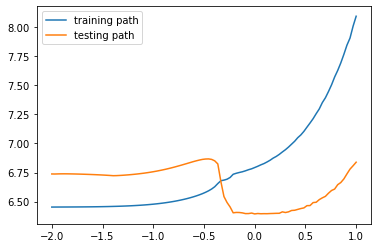

In [10]:
# Change the y-axis to show the actual log10s of the lambdas

plt.plot([x for x in np.linspace(interval_start, interval_end, num=penalty_intervals)],train_path,label='training path')
plt.plot([x for x in np.linspace(interval_start, interval_end, num=penalty_intervals)],test_path,label='testing path')
plt.legend()



In [11]:
min(test_path)

[6.394630944732161]

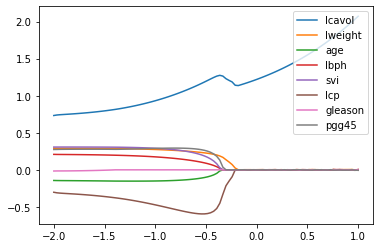

In [12]:
data_labels = ['lcavol','lweight','age','lbph','svi','lcp','gleason','pgg45']

weight_path = np.array(weight_path)
for w in range(weight_path.shape[1]):
    plt.plot([x for x in np.linspace(interval_start, interval_end, num=penalty_intervals)],weight_path[:,w],label = data_labels[w])
plt.legend()



What this path is showing is that lcalvol and lcp axes are pointing towards the origin
and the other ones are squashed away from the the axis


What needs to be tried out is a normalization by the the OLS solution to put the solution right at diagonal